In [1]:
import gym
import Antonio_FlexEnv_OnlyDischarge as flex

import Antonio_auxfunctions_OnlyDischarge as fun

import stable_baselines3

from stable_baselines3 import DQN, A2C
from stable_baselines3.a2c.policies import MlpPolicy

from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.env_checker import check_env

from stable_baselines3 import SAC
from stable_baselines3 import DDPG

from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

from stable_baselines3.ddpg.policies import MlpPolicy


import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy.random as rnd
import time
import random as rnd

from time import perf_counter

# Data and Environment preparation

In [2]:
#Data
cwd=os.getcwd()
datafolder=cwd + '/Data'

#impor the data csv
env_data=pd.read_csv(datafolder + '/env_data.csv', header = None)

#make and check the environment
# Select the number of timesteps to consider
# timesteps=141
timesteps=47

#Create environment. Based on the aux functions code.
env=fun.make_env(env_data, load_num=4, timestep=timesteps, soc_max=2, eta=0.95, charge_lim=3, min_charge_step=0.2)

In [3]:
env.observation_space

Box([   0.    0.    0.    0.    0.    0. -100.    0. -100.], [ 47.  10.  10.   2.   2.   1. 100.   1. 100.], (9,), float32)

In [4]:
env.observation_space.high[3]

2.0

In [5]:
env.action_space

Discrete(16)

# Stable Baselines ALGORITHMS

In [6]:
##DQN
## parameters
gamma=0.99
learning_rate=1e-3
buffer_size=1e6

exploration_fraction=0.01
exploration_final_eps=0.02 
exploration_initial_eps=1.0
train_freq=1
batch_size=32
double_q=True
learning_starts=1000
target_network_update_freq=500

prioritized_replay=False
prioritized_replay_alpha=0.6
prioritized_replay_beta0=0.4
prioritized_replay_beta_iters=None
prioritized_replay_eps=1e-06
param_noise=True
n_cpu_tf_sess=None
verbose=0 
tensorboard_log=None
_init_setup_model=True
policy_kwargs=None
full_tensorboard_log=False
seed=None
# Policy='LnMlpPolicy'

t1_start = perf_counter()

## Train model
model = DQN('MlpPolicy', env, learning_rate=learning_rate, verbose=1,batch_size=batch_size,exploration_fraction=exploration_fraction,)
model.learn(total_timesteps=int(5e6))

t1_stop = perf_counter()
print("\nElapsed time:", t1_stop, t1_start)
print("Elapsed time during the whole program in seconds:", t1_stop-t1_start)

##Proximal Policy Optimization
# model = PPO("MlpPolicy", env, verbose=1)
# model.learn(total_timesteps=4e5)


## Other algorithms
#SAC
# model = SAC('MlpPolicy', env, verbose=2).learn(total_timesteps=1e5)

#A2C
# model = A2C(MlpPolicy, env, verbose=1)
# model.learn(total_timesteps=25000)



Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-52030.399999999994
-52957.19999999999
-51806.4
-48588.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+04 |
|    exploration_rate | 0.996     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 6006      |
|    time_elapsed     | 0         |
|    total_timesteps  | 188       |
-----------------------------------
-53016.00000000001
-53557.59999999999
-54121.799999999996
-51982.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.23e+04 |
|    exploration_rate | 0.993     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 5993      |
|    time_elapsed     | 0         |
|    total_timesteps  | 376       |
---------------

/home/acr/anaconda3/lib/python3.9/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


-49239.2
-51089.399999999994
-52128.0
-56907.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.21e+04 |
|    exploration_rate | 0.975     |
| time/               |           |
|    episodes         | 28        |
|    fps              | 5582      |
|    time_elapsed     | 0         |
|    total_timesteps  | 1316      |
-----------------------------------
-50543.39999999999
-52575.79999999998
-52988.599999999984
-51802.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.21e+04 |
|    exploration_rate | 0.971     |
| time/               |           |
|    episodes         | 32        |
|    fps              | 5551      |
|    time_elapsed     | 0         |
|    total_timesteps  | 1504      |
-----------------------------------
-45685.200000000004
-52948.0
-45411.59999999999
-51906.39999999999
-----------------

-56075.200000000004
-46985.600000000006
-50468.40000000001
-49078.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.911     |
| time/               |           |
|    episodes         | 100       |
|    fps              | 5079      |
|    time_elapsed     | 0         |
|    total_timesteps  | 4700      |
-----------------------------------
-53318.79999999999
-46643.2
-50475.6
-51834.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.907     |
| time/               |           |
|    episodes         | 104       |
|    fps              | 5099      |
|    time_elapsed     | 0         |
|    total_timesteps  | 4888      |
-----------------------------------
-49774.200000000004
-50456.19999999999
-48661.99999999999
-50503.600000000006
----------------

-50073.79999999999
-49685.799999999996
-51727.19999999999
-53335.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+04 |
|    exploration_rate | 0.846     |
| time/               |           |
|    episodes         | 172       |
|    fps              | 4984      |
|    time_elapsed     | 1         |
|    total_timesteps  | 8084      |
-----------------------------------
-54889.99999999999
-51517.79999999999
-53088.39999999999
-56748.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+04 |
|    exploration_rate | 0.843     |
| time/               |           |
|    episodes         | 176       |
|    fps              | 4991      |
|    time_elapsed     | 1         |
|    total_timesteps  | 8272      |
-----------------------------------
-51717.6
-50396.59999999999
-51552.99999999999
-49709.59999999999

-48645.59999999999
-46698.59999999999
-53769.399999999994
-51963.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.14e+04 |
|    exploration_rate | 0.782     |
| time/               |           |
|    episodes         | 244       |
|    fps              | 5051      |
|    time_elapsed     | 2         |
|    total_timesteps  | 11468     |
-----------------------------------
-53039.99999999999
-54967.2
-45291.599999999984
-52292.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.779     |
| time/               |           |
|    episodes         | 248       |
|    fps              | 5061      |
|    time_elapsed     | 2         |
|    total_timesteps  | 11656     |
-----------------------------------
-52012.4
-50160.19999999999
-53579.799999999996
-54914.5999999

-48419.19999999999
-53516.399999999994
-53402.79999999999
-54733.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.718     |
| time/               |           |
|    episodes         | 316       |
|    fps              | 5124      |
|    time_elapsed     | 2         |
|    total_timesteps  | 14852     |
-----------------------------------
-52963.79999999999
-49829.0
-54576.4
-53424.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.714     |
| time/               |           |
|    episodes         | 320       |
|    fps              | 5129      |
|    time_elapsed     | 2         |
|    total_timesteps  | 15040     |
-----------------------------------
-54425.99999999999
-54563.99999999999
-51197.6
-55011.399999999994
------------------

-51855.19999999999
-51236.4
-51572.99999999999
-48795.39999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.654     |
| time/               |           |
|    episodes         | 388       |
|    fps              | 5141      |
|    time_elapsed     | 3         |
|    total_timesteps  | 18236     |
-----------------------------------
-54541.19999999998
-48949.59999999999
-53461.79999999999
-50350.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.65      |
| time/               |           |
|    episodes         | 392       |
|    fps              | 5136      |
|    time_elapsed     | 3         |
|    total_timesteps  | 18424     |
-----------------------------------
-50576.2
-49522.8
-53294.99999999999
-50861.799999999996
---------

-52712.0
-50770.599999999984
-51887.79999999999
-53238.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.12e+04 |
|    exploration_rate | 0.589     |
| time/               |           |
|    episodes         | 460       |
|    fps              | 5127      |
|    time_elapsed     | 4         |
|    total_timesteps  | 21620     |
-----------------------------------
-52004.79999999999
-48872.2
-52935.600000000006
-54105.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+04 |
|    exploration_rate | 0.586     |
| time/               |           |
|    episodes         | 464       |
|    fps              | 5131      |
|    time_elapsed     | 4         |
|    total_timesteps  | 21808     |
-----------------------------------
-50451.4
-47492.59999999999
-55124.799999999996
-51795.0
---------------------------

-49378.6
-55117.8
-51823.19999999999
-51209.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.525     |
| time/               |           |
|    episodes         | 532       |
|    fps              | 5131      |
|    time_elapsed     | 4         |
|    total_timesteps  | 25004     |
-----------------------------------
-56558.0
-51243.6
-51520.0
-50112.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.521     |
| time/               |           |
|    episodes         | 536       |
|    fps              | 5135      |
|    time_elapsed     | 4         |
|    total_timesteps  | 25192     |
-----------------------------------
-51496.0
-52456.79999999999
-50790.6
-53460.19999999998
-----------------------------------
| rollout/   

-55127.799999999996
-47360.19999999999
-51072.19999999999
-48605.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.461     |
| time/               |           |
|    episodes         | 604       |
|    fps              | 5147      |
|    time_elapsed     | 5         |
|    total_timesteps  | 28388     |
-----------------------------------
-53701.6
-50004.600000000006
-53746.399999999994
-53240.79999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.15e+04 |
|    exploration_rate | 0.457     |
| time/               |           |
|    episodes         | 608       |
|    fps              | 5144      |
|    time_elapsed     | 5         |
|    total_timesteps  | 28576     |
-----------------------------------
-51628.0
-50919.39999999999
-53885.79999999999
-49846.19999999999
-------

-56453.6
-49661.59999999999
-50059.799999999996
-52682.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.17e+04 |
|    exploration_rate | 0.396     |
| time/               |           |
|    episodes         | 676       |
|    fps              | 5151      |
|    time_elapsed     | 6         |
|    total_timesteps  | 31772     |
-----------------------------------
-44185.19999999999
-52287.6
-50521.8
-54295.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.17e+04 |
|    exploration_rate | 0.393     |
| time/               |           |
|    episodes         | 680       |
|    fps              | 5147      |
|    time_elapsed     | 6         |
|    total_timesteps  | 31960     |
-----------------------------------
-53476.19999999999
-46584.399999999994
-56457.79999999999
-53690.2
----------------------------

-52825.39999999999
-51999.99999999999
-49555.99999999999
-52419.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.332     |
| time/               |           |
|    episodes         | 748       |
|    fps              | 5171      |
|    time_elapsed     | 6         |
|    total_timesteps  | 35156     |
-----------------------------------
-49592.399999999994
-53492.4
-54169.19999999999
-49270.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.16e+04 |
|    exploration_rate | 0.328     |
| time/               |           |
|    episodes         | 752       |
|    fps              | 5173      |
|    time_elapsed     | 6         |
|    total_timesteps  | 35344     |
-----------------------------------
-53102.59999999999
-53417.19999999999
-53427.0
-51643.79999999998

-53793.99999999999
-51002.2
-51620.999999999985
-50574.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.19e+04 |
|    exploration_rate | 0.268     |
| time/               |           |
|    episodes         | 820       |
|    fps              | 5208      |
|    time_elapsed     | 7         |
|    total_timesteps  | 38540     |
-----------------------------------
-51806.2
-51026.0
-49399.39999999999
-55417.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+04 |
|    exploration_rate | 0.264     |
| time/               |           |
|    episodes         | 824       |
|    fps              | 5210      |
|    time_elapsed     | 7         |
|    total_timesteps  | 38728     |
-----------------------------------
-57000.99999999999
-53593.2
-48843.99999999999
-50169.799999999996
----------------------------

-52689.19999999999
-48551.2
-54793.59999999999
-55204.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+04 |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 892      |
|    fps              | 5216     |
|    time_elapsed     | 8        |
|    total_timesteps  | 41924    |
----------------------------------
-50353.799999999996
-52547.79999999999
-50463.6
-48316.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.19e+04 |
|    exploration_rate | 0.2       |
| time/               |           |
|    episodes         | 896       |
|    fps              | 5217      |
|    time_elapsed     | 8         |
|    total_timesteps  | 42112     |
-----------------------------------
-50727.599999999984
-48807.2
-50321.0
-52975.6
-----------------------------------
| rollout/   

-52166.0
-50617.000000000015
-51115.399999999994
-45232.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.19e+04 |
|    exploration_rate | 0.139     |
| time/               |           |
|    episodes         | 964       |
|    fps              | 5233      |
|    time_elapsed     | 8         |
|    total_timesteps  | 45308     |
-----------------------------------
-53138.99999999999
-56656.19999999999
-50162.60000000001
-53412.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+04 |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 968      |
|    fps              | 5236     |
|    time_elapsed     | 8        |
|    total_timesteps  | 45496    |
----------------------------------
-53555.39999999999
-50111.0
-53767.99999999999
-52113.399999999994
--------

-54842.79999999999
-50144.59999999999
-53724.39999999999
-50229.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+04 |
|    exploration_rate | 0.0749    |
| time/               |           |
|    episodes         | 1036      |
|    fps              | 5250      |
|    time_elapsed     | 9         |
|    total_timesteps  | 48692     |
-----------------------------------
-54781.79999999999
-51462.59999999999
-53459.99999999999
-51654.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+04 |
|    exploration_rate | 0.0713    |
| time/               |           |
|    episodes         | 1040      |
|    fps              | 5251      |
|    time_elapsed     | 9         |
|    total_timesteps  | 48880     |
-----------------------------------
-50202.99999999999
-50698.2
-55476.799999999996
-52781.3

-3536.0000000000005
-718.600000000001
10275.4
10341.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1100      |
|    fps              | 4489      |
|    time_elapsed     | 11        |
|    total_timesteps  | 51700     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 299       |
|    n_updates        | 424       |
-----------------------------------
-10793.199999999997
10289.999999999998
5171.399999999999
6806.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1104      |
|    fps              | 4425      |
|    time_elapsed     | 11      

8295.4
-11917.799999999996
-430.6000000000007
-1782.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1156      |
|    fps              | 3709      |
|    time_elapsed     | 14        |
|    total_timesteps  | 54332     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 175       |
|    n_updates        | 1082      |
-----------------------------------
10341.199999999999
484.5999999999998
2679.3999999999996
1866.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1160      |
|    fps              | 3660      |
|    time_elapsed     | 14     

-1742.2
1224.3999999999999
10341.199999999999
2193.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1212     |
|    fps              | 3199     |
|    time_elapsed     | 17       |
|    total_timesteps  | 56964    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 219      |
|    n_updates        | 1740     |
----------------------------------
6250.199999999997
4286.199999999997
10341.199999999999
-1776.4000000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1216     |
|    fps              | 3168     |
|    time_elapsed     | 18       |
|    total_timesteps

10336.4
5784.799999999996
4909.5999999999985
7873.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1268     |
|    fps              | 2855     |
|    time_elapsed     | 20       |
|    total_timesteps  | 59596    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 462      |
|    n_updates        | 2398     |
----------------------------------
1347.9999999999998
3902.2
6180.999999999996
4197.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1272     |
|    fps              | 2835     |
|    time_elapsed     | 21       |
|    total_timesteps  | 59784    |


-567.8000000000009
681.0
1730.5999999999985
-6163.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1324     |
|    fps              | 2601     |
|    time_elapsed     | 23       |
|    total_timesteps  | 62228    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 165      |
|    n_updates        | 3056     |
----------------------------------
1901.0
941.4000000000005
242.79999999999836
240.59999999999945
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1328     |
|    fps              | 2586     |
|    time_elapsed     | 24       |
|    total_timesteps  | 62416    |

3150.999999999998
2116.199999999999
2477.2000000000007
7226.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -799     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1380     |
|    fps              | 2402     |
|    time_elapsed     | 26       |
|    total_timesteps  | 64860    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 323      |
|    n_updates        | 3714     |
----------------------------------
3716.999999999997
124.40000000000009
115.59999999999945
-7569.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -855     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1384     |
|    fps              | 2391     |
|    time_elapsed     | 27       |
|    total_timesteps  |

3658.799999999997
1731.999999999999
1825.4000000000005
3217.7999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -43.2    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1436     |
|    fps              | 2245     |
|    time_elapsed     | 30       |
|    total_timesteps  | 67492    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 273      |
|    n_updates        | 4372     |
----------------------------------
-14283.799999999996
1940.6
-5265.200000000001
2465.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -103     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1440     |
|    fps              | 2233     |
|    time_elapsed     | 30       |
|    total_timesteps 

-10662.599999999995
-10305.599999999997
-9448.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -296     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1492     |
|    fps              | 2109     |
|    time_elapsed     | 33       |
|    total_timesteps  | 70124    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 333      |
|    n_updates        | 5030     |
----------------------------------
2135.8
-1940.2000000000005
-562.5999999999999
4225.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -387     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1496     |
|    fps              | 2101     |
|    time_elapsed     | 33       |
|    total_timesteps  | 70312    |
| 

3532.0000000000005
-13324.399999999996
-10859.0
3446.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1548      |
|    fps              | 1998      |
|    time_elapsed     | 36        |
|    total_timesteps  | 72756     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 157       |
|    n_updates        | 5688      |
-----------------------------------
10.199999999999697
-10053.199999999999
-87.60000000000139
1260.1999999999962
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1552      |
|    fps              | 1990      |
|    time_elapsed     | 36   

3427.0
-5231.000000000002
3344.6000000000013
1493.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1604      |
|    fps              | 1889      |
|    time_elapsed     | 39        |
|    total_timesteps  | 75388     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 193       |
|    n_updates        | 6346      |
-----------------------------------
-2127.200000000002
3335.3999999999996
-5530.4000000000015
3284.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1608      |
|    fps              | 1879      |
|    time_elapsed     | 40      

-13530.199999999997
-2158.0
-1712.1999999999994
4871.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -828     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1660     |
|    fps              | 1786     |
|    time_elapsed     | 43       |
|    total_timesteps  | 78020    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 277      |
|    n_updates        | 7004     |
----------------------------------
-9320.8
3507.200000000001
-6638.000000000002
2911.9999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1664      |
|    fps              | 1778      |
|    time_elapsed     | 43        |
|    total_timesteps 

-12942.399999999998
1625.5999999999985
4733.6
-9870.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -138     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1716     |
|    fps              | 1695     |
|    time_elapsed     | 47       |
|    total_timesteps  | 80652    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 538      |
|    n_updates        | 7662     |
----------------------------------
-16074.999999999998
1771.0
3758.3999999999983
-830.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -242     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1720     |
|    fps              | 1689     |
|    time_elapsed     | 47       |
|    total_timesteps  | 80840 

-1.8000000000002956
7016.6
-9329.4
-3898.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1772      |
|    fps              | 1626      |
|    time_elapsed     | 51        |
|    total_timesteps  | 83284     |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 147       |
|    n_updates        | 8320      |
-----------------------------------
5573.799999999997
6838.800000000001
-5981.800000000001
-769.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 1776      |
|    fps              | 1622      |
|    time_elapsed     | 51        |
|    total_timestep

-14253.599999999999
-11120.799999999997
2636.7999999999993
3577.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 286      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1828     |
|    fps              | 1561     |
|    time_elapsed     | 55       |
|    total_timesteps  | 85916    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 385      |
|    n_updates        | 8978     |
----------------------------------
-1230.4
2859.1999999999994
6227.399999999998
3893.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 495      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1832     |
|    fps              | 1556     |
|    time_elapsed     | 55       |
|    total_timesteps  | 86104  

-2621.2000000000003
-6277.6
4529.0
-4851.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1888     |
|    fps              | 1501     |
|    time_elapsed     | 59       |
|    total_timesteps  | 88736    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 185      |
|    n_updates        | 9683     |
----------------------------------
-14400.199999999997
-10744.799999999997
7063.199999999999
947.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 827      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1892     |
|    fps              | 1499     |
|    time_elapsed     | 59       |
|    total_timesteps  | 88924 

6928.6
6302.0
2815.3999999999996
943.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 101      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1948     |
|    fps              | 1456     |
|    time_elapsed     | 62       |
|    total_timesteps  | 91556    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 425      |
|    n_updates        | 10388    |
----------------------------------
-12110.599999999995
-3287.2000000000003
4674.799999999999
6302.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 374      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 1952     |
|    fps              | 1452     |
|    time_elapsed     | 63       |
|    total_timesteps  | 91744    |
| train/             

-1685.4000000000005
4065.199999999999
132.60000000000014
895.9999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 589      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2004     |
|    fps              | 1412     |
|    time_elapsed     | 66       |
|    total_timesteps  | 94188    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 248      |
|    n_updates        | 11046    |
----------------------------------
-11396.399999999998
-291.8000000000002
-2200.2
-7370.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 467      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2008     |
|    fps              | 1410     |
|    time_elapsed     | 66       |
|    total_timeste

3704.1999999999975
7306.199999999999
-4549.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 128      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2060     |
|    fps              | 1371     |
|    time_elapsed     | 70       |
|    total_timesteps  | 96820    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 246      |
|    n_updates        | 11704    |
----------------------------------
2440.199999999999
1530.5999999999997
148.80000000000064
4410.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 500      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2064     |
|    fps              | 1368     |
|    time_elapsed     | 70       |
|    total_timesteps  | 97008 

5856.5999999999985
1530.5999999999967
2924.799999999996
4394.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -40.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2116     |
|    fps              | 1337     |
|    time_elapsed     | 74       |
|    total_timesteps  | 99452    |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 221      |
|    n_updates        | 12362    |
----------------------------------
4380.799999999997
5859.199999999997
5879.199999999997
5859.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 122      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2120     |
|    fps              | 1335     |
|    time_elapsed     | 74       |
|    total_tim

6829.599999999997
-5885.8
7149.999999999998
-13049.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2172      |
|    fps              | 1311      |
|    time_elapsed     | 77        |
|    total_timesteps  | 102084    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 163       |
|    n_updates        | 13020     |
-----------------------------------
-12638.2
5400.199999999999
5695.199999999997
6192.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -930     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2176     |
|    fps              | 1309     |
|    time_elapsed     | 78       |
|    total_timesteps  | 10227

374.39999999999964
1309.3999999999978
-10333.199999999999
4636.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2228      |
|    fps              | 1287      |
|    time_elapsed     | 81        |
|    total_timesteps  | 104716    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 293       |
|    n_updates        | 13678     |
-----------------------------------
-1867.6000000000022
1205.7999999999975
5659.999999999996
6248.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2232      |
|    fps              | 1285      |
|    time_elapsed   

5299.0
5909.399999999998
6292.0
4506.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2284      |
|    fps              | 1264      |
|    time_elapsed     | 84        |
|    total_timesteps  | 107348    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 262       |
|    n_updates        | 14336     |
-----------------------------------
5308.399999999998
-5052.0
4603.599999999997
1822.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2288      |
|    fps              | 1262      |
|    time_elapsed     | 85        |
|    total_timesteps  | 107536    

-1780.9999999999977
7195.999999999998
-14609.199999999999
-16589.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2340      |
|    fps              | 1239      |
|    time_elapsed     | 88        |
|    total_timesteps  | 109980    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 649       |
|    n_updates        | 14994     |
-----------------------------------
6922.4
-14176.2
4901.799999999997
-8154.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2344      |
|    fps              | 1238      |
|    time_elapsed     | 88        |
|    total_times

-17629.8
6732.6
6270.399999999998
-16449.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2396      |
|    fps              | 1217      |
|    time_elapsed     | 92        |
|    total_timesteps  | 112612    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 540       |
|    n_updates        | 15652     |
-----------------------------------
-18750.199999999997
-2086.800000000001
-18310.799999999996
4693.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2400      |
|    fps              | 1216      |
|    time_elapsed     | 92        |
|    total_times

-4646.8
2573.9999999999964
4775.999999999998
6272.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2452      |
|    fps              | 1200      |
|    time_elapsed     | 95        |
|    total_timesteps  | 115244    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 696       |
|    n_updates        | 16310     |
-----------------------------------
5162.999999999996
7266.199999999999
-15490.999999999998
4664.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2456      |
|    fps              | 1199      |
|    time_elapsed     | 96        |
|    total_timesteps 

-593.6000000000004
4464.399999999994
-4823.6
-1019.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2508      |
|    fps              | 1185      |
|    time_elapsed     | 99        |
|    total_timesteps  | 117876    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 362       |
|    n_updates        | 16968     |
-----------------------------------
2805.3999999999983
-1718.6000000000013
4617.399999999998
4002.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -850     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2512     |
|    fps              | 1184     |
|    time_elapsed     | 99       |
|    total_times

-11682.0
-20482.000000000007
6242.0
5356.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2564      |
|    fps              | 1173      |
|    time_elapsed     | 102       |
|    total_timesteps  | 120508    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 560       |
|    n_updates        | 17626     |
-----------------------------------
-14672.8
6500.200000000001
-19811.399999999998
-14548.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2568      |
|    fps              | 1173      |
|    time_elapsed     | 102       |
|    total_timesteps  | 12

6960.799999999997
6938.6
-18426.4
-14813.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2620      |
|    fps              | 1166      |
|    time_elapsed     | 105       |
|    total_timesteps  | 123140    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 433       |
|    n_updates        | 18284     |
-----------------------------------
6377.999999999996
-6118.200000000001
-10823.0
-12323.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2624      |
|    fps              | 1165      |
|    time_elapsed     | 105       |
|    total_timesteps  | 123328    |
| 

3008.1999999999994
4742.799999999999
6484.399999999994
-9768.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -895     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2676     |
|    fps              | 1157     |
|    time_elapsed     | 108      |
|    total_timesteps  | 125772   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 417      |
|    n_updates        | 18942    |
----------------------------------
6957.999999999998
1634.3999999999996
880.3999999999996
-11497.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2680      |
|    fps              | 1156      |
|    time_elapsed     | 108       |
|    total_ti

-17939.199999999997
-6867.4
-13407.599999999997
-15383.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2732      |
|    fps              | 1146      |
|    time_elapsed     | 112       |
|    total_timesteps  | 128404    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 342       |
|    n_updates        | 19600     |
-----------------------------------
-13964.4
-9370.6
3403.3999999999983
3483.9999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2736      |
|    fps              | 1145      |
|    time_elapsed     | 112       |
|    total_timesteps  | 

-10531.2
6302.0
-2731.9999999999986
-3404.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2788      |
|    fps              | 1139      |
|    time_elapsed     | 115       |
|    total_timesteps  | 131036    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 720       |
|    n_updates        | 20258     |
-----------------------------------
6413.799999999996
1710.6000000000004
4871.999999999996
1444.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2792      |
|    fps              | 1138      |
|    time_elapsed     | 115       |
|    t

-15424.199999999997
4811.799999999999
6137.999999999996
-11652.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2844     |
|    fps              | 1131     |
|    time_elapsed     | 118      |
|    total_timesteps  | 133668   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 335      |
|    n_updates        | 20916    |
----------------------------------
-12142.8
6891.199999999999
6212.0
-6671.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2848      |
|    fps              | 1130      |
|    time_elapsed     | 118       |
|    total_timesteps  | 133856   

-14737.2
7124.4
-7241.0
964.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2900      |
|    fps              | 1122      |
|    time_elapsed     | 121       |
|    total_timesteps  | 136300    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 197       |
|    n_updates        | 21574     |
-----------------------------------
-10903.0
-8778.600000000002
-13243.2
5709.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 2904      |
|    fps              | 1121      |
|    time_elapsed     | 121       |
|    total_timesteps  | 136488    |
| t

6298.200000000001
-12257.8
7284.999999999998
4756.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -843     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2956     |
|    fps              | 1111     |
|    time_elapsed     | 125      |
|    total_timesteps  | 138932   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 222      |
|    n_updates        | 22232    |
----------------------------------
-4134.4
6384.199999999997
5888.5999999999985
4380.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -921     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 2960     |
|    fps              | 1110     |
|    time_elapsed     | 125      |
|    total_timesteps  | 139120   |

6131.999999999996
1504.9999999999995
-8964.0
6959.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -718     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3012     |
|    fps              | 1105     |
|    time_elapsed     | 128      |
|    total_timesteps  | 141564   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 339      |
|    n_updates        | 22890    |
----------------------------------
6377.799999999999
-13733.199999999999
-10669.199999999999
-10638.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -807     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3016     |
|    fps              | 1104     |
|    time_elapsed     | 128      |
|    total_timestep

-8383.0
-9021.000000000002
-4636.2
5850.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3068      |
|    fps              | 1099      |
|    time_elapsed     | 131       |
|    total_timesteps  | 144196    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 500       |
|    n_updates        | 23548     |
-----------------------------------
-11419.999999999998
6930.4
6244.0
-10146.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3072      |
|    fps              | 1099      |
|    time_elapsed     | 131       |
|    total_timesteps  | 144384    |
| tr

5318.6
-9536.199999999999
6192.799999999999
-8464.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3124      |
|    fps              | 1094      |
|    time_elapsed     | 134       |
|    total_timesteps  | 146828    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 235       |
|    n_updates        | 24206     |
-----------------------------------
-15644.800000000003
-13987.0
6938.6
5469.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3128     |
|    fps              | 1093     |
|    time_elapsed     | 134      |
|    total_timesteps  | 147016   |
| tr

2410.399999999998
4338.799999999997
4532.199999999997
-9197.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 581      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3180     |
|    fps              | 1088     |
|    time_elapsed     | 137      |
|    total_timesteps  | 149460   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 195      |
|    n_updates        | 24864    |
----------------------------------
6941.6
6212.0
5795.199999999997
1079.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 758      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3184     |
|    fps              | 1087     |
|    time_elapsed     | 137      |
|    total_timesteps  | 149648   |
| train/    

-2872.8
3119.399999999998
-4539.4
3698.1999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 938      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3236     |
|    fps              | 1081     |
|    time_elapsed     | 140      |
|    total_timesteps  | 152092   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 384      |
|    n_updates        | 25522    |
----------------------------------
5598.799999999999
-6262.800000000001
-14663.599999999997
6261.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 812      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3240     |
|    fps              | 1081     |
|    time_elapsed     | 140      |
|    total_timesteps  | 152280 

-15366.799999999996
1462.1999999999985
6039.799999999999
6207.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -284     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3292     |
|    fps              | 1075     |
|    time_elapsed     | 143      |
|    total_timesteps  | 154724   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 332      |
|    n_updates        | 26180    |
----------------------------------
5736.4
4763.999999999998
6050.200000000001
-5252.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -37.4    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3296     |
|    fps              | 1075     |
|    time_elapsed     | 144      |
|    total_timesteps  | 154912   

-5018.799999999999
770.0
-1512.4000000000005
4617.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -19.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3348     |
|    fps              | 1070     |
|    time_elapsed     | 147      |
|    total_timesteps  | 157356   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 224      |
|    n_updates        | 26838    |
----------------------------------
6918.6
-198.00000000000273
-9515.0
-2462.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -153     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3352     |
|    fps              | 1069     |
|    time_elapsed     | 147      |
|    total_timesteps  | 157544   |
| train/              |       

-4130.6
-1518.2000000000003
6970.999999999998
5564.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -183     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3404     |
|    fps              | 1064     |
|    time_elapsed     | 150      |
|    total_timesteps  | 159988   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 331      |
|    n_updates        | 27496    |
----------------------------------
-6937.6
5758.200000000001
2911.9999999999986
5966.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -34      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3408     |
|    fps              | 1064     |
|    time_elapsed     | 150      |
|    total_timesteps  | 160176   

-2990.8
741.0
7093.800000000001
-13769.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -101     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3460     |
|    fps              | 1059     |
|    time_elapsed     | 153      |
|    total_timesteps  | 162620   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 677      |
|    n_updates        | 28154    |
----------------------------------
6938.6
1118.399999999996
5608.5999999999985
-14858.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -214     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3464     |
|    fps              | 1059     |
|    time_elapsed     | 153      |
|    total_timesteps  | 162808   |
| train/ 

5860.999999999996
4866.200000000001
-8144.800000000001
-11231.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -612     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3516     |
|    fps              | 1054     |
|    time_elapsed     | 156      |
|    total_timesteps  | 165252   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 143      |
|    n_updates        | 28812    |
----------------------------------
5454.200000000003
4981.0
-15465.599999999999
6231.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -509     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3520     |
|    fps              | 1054     |
|    time_elapsed     | 156      |
|    total_timesteps 

6870.4
6302.0
-5632.000000000002
6222.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -314     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3572     |
|    fps              | 1048     |
|    time_elapsed     | 160      |
|    total_timesteps  | 167884   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 540      |
|    n_updates        | 29470    |
----------------------------------
6302.0
1573.1999999999998
5391.399999999998
-5641.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 24.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3576     |
|    fps              | 1047     |
|    time_elapsed     | 160      |
|    total_timesteps  | 168072   |
| train/              

-6201.200000000001
6184.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -167     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3628     |
|    fps              | 1042     |
|    time_elapsed     | 163      |
|    total_timesteps  | 170516   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 387      |
|    n_updates        | 30128    |
----------------------------------
4747.4
-10733.200000000003
6938.6
-15487.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -189     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3632     |
|    fps              | 1041     |
|    time_elapsed     | 163      |
|    total_timesteps  | 170704   |
| train/              |          |
|    learn

6809.800000000001
-7173.799999999999
-6188.4000000000015
-13787.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3684     |
|    fps              | 1034     |
|    time_elapsed     | 167      |
|    total_timesteps  | 173148   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 395      |
|    n_updates        | 30786    |
----------------------------------
6242.799999999996
-13935.399999999998
5781.600000000004
-6268.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3688      |
|    fps              | 1033      |
|    time_elapsed     | 167       |
|    total

5146.199999999997
-4805.200000000001
-16255.8
-16665.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3740      |
|    fps              | 1027      |
|    time_elapsed     | 171       |
|    total_timesteps  | 175780    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 269       |
|    n_updates        | 31444     |
-----------------------------------
-9682.799999999997
-5439.6
-17805.399999999998
-276.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3744      |
|    fps              | 1027      |
|    time_elapsed     | 171       |
|    total_time

-12009.599999999997
-5475.6
-4602.0
-1651.3999999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 3796      |
|    fps              | 1020      |
|    time_elapsed     | 174       |
|    total_timesteps  | 178412    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 356       |
|    n_updates        | 32102     |
-----------------------------------
6411.399999999998
1421.0
6458.200000000001
-4904.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -732     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3800     |
|    fps              | 1020     |
|    time_elapsed     | 175      |
|    total_timesteps  | 178600   |
| t

6128.5999999999985
-7548.799999999999
-2571.6000000000004
3061.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -655     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3852     |
|    fps              | 1015     |
|    time_elapsed     | 178      |
|    total_timesteps  | 181044   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 965      |
|    n_updates        | 32760    |
----------------------------------
6054.5999999999985
-5731.000000000002
1334.5999999999976
6208.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -482     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3856     |
|    fps              | 1014     |
|    time_elapsed     | 178      |
|    total_timesteps

7256.199999999999
5771.4
5364.799999999997
1519.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -546     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3908     |
|    fps              | 1008     |
|    time_elapsed     | 182      |
|    total_timesteps  | 183676   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 366      |
|    n_updates        | 33418    |
----------------------------------
5608.599999999997
6232.0
-6330.0
5413.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -226     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3912     |
|    fps              | 1008     |
|    time_elapsed     | 182      |
|    total_timesteps  | 183864   |
| train/              | 

5754.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 580      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3964     |
|    fps              | 1003     |
|    time_elapsed     | 185      |
|    total_timesteps  | 186308   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 155      |
|    n_updates        | 34076    |
----------------------------------
-15379.6
6155.399999999998
4480.199999999999
-9690.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 330      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 3968     |
|    fps              | 1003     |
|    time_elapsed     | 185      |
|    total_timesteps  | 186496   |
| train/              |          |
|    lea

6302.0
-9385.4
2948.799999999998
-11315.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -995     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4020     |
|    fps              | 998      |
|    time_elapsed     | 189      |
|    total_timesteps  | 188940   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 299      |
|    n_updates        | 34734    |
----------------------------------
7272.800000000001
3332.5999999999985
-17253.8
-5441.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4024     |
|    fps              | 998      |
|    time_elapsed     | 189      |
|    total_timesteps  | 189128   |
| train

6302.0
1316.5999999999985
4689.599999999995
3608.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4076      |
|    fps              | 993       |
|    time_elapsed     | 192       |
|    total_timesteps  | 191572    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 532       |
|    n_updates        | 35392     |
-----------------------------------
-12680.8
4832.0
-5780.800000000001
4806.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4080      |
|    fps              | 992       |
|    time_elapsed     | 193       |
|    total_timesteps 

-5122.200000000001
-7127.200000000001
6958.199999999999
3253.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4132      |
|    fps              | 988       |
|    time_elapsed     | 196       |
|    total_timesteps  | 194204    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 505       |
|    n_updates        | 36050     |
-----------------------------------
4626.5999999999985
1042.5999999999976
-16690.199999999997
-18642.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4136      |
|    fps              | 988       |
|    time_elapsed  

6908.6
-17121.6
-18718.0
4433.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -408     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4188     |
|    fps              | 984      |
|    time_elapsed     | 200      |
|    total_timesteps  | 196836   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 694      |
|    n_updates        | 36708    |
----------------------------------
6134.999999999996
-5380.200000000001
2142.1999999999985
6156.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 114      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4192     |
|    fps              | 983      |
|    time_elapsed     | 200      |
|    total_timesteps  | 197024   |
| train/

-7213.800000000001
6302.0
4710.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 759      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4244     |
|    fps              | 979      |
|    time_elapsed     | 203      |
|    total_timesteps  | 199468   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 725      |
|    n_updates        | 37366    |
----------------------------------
7041.6
4797.799999999997
-10089.799999999996
-944.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 687      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4248     |
|    fps              | 979      |
|    time_elapsed     | 203      |
|    total_timesteps  | 199656   |
| train/         

4902.199999999997
-16121.599999999999
-17061.6
-1637.8000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -593     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4300     |
|    fps              | 975      |
|    time_elapsed     | 207      |
|    total_timesteps  | 202100   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 646      |
|    n_updates        | 38024    |
----------------------------------
6077.0
-6638.6
-9107.8
2098.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -762     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4304     |
|    fps              | 974      |
|    time_elapsed     | 207      |
|    total_timesteps  | 202288   |
| train/         

-16903.999999999996
4506.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 12.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4356     |
|    fps              | 971      |
|    time_elapsed     | 210      |
|    total_timesteps  | 204732   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 417      |
|    n_updates        | 38682    |
----------------------------------
5667.999999999996
-1160.6000000000008
-7276.5999999999985
110.39999999999918
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 146      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4360     |
|    fps              | 970      |
|    time_elapsed     | 211      |
|    total_timesteps  | 204920   |
| train/             

-4920.4000000000015
5152.5999999999985
3751.599999999999
-12909.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 921      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4412     |
|    fps              | 967      |
|    time_elapsed     | 214      |
|    total_timesteps  | 207364   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 454      |
|    n_updates        | 39340    |
----------------------------------
5992.5999999999985
3372.2000000000007
4743.199999999999
-4346.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4416     |
|    fps              | 967      |
|    time_elapsed     | 214      |
|    total_timesteps  | 207552

-16088.2
-6640.800000000001
6685.799999999997
-13603.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4468     |
|    fps              | 964      |
|    time_elapsed     | 217      |
|    total_timesteps  | 209996   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 703      |
|    n_updates        | 39998    |
----------------------------------
6977.800000000001
6036.799999999999
-6370.000000000002
4536.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4472     |
|    fps              | 963      |
|    time_elapsed     | 218      |
|    total_timesteps 

-7622.199999999999
-1153.4000000000005
-5923.0
-6433.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -437     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4524     |
|    fps              | 962      |
|    time_elapsed     | 221      |
|    total_timesteps  | 212628   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 133      |
|    n_updates        | 40656    |
----------------------------------
5497.799999999996
4801.5999999999985
5041.799999999999
1180.5999999999958
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -442     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4528     |
|    fps              | 962      |
|    time_elapsed     | 221      |
|    total_timesteps

-12359.599999999999
5484.4
4341.6
-7702.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -601     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4580     |
|    fps              | 961      |
|    time_elapsed     | 223      |
|    total_timesteps  | 215260   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 470      |
|    n_updates        | 41314    |
----------------------------------
-15915.8
6896.199999999999
1977.3999999999978
6321.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -746     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4584     |
|    fps              | 960      |
|    time_elapsed     | 224      |
|    total_timesteps  | 215448   |
| train

-13191.0
1679.3999999999987
3356.3999999999974
5448.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -419     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4636     |
|    fps              | 959      |
|    time_elapsed     | 226      |
|    total_timesteps  | 217892   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 168      |
|    n_updates        | 41972    |
----------------------------------
-15372.0
-8930.999999999998
-12008.999999999996
-12608.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4640      |
|    fps              | 959       |
|    time_elapsed     | 227       |
|    total_timeste

-1012.4000000000001
-10112.599999999999
-3037.7999999999997
-17732.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4692      |
|    fps              | 958       |
|    time_elapsed     | 229       |
|    total_timesteps  | 220524    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 598       |
|    n_updates        | 42630     |
-----------------------------------
-8457.8
4304.0
6908.6
5965.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4696      |
|    fps              | 958       |
|    time_elapsed     | 230       |
|    total_timesteps  | 220

6219.4000000000015
3285.9999999999945
3563.1999999999975
6035.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4748      |
|    fps              | 957       |
|    time_elapsed     | 232       |
|    total_timesteps  | 223156    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 378       |
|    n_updates        | 43288     |
-----------------------------------
1331.0
4555.199999999995
-19839.8
-6456.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4752      |
|    fps              | 957       |
|    time_elapsed     | 233       |
|    tot

4929.999999999996
-11134.800000000001
-15258.600000000002
-18764.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -677     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4804     |
|    fps              | 956      |
|    time_elapsed     | 236      |
|    total_timesteps  | 225788   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 494      |
|    n_updates        | 43946    |
----------------------------------
-14301.6
4872.999999999996
5461.5999999999985
-98.3999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -619     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4808     |
|    fps              | 956      |
|    time_elapsed     | 236      |
|    total_timeste

3446.3999999999983
3263.599999999995
6156.599999999995
-10796.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 4860     |
|    fps              | 954      |
|    time_elapsed     | 239      |
|    total_timesteps  | 228420   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 606      |
|    n_updates        | 44604    |
----------------------------------
-10350.0
6440.599999999995
470.59999999999854
4922.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4864      |
|    fps              | 954       |
|    time_elapsed     | 239       |
|    total_timesteps  |

-14431.199999999999
-11210.999999999996
-18155.8
6093.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4916      |
|    fps              | 951       |
|    time_elapsed     | 242       |
|    total_timesteps  | 231052    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 323       |
|    n_updates        | 45262     |
-----------------------------------
1119.3999999999987
6461.399999999998
-7126.200000000001
6526.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4920      |
|    fps              | 951       |
|    time_elapsed     | 242    

2117.2000000000003
1884.2000000000016
-24163.2
5970.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4972      |
|    fps              | 950       |
|    time_elapsed     | 245       |
|    total_timesteps  | 233684    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 574       |
|    n_updates        | 45920     |
-----------------------------------
6283.5999999999985
6137.599999999995
-12172.399999999998
7009.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 4976      |
|    fps              | 950       |
|    time_elapsed     | 246     

3983.9999999999964
-15626.6
5388.000000000002
5959.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -977     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5028     |
|    fps              | 949      |
|    time_elapsed     | 248      |
|    total_timesteps  | 236316   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 935      |
|    n_updates        | 46578    |
----------------------------------
6830.6
6376.799999999999
6748.6
-15851.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5032      |
|    fps              | 949       |
|    time_elapsed     | 249       |
|    total_timesteps  | 236504    |
| train/  

-8171.4
4948.0
-6309.200000000001
-12381.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5084      |
|    fps              | 947       |
|    time_elapsed     | 252       |
|    total_timesteps  | 238948    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 531       |
|    n_updates        | 47236     |
-----------------------------------
1163.999999999999
6966.199999999999
6984.4
-6999.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5088      |
|    fps              | 947       |
|    time_elapsed     | 252       |
|    total_timesteps

7934.200000000003
7293.6
-13140.199999999999
-5777.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -853     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5140     |
|    fps              | 946      |
|    time_elapsed     | 255      |
|    total_timesteps  | 241580   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 643      |
|    n_updates        | 47894    |
----------------------------------
1565.6000000000013
6928.6
3882.000000000002
6745.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -487     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5144     |
|    fps              | 946      |
|    time_elapsed     | 255      |
|    total_timesteps  | 241768   |

3442.1999999999994
-11116.8
-7202.4000000000015
7002.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -352     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5196     |
|    fps              | 945      |
|    time_elapsed     | 258      |
|    total_timesteps  | 244212   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 652      |
|    n_updates        | 48552    |
----------------------------------
-5564.200000000001
6037.599999999995
-11225.800000000001
5157.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -197     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5200     |
|    fps              | 944      |
|    time_elapsed     | 258      |
|    total_timesteps  | 244400

-8613.8
-12872.0
6209.4
1384.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -634     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5252     |
|    fps              | 944      |
|    time_elapsed     | 261      |
|    total_timesteps  | 246844   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 312      |
|    n_updates        | 49210    |
----------------------------------
-16217.999999999998
5317.4
6800.000000000002
-6145.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -538     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5256     |
|    fps              | 944      |
|    time_elapsed     | 261      |
|    total_timesteps  | 247032   |
| train/         

-6286.200000000001
4849.0
1383.1999999999998
4324.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -134     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5308     |
|    fps              | 942      |
|    time_elapsed     | 264      |
|    total_timesteps  | 249476   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 757      |
|    n_updates        | 49868    |
----------------------------------
-5057.000000000002
6208.399999999998
6421.399999999998
4773.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -62.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5312     |
|    fps              | 942      |
|    time_elapsed     | 264      |
|    total_timesteps  | 249664   |

-10551.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -304     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5364     |
|    fps              | 941      |
|    time_elapsed     | 267      |
|    total_timesteps  | 252108   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 348      |
|    n_updates        | 50526    |
----------------------------------
6324.199999999997
-15968.399999999998
6397.200000000003
-15519.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -529     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5368     |
|    fps              | 941      |
|    time_elapsed     | 267      |
|    total_timesteps  | 252296   |
| train/              |          |
|    learning_ra

180.40000000000055
2870.1999999999994
-3701.0000000000005
-12935.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5420     |
|    fps              | 940      |
|    time_elapsed     | 270      |
|    total_timesteps  | 254740   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 901      |
|    n_updates        | 51184    |
----------------------------------
5101.200000000001
-13254.399999999998
-11365.599999999999
5876.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5424      |
|    fps              | 940       |
|    time_elapsed     | 271      

-9170.000000000002
-13289.2
-14198.599999999999
4307.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5476      |
|    fps              | 939       |
|    time_elapsed     | 273       |
|    total_timesteps  | 257372    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 466       |
|    n_updates        | 51842     |
-----------------------------------
7285.000000000002
-9735.2
5124.199999999999
6847.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5480      |
|    fps              | 939       |
|    time_elapsed     | 274       |
|    tot

11278.400000000003
-7290.799999999999
-8528.4
-17024.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5532      |
|    fps              | 938       |
|    time_elapsed     | 276       |
|    total_timesteps  | 260004    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 460       |
|    n_updates        | 52500     |
-----------------------------------
8386.199999999999
8001.799999999999
-9957.399999999998
6770.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5536      |
|    fps              | 938       |
|    time_elapsed     | 277       |
|    tot

8417.200000000003
-4947.200000000001
-5914.800000000001
-13438.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -144     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5588     |
|    fps              | 935      |
|    time_elapsed     | 280      |
|    total_timesteps  | 262636   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 123      |
|    n_updates        | 53158    |
----------------------------------
1947.3999999999987
7775.999999999998
5512.200000000001
5505.199999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 98.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5592     |
|    fps              | 935      |
|    time_elapsed     | 280      |
|    total_timesteps  

5106.6
8125.199999999999
6753.999999999998
-5698.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -730     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5644     |
|    fps              | 933      |
|    time_elapsed     | 284      |
|    total_timesteps  | 265268   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 314      |
|    n_updates        | 53816    |
----------------------------------
3504.1999999999994
-8012.6
4367.0
-16503.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -648     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5648     |
|    fps              | 933      |
|    time_elapsed     | 284      |
|    total_timesteps  | 265456   |
| train/            

8412.000000000002
8272.999999999998
8071.0
6179.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -743     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5700     |
|    fps              | 930      |
|    time_elapsed     | 287      |
|    total_timesteps  | 267900   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 781      |
|    n_updates        | 54474    |
----------------------------------
-1412.2000000000003
4343.799999999997
6877.999999999998
4745.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -862     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5704     |
|    fps              | 930      |
|    time_elapsed     | 288      |
|    total_timesteps  | 

-9175.4
6118.5999999999985
4871.200000000001
-15489.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 841      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5756     |
|    fps              | 928      |
|    time_elapsed     | 291      |
|    total_timesteps  | 270532   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 902      |
|    n_updates        | 55132    |
----------------------------------
7813.6
-20376.4
-13614.6
-9182.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 329      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5760     |
|    fps              | 927      |
|    time_elapsed     | 291      |
|    total_timesteps  | 270720   |
| train/              |          |
|  

6402.799999999996
-9908.599999999999
-14418.199999999997
-2362.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -494     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5812     |
|    fps              | 924      |
|    time_elapsed     | 295      |
|    total_timesteps  | 273164   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 703      |
|    n_updates        | 55790    |
----------------------------------
-14905.199999999999
-8420.4
-5127.200000000001
8201.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -786     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5816     |
|    fps              | 924      |
|    time_elapsed     | 295      |
|    total_timeste

6198.5999999999985
6364.200000000003
-9294.2
-16876.199999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -688     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5868     |
|    fps              | 921      |
|    time_elapsed     | 299      |
|    total_timesteps  | 275796   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 774      |
|    n_updates        | 56448    |
----------------------------------
4844.799999999999
4812.999999999996
11210.4
-15069.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -464     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5872     |
|    fps              | 921      |
|    time_elapsed     | 299      |
|    total_timesteps  | 275984   |
| train

4337.4
6044.999999999996
4752.799999999997
4485.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -749     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 5924     |
|    fps              | 918      |
|    time_elapsed     | 303      |
|    total_timesteps  | 278428   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 899      |
|    n_updates        | 57106    |
----------------------------------
-17714.799999999996
11250.6
-15766.399999999998
-8607.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5928      |
|    fps              | 918       |
|    time_elapsed     | 303       |
|    total_timesteps  |

-4863.0
5865.399999999998
-17212.399999999994
1098.5999999999976
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5980      |
|    fps              | 916       |
|    time_elapsed     | 306       |
|    total_timesteps  | 281060    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 810       |
|    n_updates        | 57764     |
-----------------------------------
10853.800000000001
6315.600000000004
-15307.8
-11229.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 5984      |
|    fps              | 916       |
|    time_elapsed     | 306       |
|    

-935.9999999999991
-1818.8000000000006
5881.199999999997
10590.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6036     |
|    fps              | 914      |
|    time_elapsed     | 310      |
|    total_timesteps  | 283692   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 649      |
|    n_updates        | 58422    |
----------------------------------
-18831.199999999997
-1665.8000000000002
6189.999999999998
7588.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 6040      |
|    fps              | 913       |
|    time_elapsed     | 310       

6952.199999999998
-13052.199999999997
4435.799999999996
3807.9999999999964
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 427      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6092     |
|    fps              | 911      |
|    time_elapsed     | 313      |
|    total_timesteps  | 286324   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 449      |
|    n_updates        | 59080    |
----------------------------------
-16689.0
4925.999999999996
-11447.4
7184.599999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 493      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6096     |
|    fps              | 911      |
|    time_elapsed     | 314      |
|    total_timesteps  | 286512 

-609.8000000000001
3389.2000000000007
-16707.999999999996
8538.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 514      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6148     |
|    fps              | 910      |
|    time_elapsed     | 317      |
|    total_timesteps  | 288956   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 703      |
|    n_updates        | 59738    |
----------------------------------
11234.999999999998
6601.6
6417.799999999996
-5425.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 666      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6152     |
|    fps              | 909      |
|    time_elapsed     | 317      |
|    total_timesteps 

6480.999999999996
-7410.599999999999
3040.4
11070.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 400      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6204     |
|    fps              | 907      |
|    time_elapsed     | 321      |
|    total_timesteps  | 291588   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 589      |
|    n_updates        | 60396    |
----------------------------------
5258.799999999999
-15246.599999999997
6566.999999999996
-2011.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 437      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6208     |
|    fps              | 907      |
|    time_elapsed     | 321      |
|    total_timesteps  | 291776   |
| train/ 

-11075.2
6814.999999999998
-8812.2
2397.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 346      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6260     |
|    fps              | 905      |
|    time_elapsed     | 324      |
|    total_timesteps  | 294220   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 61054    |
----------------------------------
6243.4
6019.199999999997
-1441.4000000000005
11216.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 477      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6264     |
|    fps              | 905      |
|    time_elapsed     | 325      |
|    total_timesteps  | 294408   |
| train

6207.199999999997
-3999.5999999999995
6960.799999999997
7239.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6316     |
|    fps              | 903      |
|    time_elapsed     | 328      |
|    total_timesteps  | 296852   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 497      |
|    n_updates        | 61712    |
----------------------------------
5068.200000000001
9402.600000000004
4393.599999999995
8595.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6320     |
|    fps              | 903      |
|    time_elapsed     | 328      |
|    total_timesteps  | 2

6544.999999999996
-9371.999999999998
5081.199999999997
-2161.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6372     |
|    fps              | 901      |
|    time_elapsed     | 332      |
|    total_timesteps  | 299484   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 933      |
|    n_updates        | 62370    |
----------------------------------
-4721.200000000001
6449.2
11404.800000000001
10989.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6376     |
|    fps              | 900      |
|    time_elapsed     | 332      |
|    total_timesteps 

11071.199999999999
3663.3999999999983
-6569.4
-6619.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6428     |
|    fps              | 899      |
|    time_elapsed     | 335      |
|    total_timesteps  | 302116   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 613      |
|    n_updates        | 63028    |
----------------------------------
-7826.199999999999
6447.199999999997
-8257.599999999999
3009.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6432     |
|    fps              | 899      |
|    time_elapsed     | 336      |
|    total_timesteps

-4480.399999999999
1108.2000000000003
3186.399999999998
-2314.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6484     |
|    fps              | 898      |
|    time_elapsed     | 339      |
|    total_timesteps  | 304748   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 63686    |
----------------------------------
8339.999999999998
3693.0000000000005
6899.800000000001
6612.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6488     |
|    fps              | 897      |
|    time_elapsed     | 339      |
|    total_timesteps  

5415.4
-2392.600000000001
5197.0
-5417.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6540     |
|    fps              | 897      |
|    time_elapsed     | 342      |
|    total_timesteps  | 307380   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 710      |
|    n_updates        | 64344    |
----------------------------------
2367.7999999999993
6719.800000000001
-18634.799999999996
7268.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6544     |
|    fps              | 897      |
|    time_elapsed     | 342      |
|    total_timesteps  | 307568   |
| train/            

10945.199999999999
6057.999999999996
-11043.000000000002
11018.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6596     |
|    fps              | 896      |
|    time_elapsed     | 345      |
|    total_timesteps  | 310012   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 65002    |
----------------------------------
11016.4
3117.199999999999
-5446.000000000002
-4655.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6600     |
|    fps              | 896      |
|    time_elapsed     | 346      |
|    total_timesteps

7811.799999999997
3778.199999999999
-1169.8000000000002
8586.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6652     |
|    fps              | 896      |
|    time_elapsed     | 348      |
|    total_timesteps  | 312644   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 65660    |
----------------------------------
6406.399999999998
5988.999999999996
6626.000000000002
5007.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6656     |
|    fps              | 896      |
|    time_elapsed     | 349      |
|    total_tim

-4599.399999999999
7489.999999999998
4582.399999999998
-19300.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6708     |
|    fps              | 895      |
|    time_elapsed     | 351      |
|    total_timesteps  | 315276   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 461      |
|    n_updates        | 66318    |
----------------------------------
-458.99999999999955
10935.199999999999
-13372.199999999999
11190.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6712     |
|    fps              | 895      |
|    time_elapsed     | 352      |
|    total_timesteps  | 31546

10995.199999999999
10965.199999999999
-1593.4
-15745.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6764     |
|    fps              | 895      |
|    time_elapsed     | 355      |
|    total_timesteps  | 317908   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 762      |
|    n_updates        | 66976    |
----------------------------------
9363.6
11286.800000000001
-707.8000000000009
-4395.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6768     |
|    fps              | 895      |
|    time_elapsed     | 355      |
|    total_timesteps  | 318096   |
| trai

-4312.799999999998
3969.7999999999993
10940.6
11296.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6820     |
|    fps              | 894      |
|    time_elapsed     | 358      |
|    total_timesteps  | 320540   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 501      |
|    n_updates        | 67634    |
----------------------------------
-4435.6
7260.6
-10855.399999999998
5209.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6824     |
|    fps              | 894      |
|    time_elapsed     | 358      |
|    total_timesteps  | 320728   |
| train

-8396.000000000002
11067.200000000003
7384.599999999997
-19320.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -128     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6876     |
|    fps              | 894      |
|    time_elapsed     | 361      |
|    total_timesteps  | 323172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 947      |
|    n_updates        | 68292    |
----------------------------------
8705.199999999999
-17017.999999999996
11202.000000000002
7181.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -32.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6880     |
|    fps              | 894      |
|    time_elapsed     | 361      |
|    total_timesteps

4529.4
11180.6
4998.200000000002
4751.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -487     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6932     |
|    fps              | 892      |
|    time_elapsed     | 364      |
|    total_timesteps  | 325804   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 327      |
|    n_updates        | 68950    |
----------------------------------
-898.400000000001
-14404.0
6784.199999999999
-16251.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -675     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6936     |
|    fps              | 892      |
|    time_elapsed     | 365      |
|    total_timesteps  | 325992   |
| train/ 

7891.599999999999
6478.399999999998
-7708.599999999999
9494.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -573     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 892      |
|    time_elapsed     | 367      |
|    total_timesteps  | 328436   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 149      |
|    n_updates        | 69608    |
----------------------------------
11238.4
9406.999999999998
-2309.0000000000005
-10748.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -407     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 6992     |
|    fps              | 892      |
|    time_elapsed     | 368      |
|    total_timesteps  | 328624  

-18932.8
11283.6
9595.6
4974.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 337      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7044     |
|    fps              | 892      |
|    time_elapsed     | 371      |
|    total_timesteps  | 331068   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.39e+03 |
|    n_updates        | 70266    |
----------------------------------
4566.999999999998
7239.800000000001
6063.399999999998
-20293.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 329      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7048     |
|    fps              | 892      |
|    time_elapsed     | 371      |
|    total_timesteps  | 331256   |
| train/ 

11200.6
5028.799999999999
-3949.9999999999995
6502.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7100     |
|    fps              | 891      |
|    time_elapsed     | 374      |
|    total_timesteps  | 333700   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 814      |
|    n_updates        | 70924    |
----------------------------------
7244.6
11208.000000000002
8641.200000000003
6649.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7104     |
|    fps              | 891      |
|    time_elapsed     | 374      |
|    total_timesteps  | 333888   |
| train/  

7163.4
-5566.999999999999
-1482.4
-6414.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7156     |
|    fps              | 891      |
|    time_elapsed     | 377      |
|    total_timesteps  | 336332   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 190      |
|    n_updates        | 71582    |
----------------------------------
5413.800000000001
10996.199999999999
6691.800000000001
-9021.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7160     |
|    fps              | 891      |
|    time_elapsed     | 377      |
|    total_timesteps  | 336520   |
| train/ 

10709.199999999999
11028.000000000002
10798.4
10745.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 692      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7212     |
|    fps              | 890      |
|    time_elapsed     | 380      |
|    total_timesteps  | 338964   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 72240    |
----------------------------------
11216.6
5770.400000000001
4770.599999999997
4677.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 739      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7216     |
|    fps              | 890      |
|    time_elapsed     | 380      |
|    total_timesteps  | 339152   |
| train/ 

11299.800000000001
1671.5999999999992
-5489.2
5372.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 237      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7268     |
|    fps              | 889      |
|    time_elapsed     | 383      |
|    total_timesteps  | 341596   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 346      |
|    n_updates        | 72898    |
----------------------------------
6480.399999999998
-6350.8
8270.799999999997
-7655.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 478      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7272     |
|    fps              | 889      |
|    time_elapsed     | 384      |
|    total_timesteps  | 341784   |
| train/            

-6076.599999999998
1939.0000000000023
-8268.000000000002
11093.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7324     |
|    fps              | 888      |
|    time_elapsed     | 387      |
|    total_timesteps  | 344228   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 714      |
|    n_updates        | 73556    |
----------------------------------
-3734.8000000000006
-48.80000000000019
5019.399999999998
-3412.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 993      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7328     |
|    fps              | 888      |
|    time_elapsed     | 387      |
|    to

2055.6000000000004
-3351.000000000001
7064.199999999999
-8592.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7380     |
|    fps              | 886      |
|    time_elapsed     | 391      |
|    total_timesteps  | 346860   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 574      |
|    n_updates        | 74214    |
----------------------------------
6418.200000000001
-133.00000000000037
5576.0
-10589.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7384     |
|    fps              | 886      |
|    time_elapsed     | 391      |
|    total_timesteps  | 347048   |
| train

5656.599999999995
-8307.000000000002
9475.000000000002
5764.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7436     |
|    fps              | 885      |
|    time_elapsed     | 394      |
|    total_timesteps  | 349492   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 74872    |
----------------------------------
-2909.0
6158.999999999999
-5750.599999999998
-9128.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7440     |
|    fps              | 885      |
|    time_elapsed     | 395      |
|    total_timesteps  | 349680   |

11147.800000000001
-19361.2
11300.4
-5484.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 462      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7492     |
|    fps              | 883      |
|    time_elapsed     | 398      |
|    total_timesteps  | 352124   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.31e+03 |
|    n_updates        | 75530    |
----------------------------------
-762.2000000000005
3683.7999999999993
7566.199999999999
8157.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 398      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7496     |
|    fps              | 883      |
|    time_elapsed     | 398      |
|    total_timesteps  | 352312 

10916.199999999999
-6088.599999999999
4551.599999999997
11134.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -771     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7548     |
|    fps              | 881      |
|    time_elapsed     | 402      |
|    total_timesteps  | 354756   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 933      |
|    n_updates        | 76188    |
----------------------------------
5050.199999999997
6374.999999999996
-6152.599999999999
-15802.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -959     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7552     |
|    fps              | 881      |
|    time_elapsed     | 402      |
|    total_timesteps 

11182.800000000001
-5208.4000000000015
-10588.199999999999
4953.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -542     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7604     |
|    fps              | 880      |
|    time_elapsed     | 405      |
|    total_timesteps  | 357388   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 842      |
|    n_updates        | 76846    |
----------------------------------
7293.799999999997
9050.6
-6086.799999999998
-6531.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -256     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7608     |
|    fps              | 880      |
|    time_elapsed     | 406      |
|    total_timesteps

-10465.6
-12053.4
11112.000000000002
6572.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -798     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7660     |
|    fps              | 879      |
|    time_elapsed     | 409      |
|    total_timesteps  | 360020   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 908      |
|    n_updates        | 77504    |
----------------------------------
3315.3999999999987
9454.6
6742.4
-7623.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -763     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7664     |
|    fps              | 879      |
|    time_elapsed     | 409      |
|    total_timesteps  | 360208   |
| train/              |      

10915.4
5190.400000000001
6517.799999999996
3336.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 467      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7716     |
|    fps              | 877      |
|    time_elapsed     | 413      |
|    total_timesteps  | 362652   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 78162    |
----------------------------------
7391.999999999998
11028.4
-2492.6000000000013
-3101.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 527      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7720     |
|    fps              | 877      |
|    time_elapsed     | 413      |
|    total_timesteps  | 362840   |
| train/            

7092.399999999999
6396.999999999996
10666.199999999999
-2063.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7772     |
|    fps              | 875      |
|    time_elapsed     | 417      |
|    total_timesteps  | 365284   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 530      |
|    n_updates        | 78820    |
----------------------------------
-5566.4000000000015
10555.4
2095.6000000000013
11003.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7776     |
|    fps              | 875      |
|    time_elapsed     | 417      |
|    total_timesteps  | 365472   |
| train

11252.000000000002
11222.000000000002
-3390.5999999999995
3637.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7828     |
|    fps              | 874      |
|    time_elapsed     | 420      |
|    total_timesteps  | 367916   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 443      |
|    n_updates        | 79478    |
----------------------------------
10090.999999999998
4849.199999999997
1359.1999999999996
10092.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7832     |
|    fps              | 874      |
|    time_elapsed     | 421      |
|    total_timesteps

4952.199999999999
-7607.799999999999
-12496.199999999997
-7480.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7888     |
|    fps              | 872      |
|    time_elapsed     | 424      |
|    total_timesteps  | 370736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 380      |
|    n_updates        | 80183    |
----------------------------------
6369.399999999998
-10943.599999999999
11177.199999999999
-9627.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7892     |
|    fps              | 872      |
|    time_elapsed     | 425      |
|    total_timestep

-6417.799999999998
2286.5999999999995
-1831.4000000000005
6407.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7944     |
|    fps              | 871      |
|    time_elapsed     | 428      |
|    total_timesteps  | 373368   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 924      |
|    n_updates        | 80841    |
----------------------------------
7743.199999999999
-7651.599999999997
11164.999999999998
11332.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 7948     |
|    fps              | 871      |
|    time_elapsed     | 428      |
|    tota

4759.399999999998
5180.800000000001
-1310.000000000001
3387.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8000     |
|    fps              | 869      |
|    time_elapsed     | 432      |
|    total_timesteps  | 376000   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 640      |
|    n_updates        | 81499    |
----------------------------------
11322.000000000002
5998.5999999999985
-6034.599999999998
-3009.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.31e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8004     |
|    fps              | 869      |
|    time_elapsed     | 432      |
|    total

-11278.999999999996
6469.399999999998
9396.4
-5969.7999999999965
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8056     |
|    fps              | 868      |
|    time_elapsed     | 436      |
|    total_timesteps  | 378632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 82157    |
----------------------------------
-6744.8
-6861.200000000001
7393.799999999997
3060.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8060     |
|    fps              | 868      |
|    time_elapsed     | 436      |
|    total_timesteps  | 378820  

11192.200000000003
-654.4000000000008
4025.1999999999953
7821.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8112     |
|    fps              | 867      |
|    time_elapsed     | 439      |
|    total_timesteps  | 381264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 82815    |
----------------------------------
-7795.600000000001
5099.0
-4915.999999999997
10813.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8116     |
|    fps              | 867      |
|    time_elapsed     | 439      |
|    total_timesteps 

-9279.0
6251.5999999999985
7130.6
-7089.199999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8168     |
|    fps              | 866      |
|    time_elapsed     | 443      |
|    total_timesteps  | 383896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 579      |
|    n_updates        | 83473    |
----------------------------------
8963.000000000002
3509.599999999998
11148.199999999999
-3325.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8172     |
|    fps              | 866      |
|    time_elapsed     | 443      |
|    total_timesteps  | 384084  

9310.4
6121.6
254.39999999999986
-3148.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8224     |
|    fps              | 864      |
|    time_elapsed     | 447      |
|    total_timesteps  | 386528   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 698      |
|    n_updates        | 84131    |
----------------------------------
-4677.200000000002
-5279.7999999999965
7724.999999999998
526.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8228     |
|    fps              | 864      |
|    time_elapsed     | 447      |
|    total_timesteps  | 386716  

1239.0
6252.800000000001
5861.799999999996
2286.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8280     |
|    fps              | 862      |
|    time_elapsed     | 451      |
|    total_timesteps  | 389160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 535      |
|    n_updates        | 84789    |
----------------------------------
-3694.2000000000007
1905.5999999999985
3142.0
-9372.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8284     |
|    fps              | 862      |
|    time_elapsed     | 451      |
|    total_timesteps  | 389348   |
| train/ 

8026.6
-4139.199999999999
-8176.4
8142.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8336     |
|    fps              | 859      |
|    time_elapsed     | 455      |
|    total_timesteps  | 391792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 772      |
|    n_updates        | 85447    |
----------------------------------
8663.6
10905.200000000003
6924.199999999999
-9680.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8340     |
|    fps              | 859      |
|    time_elapsed     | 456      |
|    total_timesteps  | 391980   |
| train/  

-4635.0
-3564.4000000000015
6404.400000000001
5742.199999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8392     |
|    fps              | 856      |
|    time_elapsed     | 460      |
|    total_timesteps  | 394424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 534      |
|    n_updates        | 86105    |
----------------------------------
10871.4
11176.6
11178.4
7028.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8396     |
|    fps              | 856      |
|    time_elapsed     | 460      |
|    total_timesteps  | 394612   |
| train/           

10923.4
5232.999999999998
11285.800000000001
11042.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8448     |
|    fps              | 851      |
|    time_elapsed     | 466      |
|    total_timesteps  | 397056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 86763    |
----------------------------------
-4989.4000000000015
11252.000000000002
-3363.8
6410.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 5.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8452     |
|    fps              | 850      |
|    time_elapsed     | 466      |
|    total_timesteps  | 397244 

-6003.799999999998
6898.199999999999
325.5999999999997
10973.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8504     |
|    fps              | 842      |
|    time_elapsed     | 474      |
|    total_timesteps  | 399688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 601      |
|    n_updates        | 87421    |
----------------------------------
9305.6
5638.800000000001
-6328.599999999996
11197.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8508     |
|    fps              | 841      |
|    time_elapsed     | 475      |
|    total_timesteps  | 399876   |

898.3999999999999
11051.199999999999
-2457.4000000000005
8461.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8560     |
|    fps              | 831      |
|    time_elapsed     | 483      |
|    total_timesteps  | 402320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 796      |
|    n_updates        | 88079    |
----------------------------------
10746.6
10764.6
-601.6
6814.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.98e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8564     |
|    fps              | 831      |
|    time_elapsed     | 484      |
|    total_timesteps  | 402508   |
| train/              |        

10330.199999999999
900.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8616     |
|    fps              | 823      |
|    time_elapsed     | 491      |
|    total_timesteps  | 404952   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.24e+03 |
|    n_updates        | 88737    |
----------------------------------
-5816.199999999998
1415.4
10743.4
10764.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8620     |
|    fps              | 822      |
|    time_elapsed     | 492      |
|    total_timesteps  | 405140   |
| train/              |          |


-6257.800000000001
-5321.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8672     |
|    fps              | 815      |
|    time_elapsed     | 499      |
|    total_timesteps  | 407584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 757      |
|    n_updates        | 89395    |
----------------------------------
-2943.0000000000005
10730.4
6709.4
10634.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8676     |
|    fps              | 815      |
|    time_elapsed     | 500      |
|    total_timesteps  | 407772   |
| train/              |          

10619.999999999998
-1220.2
10939.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8728     |
|    fps              | 809      |
|    time_elapsed     | 506      |
|    total_timesteps  | 410216   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 338      |
|    n_updates        | 90053    |
----------------------------------
-3207.800000000001
-5067.199999999998
10795.800000000001
11140.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8732     |
|    fps              | 809      |
|    time_elapsed     | 506      |
|    total_timesteps  | 410404   |
| t

7736.4000000000015
11070.800000000001
-5470.0
11003.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8784     |
|    fps              | 806      |
|    time_elapsed     | 511      |
|    total_timesteps  | 412848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 90711    |
----------------------------------
-6235.0
-5399.800000000001
10846.4
10828.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8788     |
|    fps              | 806      |
|    time_elapsed     | 512      |
|    total_timesteps  | 413036   |
| trai

-242.8000000000004
-2829.0
6813.999999999999
11202.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8840     |
|    fps              | 801      |
|    time_elapsed     | 518      |
|    total_timesteps  | 415480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 457      |
|    n_updates        | 91369    |
----------------------------------
11170.6
-5200.200000000001
7244.199999999998
6246.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8844     |
|    fps              | 800      |
|    time_elapsed     | 519      |
|    total_timesteps  | 415668   |
| train/ 

10966.000000000002
11048.000000000002
4118.0
7452.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8896     |
|    fps              | 796      |
|    time_elapsed     | 525      |
|    total_timesteps  | 418112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.29e+03 |
|    n_updates        | 92027    |
----------------------------------
11049.800000000001
8785.800000000003
11230.6
7382.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8900     |
|    fps              | 795      |
|    time_elapsed     | 525      |
|    total_timesteps  | 418300   |
| train/ 

-3134.800000000001
11134.999999999998
-7118.799999999998
-7676.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8952     |
|    fps              | 789      |
|    time_elapsed     | 533      |
|    total_timesteps  | 420744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 297      |
|    n_updates        | 92685    |
----------------------------------
-6898.800000000001
6388.200000000002
4279.199999999997
-11627.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 8956     |
|    fps              | 788      |
|    time_elapsed     | 533      |
|    total_timesteps

8278.6
6038.999999999996
6889.599999999999
5276.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9008     |
|    fps              | 781      |
|    time_elapsed     | 541      |
|    total_timesteps  | 423376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.2e+03  |
|    n_updates        | 93343    |
----------------------------------
11042.800000000001
11216.199999999999
5299.399999999999
-4928.199999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9012     |
|    fps              | 780      |
|    time_elapsed     | 542      |
|    total_timesteps  | 

209.60000000000005
-8540.6
9176.200000000003
11186.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9064     |
|    fps              | 772      |
|    time_elapsed     | 551      |
|    total_timesteps  | 426008   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 788      |
|    n_updates        | 94001    |
----------------------------------
5601.199999999998
-3765.000000000001
1566.4000000000005
-1200.6000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9068     |
|    fps              | 772      |
|    time_elapsed     | 552      |
|    total_timesteps

10660.999999999998
-8401.800000000001
-5923.0
4668.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9120     |
|    fps              | 765      |
|    time_elapsed     | 560      |
|    total_timesteps  | 428640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 523      |
|    n_updates        | 94659    |
----------------------------------
6654.999999999998
-2339.4000000000005
11122.000000000002
-2258.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9124     |
|    fps              | 764      |
|    time_elapsed     | 560      |
|    total_timestep

11286.199999999999
-6900.800000000001
-20058.40000000001
6374.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9176     |
|    fps              | 760      |
|    time_elapsed     | 567      |
|    total_timesteps  | 431272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 95317    |
----------------------------------
9326.000000000002
-1274.8000000000004
10775.999999999998
10995.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9180     |
|    fps              | 760      |
|    time_elapsed     | 567      |
|    total_timesteps

6496.599999999995
-124.60000000000008
9486.000000000002
-8862.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9232     |
|    fps              | 758      |
|    time_elapsed     | 572      |
|    total_timesteps  | 433904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 702      |
|    n_updates        | 95975    |
----------------------------------
-3502.8000000000006
8292.800000000001
1410.3999999999999
6512.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9236     |
|    fps              | 758      |
|    time_elapsed     | 572      |
|    total_timesteps 

6126.4
-5669.200000000001
2600.199999999999
-1429.6000000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9288     |
|    fps              | 755      |
|    time_elapsed     | 578      |
|    total_timesteps  | 436536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 96633    |
----------------------------------
-1359.000000000001
-12210.199999999999
10948.4
10966.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9292     |
|    fps              | 754      |
|    time_elapsed     | 578      |
|    total_timesteps  | 436724   |
| trai

-2933.2
-3553.6
11048.6
11030.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9344     |
|    fps              | 748      |
|    time_elapsed     | 586      |
|    total_timesteps  | 439168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 97291    |
----------------------------------
1009.1999999999989
6267.199999999997
8175.5999999999985
2347.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9348     |
|    fps              | 748      |
|    time_elapsed     | 587      |
|    total_timesteps  | 439356   |
| train

7024.6
7342.000000000002
11202.000000000002
4254.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9400     |
|    fps              | 742      |
|    time_elapsed     | 595      |
|    total_timesteps  | 441800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 502      |
|    n_updates        | 97949    |
----------------------------------
-9566.399999999998
10989.000000000002
7501.400000000003
233.19999999999845
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9404     |
|    fps              | 741      |
|    time_elapsed     | 595      |
|    total_timesteps  |

11226.199999999999
4679.599999999999
4798.199999999999
-2797.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9456     |
|    fps              | 736      |
|    time_elapsed     | 603      |
|    total_timesteps  | 444432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 402      |
|    n_updates        | 98607    |
----------------------------------
11090.4
11303.200000000003
11101.199999999999
10513.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9460     |
|    fps              | 736      |
|    time_elapsed     | 604      |
|    total_timesteps  | 444620 

10886.199999999999
10712.4
10790.800000000001
11166.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9512     |
|    fps              | 731      |
|    time_elapsed     | 611      |
|    total_timesteps  | 447064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 745      |
|    n_updates        | 99265    |
----------------------------------
11041.4
-5224.200000000001
1687.8
9426.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9516     |
|    fps              | 731      |
|    time_elapsed     | 611      |
|    total_timesteps  | 447252   |
| train/

11149.6
5336.599999999999
7140.199999999999
8474.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9568     |
|    fps              | 727      |
|    time_elapsed     | 618      |
|    total_timesteps  | 449696   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 99923    |
----------------------------------
11086.6
11286.199999999999
6182.799999999996
-6811.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9572     |
|    fps              | 726      |
|    time_elapsed     | 618      |
|    total_timesteps  | 449884   |

9205.199999999999
5385.400000000001
10960.800000000001
11227.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9624     |
|    fps              | 721      |
|    time_elapsed     | 626      |
|    total_timesteps  | 452328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 681      |
|    n_updates        | 100581   |
----------------------------------
8484.199999999999
-2770.7999999999997
10735.4
9369.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9628     |
|    fps              | 721      |
|    time_elapsed     | 627      |
|    total_timesteps  

8819.6
11275.800000000001
9394.800000000001
-7066.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9680     |
|    fps              | 717      |
|    time_elapsed     | 633      |
|    total_timesteps  | 454960   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 883      |
|    n_updates        | 101239   |
----------------------------------
2498.400000000001
6680.800000000001
-4193.399999999999
5489.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9684     |
|    fps              | 717      |
|    time_elapsed     | 634      |
|    total_timesteps  | 

-3011.000000000001
-2939.6000000000004
10973.599999999997
9106.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9736     |
|    fps              | 714      |
|    time_elapsed     | 640      |
|    total_timesteps  | 457592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 101897   |
----------------------------------
11079.6
7287.799999999997
7061.599999999997
-6109.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9740     |
|    fps              | 713      |
|    time_elapsed     | 641      |
|    total_timesteps  | 457780  

4303.599999999997
6537.999999999996
10849.999999999998
10724.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9792     |
|    fps              | 709      |
|    time_elapsed     | 648      |
|    total_timesteps  | 460224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 890      |
|    n_updates        | 102555   |
----------------------------------
10815.4
-3536.199999999999
8676.199999999999
-2009.6000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9796     |
|    fps              | 709      |
|    time_elapsed     | 649      |
|    total_timesteps 

-13305.999999999998
-11351.8
479.4
10990.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9848     |
|    fps              | 705      |
|    time_elapsed     | 656      |
|    total_timesteps  | 462856   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 502      |
|    n_updates        | 103213   |
----------------------------------
6087.399999999998
-3538.0000000000005
-8728.399999999998
513.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9852     |
|    fps              | 704      |
|    time_elapsed     | 656      |
|    total_timesteps  | 463044 

4117.200000000001
11098.200000000003
6599.800000000001
11107.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9904     |
|    fps              | 700      |
|    time_elapsed     | 664      |
|    total_timesteps  | 465488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.59e+03 |
|    n_updates        | 103871   |
----------------------------------
-1216.0000000000002
11172.000000000002
1362.0000000000027
6033.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9908     |
|    fps              | 699      |
|    time_elapsed     | 665      |
|    total

-4773.7999999999965
-6720.000000000002
6082.199999999997
6442.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9960     |
|    fps              | 696      |
|    time_elapsed     | 671      |
|    total_timesteps  | 468120   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 295      |
|    n_updates        | 104529   |
----------------------------------
-11716.599999999999
-519.8000000000002
11035.4
-6982.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 9964     |
|    fps              | 696      |
|    time_elapsed     | 672      |
|    total_timesteps  | 468308

-6340.800000000001
4150.8
11071.199999999999
5723.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10016    |
|    fps              | 692      |
|    time_elapsed     | 679      |
|    total_timesteps  | 470752   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 876      |
|    n_updates        | 105187   |
----------------------------------
-10154.799999999997
8450.4
11155.800000000001
-539.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10020    |
|    fps              | 692      |
|    time_elapsed     | 680      |
|    total_timesteps  | 470940   |
| train/ 

6529.199999999997
-12263.399999999998
-543.8000000000002
-3019.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10072    |
|    fps              | 690      |
|    time_elapsed     | 685      |
|    total_timesteps  | 473384   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 989      |
|    n_updates        | 105845   |
----------------------------------
6705.000000000002
10994.6
5570.000000000001
6349.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10076    |
|    fps              | 689      |
|    time_elapsed     | 686      |
|    total_timesteps  | 473572   

-3851.9999999999995
-12427.999999999996
523.6
1145.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10128    |
|    fps              | 687      |
|    time_elapsed     | 692      |
|    total_timesteps  | 476016   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 902      |
|    n_updates        | 106503   |
----------------------------------
-5992.399999999997
662.8000000000002
8532.200000000003
-6521.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10132    |
|    fps              | 686      |
|    time_elapsed     | 693      |
|    total_timesteps  | 476204   

-4465.599999999999
5970.599999999999
10561.999999999998
6786.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10184    |
|    fps              | 683      |
|    time_elapsed     | 700      |
|    total_timesteps  | 478648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 579      |
|    n_updates        | 107161   |
----------------------------------
-8640.4
8732.599999999997
8239.6
10824.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10188    |
|    fps              | 683      |
|    time_elapsed     | 701      |
|    total_timesteps  | 478836   |
| train/             

-11224.799999999997
10789.400000000003
-759.0000000000002
-19662.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.69e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10240    |
|    fps              | 679      |
|    time_elapsed     | 707      |
|    total_timesteps  | 481280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 107819   |
----------------------------------
10962.199999999999
-8202.8
8858.6
-15941.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10244    |
|    fps              | 679      |
|    time_elapsed     | 708      |
|    total_timesteps  | 481468   |
| tr

9151.199999999999
10518.599999999997
5351.199999999999
7324.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 567      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10296    |
|    fps              | 675      |
|    time_elapsed     | 716      |
|    total_timesteps  | 483912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 108477   |
----------------------------------
11254.800000000001
11004.800000000001
10659.4
3511.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 716      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10300    |
|    fps              | 675      |
|    time_elapsed     | 716      |
|    total_timesteps  

9214.999999999998
-16656.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 862      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10352    |
|    fps              | 671      |
|    time_elapsed     | 724      |
|    total_timesteps  | 486544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 798      |
|    n_updates        | 109135   |
----------------------------------
10989.000000000002
11041.800000000001
-6238.0
-247.60000000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 768      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10356    |
|    fps              | 671      |
|    time_elapsed     | 725      |
|    total_timesteps  | 486732   |
| train/             

-12337.199999999999
11066.6
112.7999999999999
-9867.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 684      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10408    |
|    fps              | 668      |
|    time_elapsed     | 732      |
|    total_timesteps  | 489176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 776      |
|    n_updates        | 109793   |
----------------------------------
10762.800000000001
10796.6
-3896.2000000000007
-28.600000000000122
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10412    |
|    fps              | 668      |
|    time_elapsed     | 732      |
|    total_timesteps  | 489364   |
| tr

10722.4
-17406.4
5315.4
5756.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10464    |
|    fps              | 665      |
|    time_elapsed     | 739      |
|    total_timesteps  | 491808   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 327      |
|    n_updates        | 110451   |
----------------------------------
10874.000000000002
-10696.6
-19617.2
2878.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10468    |
|    fps              | 665      |
|    time_elapsed     | 739      |
|    total_timesteps  | 491996   |
| train/              |          |
|   

11009.4
6709.399999999999
5981.399999999998
10984.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10520    |
|    fps              | 662      |
|    time_elapsed     | 746      |
|    total_timesteps  | 494440   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+03 |
|    n_updates        | 111109   |
----------------------------------
-503.60000000000036
5004.599999999999
10999.800000000001
11157.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10524    |
|    fps              | 661      |
|    time_elapsed     | 747      |
|    total_timesteps 

5280.000000000001
-13336.599999999999
4875.199999999999
7148.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10576    |
|    fps              | 659      |
|    time_elapsed     | 753      |
|    total_timesteps  | 497072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 111767   |
----------------------------------
6841.000000000002
-3888.8
11129.199999999999
4972.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10580    |
|    fps              | 659      |
|    time_elapsed     | 753      |
|    total_timesteps  |

10968.000000000002
-410.00000000000045
496.20000000000164
4238.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10632    |
|    fps              | 657      |
|    time_elapsed     | 760      |
|    total_timesteps  | 499704   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 497      |
|    n_updates        | 112425   |
----------------------------------
6455.799999999999
11038.199999999999
11160.6
11001.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10636    |
|    fps              | 656      |
|    time_elapsed     | 760      |
|    total_timesteps  | 499892 

-2746.4000000000015
-3392.2
-3738.7999999999997
-7641.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.55e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10688    |
|    fps              | 653      |
|    time_elapsed     | 768      |
|    total_timesteps  | 502336   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.77e+03 |
|    n_updates        | 113083   |
----------------------------------
-468.2000000000004
11024.999999999998
-4123.799999999998
-9680.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10692    |
|    fps              | 653      |
|    time_elapsed     | 769      |
|    total_timest

7423.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10744    |
|    fps              | 650      |
|    time_elapsed     | 776      |
|    total_timesteps  | 504968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.18e+03 |
|    n_updates        | 113741   |
----------------------------------
-5022.200000000001
6126.799999999996
10678.800000000001
10916.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.71e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10748    |
|    fps              | 650      |
|    time_elapsed     | 777      |
|    total_timesteps  | 505156   |
| train/              |         

6665.999999999998
7273.6
-765.7999999999988
-9300.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10800    |
|    fps              | 646      |
|    time_elapsed     | 784      |
|    total_timesteps  | 507600   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 695      |
|    n_updates        | 114399   |
----------------------------------
11078.799999999997
11124.6
5130.799999999999
-4439.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10804    |
|    fps              | 646      |
|    time_elapsed     | 785      |
|    total_timesteps  | 507788   |
| train/            

-1169.2000000000005
5095.000000000001
-18057.4
11084.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10856    |
|    fps              | 643      |
|    time_elapsed     | 792      |
|    total_timesteps  | 510232   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 417      |
|    n_updates        | 115057   |
----------------------------------
5780.000000000001
-987.6000000000001
-1805.2000000000003
5824.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10860    |
|    fps              | 643      |
|    time_elapsed     | 793      |
|    total_timestep

5432.6
1751.3999999999996
7274.4
5814.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10912    |
|    fps              | 640      |
|    time_elapsed     | 801      |
|    total_timesteps  | 512864   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 115715   |
----------------------------------
-3560.6000000000013
-14321.199999999997
-14177.999999999998
4473.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10916    |
|    fps              | 639      |
|    time_elapsed     | 801      |
|    total_timesteps  | 513052 

9465.6
10796.199999999999
6367.599999999995
-6280.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10968    |
|    fps              | 638      |
|    time_elapsed     | 807      |
|    total_timesteps  | 515496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.55e+03 |
|    n_updates        | 116373   |
----------------------------------
11211.6
-20204.0
-15517.199999999997
-16272.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 10972    |
|    fps              | 638      |
|    time_elapsed     | 808      |
|    total_timesteps  | 515684   |
| tra

8255.200000000003
11045.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11024    |
|    fps              | 635      |
|    time_elapsed     | 815      |
|    total_timesteps  | 518128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 580      |
|    n_updates        | 117031   |
----------------------------------
11027.200000000003
9333.800000000001
5921.199999999999
-18085.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11028    |
|    fps              | 635      |
|    time_elapsed     | 815      |
|    total_timesteps  | 518316   |
| train/              |          |


-4078.800000000001
-15235.800000000001
-12893.0
11209.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11084    |
|    fps              | 632      |
|    time_elapsed     | 823      |
|    total_timesteps  | 520948   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 740      |
|    n_updates        | 117736   |
----------------------------------
8120.6
6405.200000000003
-8413.4
10833.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11088    |
|    fps              | 632      |
|    time_elapsed     | 824      |
|    total_timesteps  | 521136   |
| train/         

-6888.800000000001
71.39999999999986
-14607.799999999997
10959.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11144    |
|    fps              | 629      |
|    time_elapsed     | 832      |
|    total_timesteps  | 523768   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 606      |
|    n_updates        | 118441   |
----------------------------------
2558.3999999999983
11044.999999999998
10955.6
-9868.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11148    |
|    fps              | 629      |
|    time_elapsed     | 832      |
|    total_timesteps  | 523956

5897.2
7384.2
-5052.4000000000015
1460.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 848      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11200    |
|    fps              | 626      |
|    time_elapsed     | 840      |
|    total_timesteps  | 526400   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 727      |
|    n_updates        | 119099   |
----------------------------------
11145.800000000001
6956.199999999999
9124.800000000001
8903.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11204    |
|    fps              | 625      |
|    time_elapsed     | 841      |
|    total_timesteps  | 526588   |
| train/   

5715.199999999997
-11941.199999999995
-13501.0
5582.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11260    |
|    fps              | 624      |
|    time_elapsed     | 847      |
|    total_timesteps  | 529220   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 711      |
|    n_updates        | 119804   |
----------------------------------
10656.199999999999
3768.399999999999
-3989.6000000000004
293.00000000000136
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11264    |
|    fps              | 624      |
|    time_elapsed     | 848      |
|    total_timestep

6634.6
-117.20000000000039
6407.399999999998
11002.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11316    |
|    fps              | 622      |
|    time_elapsed     | 854      |
|    total_timesteps  | 531852   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.19e+03 |
|    n_updates        | 120462   |
----------------------------------
11219.800000000001
3330.999999999999
-3325.2000000000003
-2179.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11320    |
|    fps              | 622      |
|    time_elapsed     | 854      |
|    total_timesteps  | 532040 

-7245.799999999999
11152.000000000002
-4214.799999999998
5629.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11372    |
|    fps              | 620      |
|    time_elapsed     | 860      |
|    total_timesteps  | 534484   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.63e+03 |
|    n_updates        | 121120   |
----------------------------------
10972.999999999998
9121.000000000002
8183.199999999999
10969.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11376    |
|    fps              | 620      |
|    time_elapsed     | 861      |
|    total_timesteps  

-327.400000000001
7343.4
-3181.000000000001
11043.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11428    |
|    fps              | 618      |
|    time_elapsed     | 867      |
|    total_timesteps  | 537116   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 688      |
|    n_updates        | 121778   |
----------------------------------
11002.6
9115.200000000003
7853.599999999999
11322.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.4e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11432    |
|    fps              | 618      |
|    time_elapsed     | 868      |
|    total_timesteps  | 537304   |

-438.4000000000001
-16859.6
6086.399999999998
1100.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11484    |
|    fps              | 616      |
|    time_elapsed     | 875      |
|    total_timesteps  | 539748   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+03 |
|    n_updates        | 122436   |
----------------------------------
6874.4
5951.999999999996
5201.199999999999
6478.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11488    |
|    fps              | 616      |
|    time_elapsed     | 875      |
|    total_timesteps  | 539936   |

10712.6
5122.800000000001
-1956.2
10930.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11540    |
|    fps              | 614      |
|    time_elapsed     | 883      |
|    total_timesteps  | 542380   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+03 |
|    n_updates        | 123094   |
----------------------------------
-1007.0000000000011
2842.200000000001
6877.000000000004
3213.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11544    |
|    fps              | 614      |
|    time_elapsed     | 883      |
|    total_timesteps  | 542568   |
| train/

5856.5999999999985
1734.1999999999994
10788.199999999999
-3933.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11596    |
|    fps              | 611      |
|    time_elapsed     | 891      |
|    total_timesteps  | 545012   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 439      |
|    n_updates        | 123752   |
----------------------------------
-8956.999999999998
5946.599999999999
10698.200000000003
-4456.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11600    |
|    fps              | 611      |
|    time_elapsed     | 891      |
|    tota

10993.6
10955.800000000001
7677.000000000002
7790.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11652    |
|    fps              | 609      |
|    time_elapsed     | 898      |
|    total_timesteps  | 547644   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 124410   |
----------------------------------
7366.800000000001
10726.4
10736.4
7050.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11656    |
|    fps              | 609      |
|    time_elapsed     | 899      |
|    total_timesteps  | 547832   |
| train/  

-5891.800000000001
-8521.8
8594.4
8563.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11708    |
|    fps              | 606      |
|    time_elapsed     | 906      |
|    total_timesteps  | 550276   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 606      |
|    n_updates        | 125068   |
----------------------------------
10709.200000000003
11142.4
11245.200000000003
-11928.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11712    |
|    fps              | 606      |
|    time_elapsed     | 907      |
|    total_timesteps  | 550464   |
| train

-953.4000000000012
11046.200000000003
-2529.8
9182.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11764    |
|    fps              | 604      |
|    time_elapsed     | 914      |
|    total_timesteps  | 552908   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 125726   |
----------------------------------
-2899.6000000000004
8314.000000000002
1398.9999999999995
-15554.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11768    |
|    fps              | 604      |
|    time_elapsed     | 914      |
|    total_timesteps  | 553096   |
| trai

7334.4
-5096.599999999996
5803.399999999998
2852.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11820    |
|    fps              | 604      |
|    time_elapsed     | 919      |
|    total_timesteps  | 555540   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 126384   |
----------------------------------
10624.800000000001
-19600.800000000003
-6108.999999999997
-17269.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11824    |
|    fps              | 604      |
|    time_elapsed     | 919      |
|    total_timesteps

11103.200000000003
6826.600000000001
5247.2
11043.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11876    |
|    fps              | 602      |
|    time_elapsed     | 926      |
|    total_timesteps  | 558172   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 204      |
|    n_updates        | 127042   |
----------------------------------
11066.4
-1321.999999999999
7490.6
11131.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11880    |
|    fps              | 602      |
|    time_elapsed     | 927      |
|    total_timesteps  | 558360   |
| train/              |        

6117.999999999996
-13511.2
10789.800000000001
6145.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.89e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11932    |
|    fps              | 599      |
|    time_elapsed     | 934      |
|    total_timesteps  | 560804   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 537      |
|    n_updates        | 127700   |
----------------------------------
8589.800000000003
8241.400000000001
-1911.0000000000002
6688.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.32e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11936    |
|    fps              | 599      |
|    time_elapsed     | 935      |
|    total_timesteps  | 560992   

-4087.2
-854.2
-9001.199999999997
-6638.399999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11988    |
|    fps              | 597      |
|    time_elapsed     | 942      |
|    total_timesteps  | 563436   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 490      |
|    n_updates        | 128358   |
----------------------------------
10686.4
11163.199999999999
10947.4
-2328.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 11992    |
|    fps              | 597      |
|    time_elapsed     | 942      |
|    total_timesteps  | 563624   |
| train/          

3779.999999999998
7249.800000000001
1896.2
-618.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12044    |
|    fps              | 595      |
|    time_elapsed     | 951      |
|    total_timesteps  | 566068   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 129016   |
----------------------------------
-6577.7999999999965
5163.4
11060.199999999999
7339.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12048    |
|    fps              | 594      |
|    time_elapsed     | 951      |
|    total_timesteps  | 566256   |

6811.6
7806.000000000002
5781.4
4230.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12100    |
|    fps              | 593      |
|    time_elapsed     | 958      |
|    total_timesteps  | 568700   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.36e+03 |
|    n_updates        | 129674   |
----------------------------------
11162.000000000002
6962.000000000002
-12752.6
-15485.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12104    |
|    fps              | 592      |
|    time_elapsed     | 959      |
|    total_timesteps  | 568888   |
| train/

-16.000000000000455
-16463.4
6770.4
6281.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12156    |
|    fps              | 591      |
|    time_elapsed     | 966      |
|    total_timesteps  | 571332   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 835      |
|    n_updates        | 130332   |
----------------------------------
-5506.999999999997
7206.399999999999
-7344.8
1812.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12160    |
|    fps              | 591      |
|    time_elapsed     | 966      |
|    total_timesteps  | 571520   |
| train/           

6131.400000000001
10854.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12212    |
|    fps              | 589      |
|    time_elapsed     | 972      |
|    total_timesteps  | 573964   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.43e+03 |
|    n_updates        | 130990   |
----------------------------------
11144.800000000001
4092.2000000000025
10995.6
-5230.599999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12216    |
|    fps              | 589      |
|    time_elapsed     | 973      |
|    total_timesteps  | 574152   |
| train/              |

6090.599999999995
11080.400000000003
7261.999999999998
-532.0000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12272    |
|    fps              | 588      |
|    time_elapsed     | 980      |
|    total_timesteps  | 576784   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 131695   |
----------------------------------
8639.4
-1176.0000000000007
-5345.800000000001
7332.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.92e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12276    |
|    fps              | 588      |
|    time_elapsed     | 980      |
|    total_timesteps  

11138.200000000003
9094.4
11083.800000000001
-15436.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12328    |
|    fps              | 587      |
|    time_elapsed     | 986      |
|    total_timesteps  | 579416   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+03 |
|    n_updates        | 132353   |
----------------------------------
10863.6
-8826.8
11082.000000000002
11016.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12332    |
|    fps              | 587      |
|    time_elapsed     | 986      |
|    total_timesteps  | 579604   |
| trai

5716.000000000002
-7044.599999999998
11111.000000000002
11205.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12384    |
|    fps              | 586      |
|    time_elapsed     | 992      |
|    total_timesteps  | 582048   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 133011   |
----------------------------------
11186.800000000001
11116.6
-11337.999999999998
9251.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12388    |
|    fps              | 586      |
|    time_elapsed     | 993      |
|    total_timesteps

7120.999999999998
5925.199999999997
-9550.799999999997
-4704.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12440    |
|    fps              | 584      |
|    time_elapsed     | 1000     |
|    total_timesteps  | 584680   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 242      |
|    n_updates        | 133669   |
----------------------------------
-19144.6
-1954.8000000000002
-8017.199999999999
-18111.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12444    |
|    fps              | 584      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 584868   |
| tra

-2146.5999999999995
-9183.6
-12171.999999999998
-1741.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12496    |
|    fps              | 582      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 587312   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.95e+03 |
|    n_updates        | 134327   |
----------------------------------
768.4000000000001
11205.6
11074.4
4360.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12500    |
|    fps              | 582      |
|    time_elapsed     | 1008     |
|    total_timesteps  | 587500   |
| train/        

-11510.599999999995
6009.2
-10418.799999999997
6515.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12552    |
|    fps              | 581      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 589944   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.8e+03  |
|    n_updates        | 134985   |
----------------------------------
4129.000000000002
7948.800000000001
1701.6000000000022
1794.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12556    |
|    fps              | 581      |
|    time_elapsed     | 1015     |
|    total_timesteps 

6069.799999999999
6877.000000000002
7340.199999999999
11055.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -357     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12608    |
|    fps              | 579      |
|    time_elapsed     | 1022     |
|    total_timesteps  | 592576   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 635      |
|    n_updates        | 135643   |
----------------------------------
11097.400000000003
5705.799999999999
8830.6
8376.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -224     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12612    |
|    fps              | 579      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 592764   |
| train/    

-17116.6
6410.0
-6935.000000000002
11219.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12664    |
|    fps              | 577      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 595208   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 266      |
|    n_updates        | 136301   |
----------------------------------
11048.000000000002
7597.800000000001
2553.6000000000004
11091.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12668    |
|    fps              | 577      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 595396 

11032.4
-5516.2
3353.7999999999997
10997.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12720    |
|    fps              | 575      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 597840   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 760      |
|    n_updates        | 136959   |
----------------------------------
11166.600000000004
-18454.0
3321.999999999997
-11186.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12724    |
|    fps              | 574      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 598028   |
| tra

9324.4
-18578.4
10978.6
10898.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12776    |
|    fps              | 573      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 600472   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 753      |
|    n_updates        | 137617   |
----------------------------------
10938.200000000003
-31719.400000000005
7072.200000000003
-874.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12780    |
|    fps              | 572      |
|    time_elapsed     | 1048     |
|    total_timesteps  | 600660   |
| trai

-4168.8
9144.6
-2400.8
3562.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 568      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12832    |
|    fps              | 570      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 603104   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.32e+03 |
|    n_updates        | 138275   |
----------------------------------
8423.200000000003
11046.000000000002
-6347.6
-718.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 732      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12836    |
|    fps              | 570      |
|    time_elapsed     | 1057     |
|    total_timesteps  | 603292   |
| train/              |         

5276.799999999997
4813.4
-16962.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.3e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12888    |
|    fps              | 568      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 605736   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 966      |
|    n_updates        | 138933   |
----------------------------------
-42.80000000000018
-17710.2
-17424.8
5195.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 656      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 12892    |
|    fps              | 568      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 605924   |
| train/              |          |
|

-21449.2
-14709.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12944     |
|    fps              | 566       |
|    time_elapsed     | 1073      |
|    total_timesteps  | 608368    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+03  |
|    n_updates        | 139591    |
-----------------------------------
8821.000000000002
10862.600000000004
-8599.799999999997
-1842.8000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 12948     |
|    fps              | 566       |
|    time_elapsed     | 1074      |
|    total_timesteps  | 608556 

10879.800000000001
426.79999999999995
8703.000000000002
933.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13000     |
|    fps              | 564       |
|    time_elapsed     | 1082      |
|    total_timesteps  | 611000    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.11e+03  |
|    n_updates        | 140249    |
-----------------------------------
-5264.200000000001
3727.7999999999993
-7309.0
8759.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13004     |
|    fps              | 564       |
|    time_elapsed     | 1082      

7677.000000000002
3599.399999999999
10749.000000000002
9118.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13056    |
|    fps              | 563      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 613632   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.56e+03 |
|    n_updates        | 140907   |
----------------------------------
8481.6
11190.600000000004
-2121.0
10639.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13060    |
|    fps              | 563      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 613820   |
| train/  

-18149.199999999997
-33052.59999999999
-24062.600000000002
-4420.999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13112    |
|    fps              | 562      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 616264   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.05e+03 |
|    n_updates        | 141565   |
----------------------------------
5758.5999999999985
-1002.1999999999998
5327.999999999998
11118.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13116    |
|    fps              | 562      |
|    time_elapsed     | 1095     |
|    total_timest

-6458.4
8919.000000000004
11049.199999999999
10839.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13168    |
|    fps              | 561      |
|    time_elapsed     | 1101     |
|    total_timesteps  | 618896   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 641      |
|    n_updates        | 142223   |
----------------------------------
5726.000000000002
-2421.000000000001
10963.6
-7161.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13172    |
|    fps              | 561      |
|    time_elapsed     | 1101     |
|    total_timesteps  | 619084  

-12590.999999999998
6997.200000000003
-14571.6
553.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13224    |
|    fps              | 560      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 621528   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 399      |
|    n_updates        | 142881   |
----------------------------------
-410.00000000000045
10481.4
1574.3999999999994
5632.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13228    |
|    fps              | 560      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 621716

9059.199999999999
-3818.4000000000015
7889.8
11068.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13280    |
|    fps              | 560      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 624160   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.49e+03 |
|    n_updates        | 143539   |
----------------------------------
-6635.2
11121.199999999999
-8403.4
1462.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13284    |
|    fps              | 560      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 624348   |
| train

11029.999999999998
-9670.999999999998
-25006.600000000002
7020.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.95e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13336    |
|    fps              | 559      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 626792   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 583      |
|    n_updates        | 144197   |
----------------------------------
-11909.0
10906.400000000003
-14130.199999999999
11046.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13340    |
|    fps              | 559      |
|    time_elapsed     | 1121     |
|    total_timest

6274.000000000001
5903.399999999998
1354.1999999999994
-13058.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13392    |
|    fps              | 557      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 629424   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.24e+03 |
|    n_updates        | 144855   |
----------------------------------
5801.999999999996
10691.6
10797.4
6768.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13396    |
|    fps              | 557      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 629612   

4770.199999999997
-18364.999999999996
1174.7999999999977
-12680.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13448    |
|    fps              | 556      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 632056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 905      |
|    n_updates        | 145513   |
----------------------------------
-11083.999999999998
5168.399999999998
-26595.8
8303.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 962      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13452    |
|    fps              | 556      |
|    time_elapsed     | 1135     |
|    total_timesteps  | 63224

-13522.000000000002
4342.5999999999985
-24337.600000000002
7934.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13504     |
|    fps              | 555       |
|    time_elapsed     | 1143      |
|    total_timesteps  | 634688    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.07e+03  |
|    n_updates        | 146171    |
-----------------------------------
-19413.600000000002
-15878.200000000003
-13681.4
10698.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13508     |
|    fps              | 555       |
|    time_elapsed     | 1143      |
| 

-26231.800000000003
-27087.599999999995
10883.599999999997
5424.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13560     |
|    fps              | 553       |
|    time_elapsed     | 1150      |
|    total_timesteps  | 637320    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.81e+03  |
|    n_updates        | 146829    |
-----------------------------------
10645.200000000003
6088.5999999999985
-26208.199999999997
-14735.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13564     |
|    fps              | 553       |
|    time_elapsed

4763.799999999999
-17006.600000000002
6194.999999999996
70.19999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13616     |
|    fps              | 552       |
|    time_elapsed     | 1158      |
|    total_timesteps  | 639952    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.21e+03  |
|    n_updates        | 147487    |
-----------------------------------
10866.4
-1249.2000000000016
10635.199999999999
8149.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13620     |
|    fps              | 552       |
|    time_elapsed     | 1158      |
|    tot

10802.6
10692.000000000002
10410.6
5519.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13672     |
|    fps              | 551       |
|    time_elapsed     | 1165      |
|    total_timesteps  | 642584    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.66e+03  |
|    n_updates        | 148145    |
-----------------------------------
-10961.999999999996
11006.000000000002
10827.800000000001
11017.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13676    |
|    fps              | 551      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 64

9021.6
10689.800000000001
-42548.00000000001
6210.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13728     |
|    fps              | 549       |
|    time_elapsed     | 1174      |
|    total_timesteps  | 645216    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 553       |
|    n_updates        | 148803    |
-----------------------------------
-32281.400000000005
-24479.6
-26925.800000000007
6980.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13732     |
|    fps              | 549       |
|    time_elapsed     | 1175      |
|    t

6621.4
11026.6
10924.4
-29000.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13784    |
|    fps              | 547      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 647848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.41e+03 |
|    n_updates        | 149461   |
----------------------------------
5098.5999999999985
11034.199999999999
-13608.999999999996
296.00000000000045
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 13788     |
|    fps              | 547       |
|    time_elapsed     | 1183      |
|    total_timesteps  | 648036 

6595.199999999999
7474.399999999998
6049.4
-36633.600000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13840    |
|    fps              | 546      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 650480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 616      |
|    n_updates        | 150119   |
----------------------------------
-17637.199999999997
653.5999999999997
1457.9999999999998
-1599.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 823      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13844    |
|    fps              | 546      |
|    time_elapsed     | 1191     |
|    total_timesteps

-132.80000000000018
3411.1999999999994
10770.4
-1755.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -747     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13896    |
|    fps              | 544      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 653112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 258      |
|    n_updates        | 150777   |
----------------------------------
10717.4
11109.6
10637.000000000002
-25189.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -942     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13900    |
|    fps              | 544      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 653300   |
| train/       

-2307.800000000001
10431.800000000001
-26451.2
17.799999999999947
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 39.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13952    |
|    fps              | 543      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 655744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 486      |
|    n_updates        | 151435   |
----------------------------------
-41213.799999999996
-36756.80000000001
8287.600000000002
2407.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -863     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 13956    |
|    fps              | 543      |
|    time_elapsed     | 1205     |
|    total_timestep

7092.200000000003
11050.200000000003
11028.800000000001
-43961.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14008     |
|    fps              | 543       |
|    time_elapsed     | 1211      |
|    total_timesteps  | 658376    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 389       |
|    n_updates        | 152093    |
-----------------------------------
-2611.600000000001
6987.199999999999
8133.200000000003
1359.5999999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14012     |
|    fps              | 543       |
|    time_elapsed     

-14568.0
10607.199999999999
-2324.000000000001
-8690.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14064     |
|    fps              | 542       |
|    time_elapsed     | 1218      |
|    total_timesteps  | 661008    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 900       |
|    n_updates        | 152751    |
-----------------------------------
-2151.4000000000005
46.19999999999962
10783.999999999998
-5380.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14068     |
|    fps              | 542       |
|    time_elapsed     | 1218  

5939.599999999997
1171.8000000000002
10954.199999999999
8520.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 713      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14120    |
|    fps              | 541      |
|    time_elapsed     | 1225     |
|    total_timesteps  | 663640   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.49e+03 |
|    n_updates        | 153409   |
----------------------------------
3373.7999999999975
5326.999999999998
6578.199999999999
5804.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 775      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14124    |
|    fps              | 541      |
|    time_elapsed     | 1225     |
|    total_t

5071.8
-6630.399999999997
9050.000000000002
-1357.2000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 348      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14176    |
|    fps              | 540      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 666272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 219      |
|    n_updates        | 154067   |
----------------------------------
10945.4
5683.799999999999
-27617.199999999997
10607.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 55       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14180    |
|    fps              | 540      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 666460 

-4024.4
-27052.2
-1904.8
-23649.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -571     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14232    |
|    fps              | 539      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 668904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 629      |
|    n_updates        | 154725   |
----------------------------------
-4177.199999999999
2082.399999999999
11061.6
-18823.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -834     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14236    |
|    fps              | 539      |
|    time_elapsed     | 1240     |
|    total_timesteps  | 669092   |
| train/              |   

-17664.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14288     |
|    fps              | 538       |
|    time_elapsed     | 1247      |
|    total_timesteps  | 671536    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 751       |
|    n_updates        | 155383    |
-----------------------------------
2709.5999999999995
-19103.199999999997
5392.6
-20844.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14292     |
|    fps              | 538       |
|    time_elapsed     | 1247      |
|    total_timesteps  | 671724    |
| train/              |  

-11968.800000000001
10832.199999999999
10965.6
10842.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -681     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14344    |
|    fps              | 537      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 674168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 419      |
|    n_updates        | 156041   |
----------------------------------
-413.60000000000014
10679.800000000001
10897.800000000001
-11158.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -793     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14348    |
|    fps              | 536      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 674

-6551.600000000002
5687.199999999997
-31162.200000000004
10733.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14400     |
|    fps              | 535       |
|    time_elapsed     | 1264      |
|    total_timesteps  | 676800    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 555       |
|    n_updates        | 156699    |
-----------------------------------
-816.6000000000004
77.80000000000064
7273.6
7051.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14404     |
|    fps              | 535       |
|    time_elapsed     | 1264      |
|    tota

10844.800000000001
-12544.399999999996
-387.6
-11277.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 103      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14456    |
|    fps              | 534      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 679432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 355      |
|    n_updates        | 157357   |
----------------------------------
2702.399999999998
-2138.800000000001
10852.6
8448.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 552      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14460    |
|    fps              | 534      |
|    time_elapsed     | 1272     |
|    total_timesteps  | 679620 

-780.0
-671.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -798     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14512    |
|    fps              | 533      |
|    time_elapsed     | 1279     |
|    total_timesteps  | 682064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 158015   |
----------------------------------
6753.800000000001
10533.199999999999
-25443.4
10417.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14516     |
|    fps              | 533       |
|    time_elapsed     | 1279      |
|    total_timesteps  | 682252    |
| train/              | 

7076.399999999999
6168.999999999996
-24956.800000000003
9033.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14568     |
|    fps              | 531       |
|    time_elapsed     | 1287      |
|    total_timesteps  | 684696    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 768       |
|    n_updates        | 158673    |
-----------------------------------
6693.999999999998
8959.800000000001
11040.6
-8488.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 14572     |
|    fps              | 531       |
|    time_elapsed     | 1288      |

10648.4
-26830.000000000004
4699.8
11073.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -883     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14624    |
|    fps              | 530      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 687328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 725      |
|    n_updates        | 159331   |
----------------------------------
5907.599999999995
-4135.200000000001
10411.800000000001
-24781.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -925     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14628    |
|    fps              | 530      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 687516

5608.199999999997
10530.6
-19410.600000000002
-25674.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -804     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14680    |
|    fps              | 529      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 689960   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 726      |
|    n_updates        | 159989   |
----------------------------------
-18996.399999999998
8980.800000000001
11043.999999999998
-5129.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14684    |
|    fps              | 529      |
|    time_elapsed     | 1303     |
|    total_timeste

-3867.0000000000005
-5345.799999999999
8618.6
10581.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -316     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14736    |
|    fps              | 528      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 692592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.29e+03 |
|    n_updates        | 160647   |
----------------------------------
10340.199999999999
10920.4
7093.6
-18984.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -219     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14740    |
|    fps              | 528      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 692780   |
| train/         

-10236.999999999998
1633.799999999999
5127.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 278      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14792    |
|    fps              | 527      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 695224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 994      |
|    n_updates        | 161305   |
----------------------------------
-15944.399999999998
-17158.800000000003
10614.999999999998
-16338.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -241     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14796    |
|    fps              | 526      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 695412   |
| train/    

-12321.399999999998
-13101.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -102     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14848    |
|    fps              | 526      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 697856   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 664      |
|    n_updates        | 161963   |
----------------------------------
9270.6
3740.199999999998
10336.199999999999
6639.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 116      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14852    |
|    fps              | 526      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 698044   |
| train/              |

-4286.399999999999
11082.000000000002
11109.6
3408.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14908    |
|    fps              | 525      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 700676   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 512      |
|    n_updates        | 162668   |
----------------------------------
5024.200000000002
6340.400000000001
10629.4
2002.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14912    |
|    fps              | 525      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 700864   

11141.000000000002
11089.4
10796.6
-3298.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14964    |
|    fps              | 524      |
|    time_elapsed     | 1340     |
|    total_timesteps  | 703308   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.94e+03 |
|    n_updates        | 163326   |
----------------------------------
10946.999999999998
10473.800000000001
-5083.6
10788.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 14968    |
|    fps              | 524      |
|    time_elapsed     | 1340     |
|    total_timesteps  | 703496   |
| tra

420.00000000000045
7398.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.86e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15020    |
|    fps              | 524      |
|    time_elapsed     | 1346     |
|    total_timesteps  | 705940   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 391      |
|    n_updates        | 163984   |
----------------------------------
8508.400000000003
-23462.59999999999
11241.4
8678.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15024    |
|    fps              | 524      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 706128   |
| train/              |          |
|    learnin

7856.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.8e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15076    |
|    fps              | 523      |
|    time_elapsed     | 1354     |
|    total_timesteps  | 708572   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 164642   |
----------------------------------
10993.800000000001
-3432.3999999999974
7223.199999999999
-26953.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.85e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15080    |
|    fps              | 523      |
|    time_elapsed     | 1355     |
|    total_timesteps  | 708760   |
| train/              |       

10675.199999999999
-13057.599999999999
10818.800000000001
4537.200000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15136    |
|    fps              | 522      |
|    time_elapsed     | 1362     |
|    total_timesteps  | 711392   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 519      |
|    n_updates        | 165347   |
----------------------------------
-448.19999999999993
10960.6
4469.4
8740.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.5e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15140    |
|    fps              | 522      |
|    time_elapsed     | 1362     |
|    total_timesteps  | 711580 

-15762.800000000003
2937.7999999999993
11293.800000000001
-16987.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15192    |
|    fps              | 521      |
|    time_elapsed     | 1368     |
|    total_timesteps  | 714024   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.22e+03 |
|    n_updates        | 166005   |
----------------------------------
5650.6
-12917.200000000004
10492.599999999997
-22462.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15196    |
|    fps              | 521      |
|    time_elapsed     | 1369     |
|    total_timesteps  | 714

10971.4
-26178.8
8285.200000000003
3091.3999999999974
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15248    |
|    fps              | 520      |
|    time_elapsed     | 1376     |
|    total_timesteps  | 716656   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 275      |
|    n_updates        | 166663   |
----------------------------------
-14428.2
-24690.999999999996
10869.6
-5545.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15252    |
|    fps              | 520      |
|    time_elapsed     | 1376     |
|    total_timesteps  | 716844   |
| train/       

8087.800000000001
10743.199999999999
-18119.4
-6236.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 923      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15308    |
|    fps              | 520      |
|    time_elapsed     | 1383     |
|    total_timesteps  | 719476   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 531      |
|    n_updates        | 167368   |
----------------------------------
4996.199999999999
6605.000000000002
-1745.6000000000008
6715.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15312    |
|    fps              | 520      |
|    time_elapsed     | 1383     |
|    total_timesteps

-14694.399999999998
515.8000000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 669      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15364    |
|    fps              | 519      |
|    time_elapsed     | 1390     |
|    total_timesteps  | 722108   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 956      |
|    n_updates        | 168026   |
----------------------------------
6047.199999999997
10620.6
-2910.000000000001
8095.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 782      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15368    |
|    fps              | 519      |
|    time_elapsed     | 1391     |
|    total_timesteps  | 722296   |
| train/              |          |


10372.4
8410.400000000001
10447.6
10684.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 663      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15420    |
|    fps              | 518      |
|    time_elapsed     | 1398     |
|    total_timesteps  | 724740   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 780      |
|    n_updates        | 168684   |
----------------------------------
-25627.6
10810.800000000001
8219.200000000003
2062.1999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 604      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15424    |
|    fps              | 518      |
|    time_elapsed     | 1399     |
|    total_timesteps  | 724928   |
| train

2596.399999999996
-3370.2000000000003
5535.199999999997
2601.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -48.4    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15476    |
|    fps              | 517      |
|    time_elapsed     | 1406     |
|    total_timesteps  | 727372   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 846      |
|    n_updates        | 169342   |
----------------------------------
-14237.399999999998
-2150.399999999999
7772.4
-40705.20000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -761     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15480    |
|    fps              | 517      |
|    time_elapsed     | 1406     |
|    total_timesteps  | 727560  

-4804.200000000001
6847.000000000002
11172.200000000003
-4599.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -270     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15532    |
|    fps              | 516      |
|    time_elapsed     | 1413     |
|    total_timesteps  | 730004   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.74e+03 |
|    n_updates        | 170000   |
----------------------------------
431.1999999999998
3748.199999999999
-29113.000000000007
4596.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -565     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15536    |
|    fps              | 516      |
|    time_elapsed     | 1414     |
|    total_

-26331.400000000005
-25046.000000000004
8637.000000000004
-1648.2000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15588    |
|    fps              | 515      |
|    time_elapsed     | 1421     |
|    total_timesteps  | 732636   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.54e+03 |
|    n_updates        | 170658   |
----------------------------------
5210.599999999999
5930.400000000001
10784.000000000002
219.79999999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15592    |
|    fps              | 515      |
|    time_elapsed     | 1422     |
|    tot

2661.3999999999987
10837.800000000001
-4928.8
10421.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15644    |
|    fps              | 514      |
|    time_elapsed     | 1428     |
|    total_timesteps  | 735268   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 578      |
|    n_updates        | 171316   |
----------------------------------
-24539.800000000007
6787.999999999998
11222.4
3442.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15648    |
|    fps              | 514      |
|    time_elapsed     | 1429     |
|    total_timesteps  | 735456   |
| train

-37611.80000000001
9240.000000000002
372.99999999999955
-22141.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.18e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15700    |
|    fps              | 513      |
|    time_elapsed     | 1436     |
|    total_timesteps  | 737900   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 171974   |
----------------------------------
923.1999999999989
8926.000000000002
3446.399999999998
-32539.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 954      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15704    |
|    fps              | 513      |
|    time_elapsed     | 1437     |
|    total

-15714.799999999997
10589.000000000002
-860.0
6957.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 663      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15756    |
|    fps              | 512      |
|    time_elapsed     | 1443     |
|    total_timesteps  | 740532   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 671      |
|    n_updates        | 172632   |
----------------------------------
-11699.399999999998
11213.6
-18997.199999999993
10843.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 585      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15760    |
|    fps              | 512      |
|    time_elapsed     | 1444     |
|    total_timesteps  | 740720   |
| train/        

10694.000000000002
-12567.2
-2352.6000000000004
-14306.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -589     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15812    |
|    fps              | 512      |
|    time_elapsed     | 1450     |
|    total_timesteps  | 743164   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 562      |
|    n_updates        | 173290   |
----------------------------------
10457.199999999999
-13394.400000000001
5343.6
6687.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -281     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15816    |
|    fps              | 512      |
|    time_elapsed     | 1450     |
|    total_timesteps  | 7433

-5975.800000000001
-21668.600000000002
1384.599999999999
11156.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 393      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15868    |
|    fps              | 511      |
|    time_elapsed     | 1457     |
|    total_timesteps  | 745796   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 987      |
|    n_updates        | 173948   |
----------------------------------
-9134.800000000001
10988.4
-2512.2000000000003
-261.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 596      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15872    |
|    fps              | 511      |
|    time_elapsed     | 1457     |
|    total_timesteps  | 745984   |
| trai

10938.6
-1933.5999999999997
2150.5999999999985
-20496.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 203      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15924    |
|    fps              | 511      |
|    time_elapsed     | 1463     |
|    total_timesteps  | 748428   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+03 |
|    n_updates        | 174606   |
----------------------------------
-60.20000000000448
-1146.6000000000004
-22149.8
1816.9999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -298     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 15928    |
|    fps              | 511      |
|    time_elapsed     | 1463     |
|    total_timesteps  | 748616   |
| 

-22948.6
11053.6
1233.1999999999996
-9023.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15980     |
|    fps              | 511       |
|    time_elapsed     | 1469      |
|    total_timesteps  | 751060    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+04  |
|    n_updates        | 175264    |
-----------------------------------
10421.199999999999
-25210.8
7922.399999999999
-13152.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 15984     |
|    fps              | 511       |
|    time_elapsed     | 1470      |
|    total_time

10356.6
6709.800000000001
11213.6
-11818.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -76      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16036    |
|    fps              | 510      |
|    time_elapsed     | 1475     |
|    total_timesteps  | 753692   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 175922   |
----------------------------------
-20160.000000000004
6230.399999999998
-12382.199999999993
8058.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 23.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16040    |
|    fps              | 510      |
|    time_elapsed     | 1476     |
|    total_timesteps  | 753880

10661.999999999998
7384.399999999999
4404.999999999996
11093.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.9e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16092    |
|    fps              | 510      |
|    time_elapsed     | 1482     |
|    total_timesteps  | 756324   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 798      |
|    n_updates        | 176580   |
----------------------------------
5905.599999999997
4506.000000000001
-8275.6
-1047.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16096    |
|    fps              | 510      |
|    time_elapsed     | 1482     |
|    total_timesteps  

5051.799999999997
8696.200000000003
-3573.4
4510.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16148    |
|    fps              | 509      |
|    time_elapsed     | 1490     |
|    total_timesteps  | 758956   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.71e+03 |
|    n_updates        | 177238   |
----------------------------------
-10931.399999999998
6249.000000000001
-15805.800000000003
-15934.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 623      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16152    |
|    fps              | 509      |
|    time_elapsed     | 1490     |
|    total_timesteps  | 759144 

10603.999999999998
-29303.2
-4530.400000000001
8652.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16204     |
|    fps              | 508       |
|    time_elapsed     | 1498      |
|    total_timesteps  | 761588    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.1e+03   |
|    n_updates        | 177896    |
-----------------------------------
9187.800000000001
-38685.799999999996
-42410.0
3818.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16208     |
|    fps              | 508       |
|    time_elapsed     | 1498      |
|    total_timest

-21980.399999999998
10972.4
10341.199999999999
8382.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16260     |
|    fps              | 507       |
|    time_elapsed     | 1505      |
|    total_timesteps  | 764220    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 665       |
|    n_updates        | 178554    |
-----------------------------------
8417.200000000003
-2380.0
-403.60000000000014
-1975.6000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16264     |
|    fps              | 507       |
|    time_elapsed     | 1506      |
|    

7435.4
-5831.4000000000015
11063.200000000003
4048.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16316     |
|    fps              | 506       |
|    time_elapsed     | 1513      |
|    total_timesteps  | 766852    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 385       |
|    n_updates        | 179212    |
-----------------------------------
286.99999999999955
-2198.2
5662.199999999999
11023.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -867     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16320    |
|    fps              | 506      |
|    time_elapsed     | 1513     |
|    total_timesteps  | 7670

-1627.8
4935.9999999999945
-41848.200000000004
1346.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16372     |
|    fps              | 506       |
|    time_elapsed     | 1518      |
|    total_timesteps  | 769484    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+04  |
|    n_updates        | 179870    |
-----------------------------------
10761.199999999999
-45458.999999999985
80.80000000000004
9473.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16376     |
|    fps              | 506       |
|    time_elapsed     | 1519   

-403.60000000000014
8998.6
6348.5999999999985
-25947.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16428     |
|    fps              | 506       |
|    time_elapsed     | 1525      |
|    total_timesteps  | 772116    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+03     |
|    n_updates        | 180528    |
-----------------------------------
11147.999999999998
6133.399999999998
230.5999999999999
3315.599999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16432     |
|    fps              | 506       |
|    time_elapsed     | 1525      |
|    tot

6220.200000000002
4558.799999999999
-15016.2
-837.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16484     |
|    fps              | 505       |
|    time_elapsed     | 1533      |
|    total_timesteps  | 774748    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+04  |
|    n_updates        | 181186    |
-----------------------------------
11126.000000000002
-40587.6
7403.199999999999
8171.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16488     |
|    fps              | 505       |
|    time_elapsed     | 1534      |
|    total_timesteps

1878.800000000001
8555.600000000002
-27117.600000000006
3691.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16540    |
|    fps              | 504      |
|    time_elapsed     | 1541     |
|    total_timesteps  | 777380   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 739      |
|    n_updates        | 181844   |
----------------------------------
9476.000000000002
-24252.800000000003
-28063.000000000007
-442.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16544     |
|    fps              | 504       |
|    time_elapsed     | 1542      |


6119.0
4597.000000000001
-41326.6
-44251.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16596     |
|    fps              | 503       |
|    time_elapsed     | 1548      |
|    total_timesteps  | 780012    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.1e+03   |
|    n_updates        | 182502    |
-----------------------------------
-13053.6
5425.799999999997
-29123.60000000001
6130.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16600    |
|    fps              | 503      |
|    time_elapsed     | 1549     |
|    total_timesteps  | 7802

-23751.800000000003
-10962.999999999996
-12615.199999999997
11126.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16652     |
|    fps              | 502       |
|    time_elapsed     | 1556      |
|    total_timesteps  | 782644    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+03  |
|    n_updates        | 183160    |
-----------------------------------
11129.200000000003
10681.800000000001
3775.6000000000004
10442.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 16656     |
|    fps              | 502       |
|    time_elapsed     | 1556

-8021.2
10815.200000000003
10756.800000000001
10903.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16708    |
|    fps              | 502      |
|    time_elapsed     | 1563     |
|    total_timesteps  | 785276   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.5e+04  |
|    n_updates        | 183818   |
----------------------------------
6055.199999999999
5903.599999999999
-19245.6
1987.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 903      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16712    |
|    fps              | 502      |
|    time_elapsed     | 1563     |
|    total_timesteps  | 785464   |
| train

11154.000000000002
7562.000000000002
8946.800000000005
10830.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 457      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16768    |
|    fps              | 502      |
|    time_elapsed     | 1569     |
|    total_timesteps  | 788096   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.31e+04 |
|    n_updates        | 184523   |
----------------------------------
3156.9999999999995
-15557.8
11082.800000000001
5753.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 280      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16772    |
|    fps              | 502      |
|    time_elapsed     | 1570     |
|    total_timesteps 

-3296.600000000001
4016.3999999999987
-11007.0
4605.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16824    |
|    fps              | 501      |
|    time_elapsed     | 1575     |
|    total_timesteps  | 790728   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 923      |
|    n_updates        | 185181   |
----------------------------------
10953.6
4510.999999999998
-6061.200000000001
11223.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16828    |
|    fps              | 501      |
|    time_elapsed     | 1576     |
|    total_timesteps  | 790916   |
| train/          

10734.800000000001
3200.199999999997
3048.7999999999997
11031.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16880    |
|    fps              | 501      |
|    time_elapsed     | 1583     |
|    total_timesteps  | 793360   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.75e+04 |
|    n_updates        | 185839   |
----------------------------------
-1455.600000000002
10583.800000000001
1744.7999999999956
-4248.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16884    |
|    fps              | 501      |
|    time_elapsed     | 1583     |
|    total_timesteps

-3107.2000000000003
-13412.0
8522.199999999999
10973.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 683      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16936    |
|    fps              | 500      |
|    time_elapsed     | 1590     |
|    total_timesteps  | 795992   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.98e+03 |
|    n_updates        | 186497   |
----------------------------------
5630.999999999998
10885.799999999997
10742.4
8354.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.11e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16940    |
|    fps              | 500      |
|    time_elapsed     | 1590     |
|    total_timesteps  | 796180   |
| train/          

8444.6
-3885.8
8060.4
-17837.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 16996    |
|    fps              | 499      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 798812   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 187202   |
----------------------------------
-515.2
3988.5999999999995
10728.4
2539.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17000    |
|    fps              | 499      |
|    time_elapsed     | 1598     |
|    total_timesteps  | 799000   |
| train/              |          |
|    l

3169.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -415     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17052    |
|    fps              | 498      |
|    time_elapsed     | 1607     |
|    total_timesteps  | 801444   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+04 |
|    n_updates        | 187860   |
----------------------------------
-4761.4000000000015
2414.7999999999984
5554.6
-19531.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -478     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17056    |
|    fps              | 498      |
|    time_elapsed     | 1607     |
|    total_timesteps  | 801632   |
| train/              |          |
|    

6062.8
11132.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 916      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17108    |
|    fps              | 498      |
|    time_elapsed     | 1614     |
|    total_timesteps  | 804076   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.73e+04 |
|    n_updates        | 188518   |
----------------------------------
-24793.2
8055.200000000003
-15482.999999999996
10846.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17112    |
|    fps              | 498      |
|    time_elapsed     | 1614     |
|    total_timesteps  | 804264   |
| train/              |          |
|    lear

10598.4
-4422.200000000001
-2820.0
-23282.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17164    |
|    fps              | 497      |
|    time_elapsed     | 1621     |
|    total_timesteps  | 806708   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.52e+03 |
|    n_updates        | 189176   |
----------------------------------
10993.6
-2188.4000000000005
9166.200000000003
-20440.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 801      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17168    |
|    fps              | 497      |
|    time_elapsed     | 1622     |
|    total_timesteps  | 806896   |
| train/              |   

-3183.6
-28709.400000000005
8808.4
11234.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 455      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17220    |
|    fps              | 496      |
|    time_elapsed     | 1630     |
|    total_timesteps  | 809340   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.67e+03 |
|    n_updates        | 189834   |
----------------------------------
-2779.0
7768.6
5425.8
-18306.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 337      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17224    |
|    fps              | 496      |
|    time_elapsed     | 1630     |
|    total_timesteps  | 809528   |
| train/              |      

-555.6000000000001
-24171.199999999997
6102.4
11276.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17276    |
|    fps              | 495      |
|    time_elapsed     | 1638     |
|    total_timesteps  | 811972   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 714      |
|    n_updates        | 190492   |
----------------------------------
-18460.8
3295.399999999998
2651.5999999999985
-6260.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 653      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17280    |
|    fps              | 495      |
|    time_elapsed     | 1639     |
|    total_timesteps  | 812160

-11436.199999999997
-18836.2
11157.000000000002
-9371.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.7e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17332    |
|    fps              | 494      |
|    time_elapsed     | 1646     |
|    total_timesteps  | 814604   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.69e+03 |
|    n_updates        | 191150   |
----------------------------------
-19869.399999999994
2784.799999999994
-21184.2
11035.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17336    |
|    fps              | 494      |
|    time_elapsed     | 1646     |
|    total_timesteps  | 814792   |
| t

10877.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17388    |
|    fps              | 493      |
|    time_elapsed     | 1654     |
|    total_timesteps  | 817236   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+04 |
|    n_updates        | 191808   |
----------------------------------
11178.000000000002
5876.4
11228.000000000002
62.19999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.91e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17392    |
|    fps              | 493      |
|    time_elapsed     | 1655     |
|    total_timesteps  | 817424   |
| train/              |          |
|    lea

8389.999999999998
-22156.2
8185.999999999998
-14678.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17448    |
|    fps              | 492      |
|    time_elapsed     | 1663     |
|    total_timesteps  | 820056   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 192513   |
----------------------------------
-20634.2
-3782.8
11093.800000000001
11108.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.99e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17452    |
|    fps              | 492      |
|    time_elapsed     | 1664     |
|    total_timesteps  | 820244   |
| tra

-8505.999999999996
-302.80000000000007
5960.5999999999985
807.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17504    |
|    fps              | 492      |
|    time_elapsed     | 1671     |
|    total_timesteps  | 822688   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.04e+03 |
|    n_updates        | 193171   |
----------------------------------
6218.199999999999
-4195.799999999999
9219.4
5478.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17508    |
|    fps              | 492      |
|    time_elapsed     | 1672     |
|    total_timesteps  

8793.4
10461.199999999999
-1210.2000000000003
917.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17560    |
|    fps              | 491      |
|    time_elapsed     | 1679     |
|    total_timesteps  | 825320   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.77e+03 |
|    n_updates        | 193829   |
----------------------------------
804.0000000000009
10976.199999999999
4691.8
10736.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17564    |
|    fps              | 491      |
|    time_elapsed     | 1680     |
|    total_timesteps  | 825508   

-12122.599999999995
5393.199999999999
1045.7999999999965
-23135.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17616    |
|    fps              | 490      |
|    time_elapsed     | 1687     |
|    total_timesteps  | 827952   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 623      |
|    n_updates        | 194487   |
----------------------------------
-9924.2
11147.000000000002
3580.600000000001
7323.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17620    |
|    fps              | 490      |
|    time_elapsed     | 1687     |
|    total_timesteps

-21446.0
2230.399999999996
7677.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17672    |
|    fps              | 490      |
|    time_elapsed     | 1694     |
|    total_timesteps  | 830584   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.35e+03 |
|    n_updates        | 195145   |
----------------------------------
4434.400000000001
-1196.8000000000002
6451.799999999998
-15810.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17676    |
|    fps              | 490      |
|    time_elapsed     | 1695     |
|    total_timesteps  | 830772   |
| tr

1361.7999999999975
-34509.8
10863.999999999998
-1703.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17728    |
|    fps              | 489      |
|    time_elapsed     | 1700     |
|    total_timesteps  | 833216   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.1e+04  |
|    n_updates        | 195803   |
----------------------------------
2533.5999999999995
7363.399999999997
4777.199999999999
8045.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17732    |
|    fps              | 489      |
|    time_elapsed     | 1701     |
|    total_timesteps  | 833404  

-14932.8
-12066.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 415      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17784    |
|    fps              | 489      |
|    time_elapsed     | 1707     |
|    total_timesteps  | 835848   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.7e+03  |
|    n_updates        | 196461   |
----------------------------------
10790.999999999998
-4971.200000000001
10512.000000000002
-3425.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 285      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17788    |
|    fps              | 489      |
|    time_elapsed     | 1708     |
|    total_timesteps  | 836036   |
| train/              |        

10668.799999999997
10658.4
-9361.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 109      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17840    |
|    fps              | 488      |
|    time_elapsed     | 1716     |
|    total_timesteps  | 838480   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.5e+03  |
|    n_updates        | 197119   |
----------------------------------
-11525.999999999998
6076.5999999999985
-11434.599999999999
-14090.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -399     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17844    |
|    fps              | 488      |
|    time_elapsed     | 1716     |
|    total_timesteps  | 838668   |
| train/              

-10651.199999999993
7152.8
10532.800000000001
-1253.4000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.21e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17896    |
|    fps              | 487      |
|    time_elapsed     | 1724     |
|    total_timesteps  | 841112   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.39e+03 |
|    n_updates        | 197777   |
----------------------------------
4957.799999999997
5187.799999999997
-20777.199999999997
1891.9999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 949      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17900    |
|    fps              | 487      |
|    time_elapsed     | 1724     |
|    total_timestep

10611.4
10615.6
-1267.4
1879.9999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17952    |
|    fps              | 487      |
|    time_elapsed     | 1731     |
|    total_timesteps  | 843744   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 896      |
|    n_updates        | 198435   |
----------------------------------
11148.800000000001
117.80000000000018
-7416.799999999998
-19040.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 17956    |
|    fps              | 487      |
|    time_elapsed     | 1732     |
|    total_timesteps  | 843932   |
| tra

10751.4
-2955.8000000000006
8765.999999999998
-30883.200000000008
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 433      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18008    |
|    fps              | 486      |
|    time_elapsed     | 1739     |
|    total_timesteps  | 846376   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.59e+03 |
|    n_updates        | 199093   |
----------------------------------
6950.199999999999
11024.4
3226.9999999999964
11130.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 619      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18012    |
|    fps              | 486      |
|    time_elapsed     | 1739     |
|    total_timesteps  | 846564

-24286.199999999997
-19366.600000000002
-14505.399999999998
6096.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18064     |
|    fps              | 486       |
|    time_elapsed     | 1746      |
|    total_timesteps  | 849008    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.05e+03  |
|    n_updates        | 199751    |
-----------------------------------
-26581.0
-11075.200000000003
4756.200000000002
9124.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18068     |
|    fps              | 485       |
|    time_elapsed     | 1747 

-18572.6
-42720.8
10751.6
11255.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18120     |
|    fps              | 485       |
|    time_elapsed     | 1755      |
|    total_timesteps  | 851640    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+04  |
|    n_updates        | 200409    |
-----------------------------------
-2256.2
4629.399999999998
1999.1999999999975
-4194.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18124     |
|    fps              | 485       |
|    time_elapsed     | 1756      |
|    total_timesteps  | 851828    |
| train/     

-893.8000000000002
10321.6
86.39999999999998
10811.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 165      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18176    |
|    fps              | 483      |
|    time_elapsed     | 1765     |
|    total_timesteps  | 854272   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 757      |
|    n_updates        | 201067   |
----------------------------------
10914.800000000001
-3590.0
-7216.599999999999
2758.9999999999973
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 258      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18180    |
|    fps              | 483      |
|    time_elapsed     | 1766     |
|    total_timesteps  | 854460 

-775.6000000000006
-2187.199999999998
7799.999999999998
-6748.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 974      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18232    |
|    fps              | 482      |
|    time_elapsed     | 1774     |
|    total_timesteps  | 856904   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.02e+03 |
|    n_updates        | 201725   |
----------------------------------
10761.6
-12768.799999999996
10594.4
10614.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18236    |
|    fps              | 482      |
|    time_elapsed     | 1774     |
|    total_timesteps  | 857092

11011.000000000002
5728.799999999997
10831.000000000002
9280.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18288    |
|    fps              | 482      |
|    time_elapsed     | 1782     |
|    total_timesteps  | 859536   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 974      |
|    n_updates        | 202383   |
----------------------------------
5989.4
17.800000000000978
-32404.600000000002
-19798.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18292    |
|    fps              | 482      |
|    time_elapsed     | 1783     |
|    total_timesteps

186.20000000000118
-16939.8
-2039.0
10600.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.52e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18344    |
|    fps              | 481      |
|    time_elapsed     | 1790     |
|    total_timesteps  | 862168   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 203041   |
----------------------------------
3571.399999999999
10835.200000000003
10882.6
681.8000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.93e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18348    |
|    fps              | 481      |
|    time_elapsed     | 1790     |
|    total_timesteps  | 862356   |
| train

10868.199999999999
8913.800000000001
10986.800000000001
-508.20000000000164
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.73e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18400    |
|    fps              | 481      |
|    time_elapsed     | 1795     |
|    total_timesteps  | 864800   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.51e+04 |
|    n_updates        | 203699   |
----------------------------------
10958.800000000001
-1370.999999999999
-15654.0
10847.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18404    |
|    fps              | 481      |
|    time_elapsed     | 1796     |
|    total_timeste

-23672.8
3056.5999999999995
-11342.8
5748.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.64e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18456    |
|    fps              | 481      |
|    time_elapsed     | 1800     |
|    total_timesteps  | 867432   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 850      |
|    n_updates        | 204357   |
----------------------------------
-14600.799999999996
-15736.799999999997
-2638.3999999999996
-12253.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.84e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18460    |
|    fps              | 481      |
|    time_elapsed     | 1800     |
|    total_timesteps  | 8

10816.000000000002
-17421.199999999997
8373.200000000003
5628.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -849     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18512    |
|    fps              | 481      |
|    time_elapsed     | 1805     |
|    total_timesteps  | 870064   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.46e+03 |
|    n_updates        | 205015   |
----------------------------------
8396.200000000003
8663.4
1355.1999999999996
-11583.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -835     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18516    |
|    fps              | 481      |
|    time_elapsed     | 1805     |
|    total_timesteps  | 870252  

10636.4
8661.000000000002
-5067.999999999999
-20045.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18568    |
|    fps              | 482      |
|    time_elapsed     | 1809     |
|    total_timesteps  | 872696   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.83e+04 |
|    n_updates        | 205673   |
----------------------------------
2885.999999999999
-5199.200000000001
11035.000000000002
3775.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18572     |
|    fps              | 482       |
|    time_elapsed     | 1809      |
|    total_t

-14237.999999999996
-19462.4
5092.6
4089.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -555     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18624    |
|    fps              | 482      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 875328   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.72e+04 |
|    n_updates        | 206331   |
----------------------------------
10843.800000000001
10917.200000000003
-32628.200000000004
5404.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -982     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18628    |
|    fps              | 482      |
|    time_elapsed     | 1814     |
|    total_timesteps  | 87551

-31676.2
5007.200000000001
5633.999999999998
10906.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18680     |
|    fps              | 482       |
|    time_elapsed     | 1819      |
|    total_timesteps  | 877960    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.94e+04  |
|    n_updates        | 206989    |
-----------------------------------
-506.4000000000003
-10156.399999999998
-4734.2
6428.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18684     |
|    fps              | 482       |
|    time_elapsed     | 1819      |
|    total_timeste

10519.800000000001
7912.800000000001
-27942.4
5009.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -663     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18736    |
|    fps              | 482      |
|    time_elapsed     | 1823     |
|    total_timesteps  | 880592   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.49e+03 |
|    n_updates        | 207647   |
----------------------------------
5493.0
-29810.000000000004
-35916.00000000001
10572.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -524     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18740    |
|    fps              | 482      |
|    time_elapsed     | 1823     |
|    total_timesteps  | 880780   |
| train

10684.000000000002
10668.199999999999
-9586.999999999996
-4779.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -602     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18792    |
|    fps              | 483      |
|    time_elapsed     | 1828     |
|    total_timesteps  | 883224   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.12e+03 |
|    n_updates        | 208305   |
----------------------------------
8526.800000000001
4744.000000000001
-11362.799999999997
-15082.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -968     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18796    |
|    fps              | 483      |
|    time_elapsed     | 1828     |
|    total_timesteps  | 883412

2878.600000000001
8337.000000000002
10636.199999999999
6484.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18848     |
|    fps              | 483       |
|    time_elapsed     | 1833      |
|    total_timesteps  | 885856    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.72e+04  |
|    n_updates        | 208963    |
-----------------------------------
-5797.599999999999
-33051.399999999994
-10827.599999999997
-706.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18852     |
|    fps              | 483       |
|    time_elapsed    

935.2000000000016
6851.6
10611.800000000001
11070.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18904    |
|    fps              | 483      |
|    time_elapsed     | 1838     |
|    total_timesteps  | 888488   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.58e+03 |
|    n_updates        | 209621   |
----------------------------------
10946.800000000001
2776.7999999999956
5966.399999999998
-36033.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 18908     |
|    fps              | 483       |
|    time_elapsed     | 1839      |
|    total_t

-8788.399999999998
11134.999999999998
11216.199999999999
-657.4000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 389      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18960    |
|    fps              | 483      |
|    time_elapsed     | 1844     |
|    total_timesteps  | 891120   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.9e+04  |
|    n_updates        | 210279   |
----------------------------------
11007.800000000001
1077.7999999999997
-20033.8
-30789.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 216      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 18964    |
|    fps              | 483      |
|    time_elapsed     | 1844     |
|    total_timest

-242.20000000000255
-10790.0
8577.600000000002
-6992.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 628      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19016    |
|    fps              | 482      |
|    time_elapsed     | 1850     |
|    total_timesteps  | 893752   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.05e+04 |
|    n_updates        | 210937   |
----------------------------------
-5119.799999999998
4465.6
-18074.399999999998
-20301.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 246      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19020    |
|    fps              | 483      |
|    time_elapsed     | 1850     |
|    total_timesteps  | 893940   |
| tr

7781.599999999999
10955.199999999999
-853.7999999999993
-10997.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19072     |
|    fps              | 483       |
|    time_elapsed     | 1855      |
|    total_timesteps  | 896384    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 211595    |
-----------------------------------
-2300.000000000001
10713.200000000003
-24.000000000000455
210.9999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -877     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19076    |
|    fps              | 482      |
|    time_elapsed     | 1856

5112.8
-1189.0000000000002
10341.199999999999
-3104.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19128     |
|    fps              | 482       |
|    time_elapsed     | 1862      |
|    total_timesteps  | 899016    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 212253    |
-----------------------------------
-10291.000000000002
-3181.6000000000004
-2475.3999999999996
3248.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19132     |
|    fps              | 482       |
|    time_elapsed     | 186

10302.4
-6029.2
-9353.0
11157.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -106     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19184    |
|    fps              | 482      |
|    time_elapsed     | 1867     |
|    total_timesteps  | 901648   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.04e+04 |
|    n_updates        | 212911   |
----------------------------------
-3031.800000000001
9268.000000000002
10599.4
-9262.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 116      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19188    |
|    fps              | 482      |
|    time_elapsed     | 1868     |
|    total_timesteps  | 901836   |
| train/              |      

6400.000000000001
10705.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -134     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19240    |
|    fps              | 482      |
|    time_elapsed     | 1873     |
|    total_timesteps  | 904280   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.97e+04 |
|    n_updates        | 213569   |
----------------------------------
-2133.9999999999995
-2375.6
5301.199999999999
-1001.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -445     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19244    |
|    fps              | 482      |
|    time_elapsed     | 1874     |
|    total_timesteps  | 904468   |
| train/              

2746.799999999998
6005.399999999998
-9681.6
7871.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -19.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19296    |
|    fps              | 482      |
|    time_elapsed     | 1879     |
|    total_timesteps  | 906912   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 624      |
|    n_updates        | 214227   |
----------------------------------
2120.7999999999997
5464.400000000001
-460.00000000000045
-9272.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -264     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19300    |
|    fps              | 482      |
|    time_elapsed     | 1879     |
|    total_timesteps  | 907100   

-437.1999999999989
-7520.399999999999
11176.000000000002
-12889.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19352    |
|    fps              | 482      |
|    time_elapsed     | 1885     |
|    total_timesteps  | 909544   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 214885   |
----------------------------------
3007.9999999999986
4965.400000000001
-13083.0
11064.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19356    |
|    fps              | 482      |
|    time_elapsed     | 1885     |
|    total_timesteps  | 90973

-687.8000000000002
10974.999999999998
3030.000000000001
11071.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 745      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19408    |
|    fps              | 482      |
|    time_elapsed     | 1890     |
|    total_timesteps  | 912176   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.79e+03 |
|    n_updates        | 215543   |
----------------------------------
11067.4
475.39999999999986
7759.999999999998
6818.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19412    |
|    fps              | 482      |
|    time_elapsed     | 1890     |
|    total_timesteps  | 912364   

5830.5999999999985
-15268.4
4089.3999999999987
10123.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19464     |
|    fps              | 482       |
|    time_elapsed     | 1895      |
|    total_timesteps  | 914808    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.33e+04  |
|    n_updates        | 216201    |
-----------------------------------
-114.40000000000066
-4381.999999999997
-4368.399999999999
1664.1999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19468     |
|    fps              | 482       |
|    time_elapsed     | 1896 

6181.4
-13928.999999999998
10530.000000000002
10726.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19520     |
|    fps              | 482       |
|    time_elapsed     | 1901      |
|    total_timesteps  | 917440    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.25e+04  |
|    n_updates        | 216859    |
-----------------------------------
-16197.4
6757.999999999998
4400.5999999999985
3182.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19524     |
|    fps              | 482       |
|    time_elapsed     | 1902      |
|    total_timeste

-15523.400000000001
-14800.8
-4346.399999999999
10993.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 440      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19576    |
|    fps              | 482      |
|    time_elapsed     | 1907     |
|    total_timesteps  | 920072   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.12e+03 |
|    n_updates        | 217517   |
----------------------------------
-37262.399999999994
-21710.2
6853.200000000001
-29114.799999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -397     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19580    |
|    fps              | 482      |
|    time_elapsed     | 1907     |
|    total_timesteps  | 92

9417.000000000002
-421.00000000000034
10648.6
-15966.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19632     |
|    fps              | 482       |
|    time_elapsed     | 1912      |
|    total_timesteps  | 922704    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.18e+04  |
|    n_updates        | 218175    |
-----------------------------------
10829.199999999999
10850.000000000002
8458.6
5905.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19636     |
|    fps              | 482       |
|    time_elapsed     | 1912      |
|    total_timeste

-683.0000000000002
3379.5999999999985
10789.800000000001
10459.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19688     |
|    fps              | 482       |
|    time_elapsed     | 1917      |
|    total_timesteps  | 925336    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.06e+03  |
|    n_updates        | 218833    |
-----------------------------------
-20506.800000000003
5764.799999999999
-10182.2
10681.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19692     |
|    fps              | 482       |
|    time_elapsed     | 1917      |
|    

5474.8
6534.8
6469.399999999998
10547.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19744    |
|    fps              | 482      |
|    time_elapsed     | 1923     |
|    total_timesteps  | 927968   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.31e+03 |
|    n_updates        | 219491   |
----------------------------------
-24372.2
10640.800000000001
7027.4
5798.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19748    |
|    fps              | 482      |
|    time_elapsed     | 1924     |
|    total_timesteps  | 928156   |
| train/              |         

-22132.399999999998
10922.000000000002
5808.000000000002
10926.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19800     |
|    fps              | 482       |
|    time_elapsed     | 1928      |
|    total_timesteps  | 930600    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.54e+04  |
|    n_updates        | 220149    |
-----------------------------------
10650.799999999997
2944.199999999999
7730.000000000002
-29917.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19804     |
|    fps              | 482       |
|    time_elapsed    

-22649.2
10859.000000000002
4624.199999999997
5503.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19856    |
|    fps              | 482      |
|    time_elapsed     | 1934     |
|    total_timesteps  | 933232   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.68e+03 |
|    n_updates        | 220807   |
----------------------------------
-23920.800000000003
-2658.999999999999
8256.4
475.1999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 19860     |
|    fps              | 482       |
|    time_elapsed     | 1935      |
|    total_timesteps  |

2008.199999999999
7081.199999999999
-4593.999999999999
11105.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 196      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19912    |
|    fps              | 482      |
|    time_elapsed     | 1940     |
|    total_timesteps  | 935864   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.72e+04 |
|    n_updates        | 221465   |
----------------------------------
-18599.599999999995
666.3999999999999
11284.800000000001
10750.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 291      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19916    |
|    fps              | 482      |
|    time_elapsed     | 1940     |
|    total_timesteps 

4448.799999999999
5848.800000000001
11028.4
10839.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19968    |
|    fps              | 482      |
|    time_elapsed     | 1945     |
|    total_timesteps  | 938496   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.82e+03 |
|    n_updates        | 222123   |
----------------------------------
4282.199999999999
7353.399999999999
1644.3999999999994
3822.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.36e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 19972    |
|    fps              | 482      |
|    time_elapsed     | 1945     |
|    total_timesteps  | 

10656.599999999997
4110.400000000001
6761.999999999997
11050.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20024    |
|    fps              | 482      |
|    time_elapsed     | 1951     |
|    total_timesteps  | 941128   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 755      |
|    n_updates        | 222781   |
----------------------------------
10972.199999999999
10758.800000000001
3153.999999999999
7837.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20028    |
|    fps              | 482      |
|    time_elapsed     | 1951     |
|    total_timesteps  |

-2199.200000000001
-850.8
10487.999999999998
-10902.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 32.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20080    |
|    fps              | 482      |
|    time_elapsed     | 1956     |
|    total_timesteps  | 943760   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 869      |
|    n_updates        | 223439   |
----------------------------------
10906.199999999999
10750.6
-974.8
3185.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 197      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20084    |
|    fps              | 482      |
|    time_elapsed     | 1956     |
|    total_timesteps  | 943948   |
| train/           

7534.199999999999
5325.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 170      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20136    |
|    fps              | 482      |
|    time_elapsed     | 1961     |
|    total_timesteps  | 946392   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.41e+03 |
|    n_updates        | 224097   |
----------------------------------
-24430.200000000004
5493.5999999999985
3014.5999999999995
-11251.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -59.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20140    |
|    fps              | 482      |
|    time_elapsed     | 1962     |
|    total_timesteps  | 946580   |
| train/              

10550.999999999998
10738.999999999998
1306.9999999999993
-3017.2000000000044
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20192     |
|    fps              | 482       |
|    time_elapsed     | 1967      |
|    total_timesteps  | 949024    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.45e+03  |
|    n_updates        | 224755    |
-----------------------------------
-41790.00000000001
7114.399999999998
-2391.2000000000007
-4200.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20196     |
|    fps              | 482       |
|    time_elapsed     | 1967  

-879.8
5688.399999999994
-12448.799999999996
8578.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20248     |
|    fps              | 482       |
|    time_elapsed     | 1973      |
|    total_timesteps  | 951656    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.12e+03  |
|    n_updates        | 225413    |
-----------------------------------
6051.399999999999
4889.200000000002
-2410.4000000000005
-3409.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20252     |
|    fps              | 482       |
|    time_elapsed     | 1973     

4917.399999999998
1170.9999999999964
-5744.200000000001
-23241.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20304    |
|    fps              | 482      |
|    time_elapsed     | 1977     |
|    total_timesteps  | 954288   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.2e+04  |
|    n_updates        | 226071   |
----------------------------------
10682.6
10577.4
6201.599999999999
-2415.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20308    |
|    fps              | 482      |
|    time_elapsed     | 1978     |
|    total_timesteps  | 954476   |
| train

7130.199999999999
5904.400000000001
8255.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20360    |
|    fps              | 482      |
|    time_elapsed     | 1983     |
|    total_timesteps  | 956920   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 976      |
|    n_updates        | 226729   |
----------------------------------
10655.799999999997
-3354.2000000000007
-248.4000000000002
1219.1999999999935
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20364    |
|    fps              | 482      |
|    time_elapsed     | 1984     |
|    total_timesteps  | 957108   |
| tra

692.1999999999998
9012.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20416    |
|    fps              | 482      |
|    time_elapsed     | 1988     |
|    total_timesteps  | 959552   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.31e+03 |
|    n_updates        | 227387   |
----------------------------------
-16538.8
-4109.2
6446.799999999999
-24077.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 907      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20420    |
|    fps              | 482      |
|    time_elapsed     | 1989     |
|    total_timesteps  | 959740   |
| train/              |          |

5780.999999999996
-20613.4
5562.999999999996
6574.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20472     |
|    fps              | 482       |
|    time_elapsed     | 1994      |
|    total_timesteps  | 962184    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.76e+03  |
|    n_updates        | 228045    |
-----------------------------------
-6044.4
8147.799999999999
3877.9999999999927
6249.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20476     |
|    fps              | 482       |
|    time_elapsed     | 1994      |
|    total_timesteps 

10806.199999999999
10696.4
11046.6
5930.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -497     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20528    |
|    fps              | 482      |
|    time_elapsed     | 1999     |
|    total_timesteps  | 964816   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.61e+03 |
|    n_updates        | 228703   |
----------------------------------
-15891.599999999997
9220.6
-5844.4
-1414.6000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -608     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20532    |
|    fps              | 482      |
|    time_elapsed     | 2000     |
|    total_timesteps  | 965004   |
| train/         

5346.399999999999
-22697.20000000001
-23784.200000000008
4030.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20584     |
|    fps              | 482       |
|    time_elapsed     | 2005      |
|    total_timesteps  | 967448    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.71e+03  |
|    n_updates        | 229361    |
-----------------------------------
10485.6
10850.6
3836.3999999999996
10544.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20588     |
|    fps              | 482       |
|    time_elapsed     | 2006      |
|    total_timest

10686.199999999999
10442.6
8801.999999999998
-12238.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20640     |
|    fps              | 482       |
|    time_elapsed     | 2010      |
|    total_timesteps  | 970080    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.33e+03  |
|    n_updates        | 230019    |
-----------------------------------
-16470.800000000003
5899.800000000001
11074.4
7143.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20644     |
|    fps              | 482       |
|    time_elapsed     | 2010      |
|    total_timeste

2054.2000000000003
-1235.6
-1867.3999999999999
10734.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20696     |
|    fps              | 482       |
|    time_elapsed     | 2016      |
|    total_timesteps  | 972712    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.94e+04  |
|    n_updates        | 230677    |
-----------------------------------
10522.4
10551.799999999997
-2993.4000000000005
8279.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -872     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20700    |
|    fps              | 482      |
|    time_elapsed     | 2016     |
|    total_timesteps  | 9

8579.999999999998
7424.999999999998
3335.7999999999993
-3264.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 319      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20752    |
|    fps              | 482      |
|    time_elapsed     | 2021     |
|    total_timesteps  | 975344   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.16e+04 |
|    n_updates        | 231335   |
----------------------------------
10153.6
3670.1999999999994
3679.4
-29951.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 258      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20756    |
|    fps              | 482      |
|    time_elapsed     | 2022     |
|    total_timesteps  | 975532   |
| train/

10299.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 80.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20808    |
|    fps              | 482      |
|    time_elapsed     | 2027     |
|    total_timesteps  | 977976   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.27e+04 |
|    n_updates        | 231993   |
----------------------------------
10372.199999999999
4018.999999999998
6298.799999999997
10503.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 465      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20812    |
|    fps              | 482      |
|    time_elapsed     | 2027     |
|    total_timesteps  | 978164   |
| train/              |          |
|    learning_rate 

-7186.400000000003
-507.8000000000029
10798.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -174     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20864    |
|    fps              | 482      |
|    time_elapsed     | 2033     |
|    total_timesteps  | 980608   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+04  |
|    n_updates        | 232651   |
----------------------------------
10782.199999999999
5219.8
-2485.4
5643.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -284     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 20868    |
|    fps              | 482      |
|    time_elapsed     | 2033     |
|    total_timesteps  | 980796   |
| train/        

-863.0000000000006
-23344.599999999995
-10639.799999999997
11159.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20920     |
|    fps              | 482       |
|    time_elapsed     | 2039      |
|    total_timesteps  | 983240    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.14e+03  |
|    n_updates        | 233309    |
-----------------------------------
-3224.2
10955.200000000003
3609.7999999999997
10782.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20924     |
|    fps              | 482       |
|    time_elapsed     | 2039      |
|   

-10487.2
-9479.200000000004
-5544.200000000001
-9967.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20976     |
|    fps              | 482       |
|    time_elapsed     | 2045      |
|    total_timesteps  | 985872    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 233967    |
-----------------------------------
10961.6
10947.6
-7952.4000000000015
11282.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 20980     |
|    fps              | 482       |
|    time_elapsed     | 2045      |
|    total_time

11064.799999999997
-6731.4000000000015
-4360.399999999998
74.59999999999673
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21032     |
|    fps              | 481       |
|    time_elapsed     | 2051      |
|    total_timesteps  | 988504    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.33e+04  |
|    n_updates        | 234625    |
-----------------------------------
4635.8
-6918.4000000000015
-3843.800000000001
-12189.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21036     |
|    fps              | 481       |
|    time_elapsed     | 2051  

-1533.4000000000005
-10541.000000000004
10640.199999999999
9128.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21088     |
|    fps              | 482       |
|    time_elapsed     | 2055      |
|    total_timesteps  | 991136    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.32e+03  |
|    n_updates        | 235283    |
-----------------------------------
10538.000000000002
4581.200000000002
8641.2
-19281.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21092     |
|    fps              | 482       |
|    time_elapsed     | 2056      |
|    total_timest

-10092.200000000004
-22660.000000000004
10596.4
10717.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21144     |
|    fps              | 482       |
|    time_elapsed     | 2061      |
|    total_timesteps  | 993768    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 235941    |
-----------------------------------
7364.6
-3670.2000000000007
-5423.400000000001
-4072.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21148    |
|    fps              | 482      |
|    time_elapsed     | 2062     |
|    total_t

191.99999999999983
10428.4
-16942.600000000002
10796.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21200     |
|    fps              | 481       |
|    time_elapsed     | 2067      |
|    total_timesteps  | 996400    |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.47e+03  |
|    n_updates        | 236599    |
-----------------------------------
10693.199999999999
10747.4
9016.4
8619.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21204     |
|    fps              | 481       |
|    time_elapsed     | 2067      |
|    total_timesteps  | 996588    |
| tr

-17901.399999999998
-2173.4000000000005
-19290.800000000003
5299.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -69      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21256    |
|    fps              | 482      |
|    time_elapsed     | 2072     |
|    total_timesteps  | 999032   |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.39e+03 |
|    n_updates        | 237257   |
----------------------------------
6927.599999999999
10940.199999999999
-19863.400000000005
-578.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -116     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21260    |
|    fps              | 482      |
|    time_elapsed     | 2072     |
|    total_timeste

10508.4
10769.4
10747.4
-6573.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -308     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21312    |
|    fps              | 482      |
|    time_elapsed     | 2077     |
|    total_timesteps  | 1001664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.03e+04 |
|    n_updates        | 237915   |
----------------------------------
-13101.799999999994
-16198.8
-6306.799999999999
1325.9999999999989
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -738     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21316    |
|    fps              | 482      |
|    time_elapsed     | 2077     |
|    total_timesteps  | 1001852  |
| train/       

10848.6
10725.4
-723.800000000005
10833.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21368     |
|    fps              | 482       |
|    time_elapsed     | 2083      |
|    total_timesteps  | 1004296   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.75e+03  |
|    n_updates        | 238573    |
-----------------------------------
10461.199999999999
6164.399999999996
9059.4
10500.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21372     |
|    fps              | 482       |
|    time_elapsed     | 2083      |
|    total_timesteps

10697.799999999997
10372.799999999997
-17671.0
922.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21424     |
|    fps              | 482       |
|    time_elapsed     | 2088      |
|    total_timesteps  | 1006928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.99e+04  |
|    n_updates        | 239231    |
-----------------------------------
10949.4
10919.4
10955.4
2924.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21428     |
|    fps              | 482       |
|    time_elapsed     | 2089      |
|    total_timesteps  | 10071

2389.3999999999983
-2677.7999999999997
5224.2
2566.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -122     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21480    |
|    fps              | 481      |
|    time_elapsed     | 2095     |
|    total_timesteps  | 1009560  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.61e+03 |
|    n_updates        | 239889   |
----------------------------------
6800.400000000001
4245.999999999996
10665.199999999999
5510.199999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 538      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21484    |
|    fps              | 481      |
|    time_elapsed     | 2095     |
|    total_timesteps  |

10852.6
-11866.199999999997
10929.800000000001
8876.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21536    |
|    fps              | 481      |
|    time_elapsed     | 2102     |
|    total_timesteps  | 1012192  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.55e+04 |
|    n_updates        | 240547   |
----------------------------------
-5849.4000000000015
-541.0000000000009
-4488.6
10979.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21540    |
|    fps              | 481      |
|    time_elapsed     | 2102     |
|    total_timesteps  | 10123

5518.8
10857.999999999998
10856.199999999999
5979.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21592    |
|    fps              | 481      |
|    time_elapsed     | 2108     |
|    total_timesteps  | 1014824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.59e+04 |
|    n_updates        | 241205   |
----------------------------------
-19295.0
-6267.600000000002
-14831.999999999995
4513.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 401      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21596    |
|    fps              | 481      |
|    time_elapsed     | 2109     |
|    total_timesteps  | 1015012  |
| train

-24654.59999999999
8904.199999999999
10663.799999999997
2083.0000000000023
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.66e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21648    |
|    fps              | 481      |
|    time_elapsed     | 2114     |
|    total_timesteps  | 1017456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 241863   |
----------------------------------
3305.799999999994
-19118.199999999997
10454.800000000001
-691.7999999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 21652    |
|    fps              | 481      |
|    time_elapsed     | 2114     |
|    tota

10342.4
10555.4
5595.799999999996
-22609.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21704     |
|    fps              | 481       |
|    time_elapsed     | 2120      |
|    total_timesteps  | 1020088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.57e+04  |
|    n_updates        | 242521    |
-----------------------------------
8217.200000000003
5586.8
10658.799999999997
-11458.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21708     |
|    fps              | 481       |
|    time_elapsed     | 2120      |
|    total_timesteps  | 10202

-1274.1999999999975
-24107.2
-11033.8
-3025.600000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21760     |
|    fps              | 481       |
|    time_elapsed     | 2125      |
|    total_timesteps  | 1022720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.95e+03  |
|    n_updates        | 243179    |
-----------------------------------
-12630.4
-12610.200000000003
-7057.800000000001
-149.00000000000182
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21764     |
|    fps              | 481       |
|    time_elapsed     | 2125      |
|    total_

-10393.200000000004
1859.6
-8983.4
4266.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21816     |
|    fps              | 481       |
|    time_elapsed     | 2130      |
|    total_timesteps  | 1025352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+03  |
|    n_updates        | 243837    |
-----------------------------------
10555.199999999999
-31116.6
5446.599999999999
-25961.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21820     |
|    fps              | 481       |
|    time_elapsed     | 2130      |
|    total_times

6746.599999999999
-9173.8
4262.000000000001
10551.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21872     |
|    fps              | 481       |
|    time_elapsed     | 2135      |
|    total_timesteps  | 1027984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.39e+03  |
|    n_updates        | 244495    |
-----------------------------------
-32111.199999999997
10520.199999999999
-8373.0
-12243.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21876     |
|    fps              | 481       |
|    time_elapsed     | 2136      |
|    t

-7872.200000000001
-1677.6000000000026
7269.599999999997
8976.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21928     |
|    fps              | 480       |
|    time_elapsed     | 2144      |
|    total_timesteps  | 1030616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.66e+03  |
|    n_updates        | 245153    |
-----------------------------------
10637.199999999999
-6859.800000000003
3252.7999999999993
-29003.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21932     |
|    fps              | 480       |
|    time_elapsed   

2969.599999999999
-22900.599999999988
2058.1999999999985
10933.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21984     |
|    fps              | 479       |
|    time_elapsed     | 2153      |
|    total_timesteps  | 1033248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.54e+03  |
|    n_updates        | 245811    |
-----------------------------------
-5944.6
-119.40000000000236
-7483.4
-6330.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 21988     |
|    fps              | 479       |
|    time_elapsed     | 2154      |
|    

-24843.59999999999
-24623.800000000007
2038.9999999999977
-15571.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22040     |
|    fps              | 479       |
|    time_elapsed     | 2160      |
|    total_timesteps  | 1035880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.33e+04  |
|    n_updates        | 246469    |
-----------------------------------
-6584.999999999999
3552.6000000000004
923.2000000000012
10741.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22044     |
|    fps              | 479       |
|    time_elapsed  

-14435.2
-8441.000000000004
-7228.6
-24516.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22096     |
|    fps              | 479       |
|    time_elapsed     | 2168      |
|    total_timesteps  | 1038512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 247127    |
-----------------------------------
11199.800000000001
10713.6
3784.800000000001
-10051.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22100     |
|    fps              | 479       |
|    time_elapsed     | 2168      |
|    total_time

-13077.599999999997
-6453.6
7435.600000000001
1696.7999999999965
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22152     |
|    fps              | 478       |
|    time_elapsed     | 2175      |
|    total_timesteps  | 1041144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.19e+03  |
|    n_updates        | 247785    |
-----------------------------------
-11013.999999999998
-8664.800000000001
6310.599999999999
-11618.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22156    |
|    fps              | 478      |
|    time_elapsed     | 2175     |
|  

-3874.5999999999995
-2218.800000000003
-2558.800000000002
-8284.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22208     |
|    fps              | 478       |
|    time_elapsed     | 2181      |
|    total_timesteps  | 1043776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.45e+03  |
|    n_updates        | 248443    |
-----------------------------------
11092.000000000002
11060.200000000003
8943.199999999999
-11508.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22212     |
|    fps              | 478       |
|    time_elapsed  

-168.60000000000014
-26756.600000000006
-18994.6
-21631.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22264     |
|    fps              | 478       |
|    time_elapsed     | 2186      |
|    total_timesteps  | 1046408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.27e+03  |
|    n_updates        | 249101    |
-----------------------------------
-22104.000000000004
-10949.800000000001
-21065.800000000007
207.1999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22268     |
|    fps              | 478       |
|    time_elapsed     | 2

-10450.199999999995
123.80000000000001
11014.800000000001
-9783.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22320     |
|    fps              | 478       |
|    time_elapsed     | 2191      |
|    total_timesteps  | 1049040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.57e+03  |
|    n_updates        | 249759    |
-----------------------------------
-14995.6
-14687.000000000002
11250.800000000001
10960.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22324    |
|    fps              | 478      |
|    time_elapsed     | 2192     |
|    total_t

-6894.000000000004
-25527.399999999994
8640.400000000001
6458.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22376     |
|    fps              | 478       |
|    time_elapsed     | 2197      |
|    total_timesteps  | 1051672   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.09e+03  |
|    n_updates        | 250417    |
-----------------------------------
3407.199999999999
10765.199999999999
7344.599999999999
-16969.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22380     |
|    fps              | 478       |
|    time_elapsed     | 2198     

5921.4
-28847.200000000008
-1431.6000000000008
-15637.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22432     |
|    fps              | 478       |
|    time_elapsed     | 2204      |
|    total_timesteps  | 1054304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.22e+03  |
|    n_updates        | 251075    |
-----------------------------------
-23174.000000000007
10335.6
10753.800000000001
10871.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22436    |
|    fps              | 478      |
|    time_elapsed     | 2205     |
|    total_timesteps  |

10752.800000000001
3684.399999999998
5344.000000000001
10375.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22488     |
|    fps              | 477       |
|    time_elapsed     | 2213      |
|    total_timesteps  | 1056936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 551       |
|    n_updates        | 251733    |
-----------------------------------
6103.599999999999
-25303.79999999999
-7949.5999999999985
11185.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22492     |
|    fps              | 477       |
|    time_elapsed     | 2213      |
|    tot

-6325.4000000000015
-908.4000000000037
-17613.0
11044.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22544    |
|    fps              | 476      |
|    time_elapsed     | 2221     |
|    total_timesteps  | 1059568  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.33e+04 |
|    n_updates        | 252391   |
----------------------------------
6435.200000000002
-29767.800000000003
-19243.8
-29774.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22548     |
|    fps              | 476       |
|    time_elapsed     | 2222      |
|    total_timest

802.3999999999987
-3512.800000000001
5857.200000000003
7183.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22600     |
|    fps              | 476       |
|    time_elapsed     | 2228      |
|    total_timesteps  | 1062200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.3e+03   |
|    n_updates        | 253049    |
-----------------------------------
11077.200000000003
-14644.0
-12664.6
-28406.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22604     |
|    fps              | 476       |
|    time_elapsed     | 2228      |
|    total_timest

-19345.2
9263.600000000004
6161.5999999999985
6982.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 22656    |
|    fps              | 476      |
|    time_elapsed     | 2235     |
|    total_timesteps  | 1064832  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.44e+03 |
|    n_updates        | 253707   |
----------------------------------
-17066.0
7322.999999999998
9055.199999999999
11132.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22660     |
|    fps              | 476       |
|    time_elapsed     | 2235      |
|    total_timesteps  |

11216.199999999999
7294.799999999997
10958.800000000001
-10867.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22712     |
|    fps              | 476       |
|    time_elapsed     | 2240      |
|    total_timesteps  | 1067464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.35e+04  |
|    n_updates        | 254365    |
-----------------------------------
-5370.800000000001
-12531.8
11235.4
-8103.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22716     |
|    fps              | 476       |
|    time_elapsed     | 2240      |
|    

6066.2
-18503.600000000002
-14038.599999999997
7147.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22768     |
|    fps              | 476       |
|    time_elapsed     | 2245      |
|    total_timesteps  | 1070096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 655       |
|    n_updates        | 255023    |
-----------------------------------
7072.599999999999
10537.199999999999
-18450.800000000003
-16252.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22772     |
|    fps              | 476       |
|    time_elapsed     | 2245  

-19648.199999999993
10958.800000000001
-10626.200000000003
10919.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22824     |
|    fps              | 476       |
|    time_elapsed     | 2250      |
|    total_timesteps  | 1072728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.1e+03   |
|    n_updates        | 255681    |
-----------------------------------
5498.0000000000055
-11652.199999999997
-11370.0
6448.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22828     |
|    fps              | 476       |
|    time_elapsed     | 2251      |
|  

-12807.0
10627.199999999999
4191.800000000003
-10972.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22880     |
|    fps              | 476       |
|    time_elapsed     | 2257      |
|    total_timesteps  | 1075360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.81e+03  |
|    n_updates        | 256339    |
-----------------------------------
-12073.800000000001
8277.600000000002
10805.6
-6861.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22884     |
|    fps              | 476       |
|    time_elapsed     | 2257      |
|    total_times

4553.799999999997
10807.800000000001
-10989.8
4019.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22936     |
|    fps              | 476       |
|    time_elapsed     | 2262      |
|    total_timesteps  | 1077992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+03  |
|    n_updates        | 256997    |
-----------------------------------
5347.999999999997
3176.7999999999975
5004.600000000001
6561.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22940     |
|    fps              | 476       |
|    time_elapsed     | 2263      |

-9099.999999999998
-6499.800000000003
-11160.4
-2682.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22992     |
|    fps              | 476       |
|    time_elapsed     | 2268      |
|    total_timesteps  | 1080624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.68e+03  |
|    n_updates        | 257655    |
-----------------------------------
565.0
3437.799999999996
-11464.399999999998
-11075.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 22996     |
|    fps              | 476       |
|    time_elapsed     | 2268      |
|    total_times

-11913.2
2195.6000000000004
10809.800000000001
5837.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23048     |
|    fps              | 476       |
|    time_elapsed     | 2272      |
|    total_timesteps  | 1083256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.66e+04  |
|    n_updates        | 258313    |
-----------------------------------
3348.2000000000007
4718.800000000001
-1402.7999999999993
10779.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23052     |
|    fps              | 476       |
|    time_elapsed     | 2273   

-6625.999999999999
11077.199999999999
8460.6
-8568.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -713     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23104    |
|    fps              | 476      |
|    time_elapsed     | 2277     |
|    total_timesteps  | 1085888  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.85e+04 |
|    n_updates        | 258971   |
----------------------------------
-4087.8000000000006
5377.000000000002
-13408.0
10757.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -706     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23108    |
|    fps              | 476      |
|    time_elapsed     | 2277     |
|    total_timesteps  | 1086076  |
| trai

8915.800000000001
-811.8000000000003
10439.6
-18702.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 436      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23160    |
|    fps              | 476      |
|    time_elapsed     | 2283     |
|    total_timesteps  | 1088520  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.94e+03 |
|    n_updates        | 259629   |
----------------------------------
11003.4
8328.600000000002
10491.4
5321.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 834      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23164    |
|    fps              | 476      |
|    time_elapsed     | 2283     |
|    total_timesteps  | 1088708  |
| train/           

8414.000000000002
-14210.6
-9693.2
6107.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 687      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23220    |
|    fps              | 476      |
|    time_elapsed     | 2289     |
|    total_timesteps  | 1091340  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.58e+03 |
|    n_updates        | 260334   |
----------------------------------
-7981.599999999999
-7124.399999999999
-3038.8000000000075
4049.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 524      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23224    |
|    fps              | 476      |
|    time_elapsed     | 2290     |
|    total_timesteps  | 1091528  |
| trai

2854.1999999999957
10827.800000000001
6388.4
9010.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 13.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23276    |
|    fps              | 476      |
|    time_elapsed     | 2296     |
|    total_timesteps  | 1093972  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.66e+04 |
|    n_updates        | 260992   |
----------------------------------
-9325.799999999997
10920.999999999998
10482.199999999999
10666.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -16.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23280    |
|    fps              | 476      |
|    time_elapsed     | 2296     |
|    total_timesteps  | 1094160 

-1594.4000000000033
-5978.4
3121.7999999999993
10541.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.29e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23332    |
|    fps              | 476      |
|    time_elapsed     | 2302     |
|    total_timesteps  | 1096604  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.92e+04 |
|    n_updates        | 261650   |
----------------------------------
-10644.2
-3838.6
10667.000000000002
1867.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23336    |
|    fps              | 476      |
|    time_elapsed     | 2302     |
|    total_timesteps  | 1096792  |
| train/              |    

5550.599999999999
-6809.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -556     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23388    |
|    fps              | 476      |
|    time_elapsed     | 2309     |
|    total_timesteps  | 1099236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.2e+03  |
|    n_updates        | 262308   |
----------------------------------
-9024.6
-10436.400000000005
-12350.6
-8208.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23392     |
|    fps              | 476       |
|    time_elapsed     | 2309      |
|    total_timesteps  | 1099424   |
| train/              

10964.4
6269.999999999998
11163.4
-8295.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23444     |
|    fps              | 475       |
|    time_elapsed     | 2314      |
|    total_timesteps  | 1101868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.1e+04   |
|    n_updates        | 262966    |
-----------------------------------
-3091.600000000001
10775.000000000002
-11517.600000000002
3408.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23448     |
|    fps              | 475       |
|    time_elapsed     | 2315      |
|    total_timeste

-9404.2
10998.999999999998
10938.999999999998
-8922.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23500    |
|    fps              | 475      |
|    time_elapsed     | 2322     |
|    total_timesteps  | 1104500  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.07e+04 |
|    n_updates        | 263624   |
----------------------------------
-73.60000000000218
1898.3999999999987
-12775.8
6226.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.27e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23504    |
|    fps              | 475      |
|    time_elapsed     | 2322     |
|    total_timesteps  | 110468

532.9999999999982
-9202.999999999998
8815.6
-7539.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.43e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23556    |
|    fps              | 475      |
|    time_elapsed     | 2330     |
|    total_timesteps  | 1107132  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.16e+04 |
|    n_updates        | 264282   |
----------------------------------
10564.6
10580.199999999999
9204.999999999998
5196.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23560    |
|    fps              | 474      |
|    time_elapsed     | 2331     |
|    total_timesteps  | 1107320  |
| train/  

11185.200000000003
6238.199999999999
-8952.599999999999
7350.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23612    |
|    fps              | 474      |
|    time_elapsed     | 2338     |
|    total_timesteps  | 1109764  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.61e+03 |
|    n_updates        | 264940   |
----------------------------------
10896.000000000002
11244.800000000001
10952.6
6915.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23616    |
|    fps              | 474      |
|    time_elapsed     | 2338     |
|    total_timesteps  

10682.6
9104.000000000002
-9673.000000000002
-6816.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 978      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23668    |
|    fps              | 474      |
|    time_elapsed     | 2344     |
|    total_timesteps  | 1112396  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.58e+03 |
|    n_updates        | 265598   |
----------------------------------
-3170.000000000002
-3043.0000000000045
8269.400000000001
6543.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23672    |
|    fps              | 474      |
|    time_elapsed     | 2345     |
|    total_timesteps 

-12142.000000000004
2521.8
10496.6
10566.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -144     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23724    |
|    fps              | 474      |
|    time_elapsed     | 2351     |
|    total_timesteps  | 1115028  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.05e+04 |
|    n_updates        | 266256   |
----------------------------------
10495.800000000001
-944.800000000002
-7730.800000000001
-2252.400000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -251     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23728    |
|    fps              | 474      |
|    time_elapsed     | 2352     |
|    total_timesteps  | 1115216  |
| train

3159.7999999999975
-5176.6
2516.2
-11533.199999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 936      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23784    |
|    fps              | 473      |
|    time_elapsed     | 2359     |
|    total_timesteps  | 1117848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+05 |
|    n_updates        | 266961   |
----------------------------------
10731.199999999999
10686.199999999999
7960.199999999999
-10081.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23788    |
|    fps              | 473      |
|    time_elapsed     | 2360     |
|    total_timesteps  | 1118036  |
| trai

4205.9999999999945
-9096.8
-717.8000000000012
-10215.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23840    |
|    fps              | 473      |
|    time_elapsed     | 2366     |
|    total_timesteps  | 1120480  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.73e+04 |
|    n_updates        | 267619   |
----------------------------------
-12408.400000000001
-798.0000000000006
-12654.4
-4321.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.47e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23844    |
|    fps              | 473      |
|    time_elapsed     | 2367     |
|    total_timesteps  | 1120668  |
| t

-45.199999999999925
-10726.4
211.60000000000036
-8943.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -769     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23896    |
|    fps              | 472      |
|    time_elapsed     | 2374     |
|    total_timesteps  | 1123112  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.35e+03 |
|    n_updates        | 268277   |
----------------------------------
-8982.0
10744.199999999999
-5723.200000000001
-8900.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23900    |
|    fps              | 472      |
|    time_elapsed     | 2375     |
|    total_timesteps  | 1123300  |
| tr

-3809.0000000000005
10845.800000000001
-8044.4
-3139.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 23952     |
|    fps              | 472       |
|    time_elapsed     | 2381      |
|    total_timesteps  | 1125744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 933       |
|    n_updates        | 268935    |
-----------------------------------
-2564.0000000000005
3298.5999999999976
10366.199999999999
10346.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -982     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 23956    |
|    fps              | 472      |
|    time_elapsed     | 2382     |
|

10428.4
-10782.999999999996
-6659.399999999998
3951.5999999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -248     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24008    |
|    fps              | 472      |
|    time_elapsed     | 2388     |
|    total_timesteps  | 1128376  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.5e+04  |
|    n_updates        | 269593   |
----------------------------------
10563.6
8958.199999999999
-7060.4000000000015
8161.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 335      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24012    |
|    fps              | 472      |
|    time_elapsed     | 2388     |
|    total_timesteps  | 1128564  |
| trai

-1687.000000000001
10780.4
-2409.2000000000016
-8954.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -577     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24064    |
|    fps              | 472      |
|    time_elapsed     | 2394     |
|    total_timesteps  | 1131008  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 6.33e+03 |
|    n_updates        | 270251   |
----------------------------------
9132.200000000003
-633.5999999999985
10841.000000000002
10640.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -259     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24068    |
|    fps              | 472      |
|    time_elapsed     | 2395     |
|    total_timesteps  | 1131196  |
| trai

-6311.800000000005
10520.4
3398.799999999999
-6960.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24120     |
|    fps              | 472       |
|    time_elapsed     | 2401      |
|    total_timesteps  | 1133640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.59e+03  |
|    n_updates        | 270909    |
-----------------------------------
11212.000000000002
6244.000000000001
-4209.800000000001
-9896.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24124     |
|    fps              | 472       |
|    time_elapsed     | 2401      |
|    tot

10446.4
10451.4
-8556.6
7400.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24176     |
|    fps              | 472       |
|    time_elapsed     | 2406      |
|    total_timesteps  | 1136272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.91e+04  |
|    n_updates        | 271567    |
-----------------------------------
781.3999999999983
-4186.800000000003
10851.6
10800.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24180     |
|    fps              | 472       |
|    time_elapsed     | 2406      |
|    total_timesteps  | 1136460   |
| tra

-9577.399999999998
10796.199999999999
-5427.800000000001
-846.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -605     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24232    |
|    fps              | 472      |
|    time_elapsed     | 2411     |
|    total_timesteps  | 1138904  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.1e+04  |
|    n_updates        | 272225   |
----------------------------------
-9682.0
4941.399999999998
10556.199999999999
-3396.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -270     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24236    |
|    fps              | 472      |
|    time_elapsed     | 2412     |
|    total_timesteps  | 1139092

-3508.800000000001
10603.800000000001
10546.800000000001
6784.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24288    |
|    fps              | 471      |
|    time_elapsed     | 2418     |
|    total_timesteps  | 1141536  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.81e+05 |
|    n_updates        | 272883   |
----------------------------------
-7065.200000000001
8343.4
10768.200000000003
6116.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24292    |
|    fps              | 471      |
|    time_elapsed     | 2419     |
|    total_timesteps 

10781.000000000002
-9296.800000000001
8527.4
-7981.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24344    |
|    fps              | 471      |
|    time_elapsed     | 2424     |
|    total_timesteps  | 1144168  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 8.99e+04 |
|    n_updates        | 273541   |
----------------------------------
-9630.999999999998
-10521.0
-10667.2
-11292.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 883      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24348    |
|    fps              | 471      |
|    time_elapsed     | 2425     |
|    total_timesteps  | 1144356  |
| tr

11104.800000000001
-7817.800000000001
4859.6
4341.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -759     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24400    |
|    fps              | 471      |
|    time_elapsed     | 2430     |
|    total_timesteps  | 1146800  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.38e+03 |
|    n_updates        | 274199   |
----------------------------------
10909.800000000001
-7989.799999999997
6390.5999999999985
-1336.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24404     |
|    fps              | 471       |
|    time_elapsed     | 2430      |
|    total_

-11169.999999999996
8322.2
2226.599999999999
-7630.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24456    |
|    fps              | 471      |
|    time_elapsed     | 2437     |
|    total_timesteps  | 1149432  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.45e+04 |
|    n_updates        | 274857   |
----------------------------------
10814.4
-7654.5999999999985
10860.200000000003
6792.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24460    |
|    fps              | 471      |
|    time_elapsed     | 2437     |
|    total_timesteps  | 1149620

10681.4
-13877.4
-13964.599999999995
-2513.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 987      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24512    |
|    fps              | 471      |
|    time_elapsed     | 2443     |
|    total_timesteps  | 1152064  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 275515   |
----------------------------------
-10616.599999999997
11192.800000000001
5551.000000000002
9042.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 865      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24516    |
|    fps              | 471      |
|    time_elapsed     | 2443     |
|    total_timesteps  | 1152252  |
| tra

10515.4
10654.000000000002
-13026.999999999998
8721.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 600      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24568    |
|    fps              | 471      |
|    time_elapsed     | 2450     |
|    total_timesteps  | 1154696  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.37e+04 |
|    n_updates        | 276173   |
----------------------------------
10635.199999999999
5972.800000000001
10780.4
10505.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 715      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24572    |
|    fps              | 471      |
|    time_elapsed     | 2451     |
|    total_timesteps  | 1154884  |
| train/          

10618.200000000003
10434.800000000001
6740.600000000001
-8361.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 405      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24624    |
|    fps              | 470      |
|    time_elapsed     | 2458     |
|    total_timesteps  | 1157328  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 276831   |
----------------------------------
-723.8000000000029
912.400000000001
-9019.399999999998
-2970.8000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 17.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24628    |
|    fps              | 470      |
|    time_elapsed     | 2458     |
|    total_timesteps 

-9328.0
7534.800000000001
-4062.7999999999984
10711.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24680     |
|    fps              | 470       |
|    time_elapsed     | 2466      |
|    total_timesteps  | 1159960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.5e+03   |
|    n_updates        | 277489    |
-----------------------------------
-6823.6
-7486.4000000000015
10717.800000000001
10507.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24684     |
|    fps              | 470       |
|    time_elapsed     | 2466      |
|    total_times

7180.000000000002
5390.400000000001
-7726.6
-5320.200000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24736     |
|    fps              | 469       |
|    time_elapsed     | 2474      |
|    total_timesteps  | 1162592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.95e+03  |
|    n_updates        | 278147    |
-----------------------------------
-1214.3999999999983
10617.800000000001
11090.200000000003
-10627.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24740     |
|    fps              | 469       |
|    time_elapsed     | 2474   

3723.000000000002
-10089.2
-8140.799999999999
-4892.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24792     |
|    fps              | 469       |
|    time_elapsed     | 2481      |
|    total_timesteps  | 1165224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.19e+04  |
|    n_updates        | 278805    |
-----------------------------------
-6589.799999999999
9090.4
-1619.7999999999997
-17038.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24796     |
|    fps              | 469       |
|    time_elapsed     | 2482      |
|   

11124.000000000002
-12722.199999999997
-7941.799999999997
10515.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24848     |
|    fps              | 469       |
|    time_elapsed     | 2489      |
|    total_timesteps  | 1167856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+03  |
|    n_updates        | 279463    |
-----------------------------------
-13068.599999999997
-4629.600000000004
-12446.599999999999
10793.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24852     |
|    fps              | 469       |
|    time_elapsed     | 2489

4344.200000000001
-1203.0000000000002
6310.600000000001
8884.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 24904     |
|    fps              | 468       |
|    time_elapsed     | 2496      |
|    total_timesteps  | 1170488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.76e+03  |
|    n_updates        | 280121    |
-----------------------------------
10698.200000000003
-7205.800000000001
-10898.399999999998
-2131.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -944     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24908    |
|    fps              | 468      |
|    time_elapsed     | 2496

8962.000000000002
7784.599999999999
-2435.9999999999995
-3448.600000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 11.1     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24960    |
|    fps              | 468      |
|    time_elapsed     | 2502     |
|    total_timesteps  | 1173120  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+05 |
|    n_updates        | 280779   |
----------------------------------
-10101.399999999998
8559.800000000001
-11190.599999999995
-8608.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -405     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 24964    |
|    fps              | 468      |
|    time_elapsed     | 2503     |
|    tot

5837.200000000003
-7854.799999999997
-9733.4
10925.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 932      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25016    |
|    fps              | 468      |
|    time_elapsed     | 2509     |
|    total_timesteps  | 1175752  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.88e+04 |
|    n_updates        | 281437   |
----------------------------------
11265.200000000003
-12480.400000000001
10640.4
-2389.2000000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25020    |
|    fps              | 468      |
|    time_elapsed     | 2509     |
|    total_timesteps  | 1175940  |
| tra

7075.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -301     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25072    |
|    fps              | 468      |
|    time_elapsed     | 2515     |
|    total_timesteps  | 1178384  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.72e+04 |
|    n_updates        | 282095   |
----------------------------------
6908.400000000001
1020.800000000002
5532.199999999999
-6129.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -439     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25076    |
|    fps              | 468      |
|    time_elapsed     | 2516     |
|    total_timesteps  | 1178572  |
| train/              |          |
|    lear

-10975.6
-4724.0
11032.6
-6219.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 90.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25128    |
|    fps              | 468      |
|    time_elapsed     | 2522     |
|    total_timesteps  | 1181016  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.04e+05 |
|    n_updates        | 282753   |
----------------------------------
10917.6
-1832.2000000000012
-2014.8000000000015
-12737.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 205      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25132    |
|    fps              | 468      |
|    time_elapsed     | 2522     |
|    total_timesteps  | 1181204  |
| train/              |

-5629.800000000001
10958.000000000002
-1044.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25184    |
|    fps              | 468      |
|    time_elapsed     | 2527     |
|    total_timesteps  | 1183648  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.05e+05 |
|    n_updates        | 283411   |
----------------------------------
10865.800000000001
10640.4
6268.400000000001
-13229.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25188    |
|    fps              | 468      |
|    time_elapsed     | 2528     |
|    total_timesteps  | 1183836  |
| 

9350.000000000002
4156.999999999996
-8057.800000000001
10954.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25240    |
|    fps              | 468      |
|    time_elapsed     | 2533     |
|    total_timesteps  | 1186280  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+03  |
|    n_updates        | 284069   |
----------------------------------
5494.6
-7074.999999999998
5857.200000000003
4424.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25244    |
|    fps              | 468      |
|    time_elapsed     | 2533     |
|    total_timesteps  | 1186468  |


-1370.000000000001
-6907.999999999997
10640.4
-17408.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25296    |
|    fps              | 468      |
|    time_elapsed     | 2539     |
|    total_timesteps  | 1188912  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.14e+03 |
|    n_updates        | 284727   |
----------------------------------
-1449.800000000001
10630.4
-9808.8
-7679.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25300    |
|    fps              | 468      |
|    time_elapsed     | 2539     |
|    total_timesteps  | 1189100  |
| train/        

8629.400000000001
-8050.400000000002
-8127.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.48e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25352    |
|    fps              | 468      |
|    time_elapsed     | 2545     |
|    total_timesteps  | 1191544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.95e+04 |
|    n_updates        | 285385   |
----------------------------------
10492.199999999999
4709.799999999997
9376.400000000003
-1499.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25356    |
|    fps              | 468      |
|    time_elapsed     | 2546     |
|    total_timesteps  | 1191732  |
| tra

-9758.599999999999
-1691.800000000001
-2261.4000000000024
-13192.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25408    |
|    fps              | 467      |
|    time_elapsed     | 2552     |
|    total_timesteps  | 1194176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 286043   |
----------------------------------
3.5999999999971806
-2057.200000000001
2143.200000000001
-901.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25412    |
|    fps              | 467      |
|    time_elapsed     | 2552     |
|    to

3816.599999999999
10565.999999999998
-799.600000000004
-6562.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -251     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25464    |
|    fps              | 467      |
|    time_elapsed     | 2559     |
|    total_timesteps  | 1196808  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.11e+03 |
|    n_updates        | 286701   |
----------------------------------
10878.800000000001
10826.6
-4319.400000000001
-1222.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 97.8     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25468    |
|    fps              | 467      |
|    time_elapsed     | 2559     |
|    total_timesteps  | 1196996

10978.800000000001
10828.800000000001
3831.5999999999985
-11203.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -50.2    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25520    |
|    fps              | 467      |
|    time_elapsed     | 2566     |
|    total_timesteps  | 1199440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.01e+03 |
|    n_updates        | 287359   |
----------------------------------
-2502.8
-3432.400000000003
-10478.799999999997
3976.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -370     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25524    |
|    fps              | 467      |
|    time_elapsed     | 2566     |
|    total_timeste

-9044.199999999999
-6998.599999999998
11116.000000000002
10988.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -354     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25576    |
|    fps              | 467      |
|    time_elapsed     | 2573     |
|    total_timesteps  | 1202072  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.74e+03 |
|    n_updates        | 288017   |
----------------------------------
4580.399999999998
9400.800000000001
-11544.399999999998
-1799.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -315     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25580    |
|    fps              | 467      |
|    time_elapsed     | 2573     |
|    tot

5439.999999999998
1086.999999999999
4935.4000000000015
-9422.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25632    |
|    fps              | 466      |
|    time_elapsed     | 2581     |
|    total_timesteps  | 1204704  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.27e+03 |
|    n_updates        | 288675   |
----------------------------------
5880.400000000001
149.79999999999882
-8015.200000000001
2892.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25636    |
|    fps              | 466      |
|    time_elapsed     | 2581     |
|    total_timesteps  

-6072.200000000001
-4190.8
7719.000000000002
5380.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25688    |
|    fps              | 466      |
|    time_elapsed     | 2586     |
|    total_timesteps  | 1207336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+05 |
|    n_updates        | 289333   |
----------------------------------
5428.2
8990.000000000002
-6024.800000000001
11282.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.49e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25692    |
|    fps              | 466      |
|    time_elapsed     | 2587     |
|    total_timesteps  | 1207524  |

-2046.4000000000015
4838.799999999999
-4553.800000000001
6570.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 432      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25744    |
|    fps              | 466      |
|    time_elapsed     | 2594     |
|    total_timesteps  | 1209968  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.13e+04 |
|    n_updates        | 289991   |
----------------------------------
-12484.799999999997
-4764.0
-6120.4000000000015
-7821.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 51.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25748    |
|    fps              | 466      |
|    time_elapsed     | 2594     |
|    total_timesteps  | 12101

-2724.5999999999995
-12137.999999999998
-2375.2000000000003
-561.0000000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25800     |
|    fps              | 466       |
|    time_elapsed     | 2601      |
|    total_timesteps  | 1212600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.25e+03  |
|    n_updates        | 290649    |
-----------------------------------
-1378.8000000000002
-31324.200000000004
-1748.6000000000017
-5281.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25804     |
|    fps              | 466       |
|    time_elap

-6420.000000000002
10814.4
10893.999999999998
10844.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25856     |
|    fps              | 465       |
|    time_elapsed     | 2610      |
|    total_timesteps  | 1215232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.97e+03  |
|    n_updates        | 291307    |
-----------------------------------
-3851.999999999999
396.59999999999854
-8228.0
-2760.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 25860    |
|    fps              | 465      |
|    time_elapsed     | 2610     |
|    total_timesteps  | 1

-6453.600000000002
-6856.800000000001
10397.4
4744.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25912     |
|    fps              | 465       |
|    time_elapsed     | 2617      |
|    total_timesteps  | 1217864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+05  |
|    n_updates        | 291965    |
-----------------------------------
-2175.0000000000005
-7447.4000000000015
-4691.200000000001
-6296.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25916     |
|    fps              | 465       |
|    time_elapsed     | 2617  

4888.400000000001
4458.400000000001
-11294.799999999997
-787.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25968     |
|    fps              | 465       |
|    time_elapsed     | 2624      |
|    total_timesteps  | 1220496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+04  |
|    n_updates        | 292623    |
-----------------------------------
4458.400000000001
-6477.4000000000015
-1790.3999999999996
-7454.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 25972     |
|    fps              | 465       |
|    time_elapsed   

-449.6000000000014
-13279.599999999997
-11444.799999999997
780.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26024     |
|    fps              | 464       |
|    time_elapsed     | 2630      |
|    total_timesteps  | 1223128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.09e+03  |
|    n_updates        | 293281    |
-----------------------------------
5870.400000000001
-8091.6
-7899.4000000000015
-7549.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26028     |
|    fps              | 464       |
|    time_elapsed     | 2631      |
|    t

-7058.4
-6423.200000000001
-3622.7999999999993
4882.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -743     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26080    |
|    fps              | 464      |
|    time_elapsed     | 2637     |
|    total_timesteps  | 1225760  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.41e+04 |
|    n_updates        | 293939   |
----------------------------------
5882.000000000001
-3245.2000000000007
-19791.200000000004
-9451.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -832     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26084    |
|    fps              | 464      |
|    time_elapsed     | 2637     |
|    total_timesteps  | 12259

-3717.399999999999
134.79999999999927
-7890.199999999999
3819.3999999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26136     |
|    fps              | 464       |
|    time_elapsed     | 2643      |
|    total_timesteps  | 1228392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+05  |
|    n_updates        | 294597    |
-----------------------------------
-658.2000000000012
4882.000000000001
-2641.4000000000005
-6135.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26140     |
|    fps              | 464       |
|    time_elapsed     | 2644   

-10167.199999999997
-8669.399999999998
1094.3999999999978
2726.5999999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26192     |
|    fps              | 464       |
|    time_elapsed     | 2649      |
|    total_timesteps  | 1231024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+04  |
|    n_updates        | 295255    |
-----------------------------------
-4892.200000000001
-1776.7999999999997
-2278.000000000001
4286.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26196     |
|    fps              | 464       |
|    time_elapsed     | 2650  

6665.199999999999
-9871.8
5450.400000000001
3826.7999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -511     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26248    |
|    fps              | 464      |
|    time_elapsed     | 2655     |
|    total_timesteps  | 1233656  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.35e+03 |
|    n_updates        | 295913   |
----------------------------------
5427.8
-10336.199999999999
3824.7999999999975
1946.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -559     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26252    |
|    fps              | 464      |
|    time_elapsed     | 2655     |
|    total_timesteps  | 1233844  

-7434.199999999999
5345.2
5417.399999999999
5275.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 890      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26304    |
|    fps              | 464      |
|    time_elapsed     | 2660     |
|    total_timesteps  | 1236288  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+04  |
|    n_updates        | 296571   |
----------------------------------
-4509.2
5370.2
-387.000000000001
10474.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 973      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26308    |
|    fps              | 464      |
|    time_elapsed     | 2661     |
|    total_timesteps  | 1236476  |
| train/   

-4510.6
207.599999999999
-2406.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26360    |
|    fps              | 464      |
|    time_elapsed     | 2666     |
|    total_timesteps  | 1238920  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.3e+03  |
|    n_updates        | 297229   |
----------------------------------
3861.999999999998
6234.599999999998
-12807.999999999996
-3944.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.28e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26364    |
|    fps              | 464      |
|    time_elapsed     | 2667     |
|    total_timesteps  | 1239108  |
| train/        

5810.400000000001
6481.6
5904.400000000001
-6851.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 38.9     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26416    |
|    fps              | 464      |
|    time_elapsed     | 2672     |
|    total_timesteps  | 1241552  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 7.2e+03  |
|    n_updates        | 297887   |
----------------------------------
2227.999999999998
6079.799999999999
10752.6
-773.4000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 350      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26420    |
|    fps              | 464      |
|    time_elapsed     | 2673     |
|    total_timesteps  | 1241740  |

-4882.800000000001
3742.599999999999
-32524.599999999988
-29976.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 501      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26472    |
|    fps              | 464      |
|    time_elapsed     | 2679     |
|    total_timesteps  | 1244184  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.8e+03  |
|    n_updates        | 298545   |
----------------------------------
-6719.0
-30169.799999999992
-10411.999999999998
3412.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 190      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26476    |
|    fps              | 464      |
|    time_elapsed     | 2680     |
|    total_timesteps  | 1244

-6394.2
5429.4000000000015
-7967.199999999999
-9369.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 20.2     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26528    |
|    fps              | 463      |
|    time_elapsed     | 2687     |
|    total_timesteps  | 1246816  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.56e+03 |
|    n_updates        | 299203   |
----------------------------------
-654.2000000000012
6242.199999999997
-10840.199999999999
2458.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -261     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26532    |
|    fps              | 463      |
|    time_elapsed     | 2688     |
|    total_timesteps  | 1247004

-7912.800000000004
-34452.60000000001
1148.2000000000007
-1499.3999999999978
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -516     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26584    |
|    fps              | 463      |
|    time_elapsed     | 2694     |
|    total_timesteps  | 1249448  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.03e+03 |
|    n_updates        | 299861   |
----------------------------------
-6367.8
-14379.599999999997
4669.799999999999
-5634.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -388     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26588    |
|    fps              | 463      |
|    time_elapsed     | 2694     |
|    total_timeste

8091.000000000002
-4558.999999999999
3723.1999999999994
7448.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -321     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26640    |
|    fps              | 463      |
|    time_elapsed     | 2701     |
|    total_timesteps  | 1252080  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.34e+04 |
|    n_updates        | 300519   |
----------------------------------
-10611.800000000001
4352.800000000001
-8464.799999999996
29.399999999999636
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -650     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 26644    |
|    fps              | 463      |
|    time_elapsed     | 2701     |
|    total

3203.0
7707.000000000002
5822.000000000001
5892.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26696     |
|    fps              | 463       |
|    time_elapsed     | 2707      |
|    total_timesteps  | 1254712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.82e+03  |
|    n_updates        | 301177    |
-----------------------------------
-11550.6
2638.4000000000005
-16876.8
-3787.3999999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26700     |
|    fps              | 463       |
|    time_elapsed     | 2708      |
|    total_timeste

4794.600000000001
-7504.0
-12032.999999999995
-14923.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26752     |
|    fps              | 462       |
|    time_elapsed     | 2715      |
|    total_timesteps  | 1257344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+05  |
|    n_updates        | 301835    |
-----------------------------------
100.80000000000064
-36085.8
4882.000000000001
-16005.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26756     |
|    fps              | 462       |
|    time_elapsed     | 2716      |
|    total_time

1579.4000000000005
-12660.2
5877.8
11066.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26808     |
|    fps              | 462       |
|    time_elapsed     | 2722      |
|    total_timesteps  | 1259976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.5e+03   |
|    n_updates        | 302493    |
-----------------------------------
11238.199999999999
-32709.400000000005
6031.4
-30978.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26812     |
|    fps              | 462       |
|    time_elapsed     | 2723      |
|    total_timesteps  | 126

6368.4
2864.3999999999965
2986.999999999999
10788.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26864     |
|    fps              | 462       |
|    time_elapsed     | 2729      |
|    total_timesteps  | 1262608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.14e+03  |
|    n_updates        | 303151    |
-----------------------------------
-43903.59999999999
-5486.399999999999
-42029.799999999996
-5464.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26868     |
|    fps              | 462       |
|    time_elapsed     | 2730      |
|    total_timeste

10824.4
10830.200000000003
347.00000000000045
-7302.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26920     |
|    fps              | 462       |
|    time_elapsed     | 2736      |
|    total_timesteps  | 1265240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+05  |
|    n_updates        | 303809    |
-----------------------------------
-4178.6
1819.8000000000002
5253.2
-46622.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26924     |
|    fps              | 462       |
|    time_elapsed     | 2736      |
|    total_timesteps  | 12654

-5537.999999999999
-7258.0
1452.000000000001
5841.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26976     |
|    fps              | 462       |
|    time_elapsed     | 2743      |
|    total_timesteps  | 1267872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+05  |
|    n_updates        | 304467    |
-----------------------------------
3764.4000000000005
1737.3999999999987
-5471.799999999998
3129.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 26980     |
|    fps              | 462       |
|    time_elapsed     | 2743      |
|    tot

2085.7999999999965
1938.6000000000004
-7051.600000000001
-3628.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27032    |
|    fps              | 462      |
|    time_elapsed     | 2749     |
|    total_timesteps  | 1270504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+05 |
|    n_updates        | 305125   |
----------------------------------
2685.599999999996
3782.7999999999975
-562.8000000000012
-1271.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27036     |
|    fps              | 462       |
|    time_elapsed     | 2750      

11020.6
5890.400000000001
-8418.0
1442.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -924     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27088    |
|    fps              | 461      |
|    time_elapsed     | 2755     |
|    total_timesteps  | 1273136  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.83e+05 |
|    n_updates        | 305783   |
----------------------------------
3872.399999999998
11102.000000000002
-9360.199999999999
1956.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -835     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27092    |
|    fps              | 461      |
|    time_elapsed     | 2756     |
|    total_timesteps  | 1273324 

-4969.799999999998
3249.7999999999993
1862.5999999999995
10887.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -601     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27144    |
|    fps              | 461      |
|    time_elapsed     | 2762     |
|    total_timesteps  | 1275768  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+04 |
|    n_updates        | 306441   |
----------------------------------
-11780.399999999998
8968.800000000001
10949.800000000001
-6162.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -436     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27148    |
|    fps              | 461      |
|    time_elapsed     | 2762     |
|    tot

-1361.000000000001
5354.599999999999
-6697.2
-965.2000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -489     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27200    |
|    fps              | 461      |
|    time_elapsed     | 2768     |
|    total_timesteps  | 1278400  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+05 |
|    n_updates        | 307099   |
----------------------------------
-6847.4000000000015
-197.8000000000003
-2635.000000000001
-2184.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -658     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27204    |
|    fps              | 461      |
|    time_elapsed     | 2768     |
|    total_timestep

-2748.400000000001
8617.6
5470.400000000001
1319.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 196      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27256    |
|    fps              | 461      |
|    time_elapsed     | 2773     |
|    total_timesteps  | 1281032  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+05 |
|    n_updates        | 307757   |
----------------------------------
9397.200000000003
10471.199999999999
5530.400000000001
-828.1999999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 394      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27260    |
|    fps              | 461      |
|    time_elapsed     | 2774     |
|    total_timesteps  |

9409.800000000001
-7263.399999999999
-2414.000000000001
8269.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27312    |
|    fps              | 461      |
|    time_elapsed     | 2779     |
|    total_timesteps  | 1283664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.41e+03 |
|    n_updates        | 308415   |
----------------------------------
-641.6000000000014
11226.199999999999
-11901.799999999997
5362.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.35e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27316    |
|    fps              | 461      |
|    time_elapsed     | 2779     |
|    total

-2219.2000000000007
7673.999999999997
9223.6
-10781.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27368    |
|    fps              | 461      |
|    time_elapsed     | 2785     |
|    total_timesteps  | 1286296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.38e+04 |
|    n_updates        | 309073   |
----------------------------------
-7452.800000000001
-7015.599999999999
3534.599999999999
-18073.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27372    |
|    fps              | 461      |
|    time_elapsed     | 2785     |
|    total_timesteps  | 128648

-659.6000000000004
-7183.0
5860.400000000001
-7484.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 27.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27424    |
|    fps              | 461      |
|    time_elapsed     | 2792     |
|    total_timesteps  | 1288928  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.48e+04 |
|    n_updates        | 309731   |
----------------------------------
813.1999999999989
3874.6000000000004
-20947.80000000001
11005.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 161      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27428    |
|    fps              | 461      |
|    time_elapsed     | 2792     |
|    total_timesteps 

-7273.999999999999
623.7999999999997
-5878.4000000000015
279.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 808      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27480    |
|    fps              | 461      |
|    time_elapsed     | 2798     |
|    total_timesteps  | 1291560  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.39e+05 |
|    n_updates        | 310389   |
----------------------------------
11272.000000000002
1645.6
5826.999999999999
8900.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.16e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27484    |
|    fps              | 461      |
|    time_elapsed     | 2799     |
|    total_timesteps  | 1291748  |

3317.7999999999993
-244.80000000000075
5814.599999999999
5729.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.44e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27536    |
|    fps              | 461      |
|    time_elapsed     | 2806     |
|    total_timesteps  | 1294192  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+04 |
|    n_updates        | 311047   |
----------------------------------
-15647.400000000003
-6896.799999999998
6069.800000000001
11146.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27540    |
|    fps              | 461      |
|    time_elapsed     | 2807     |
|    total_timesteps

-7047.0
10949.000000000002
1538.5999999999995
3976.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 403      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27592    |
|    fps              | 460      |
|    time_elapsed     | 2813     |
|    total_timesteps  | 1296824  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.31e+03 |
|    n_updates        | 311705   |
----------------------------------
1386.3999999999996
5794.599999999999
-9070.599999999999
2828.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 408      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27596    |
|    fps              | 460      |
|    time_elapsed     | 2814     |
|    total_timesteps  | 1297012  

5700.400000000001
4088.5999999999976
-6279.0
-6534.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -97.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27648    |
|    fps              | 460      |
|    time_elapsed     | 2821     |
|    total_timesteps  | 1299456  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+05 |
|    n_updates        | 312363   |
----------------------------------
4028.5999999999976
5228.600000000001
2685.600000000001
-9857.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -77.1    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27652    |
|    fps              | 460      |
|    time_elapsed     | 2821     |
|    total_timesteps  

5240.2
-47954.39999999999
-6432.4
-918.4000000000016
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -942     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27704    |
|    fps              | 460      |
|    time_elapsed     | 2829     |
|    total_timesteps  | 1302088  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.9e+04  |
|    n_updates        | 313021   |
----------------------------------
-27626.399999999998
-3774.6000000000004
-1136.7999999999997
10623.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -945     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27708    |
|    fps              | 460      |
|    time_elapsed     | 2830     |
|    total_timesteps  | 1302276  |
| tr

-6328.799999999998
5374.599999999999
-21230.4
-454.40000000000043
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27760     |
|    fps              | 459       |
|    time_elapsed     | 2837      |
|    total_timesteps  | 1304720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+05  |
|    n_updates        | 313679    |
-----------------------------------
5901.199999999997
-10258.199999999999
8888.999999999998
10714.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 27764     |
|    fps              | 459       |
|    time_elapsed     | 2837   

11035.400000000003
-3068.3999999999996
5274.399999999998
2213.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -126     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27816    |
|    fps              | 459      |
|    time_elapsed     | 2844     |
|    total_timesteps  | 1307352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 314337   |
----------------------------------
5514.400000000001
10704.999999999998
6999.800000000001
2676.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 316      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27820    |
|    fps              | 459      |
|    time_elapsed     | 2845     |
|    total_timesteps  | 1307540  |

10432.4
7561.199999999999
5826.2
-14399.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 846      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27872    |
|    fps              | 459      |
|    time_elapsed     | 2851     |
|    total_timesteps  | 1309984  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 314995   |
----------------------------------
1836.5999999999995
5826.2
5163.799999999997
-2525.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 980      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27876    |
|    fps              | 459      |
|    time_elapsed     | 2852     |
|    total_timesteps  | 1310172  |
| train/            

-10682.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.26e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27928    |
|    fps              | 459      |
|    time_elapsed     | 2859     |
|    total_timesteps  | 1312616  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.36e+04 |
|    n_updates        | 315653   |
----------------------------------
11119.199999999999
7126.599999999997
933.1999999999989
-3092.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.38e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27932    |
|    fps              | 459      |
|    time_elapsed     | 2859     |
|    total_timesteps  | 1312804  |
| train/              |          |
|    learning_rate

6025.399999999998
-9725.4
4052.7999999999997
5344.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -306     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27988    |
|    fps              | 458      |
|    time_elapsed     | 2867     |
|    total_timesteps  | 1315436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.89e+03 |
|    n_updates        | 316358   |
----------------------------------
-7355.200000000001
-8751.199999999999
-8262.400000000001
10589.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -326     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 27992    |
|    fps              | 458      |
|    time_elapsed     | 2867     |
|    total_timesteps 

5404.599999999999
-1565.2000000000016
-11646.999999999998
11114.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28044     |
|    fps              | 458       |
|    time_elapsed     | 2874      |
|    total_timesteps  | 1318068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.66e+03  |
|    n_updates        | 317016    |
-----------------------------------
5544.599999999999
-2230.400000000001
7359.4
2689.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28048     |
|    fps              | 458       |
|    time_elapsed     | 2874    

10784.000000000002
10564.800000000001
761.3999999999996
-30290.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -228     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28100    |
|    fps              | 458      |
|    time_elapsed     | 2880     |
|    total_timesteps  | 1320700  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+04 |
|    n_updates        | 317674   |
----------------------------------
11172.4
-6574.599999999999
5344.599999999999
4743.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 175      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28104    |
|    fps              | 458      |
|    time_elapsed     | 2881     |
|    total_timesteps  | 1320888 

-34520.2
6946.199999999999
-3991.000000000001
10976.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 498      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28156    |
|    fps              | 458      |
|    time_elapsed     | 2887     |
|    total_timesteps  | 1323332  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.42e+04 |
|    n_updates        | 318332   |
----------------------------------
8584.999999999998
11036.199999999999
9342.4
4026.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 651      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28160    |
|    fps              | 458      |
|    time_elapsed     | 2888     |
|    total_timesteps  | 1323520 

-17320.399999999994
11168.4
3119.5999999999995
1880.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -63.4    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28212    |
|    fps              | 458      |
|    time_elapsed     | 2893     |
|    total_timesteps  | 1325964  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+04 |
|    n_updates        | 318990   |
----------------------------------
11224.4
10753.4
4649.5999999999985
-11783.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 795      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28216    |
|    fps              | 458      |
|    time_elapsed     | 2893     |
|    total_timesteps  | 1326152  |
| tr

7051.999999999998
-16018.000000000002
10856.999999999998
11168.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 365      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28268    |
|    fps              | 458      |
|    time_elapsed     | 2898     |
|    total_timesteps  | 1328596  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.64e+05 |
|    n_updates        | 319648   |
----------------------------------
5384.599999999999
10671.799999999997
5383.399999999999
-729.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 292      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28272    |
|    fps              | 458      |
|    time_elapsed     | 2899     |
|    total

-33302.2
-2350.0000000000005
9412.4
11026.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -124     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28324    |
|    fps              | 458      |
|    time_elapsed     | 2905     |
|    total_timesteps  | 1331228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.84e+05 |
|    n_updates        | 320306   |
----------------------------------
-30999.6
-34011.8
3312.199999999999
1024.3999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -736     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28328    |
|    fps              | 458      |
|    time_elapsed     | 2906     |
|    total_timesteps  | 1331416  |
| train/       

9576.000000000002
9266.200000000003
1528.6000000000013
3036.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28380     |
|    fps              | 457       |
|    time_elapsed     | 2912      |
|    total_timesteps  | 1333860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+04  |
|    n_updates        | 320964    |
-----------------------------------
-21983.599999999995
4784.200000000002
5820.400000000001
9434.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28384     |
|    fps              | 457       |
|    time_elapsed     | 2

4728.599999999997
592.6000000000013
5726.599999999999
4264.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28436    |
|    fps              | 457      |
|    time_elapsed     | 2918     |
|    total_timesteps  | 1336492  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+05 |
|    n_updates        | 321622   |
----------------------------------
10796.199999999999
-1954.4
3882.7999999999984
222.79999999999882
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 28440     |
|    fps              | 457       |
|    time_elapsed     | 2919      |
|    total_tim

958.9999999999991
4362.8
1008.9999999999991
-4636.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28492    |
|    fps              | 457      |
|    time_elapsed     | 2925     |
|    total_timesteps  | 1339124  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.75e+05 |
|    n_updates        | 322280   |
----------------------------------
-795.2000000000003
11275.6
-520.4000000000005
-12984.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -948     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28496    |
|    fps              | 457      |
|    time_elapsed     | 2926     |
|    total_timesteps  | 1339312

-17915.599999999995
4408.4
-18160.999999999996
5285.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -861     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28548    |
|    fps              | 457      |
|    time_elapsed     | 2933     |
|    total_timesteps  | 1341756  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.16e+03 |
|    n_updates        | 322938   |
----------------------------------
9008.800000000001
-6775.000000000002
5661.0
5253.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -914     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28552    |
|    fps              | 457      |
|    time_elapsed     | 2933     |
|    total_timesteps  | 1341944  |
| train/ 

7778.199999999998
-4499.8
-2402.0
-2997.8000000000006
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -708     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28604    |
|    fps              | 457      |
|    time_elapsed     | 2939     |
|    total_timesteps  | 1344388  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.98e+05 |
|    n_updates        | 323596   |
----------------------------------
3581.2
5364.599999999999
11235.6
553.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -638     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28608    |
|    fps              | 457      |
|    time_elapsed     | 2940     |
|    total_timesteps  | 1344576  |
| train/            

-393.20000000000084
5420.400000000001
-5148.000000000002
5366.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -156     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28660    |
|    fps              | 456      |
|    time_elapsed     | 2947     |
|    total_timesteps  | 1347020  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 324254   |
----------------------------------
-4340.400000000001
8398.2
-11318.399999999996
6246.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -232     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28664    |
|    fps              | 456      |
|    time_elapsed     | 2948     |
|    total_timesteps  | 1347208 

-317.40000000000157
-1046.800000000001
512.9999999999991
-8838.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -390     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28716    |
|    fps              | 456      |
|    time_elapsed     | 2956     |
|    total_timesteps  | 1349652  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.38e+04 |
|    n_updates        | 324912   |
----------------------------------
-5911.200000000001
-11409.0
11282.000000000002
-1024.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -380     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28720    |
|    fps              | 456      |
|    time_elapsed     | 2956     |
|    total_timesteps  | 1349

11083.400000000003
11200.200000000003
11008.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 802      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28772    |
|    fps              | 456      |
|    time_elapsed     | 2962     |
|    total_timesteps  | 1352284  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+05  |
|    n_updates        | 325570   |
----------------------------------
-7909.999999999998
5964.6
9003.600000000004
-8068.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 817      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28776    |
|    fps              | 456      |
|    time_elapsed     | 2963     |
|    total_timesteps  | 1352472  |
| train/              |    

7615.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28828    |
|    fps              | 456      |
|    time_elapsed     | 2969     |
|    total_timesteps  | 1354916  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.45e+03 |
|    n_updates        | 326228   |
----------------------------------
4860.4
11096.199999999999
9160.4
4664.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28832    |
|    fps              | 456      |
|    time_elapsed     | 2970     |
|    total_timesteps  | 1355104  |
| train/              |          |
|    learning_rate    | 0.001   

10797.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28884    |
|    fps              | 455      |
|    time_elapsed     | 2977     |
|    total_timesteps  | 1357548  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+04 |
|    n_updates        | 326886   |
----------------------------------
-915.6000000000022
11137.199999999999
6071.199999999999
-3466.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.01e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28888    |
|    fps              | 455      |
|    time_elapsed     | 2977     |
|    total_timesteps  | 1357736  |
| train/              |          |
|    le

-3177.2000000000003
-2880.6000000000004
3799.6000000000004
-4040.8000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.23e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28940    |
|    fps              | 455      |
|    time_elapsed     | 2984     |
|    total_timesteps  | 1360180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.7e+03  |
|    n_updates        | 327544   |
----------------------------------
11157.4
-21854.400000000005
-4552.0
4427.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28944    |
|    fps              | 455      |
|    time_elapsed     | 2985     |
|    total_timesteps  | 1360368  |
| t

-33699.40000000001
6270.6
6965.199999999999
-5249.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 28996    |
|    fps              | 455      |
|    time_elapsed     | 2992     |
|    total_timesteps  | 1362812  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+05 |
|    n_updates        | 328202   |
----------------------------------
9094.199999999999
6172.799999999996
4449.5999999999985
-9335.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29000    |
|    fps              | 455      |
|    time_elapsed     | 2992     |
|    total_timesteps  | 1363000  |

10976.199999999999
1555.7999999999993
5589.599999999999
7965.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.37e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29052    |
|    fps              | 455      |
|    time_elapsed     | 3000     |
|    total_timesteps  | 1365444  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 5.42e+04 |
|    n_updates        | 328860   |
----------------------------------
6025.599999999995
6606.199999999999
4348.4
-2788.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29056    |
|    fps              | 454      |
|    time_elapsed     | 3001     |
|    total_timesteps  | 1365632  |


10976.199999999999
10916.199999999999
-8433.799999999997
3609.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29108    |
|    fps              | 454      |
|    time_elapsed     | 3009     |
|    total_timesteps  | 1368076  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.81e+03 |
|    n_updates        | 329518   |
----------------------------------
10772.199999999999
-15706.8
11216.199999999999
-15859.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29112    |
|    fps              | 454      |
|    time_elapsed     | 3009     |
|    total_timeste

-5926.600000000002
5292.399999999998
10970.4
7691.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29164    |
|    fps              | 454      |
|    time_elapsed     | 3016     |
|    total_timesteps  | 1370708  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.08e+03 |
|    n_updates        | 330176   |
----------------------------------
-5854.200000000001
-6408.599999999998
11119.4
-13728.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29168    |
|    fps              | 454      |
|    time_elapsed     | 3017     |
|    total_timesteps  | 1370896  |
| train

11087.4
7446.199999999999
11223.6
-21681.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29220    |
|    fps              | 453      |
|    time_elapsed     | 3025     |
|    total_timesteps  | 1373340  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.15e+04 |
|    n_updates        | 330834   |
----------------------------------
-23253.40000000001
-1983.400000000002
11204.000000000002
533.7999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.45e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29224    |
|    fps              | 453      |
|    time_elapsed     | 3026     |
|    total_timesteps  | 1373528

1516.1999999999998
-5628.200000000001
-33.40000000000008
8894.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29276    |
|    fps              | 453      |
|    time_elapsed     | 3033     |
|    total_timesteps  | 1375972  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.52e+03 |
|    n_updates        | 331492   |
----------------------------------
4698.400000000001
11271.6
-4390.6
11044.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29280    |
|    fps              | 453      |
|    time_elapsed     | 3034     |
|    total_timesteps  | 1376160 

-1802.5999999999995
-19227.6
6794.000000000002
6655.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29332    |
|    fps              | 453      |
|    time_elapsed     | 3042     |
|    total_timesteps  | 1378604  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.97e+03 |
|    n_updates        | 332150   |
----------------------------------
11182.4
11232.000000000002
-2042.2000000000005
11163.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.79e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29336    |
|    fps              | 453      |
|    time_elapsed     | 3042     |
|    total_timesteps  | 13787

507.0000000000018
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.46e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29388    |
|    fps              | 452      |
|    time_elapsed     | 3051     |
|    total_timesteps  | 1381236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.08e+03 |
|    n_updates        | 332808   |
----------------------------------
-42423.59999999999
-483.4000000000011
-17805.800000000003
-28460.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 350      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29392    |
|    fps              | 452      |
|    time_elapsed     | 3052     |
|    total_timesteps  | 1381424  |
| train/              |      

-7761.800000000005
11361.4
-44923.999999999985
-29043.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29444     |
|    fps              | 452       |
|    time_elapsed     | 3061      |
|    total_timesteps  | 1383868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.15e+03  |
|    n_updates        | 333466    |
-----------------------------------
513.5999999999976
11216.199999999999
-18288.800000000003
-43157.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29448     |
|    fps              | 452       |
|    time_elapsed     | 3061      |
|  

-38185.99999999999
11111.6
-45067.99999999999
11191.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29500     |
|    fps              | 451       |
|    time_elapsed     | 3070      |
|    total_timesteps  | 1386500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+04  |
|    n_updates        | 334124    |
-----------------------------------
-54712.19999999999
-47739.99999999999
-1072.7999999999997
-4222.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29504     |
|    fps              | 451       |
|    time_elapsed     | 3070      |
|    

-11239.2
11276.199999999999
-6668.0
-42232.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29556     |
|    fps              | 451       |
|    time_elapsed     | 3077      |
|    total_timesteps  | 1389132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.95e+04  |
|    n_updates        | 334782    |
-----------------------------------
-24288.4
-21717.0
-47061.799999999996
11272.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29560     |
|    fps              | 451       |
|    time_elapsed     | 3077      |
|    total_timesteps  |

-2511.0000000000023
-46645.0
-5975.200000000002
-21219.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29612     |
|    fps              | 451       |
|    time_elapsed     | 3084      |
|    total_timesteps  | 1391764   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+05  |
|    n_updates        | 335440    |
-----------------------------------
-5986.200000000003
-2622.400000000003
-11882.599999999999
2467.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29616     |
|    fps              | 451       |
|    time_elapsed     | 3085      |
| 

4660.6
11346.199999999999
2404.599999999996
7302.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29668     |
|    fps              | 450       |
|    time_elapsed     | 3093      |
|    total_timesteps  | 1394396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+05  |
|    n_updates        | 336098    |
-----------------------------------
4893.799999999997
-4894.200000000002
-49259.59999999999
11217.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29672    |
|    fps              | 450      |
|    time_elapsed     | 3094     |
|    tot

11281.6
11272.000000000002
-49705.8
11182.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29724    |
|    fps              | 450      |
|    time_elapsed     | 3101     |
|    total_timesteps  | 1397028  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.94e+03 |
|    n_updates        | 336756   |
----------------------------------
2919.3999999999983
-3865.4000000000024
4925.799999999998
11221.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29728     |
|    fps              | 450       |
|    time_elapsed     | 3102      |
|    total_timesteps

11216.199999999999
11186.6
-46729.2
11172.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29780     |
|    fps              | 450       |
|    time_elapsed     | 3109      |
|    total_timesteps  | 1399660   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.92e+03  |
|    n_updates        | 337414    |
-----------------------------------
11216.199999999999
-43270.399999999994
9420.999999999998
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29784     |
|    fps              | 450       |
|    time_elapsed     | 3109      |
|    

11190.999999999998
-41640.59999999999
-11669.199999999997
-14345.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29836     |
|    fps              | 449       |
|    time_elapsed     | 3117      |
|    total_timesteps  | 1402292   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.67e+03  |
|    n_updates        | 338072    |
-----------------------------------
3775.7999999999993
11060.599999999997
-4684.2
2662.9999999999973
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29840     |
|    fps              | 449       |
|    time_elapsed     | 3118 

3368.999999999999
-43032.39999999999
6031.599999999997
-45371.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29892     |
|    fps              | 449       |
|    time_elapsed     | 3125      |
|    total_timesteps  | 1404924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+05   |
|    n_updates        | 338730    |
-----------------------------------
157.00000000000045
11209.800000000001
-42069.2
2368.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29896     |
|    fps              | 449       |
|    time_elapsed     | 3126     

4092.5999999999976
3477.5999999999985
145.1999999999989
-3512.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 29948    |
|    fps              | 449      |
|    time_elapsed     | 3132     |
|    total_timesteps  | 1407556  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.2e+03  |
|    n_updates        | 339388   |
----------------------------------
1367.9999999999986
-2101.800000000002
4082.7999999999975
4809.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 29952     |
|    fps              | 449       |
|    time_elapsed     | 3133      |


1116.5999999999995
-8840.800000000001
-28003.000000000004
-34407.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30004     |
|    fps              | 449       |
|    time_elapsed     | 3138      |
|    total_timesteps  | 1410188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.05e+03  |
|    n_updates        | 340046    |
-----------------------------------
-26858.799999999996
37.59999999999991
-168.20000000000007
9401.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30008     |
|    fps              | 449       |
|    time_elapsed     | 3138 

-2581.8
7135.199999999999
3898.7999999999984
5344.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30060    |
|    fps              | 449      |
|    time_elapsed     | 3144     |
|    total_timesteps  | 1412820  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.1e+05  |
|    n_updates        | 340704   |
----------------------------------
-8111.200000000001
6274.0
6302.0
5268.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30064     |
|    fps              | 449       |
|    time_elapsed     | 3145      |
|    total_timesteps  | 1413008   |
|

11201.4
-4644.6
11070.199999999999
9359.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30116     |
|    fps              | 449       |
|    time_elapsed     | 3150      |
|    total_timesteps  | 1415452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+04  |
|    n_updates        | 341362    |
-----------------------------------
11167.999999999998
3986.999999999998
-655.2000000000003
23.399999999999856
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30120    |
|    fps              | 449      |
|    time_elapsed     | 3151     |
|    total_timest

7460.2
989.9999999999997
11282.000000000002
4049.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30172     |
|    fps              | 449       |
|    time_elapsed     | 3157      |
|    total_timesteps  | 1418084   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3e+03     |
|    n_updates        | 342020    |
-----------------------------------
3407.5999999999985
-45287.79999999999
-1215.2000000000003
-2094.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30176     |
|    fps              | 449       |
|    time_elapsed     | 3157    

-5925.599999999999
-442.2000000000013
-273.2000000000013
-30884.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30228     |
|    fps              | 448       |
|    time_elapsed     | 3165      |
|    total_timesteps  | 1420716   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.21e+03  |
|    n_updates        | 342678    |
-----------------------------------
-4705.400000000001
-34491.79999999999
4048.599999999998
-32680.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30232     |
|    fps              | 448       |
|    time_elapsed     | 3165   

-1399.2000000000003
1664.7999999999993
11156.999999999998
6604.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30284     |
|    fps              | 448       |
|    time_elapsed     | 3173      |
|    total_timesteps  | 1423348   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+03  |
|    n_updates        | 343336    |
-----------------------------------
11297.999999999998
1976.1999999999998
-9907.799999999997
1058.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30288    |
|    fps              | 448      |
|    time_elapsed     | 3173

-9229.599999999999
-357.2000000000021
2856.5999999999985
2398.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -73.9    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30340    |
|    fps              | 448      |
|    time_elapsed     | 3180     |
|    total_timesteps  | 1425980  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.01e+05 |
|    n_updates        | 343994   |
----------------------------------
4067.1999999999985
-4759.6
-144.2000000000013
-388.60000000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -167     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30344    |
|    fps              | 448      |
|    time_elapsed     | 3181     |
|    total_timestep

4099.599999999999
-19959.999999999993
4017.199999999998
-1570.4000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 286      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30396    |
|    fps              | 447      |
|    time_elapsed     | 3189     |
|    total_timesteps  | 1428612  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.27e+05 |
|    n_updates        | 344652   |
----------------------------------
11198.000000000002
-508.4000000000028
5299.6
-4776.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 612      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30400    |
|    fps              | 447      |
|    time_elapsed     | 3190     |
|    total_timesteps  | 1428800

-1347.2000000000014
-19480.599999999995
732.7999999999984
3835.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -503     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30452    |
|    fps              | 447      |
|    time_elapsed     | 3197     |
|    total_timesteps  | 1431244  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.53e+04 |
|    n_updates        | 345310   |
----------------------------------
-941.0000000000005
-2078.400000000001
-68.60000000000093
11282.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -561     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30456    |
|    fps              | 447      |
|    time_elapsed     | 3198     |
|    to

5813.000000000001
5810.400000000001
4404.2
-15180.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30508     |
|    fps              | 447       |
|    time_elapsed     | 3205      |
|    total_timesteps  | 1433876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.53e+03  |
|    n_updates        | 345968    |
-----------------------------------
11204.6
5630.400000000001
4770.600000000001
-1590.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30512     |
|    fps              | 447       |
|    time_elapsed     | 3205      |
|    total_timesteps 

-48769.19999999998
6242.800000000001
-27964.6
7746.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -882     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30564    |
|    fps              | 447      |
|    time_elapsed     | 3210     |
|    total_timesteps  | 1436508  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.23e+05 |
|    n_updates        | 346626   |
----------------------------------
-434.19999999999993
4844.200000000002
7880.2
11112.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 132      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30568    |
|    fps              | 447      |
|    time_elapsed     | 3211     |
|    total_timesteps  | 1436696 

6176.399999999998
-779.8000000000021
4786.4000000000015
-6154.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30620     |
|    fps              | 447       |
|    time_elapsed     | 3218      |
|    total_timesteps  | 1439140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.91e+03  |
|    n_updates        | 347284    |
-----------------------------------
4510.200000000001
-6233.000000000002
138.59999999999997
4013.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30624     |
|    fps              | 447       |
|    time_elapsed     

-46723.79999999999
-5451.200000000001
10956.199999999999
-43499.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30676     |
|    fps              | 446       |
|    time_elapsed     | 3227      |
|    total_timesteps  | 1441772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.88e+03  |
|    n_updates        | 347942    |
-----------------------------------
11218.799999999997
670.5999999999997
11276.199999999999
-2787.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30680     |
|    fps              | 446       |
|    time_elapsed     | 3227   

-1693.4000000000005
11282.000000000002
8319.999999999998
-1681.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30732     |
|    fps              | 446       |
|    time_elapsed     | 3234      |
|    total_timesteps  | 1444404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.77e+03  |
|    n_updates        | 348600    |
-----------------------------------
5582.999999999998
1078.1999999999994
5404.599999999999
4269.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30736    |
|    fps              | 446      |
|    time_elapsed     | 3234     |
|    to

5113.8
-35568.6
11192.199999999999
-39786.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -819     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30788    |
|    fps              | 446      |
|    time_elapsed     | 3241     |
|    total_timesteps  | 1447036  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+05 |
|    n_updates        | 349258   |
----------------------------------
11288.199999999999
9206.4
6873.999999999998
-9953.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -885     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30792    |
|    fps              | 446      |
|    time_elapsed     | 3242     |
|    total_timesteps  | 1447224  |
| train/          

7642.000000000002
11224.6
5364.2
-2125.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30844     |
|    fps              | 446       |
|    time_elapsed     | 3249      |
|    total_timesteps  | 1449668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+04  |
|    n_updates        | 349916    |
-----------------------------------
4350.4000000000015
8800.800000000001
4394.2
4845.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30848     |
|    fps              | 446       |
|    time_elapsed     | 3249      |
|    total_timesteps 

4551.999999999998
1846.1999999999985
-30495.0
4026.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30900     |
|    fps              | 446       |
|    time_elapsed     | 3255      |
|    total_timesteps  | 1452300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 7.43e+04  |
|    n_updates        | 350574    |
-----------------------------------
-15863.199999999993
-447.4000000000003
4444.200000000001
5822.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30904     |
|    fps              | 446       |
|    time_elapsed     | 3256     

9000.800000000001
-4737.599999999999
11233.000000000002
2.8000000000000895
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 30956     |
|    fps              | 445       |
|    time_elapsed     | 3262      |
|    total_timesteps  | 1454932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.71e+04  |
|    n_updates        | 351232    |
-----------------------------------
-41932.399999999994
6723.199999999999
11263.200000000003
-21487.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 30960    |
|    fps              | 445      |
|    time_elapsed     | 3263

-10654.399999999994
-8953.199999999995
-43899.600000000006
6412.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31012    |
|    fps              | 445      |
|    time_elapsed     | 3269     |
|    total_timesteps  | 1457564  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 9.69e+03 |
|    n_updates        | 351890   |
----------------------------------
11123.400000000003
5732.8
11282.000000000002
11217.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31016    |
|    fps              | 445      |
|    time_elapsed     | 3269     |
|    total_timestep

5136.600000000001
1697.5999999999995
11216.199999999999
6828.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31068     |
|    fps              | 445       |
|    time_elapsed     | 3275      |
|    total_timesteps  | 1460196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.74e+04  |
|    n_updates        | 352548    |
-----------------------------------
-30587.199999999997
-3198.8
11100.4
1725.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31072     |
|    fps              | 445       |
|    time_elapsed     | 3276      |
|    to

3768.7999999999997
8680.400000000001
4124.799999999996
-12513.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31124     |
|    fps              | 445       |
|    time_elapsed     | 3283      |
|    total_timesteps  | 1462828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.21e+04  |
|    n_updates        | 353206    |
-----------------------------------
-38650.2
-1271.6
-4868.6
11226.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31128     |
|    fps              | 445       |
|    time_elapsed     | 3283      |
|    total_timesteps  | 1463

-3676.4
1813.6000000000013
11272.000000000002
5852.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31180    |
|    fps              | 445      |
|    time_elapsed     | 3292     |
|    total_timesteps  | 1465460  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.79e+04 |
|    n_updates        | 353864   |
----------------------------------
11232.000000000002
-34150.399999999994
5437.4000000000015
11220.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31184     |
|    fps              | 445       |
|    time_elapsed     | 3292      |
|    total_timesteps 

11282.000000000002
4634.0
8464.000000000002
-42209.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31236     |
|    fps              | 444       |
|    time_elapsed     | 3300      |
|    total_timesteps  | 1468092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.77e+03  |
|    n_updates        | 354522    |
-----------------------------------
11212.000000000002
-6370.800000000001
5962.5999999999985
4065.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31240     |
|    fps              | 444       |
|    time_elapsed     | 3301     

-628.4000000000001
3927.7999999999984
8290.4
11158.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31292     |
|    fps              | 444       |
|    time_elapsed     | 3310      |
|    total_timesteps  | 1470724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 355180    |
-----------------------------------
-14017.8
-18735.199999999997
27.599999999999987
-2725.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31296     |
|    fps              | 444       |
|    time_elapsed     | 3311      |
|    total_time

7390.2
9506.400000000003
9409.800000000001
5334.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31348     |
|    fps              | 443       |
|    time_elapsed     | 3319      |
|    total_timesteps  | 1473356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.59e+04  |
|    n_updates        | 355838    |
-----------------------------------
9506.400000000003
-7472.999999999999
279.599999999999
11282.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31352     |
|    fps              | 443       |
|    time_elapsed     | 3320      |
|    total_ti

9416.6
11216.199999999999
-5761.000000000002
2951.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 96.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31404    |
|    fps              | 443      |
|    time_elapsed     | 3328     |
|    total_timesteps  | 1475988  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.12e+03 |
|    n_updates        | 356496   |
----------------------------------
5819.399999999999
4006.599999999999
-14630.000000000002
11099.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 491      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31408    |
|    fps              | 443      |
|    time_elapsed     | 3328     |
|    total_timesteps  

9260.200000000003
5281.2
-2247.6
6794.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31460    |
|    fps              | 443      |
|    time_elapsed     | 3337     |
|    total_timesteps  | 1478620  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.76e+04 |
|    n_updates        | 357154   |
----------------------------------
9106.200000000003
379.7999999999997
9236.400000000003
11216.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31464    |
|    fps              | 443      |
|    time_elapsed     | 3337     |
|    total_timesteps  | 1478808  |
|

11222.199999999999
-828.6000000000008
11216.199999999999
11276.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31516    |
|    fps              | 442      |
|    time_elapsed     | 3345     |
|    total_timesteps  | 1481252  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.53e+03 |
|    n_updates        | 357812   |
----------------------------------
275.4000000000019
-11171.0
-6347.800000000001
6063.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.88e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31520    |
|    fps              | 442      |
|    time_elapsed     | 3345     |
|    total_timesteps

11282.000000000002
-47762.999999999985
11182.000000000002
11262.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31572     |
|    fps              | 442       |
|    time_elapsed     | 3352      |
|    total_timesteps  | 1483884   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.22e+03  |
|    n_updates        | 358470    |
-----------------------------------
-784.3999999999996
-3437.4000000000015
-38837.200000000004
-20837.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31576     |
|    fps              | 442       |
|    time_elapse

-51846.4
2927.3999999999987
7.9999999999990905
11336.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31628     |
|    fps              | 442       |
|    time_elapsed     | 3360      |
|    total_timesteps  | 1486516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.25e+04  |
|    n_updates        | 359128    |
-----------------------------------
11282.000000000002
-13163.0
-35766.6
-839.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31632    |
|    fps              | 442      |
|    time_elapsed     | 3360     |
|    total_timesteps  |

-45512.39999999999
5740.799999999997
11281.999999999998
11336.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31684     |
|    fps              | 442       |
|    time_elapsed     | 3367      |
|    total_timesteps  | 1489148   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+04  |
|    n_updates        | 359786    |
-----------------------------------
-48679.2
-2728.200000000002
5676.4
4476.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31688     |
|    fps              | 442       |
|    time_elapsed     | 3368      |
|    tot

-12330.199999999999
9430.199999999999
-45248.799999999996
-43713.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31740     |
|    fps              | 442       |
|    time_elapsed     | 3374      |
|    total_timesteps  | 1491780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.26e+04  |
|    n_updates        | 360444    |
-----------------------------------
-23623.6
-16696.2
-29854.6
410.39999999999964
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31744    |
|    fps              | 442      |
|    time_elapsed     | 3374     |
|    total_timesteps  | 1491968 

11193.6
6004.399999999999
3371.7999999999993
3411.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31796     |
|    fps              | 441       |
|    time_elapsed     | 3381      |
|    total_timesteps  | 1494412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+04  |
|    n_updates        | 361102    |
-----------------------------------
-690.2000000000003
-392.2000000000003
7174.199999999999
-10804.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31800     |
|    fps              | 441       |
|    time_elapsed     | 3381    

11262.000000000002
3622.3999999999983
3401.3999999999987
1951.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31852     |
|    fps              | 441       |
|    time_elapsed     | 3388      |
|    total_timesteps  | 1497044   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+04   |
|    n_updates        | 361760    |
-----------------------------------
8828.200000000004
-42317.799999999996
8464.000000000002
1458.9999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 31856    |
|    fps              | 441      |
|    time_elapsed     | 3388 

3417.7999999999993
1364.1999999999996
5669.400000000001
-4819.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31908     |
|    fps              | 441       |
|    time_elapsed     | 3395      |
|    total_timesteps  | 1499676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.7e+03   |
|    n_updates        | 362418    |
-----------------------------------
6836.200000000001
7025.199999999999
-904.4000000000001
5636.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31912     |
|    fps              | 441       |
|    time_elapsed     | 3395      |
|    total

1072.1999999999998
1571.7999999999956
6156.799999999997
-1009.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31964     |
|    fps              | 441       |
|    time_elapsed     | 3402      |
|    total_timesteps  | 1502308   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 9.6e+03   |
|    n_updates        | 363076    |
-----------------------------------
9222.199999999999
5691.399999999999
11207.6
5894.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 31968     |
|    fps              | 441       |
|    time_elapsed     | 3402      

11137.000000000002
5439.599999999999
3293.3999999999996
-51585.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32020     |
|    fps              | 441       |
|    time_elapsed     | 3410      |
|    total_timesteps  | 1504940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 8.72e+03  |
|    n_updates        | 363734    |
-----------------------------------
-44340.79999999999
11121.199999999999
4183.400000000001
-46503.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32024     |
|    fps              | 441       |
|    time_elapsed     | 3410    

1510.0
4708.400000000001
3776.1999999999994
-1432.0000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32076     |
|    fps              | 441       |
|    time_elapsed     | 3417      |
|    total_timesteps  | 1507572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.57e+03  |
|    n_updates        | 364392    |
-----------------------------------
4330.599999999999
-48593.79999999999
-1785.6000000000001
-5006.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32080    |
|    fps              | 441      |
|    time_elapsed     | 3418     |
|    

-8344.399999999998
-33.80000000000085
-616.2000000000007
-44400.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32132     |
|    fps              | 440       |
|    time_elapsed     | 3426      |
|    total_timesteps  | 1510204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+04  |
|    n_updates        | 365050    |
-----------------------------------
2628.3999999999987
1551.1999999999998
-2217.0000000000005
-949.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32136     |
|    fps              | 440       |
|    time_elapsed 

2841.999999999997
2870.7999999999997
4885.4
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32188     |
|    fps              | 440       |
|    time_elapsed     | 3433      |
|    total_timesteps  | 1512836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.36e+03  |
|    n_updates        | 365708    |
-----------------------------------
4330.399999999998
11178.799999999997
11102.199999999999
-39733.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32192     |
|    fps              | 440       |
|    time_elapsed     | 3434      |
|    tot

1192.9999999999998
11141.199999999999
-53851.399999999994
11250.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32244     |
|    fps              | 440       |
|    time_elapsed     | 3441      |
|    total_timesteps  | 1515468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+03  |
|    n_updates        | 366366    |
-----------------------------------
11216.199999999999
-1540.2
-41667.799999999996
2931.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32248     |
|    fps              | 440       |
|    time_elapsed     | 3442 

11282.000000000002
11351.6
-37656.0
11089.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32300     |
|    fps              | 440       |
|    time_elapsed     | 3450      |
|    total_timesteps  | 1518100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+03  |
|    n_updates        | 367024    |
-----------------------------------
-11093.399999999996
1876.000000000001
6705.999999999999
-39828.00000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 32304    |
|    fps              | 439      |
|    time_elapsed     | 3450     |
|    total_timesteps  | 15

3293.599999999995
-52615.399999999994
5873.799999999997
-56406.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32356     |
|    fps              | 439       |
|    time_elapsed     | 3458      |
|    total_timesteps  | 1520732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+04  |
|    n_updates        | 367682    |
-----------------------------------
-33430.0
-54817.0
4795.800000000001
-49207.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32360     |
|    fps              | 439       |
|    time_elapsed     | 3458      |
|    total_times

5712.799999999996
11187.999999999998
-40280.4
11156.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32412     |
|    fps              | 439       |
|    time_elapsed     | 3466      |
|    total_timesteps  | 1523364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.09e+04  |
|    n_updates        | 368340    |
-----------------------------------
-42579.6
419.4
6826.199999999999
11084.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32416     |
|    fps              | 439       |
|    time_elapsed     | 3466      |
|    total_timestep

-4427.400000000001
-43064.399999999994
-51360.799999999996
1139.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32468     |
|    fps              | 439       |
|    time_elapsed     | 3474      |
|    total_timesteps  | 1525996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.71e+03  |
|    n_updates        | 368998    |
-----------------------------------
-49782.0
-49516.4
731.8000000000002
-45889.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32472     |
|    fps              | 439       |
|    time_elapsed     | 3474      |
|    total_ti

-44395.2
11216.199999999999
-1399.4
8319.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32524     |
|    fps              | 439       |
|    time_elapsed     | 3481      |
|    total_timesteps  | 1528628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.49e+03  |
|    n_updates        | 369656    |
-----------------------------------
8830.400000000001
-33523.0
8306.6
11272.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32528     |
|    fps              | 438       |
|    time_elapsed     | 3482      |
|    total_timesteps  | 15288

-53360.19999999999
-36479.799999999996
-609.8000000000004
-3525.2000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32580     |
|    fps              | 438       |
|    time_elapsed     | 3488      |
|    total_timesteps  | 1531260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+04  |
|    n_updates        | 370314    |
-----------------------------------
7032.4
11216.199999999999
3761.7999999999997
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32584     |
|    fps              | 438       |
|    time_elapsed     | 3488  

5362.199999999997
8746.6
11282.000000000002
3467.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32636     |
|    fps              | 438       |
|    time_elapsed     | 3495      |
|    total_timesteps  | 1533892   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.98e+03  |
|    n_updates        | 370972    |
-----------------------------------
11252.000000000002
-55328.79999999999
-55376.79999999999
11075.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32640     |
|    fps              | 438       |
|    time_elapsed     | 3495     

-49279.0
8475.199999999999
11272.800000000001
9476.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32692     |
|    fps              | 438       |
|    time_elapsed     | 3501      |
|    total_timesteps  | 1536524   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 902       |
|    n_updates        | 371630    |
-----------------------------------
11162.000000000002
-1702.9999999999995
3793.3999999999996
-10548.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32696     |
|    fps              | 438       |
|    time_elapsed     | 3502  

-49298.799999999996
1837.9999999999998
8125.800000000001
-47093.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32748     |
|    fps              | 438       |
|    time_elapsed     | 3508      |
|    total_timesteps  | 1539156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 372288    |
-----------------------------------
-54186.19999999999
-49715.399999999994
6490.799999999999
-37150.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32752     |
|    fps              | 438       |
|    time_elapsed     | 3508  

11054.999999999998
11217.999999999998
-44198.2
11114.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32804     |
|    fps              | 438       |
|    time_elapsed     | 3515      |
|    total_timesteps  | 1541788   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+04  |
|    n_updates        | 372946    |
-----------------------------------
5852.999999999998
11156.199999999999
9356.800000000001
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32808     |
|    fps              | 438       |
|    time_elapsed     | 3516    

11282.000000000002
1249.6000000000004
-5604.4
-6664.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32860     |
|    fps              | 438       |
|    time_elapsed     | 3522      |
|    total_timesteps  | 1544420   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 6.22e+03  |
|    n_updates        | 373604    |
-----------------------------------
11254.4
-42020.6
8226.199999999999
-41262.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32864     |
|    fps              | 438       |
|    time_elapsed     | 3523      |
|    total_timesteps  | 154

-11266.199999999999
8755.800000000001
9094.000000000002
9406.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32916     |
|    fps              | 438       |
|    time_elapsed     | 3531      |
|    total_timesteps  | 1547052   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.91e+03  |
|    n_updates        | 374262    |
-----------------------------------
8328.800000000001
8149.6
11213.4
5705.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32920     |
|    fps              | 438       |
|    time_elapsed     | 3531      |
|    total_timesteps  

-7406.799999999999
9280.6
-5736.6
-6305.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32972     |
|    fps              | 437       |
|    time_elapsed     | 3538      |
|    total_timesteps  | 1549684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 481       |
|    n_updates        | 374920    |
-----------------------------------
-2846.7999999999997
-2729.400000000001
-37027.00000000001
5354.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 32976     |
|    fps              | 437       |
|    time_elapsed     | 3538      |
|    total_timeste

-15803.0
-48946.39999999999
7870.599999999998
-13083.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33028     |
|    fps              | 437       |
|    time_elapsed     | 3547      |
|    total_timesteps  | 1552316   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 653       |
|    n_updates        | 375578    |
-----------------------------------
11264.200000000003
1063.7999999999995
11273.200000000003
11222.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33032     |
|    fps              | 437       |
|    time_elapsed     | 3547      |
|    

6464.400000000001
-39452.8
-32871.799999999996
-9017.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33084    |
|    fps              | 437      |
|    time_elapsed     | 3554     |
|    total_timesteps  | 1554948  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 566      |
|    n_updates        | 376236   |
----------------------------------
1460.6
9411.999999999998
-29968.4
-1403.3999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33088     |
|    fps              | 437       |
|    time_elapsed     | 3554      |
|    total_timesteps  | 1555136

784.9999999999998
9536.800000000001
836.3999999999996
2891.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33140     |
|    fps              | 437       |
|    time_elapsed     | 3563      |
|    total_timesteps  | 1557580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 376894    |
-----------------------------------
128.99999999999955
11158.799999999997
-15528.999999999995
-48370.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33144     |
|    fps              | 437       |
|    time_elapsed     | 3563     

6682.199999999999
6134.800000000001
9326.200000000003
-16555.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33196     |
|    fps              | 436       |
|    time_elapsed     | 3571      |
|    total_timesteps  | 1560212   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.42e+03  |
|    n_updates        | 377552    |
-----------------------------------
-43823.0
-18268.2
-36940.8
-14187.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33200    |
|    fps              | 436      |
|    time_elapsed     | 3571     |
|    total_timesteps  | 

-43354.8
-44323.2
-46704.19999999999
1190.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33252     |
|    fps              | 436       |
|    time_elapsed     | 3579      |
|    total_timesteps  | 1562844   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 965       |
|    n_updates        | 378210    |
-----------------------------------
11152.000000000002
11156.199999999999
-13435.999999999996
2363.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33256     |
|    fps              | 436       |
|    time_elapsed     | 3579      |
|   

11216.199999999999
11137.999999999998
5804.599999999999
-4584.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33308     |
|    fps              | 436       |
|    time_elapsed     | 3587      |
|    total_timesteps  | 1565476   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 378868    |
-----------------------------------
-8403.8
8531.4
11186.999999999998
102.19999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33312     |
|    fps              | 436       |
|    time_elapsed     | 3588      |
|    total_timestep

11117.999999999998
-43104.6
11216.199999999999
723.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33364     |
|    fps              | 436       |
|    time_elapsed     | 3595      |
|    total_timesteps  | 1568108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 798       |
|    n_updates        | 379526    |
-----------------------------------
-54980.19999999999
-61236.79999999999
7317.799999999997
7235.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33368    |
|    fps              | 436      |
|    time_elapsed     | 3595     |
|    total_timest

1856.6000000000004
-214.40000000000043
6730.200000000003
-38762.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33420     |
|    fps              | 435       |
|    time_elapsed     | 3602      |
|    total_timesteps  | 1570740   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+03  |
|    n_updates        | 380184    |
-----------------------------------
7683.000000000002
-47111.799999999996
11150.799999999997
6782.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33424     |
|    fps              | 435       |
|    time_elapsed    

1956.2000000000007
4414.2
-9838.000000000002
-56614.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33476     |
|    fps              | 435       |
|    time_elapsed     | 3609      |
|    total_timesteps  | 1573372   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+03  |
|    n_updates        | 380842    |
-----------------------------------
11282.000000000002
-7.400000000000084
5764.799999999999
-2405.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33480    |
|    fps              | 435      |
|    time_elapsed     | 3609     |
|    total_timest

6441.6
9372.4
-13623.600000000002
-2019.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33532    |
|    fps              | 435      |
|    time_elapsed     | 3615     |
|    total_timesteps  | 1576004  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 532      |
|    n_updates        | 381500   |
----------------------------------
7701.799999999997
-17858.600000000002
36.39999999999997
8834.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33536     |
|    fps              | 435       |
|    time_elapsed     | 3616      |
|    total_timesteps  |

8551.4
1565.3999999999999
-51527.0
2219.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33588     |
|    fps              | 435       |
|    time_elapsed     | 3622      |
|    total_timesteps  | 1578636   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 494       |
|    n_updates        | 382158    |
-----------------------------------
-54840.79999999999
-39253.399999999994
8621.4
-45920.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33592     |
|    fps              | 435       |
|    time_elapsed     | 3623      |
|    total_timest

11094.999999999998
9415.800000000001
-43863.399999999994
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33644     |
|    fps              | 435       |
|    time_elapsed     | 3629      |
|    total_timesteps  | 1581268   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+03  |
|    n_updates        | 382816    |
-----------------------------------
3530.7999999999993
8301.800000000001
11258.000000000002
11055.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -467     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33648    |
|    fps              | 435      |
|    time_elapsed     | 3629 

5259.400000000001
-20001.199999999997
487.1999999999989
11186.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -843     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33700    |
|    fps              | 435      |
|    time_elapsed     | 3636     |
|    total_timesteps  | 1583900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.06e+03 |
|    n_updates        | 383474   |
----------------------------------
11158.799999999997
-52229.399999999994
8587.200000000003
-5361.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33704     |
|    fps              | 435       |
|    time_elapsed     | 3636      |
|    total_

-8394.8
11216.6
5685.000000000002
11216.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33756    |
|    fps              | 435      |
|    time_elapsed     | 3644     |
|    total_timesteps  | 1586532  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 715      |
|    n_updates        | 384132   |
----------------------------------
11214.999999999998
2602.999999999999
3371.7999999999993
7711.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33760    |
|    fps              | 435      |
|    time_elapsed     | 3645     |
|    total_timesteps  | 1586720  

-50602.19999999999
-3066.3999999999983
11267.800000000001
11136.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -279     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33812    |
|    fps              | 435      |
|    time_elapsed     | 3652     |
|    total_timesteps  | 1589164  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.84e+03 |
|    n_updates        | 384790   |
----------------------------------
-6233.799999999999
-23786.399999999994
7837.6
-56197.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33816     |
|    fps              | 435       |
|    time_elapsed     | 3652      |
|    tot

-24426.999999999993
-9365.0
4794.399999999996
2627.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33868     |
|    fps              | 434       |
|    time_elapsed     | 3660      |
|    total_timesteps  | 1591796   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 864       |
|    n_updates        | 385448    |
-----------------------------------
6114.5999999999985
-39868.59999999999
-3571.8000000000006
-35996.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33872     |
|    fps              | 434       |
|    time_elapsed     | 3661   

6982.599999999998
3377.5999999999985
-27762.2
5394.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33924     |
|    fps              | 434       |
|    time_elapsed     | 3670      |
|    total_timesteps  | 1594428   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.72e+03  |
|    n_updates        | 386106    |
-----------------------------------
8380.2
-15643.399999999998
4275.799999999997
-57570.599999999984
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 33928    |
|    fps              | 434      |
|    time_elapsed     | 3671     |
|    total_times

8152.199999999999
-59494.39999999999
11130.4
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33980     |
|    fps              | 434       |
|    time_elapsed     | 3678      |
|    total_timesteps  | 1597060   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 751       |
|    n_updates        | 386764    |
-----------------------------------
8506.4
-7824.6
263.9999999999991
8656.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 33984     |
|    fps              | 434       |
|    time_elapsed     | 3679      |
|    total_timesteps 

2132.999999999999
2768.5999999999985
11072.000000000002
7641.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34036     |
|    fps              | 433       |
|    time_elapsed     | 3686      |
|    total_timesteps  | 1599692   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 591       |
|    n_updates        | 387422    |
-----------------------------------
673.8
8936.199999999999
6172.799999999996
6828.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34040     |
|    fps              | 433       |
|    time_elapsed     | 3687      |
| 

11296.199999999999
-10844.0
6889.800000000001
-10003.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34092     |
|    fps              | 433       |
|    time_elapsed     | 3694      |
|    total_timesteps  | 1602324   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+03  |
|    n_updates        | 388080    |
-----------------------------------
11038.6
-50584.399999999994
-58931.599999999984
613.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34096     |
|    fps              | 433       |
|    time_elapsed     | 3695      |
|    total_timesteps  | 160

4320.199999999999
6190.199999999997
11216.199999999999
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34148     |
|    fps              | 433       |
|    time_elapsed     | 3702      |
|    total_timesteps  | 1604956   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 646       |
|    n_updates        | 388738    |
-----------------------------------
8533.800000000001
-47622.999999999985
2738.800000000001
1978.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34152     |
|    fps              | 433       |
|    time_elapsed     | 

-5592.0
4840.599999999997
11136.6
6444.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34204     |
|    fps              | 433       |
|    time_elapsed     | 3710      |
|    total_timesteps  | 1607588   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 389396    |
-----------------------------------
7558.4
11184.199999999999
-33196.8
-53374.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34208     |
|    fps              | 433       |
|    time_elapsed     | 3710      |
|    total_timesteps  | 160777

8278.6
11272.000000000002
6072.199999999997
2019.9999999999982
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34260     |
|    fps              | 433       |
|    time_elapsed     | 3717      |
|    total_timesteps  | 1610220   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 507       |
|    n_updates        | 390054    |
-----------------------------------
57.399999999999665
4407.999999999996
5789.199999999997
-5133.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34264     |
|    fps              | 433       |
|    time_elapsed     | 3718      |
|    total

9335.799999999997
-51857.79999999999
8933.6
11212.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34316     |
|    fps              | 433       |
|    time_elapsed     | 3724      |
|    total_timesteps  | 1612852   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 390712    |
-----------------------------------
5701.000000000002
9266.200000000003
-41640.399999999994
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34320     |
|    fps              | 433       |
|    time_elapsed     | 3725      

11282.000000000002
11282.000000000002
7682.6
11282.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34372     |
|    fps              | 432       |
|    time_elapsed     | 3731      |
|    total_timesteps  | 1615484   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 870       |
|    n_updates        | 391370    |
-----------------------------------
-47271.59999999999
-36229.8
-12118.6
-13.600000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34376     |
|    fps              | 432       |
|    time_elapsed     | 3731      |
|    total_time

11237.4
-52351.799999999996
8504.000000000002
8617.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34428     |
|    fps              | 432       |
|    time_elapsed     | 3737      |
|    total_timesteps  | 1618116   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 392028    |
-----------------------------------
-54808.99999999999
5475.199999999997
-55130.6
3331.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34432     |
|    fps              | 432       |
|    time_elapsed     | 3738      |
|    tot

-29115.8
11100.6
5900.399999999999
11148.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34484     |
|    fps              | 432       |
|    time_elapsed     | 3745      |
|    total_timesteps  | 1620748   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.74e+03  |
|    n_updates        | 392686    |
-----------------------------------
7137.400000000003
-47957.39999999999
-52022.79999999999
7388.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34488    |
|    fps              | 432      |
|    time_elapsed     | 3745     |
|    total_timest

-55270.399999999994
11272.000000000002
11272.000000000002
9382.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34540     |
|    fps              | 432       |
|    time_elapsed     | 3750      |
|    total_timesteps  | 1623380   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.32e+03  |
|    n_updates        | 393344    |
-----------------------------------
11198.000000000002
11208.000000000002
6322.999999999999
4750.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34544     |
|    fps              | 432       |
|    time_elapsed     

-24952.4
-52787.39999999999
11076.999999999998
-48423.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34596     |
|    fps              | 432       |
|    time_elapsed     | 3756      |
|    total_timesteps  | 1626012   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 699       |
|    n_updates        | 394002    |
-----------------------------------
-29586.8
4844.200000000002
11092.000000000002
4937.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34600    |
|    fps              | 432      |
|    time_elapsed     | 3757     |
|    total_tim

-57574.799999999996
60.199999999999676
8484.600000000004
-50091.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34652    |
|    fps              | 432      |
|    time_elapsed     | 3765     |
|    total_timesteps  | 1628644  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 394660   |
----------------------------------
-50262.99999999999
8930.800000000001
11262.800000000001
-22587.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34656     |
|    fps              | 432       |
|    time_elapsed     | 3765      |
|    tota

9506.400000000003
11212.000000000002
-39859.80000000001
11152.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34708     |
|    fps              | 432       |
|    time_elapsed     | 3772      |
|    total_timesteps  | 1631276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 395318    |
-----------------------------------
4281.999999999996
11145.200000000003
5860.400000000001
11272.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34712     |
|    fps              | 432       |
|    time_elapsed     |

11216.199999999999
11207.999999999998
11048.4
-27012.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34764     |
|    fps              | 432       |
|    time_elapsed     | 3782      |
|    total_timesteps  | 1633908   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 395976    |
-----------------------------------
9477.800000000001
-46377.0
6361.399999999998
11098.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34768     |
|    fps              | 431       |
|    time_elapsed     | 3783      |
|    total_timest

11212.000000000002
2720.6000000000004
6370.599999999999
-27544.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34820     |
|    fps              | 431       |
|    time_elapsed     | 3791      |
|    total_timesteps  | 1636540   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 858       |
|    n_updates        | 396634    |
-----------------------------------
-20356.8
11216.199999999999
5346.400000000003
-39083.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34824    |
|    fps              | 431      |
|    time_elapsed     | 3792     |
|    total_tim

11216.199999999999
32.39999999999994
6126.799999999996
3446.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34876     |
|    fps              | 431       |
|    time_elapsed     | 3799      |
|    total_timesteps  | 1639172   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 527       |
|    n_updates        | 397292    |
-----------------------------------
2822.9999999999995
11254.000000000002
586.9999999999991
9306.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34880     |
|    fps              | 431       |
|    time_elapsed     | 3

11246.000000000002
4047.2000000000007
2314.199999999999
-47282.999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34932     |
|    fps              | 431       |
|    time_elapsed     | 3807      |
|    total_timesteps  | 1641804   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 452       |
|    n_updates        | 397950    |
-----------------------------------
11178.000000000002
-41008.0
-54271.59999999999
-45249.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 34936    |
|    fps              | 431      |
|    time_elapsed     | 3808     |
|  

11216.199999999999
11113.4
11211.6
11122.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34988     |
|    fps              | 430       |
|    time_elapsed     | 3816      |
|    total_timesteps  | 1644436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.22e+03  |
|    n_updates        | 398608    |
-----------------------------------
-44636.399999999994
-47143.999999999985
9269.6
4398.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 34992     |
|    fps              | 430       |
|    time_elapsed     | 3816      |
|    total_timest

-55841.59999999999
-31167.799999999996
-54325.799999999996
-15136.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35044     |
|    fps              | 430       |
|    time_elapsed     | 3824      |
|    total_timesteps  | 1647068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 336       |
|    n_updates        | 399266    |
-----------------------------------
-46284.799999999996
-40646.6
11027.4
7399.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35048    |
|    fps              | 430      |
|    time_elapsed     | 3824     |
|    total_

-1430.600000000004
7808.999999999999
-47780.59999999999
-9444.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35100     |
|    fps              | 430       |
|    time_elapsed     | 3831      |
|    total_timesteps  | 1649700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 594       |
|    n_updates        | 399924    |
-----------------------------------
-3148.4000000000033
-4439.800000000004
-4249.000000000005
-637.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35104     |
|    fps              | 430       |
|    time_elapsed   

-49969.99999999999
-9414.199999999999
6898.4
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35156     |
|    fps              | 430       |
|    time_elapsed     | 3839      |
|    total_timesteps  | 1652332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 796       |
|    n_updates        | 400582    |
-----------------------------------
3434.6000000000004
7873.799999999998
-5458.199999999999
5432.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35160     |
|    fps              | 430       |
|    time_elapsed     | 3839      

2060.5999999999995
46.39999999999995
11216.199999999999
11187.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35212     |
|    fps              | 430       |
|    time_elapsed     | 3847      |
|    total_timesteps  | 1654964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+03  |
|    n_updates        | 401240    |
-----------------------------------
123.5999999999998
-45710.99999999999
8511.4
6087.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35216     |
|    fps              | 430       |
|    time_elapsed     | 3847      |

6067.999999999998
11269.400000000003
-5569.799999999999
1501.400000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35268     |
|    fps              | 429       |
|    time_elapsed     | 3855      |
|    total_timesteps  | 1657596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 870       |
|    n_updates        | 401898    |
-----------------------------------
-8977.000000000002
9092.000000000002
-29235.999999999996
-44409.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35272     |
|    fps              | 429       |
|    time_elapsed     

11258.000000000002
11234.6
11258.000000000002
57.60000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35324    |
|    fps              | 429      |
|    time_elapsed     | 3862     |
|    total_timesteps  | 1660228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.01e+03 |
|    n_updates        | 402556   |
----------------------------------
11258.000000000002
11158.000000000002
-28644.600000000002
2661.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35328     |
|    fps              | 429       |
|    time_elapsed     | 3863      |
|    total_

-41418.99999999999
11079.400000000003
-20092.599999999995
11212.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35380     |
|    fps              | 429       |
|    time_elapsed     | 3869      |
|    total_timesteps  | 1662860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 587       |
|    n_updates        | 403214    |
-----------------------------------
5480.400000000001
-57111.19999999999
11216.199999999999
11184.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35384     |
|    fps              | 429       |
|    time_elapsed   

5834.399999999996
96.39999999999995
10920.6
-3223.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35436     |
|    fps              | 429       |
|    time_elapsed     | 3877      |
|    total_timesteps  | 1665492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 986       |
|    n_updates        | 403872    |
-----------------------------------
-49131.99999999999
-22135.0
-41963.99999999999
-52016.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35440     |
|    fps              | 429       |
|    time_elapsed     | 3878      |
|    total_timeste

-16930.0
-1686.1999999999998
7154.600000000002
-34104.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35492     |
|    fps              | 429       |
|    time_elapsed     | 3885      |
|    total_timesteps  | 1668124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 404530    |
-----------------------------------
1504.4
2610.999999999998
10741.199999999999
11238.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35496    |
|    fps              | 429      |
|    time_elapsed     | 3885     |
|    total_timesteps  | 16

-10977.800000000001
-49251.19999999999
-329.00000000000273
-1614.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35548     |
|    fps              | 429       |
|    time_elapsed     | 3892      |
|    total_timesteps  | 1670756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 876       |
|    n_updates        | 405188    |
-----------------------------------
267.99999999999727
5440.400000000001
-1300.800000000001
-3192.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35552     |
|    fps              | 429       |
|    time_elapsed 

-38760.99999999999
1755.200000000002
3694.7999999999997
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35604     |
|    fps              | 429       |
|    time_elapsed     | 3900      |
|    total_timesteps  | 1673388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 405846    |
-----------------------------------
-53116.19999999999
8392.6
-42495.2
-47154.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35608     |
|    fps              | 429       |
|    time_elapsed     | 3900      |
|    to

2212.999999999999
2678.000000000002
9446.400000000003
-38051.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35660     |
|    fps              | 428       |
|    time_elapsed     | 3908      |
|    total_timesteps  | 1676020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 916       |
|    n_updates        | 406504    |
-----------------------------------
7734.4
-11900.599999999995
529.6000000000004
11242.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35664     |
|    fps              | 428       |
|    time_elapsed     | 3909      |
|    tota

-39483.6
11131.4
-4204.4000000000015
8454.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35716     |
|    fps              | 428       |
|    time_elapsed     | 3916      |
|    total_timesteps  | 1678652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 554       |
|    n_updates        | 407162    |
-----------------------------------
5654.000000000002
-46068.399999999994
11133.4
-157.00000000000182
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35720     |
|    fps              | 428       |
|    time_elapsed     | 3917      |
|    total_time

11145.800000000001
-60505.19999999999
6659.399999999999
-62242.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35772     |
|    fps              | 428       |
|    time_elapsed     | 3924      |
|    total_timesteps  | 1681284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 407820    |
-----------------------------------
-62145.79999999998
9422.200000000003
-47937.399999999994
8181.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35776     |
|    fps              | 428       |
|    time_elapsed     

-48134.399999999994
-3200.0
-40604.2
11218.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35828     |
|    fps              | 428       |
|    time_elapsed     | 3931      |
|    total_timesteps  | 1683916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 408478    |
-----------------------------------
-45511.999999999985
-38152.599999999984
-30064.399999999994
4621.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35832     |
|    fps              | 428       |
|    time_elapsed     | 3932      |
| 

573.8
11144.800000000001
11235.6
4220.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35884     |
|    fps              | 428       |
|    time_elapsed     | 3939      |
|    total_timesteps  | 1686548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 992       |
|    n_updates        | 409136    |
-----------------------------------
11216.199999999999
-947.4000000000005
-37906.200000000004
11262.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35888     |
|    fps              | 428       |
|    time_elapsed     | 3939      |
|    total_timestep

-1039.800000000002
9220.000000000002
-40481.0
-40491.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 35940    |
|    fps              | 427      |
|    time_elapsed     | 3947     |
|    total_timesteps  | 1689180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 457      |
|    n_updates        | 409794   |
----------------------------------
11282.000000000002
-11788.000000000002
11282.000000000002
-56.80000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35944     |
|    fps              | 427       |
|    time_elapsed     | 3948      |
|    total_timestep

11310.6
11250.6
-61911.599999999984
-9034.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 35996     |
|    fps              | 427       |
|    time_elapsed     | 3954      |
|    total_timesteps  | 1691812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 410452    |
-----------------------------------
-10058.800000000001
-54682.59999999999
-50523.99999999999
11216.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36000     |
|    fps              | 427       |
|    time_elapsed     | 3955      |
|   

11216.199999999999
7252.999999999998
11126.6
6884.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36052     |
|    fps              | 427       |
|    time_elapsed     | 3961      |
|    total_timesteps  | 1694444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 383       |
|    n_updates        | 411110    |
-----------------------------------
11282.000000000002
7830.2
11278.200000000003
7286.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36056     |
|    fps              | 427       |
|    time_elapsed     | 3962      |
|    total

-30777.999999999993
9472.000000000002
11159.000000000002
-1996.0000000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36108     |
|    fps              | 427       |
|    time_elapsed     | 3968      |
|    total_timesteps  | 1697076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 309       |
|    n_updates        | 411768    |
-----------------------------------
3013.5999999999985
-2900.7999999999993
-61823.39999999999
7514.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36112     |
|    fps              | 427       |
|    time_elapsed     | 3969  

11272.000000000002
3848.1999999999994
5570.199999999999
-41896.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36164     |
|    fps              | 427       |
|    time_elapsed     | 3974      |
|    total_timesteps  | 1699708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+03  |
|    n_updates        | 412426    |
-----------------------------------
-37121.799999999996
-3938.3999999999996
11099.199999999999
643.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36168     |
|    fps              | 427       |
|    time_elapsed     | 3975    

-3221.800000000004
-5892.600000000002
-2204.2000000000025
-2276.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36220     |
|    fps              | 427       |
|    time_elapsed     | 3981      |
|    total_timesteps  | 1702340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 432       |
|    n_updates        | 413084    |
-----------------------------------
-34413.399999999994
-53831.19999999999
-53081.599999999984
-1236.0000000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36224     |
|    fps              | 427       |
|    time_elapse

7454.399999999999
-43453.399999999994
7884.4
-14452.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36276     |
|    fps              | 427       |
|    time_elapsed     | 3988      |
|    total_timesteps  | 1704972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 563       |
|    n_updates        | 413742    |
-----------------------------------
-2472.0
1506.2000000000003
2688.799999999999
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36280     |
|    fps              | 427       |
|    time_elapsed     | 3988      |
|    to

11216.199999999999
-56001.19999999999
-57661.19999999999
9376.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36332     |
|    fps              | 427       |
|    time_elapsed     | 3995      |
|    total_timesteps  | 1707604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+03  |
|    n_updates        | 414400    |
-----------------------------------
-43047.6
-526.0000000000027
-2174.2
-2457.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36336     |
|    fps              | 427       |
|    time_elapsed     | 3995      |
|    

4640.799999999997
-34917.6
542.3999999999978
517.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36388    |
|    fps              | 427      |
|    time_elapsed     | 4002     |
|    total_timesteps  | 1710236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.72e+03 |
|    n_updates        | 415058   |
----------------------------------
3633.399999999999
11258.000000000002
-50426.79999999999
1739.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36392     |
|    fps              | 427       |
|    time_elapsed     | 4003      |
|    total_ti

-962.6000000000004
-3870.4000000000015
-14720.0
2024.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36444     |
|    fps              | 426       |
|    time_elapsed     | 4011      |
|    total_timesteps  | 1712868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 415716    |
-----------------------------------
-36445.2
-28643.399999999994
-34417.0
-46955.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36448     |
|    fps              | 426       |
|    time_elapsed     | 4012      |
|    total_timesteps  |

11234.000000000002
4130.5999999999985
2494.599999999999
-38642.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36500     |
|    fps              | 426       |
|    time_elapsed     | 4020      |
|    total_timesteps  | 1715500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 292       |
|    n_updates        | 416374    |
-----------------------------------
5131.199999999999
-2074.2000000000007
-38876.6
-42551.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36504     |
|    fps              | 426       |
|    time_elapsed     | 4020      |
|    

-2754.4000000000033
11188.000000000002
2910.200000000002
11079.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36556     |
|    fps              | 426       |
|    time_elapsed     | 4029      |
|    total_timesteps  | 1718132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 791       |
|    n_updates        | 417032    |
-----------------------------------
11275.800000000001
1655.5999999999997
2534.799999999997
9184.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36560    |
|    fps              | 426      |
|    time_elapsed     | 4030     |
|    t

11118.000000000002
7890.2
5779.000000000002
11172.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36612     |
|    fps              | 426       |
|    time_elapsed     | 4037      |
|    total_timesteps  | 1720764   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 604       |
|    n_updates        | 417690    |
-----------------------------------
11212.000000000002
11282.000000000002
-7886.6
-56158.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36616    |
|    fps              | 426      |
|    time_elapsed     | 4037     |
|    total_timesteps  | 172

-3146.600000000002
-9783.599999999999
16.199999999999697
-1431.0000000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36668     |
|    fps              | 426       |
|    time_elapsed     | 4045      |
|    total_timesteps  | 1723396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 493       |
|    n_updates        | 418348    |
-----------------------------------
-1406.2000000000025
-243.60000000000014
10341.199999999999
3967.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36672     |
|    fps              | 426       |
|    time_elapsed 

-52514.79999999999
-15235.800000000001
569.2000000000016
-51267.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36724     |
|    fps              | 425       |
|    time_elapsed     | 4053      |
|    total_timesteps  | 1726028   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 419006    |
-----------------------------------
-35679.799999999996
-51393.999999999985
-775.4000000000005
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36728     |
|    fps              | 425       |
|    time_elapsed 

11258.000000000002
995.0
-34381.399999999994
-54778.599999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36780     |
|    fps              | 425       |
|    time_elapsed     | 4061      |
|    total_timesteps  | 1728660   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.25e+03  |
|    n_updates        | 419664    |
-----------------------------------
11156.199999999999
-394.8000000000011
11386.6
-34419.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36784     |
|    fps              | 425       |
|    time_elapsed     | 4061      |
|    total_times

-48565.19999999999
-7645.4
-1459.8000000000047
-54754.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36836     |
|    fps              | 425       |
|    time_elapsed     | 4067      |
|    total_timesteps  | 1731292   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 976       |
|    n_updates        | 420322    |
-----------------------------------
-1392.4000000000033
-1402.4000000000033
-3299.8000000000047
-47791.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36840     |
|    fps              | 425       |
|    time_elapsed     | 406

-54391.19999999999
-4539.6
-47139.799999999996
3880.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36892     |
|    fps              | 425       |
|    time_elapsed     | 4074      |
|    total_timesteps  | 1733924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 420980    |
-----------------------------------
2383.599999999996
6254.799999999999
9189.000000000002
3775.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.82e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36896     |
|    fps              | 425       |
|    time_elapsed     | 4075      |

-1426.4000000000015
-2457.600000000003
-2016.4000000000024
2633.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 36948    |
|    fps              | 425      |
|    time_elapsed     | 4081     |
|    total_timesteps  | 1736556  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 401      |
|    n_updates        | 421638   |
----------------------------------
-36691.0
-45965.39999999999
1447.9999999999998
-29823.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 36952     |
|    fps              | 425       |
|    time_elapsed     | 4082      |
|    to

2648.9999999999995
11220.6
8384.4
7806.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37004     |
|    fps              | 425       |
|    time_elapsed     | 4088      |
|    total_timesteps  | 1739188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 422296    |
-----------------------------------
-37079.0
6122.8
3411.7999999999993
-42555.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37008     |
|    fps              | 425       |
|    time_elapsed     | 4088      |
|    total_timesteps  | 173937

-34952.2
-1808.8000000000027
-33853.4
-1332.000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37060     |
|    fps              | 425       |
|    time_elapsed     | 4094      |
|    total_timesteps  | 1741820   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 422954    |
-----------------------------------
-62506.19999999999
-57299.8
-48399.399999999994
-1599.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37064    |
|    fps              | 425      |
|    time_elapsed     | 4095     |
|    total_timesteps 

-9118.800000000001
-35883.799999999996
-11847.400000000001
-3640.800000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37116    |
|    fps              | 425      |
|    time_elapsed     | 4101     |
|    total_timesteps  | 1744452  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.42e+03 |
|    n_updates        | 423612   |
----------------------------------
2169.7999999999993
10079.800000000001
-3761.4000000000033
-31857.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37120     |
|    fps              | 425       |
|    time_elapsed     | 4102   

-48245.19999999999
-5877.600000000004
-34476.8
-42205.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37172    |
|    fps              | 425      |
|    time_elapsed     | 4107     |
|    total_timesteps  | 1747084  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 868      |
|    n_updates        | 424270   |
----------------------------------
-10241.400000000005
-5936.400000000003
-59618.79999999999
-5584.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37176     |
|    fps              | 425       |
|    time_elapsed     | 4108      |
|    total_timeste

-44486.399999999994
-5228.600000000002
-11276.2
-5453.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37228     |
|    fps              | 425       |
|    time_elapsed     | 4114      |
|    total_timesteps  | 1749716   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 373       |
|    n_updates        | 424928    |
-----------------------------------
-5359.000000000004
-5864.600000000004
-4556.200000000004
-4596.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37232     |
|    fps              | 425       |
|    time_elapsed     | 4114 

-2312.4000000000015
-57591.19999999999
-1960.0000000000027
-35614.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37284     |
|    fps              | 425       |
|    time_elapsed     | 4120      |
|    total_timesteps  | 1752348   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 348       |
|    n_updates        | 425586    |
-----------------------------------
-37947.80000000001
3510.1999999999985
-2900.2000000000003
52.99999999999636
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37288    |
|    fps              | 425      |
|    time_elapsed     | 4120     |
|

490.5999999999998
-32253.999999999993
-11755.799999999997
-25610.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37340    |
|    fps              | 425      |
|    time_elapsed     | 4127     |
|    total_timesteps  | 1754980  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 820      |
|    n_updates        | 426244   |
----------------------------------
-41679.0
-6563.399999999999
5941.6
-49105.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37344     |
|    fps              | 425       |
|    time_elapsed     | 4128      |
|    total_timesteps  | 17551

353.3999999999992
1726.3999999999983
-32436.6
-2485.0000000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37396     |
|    fps              | 424       |
|    time_elapsed     | 4135      |
|    total_timesteps  | 1757612   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 426902    |
-----------------------------------
3613.399999999999
-3052.6000000000004
3002.200000000003
4740.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37400     |
|    fps              | 424       |
|    time_elapsed     | 4136   

-43141.0
629.8
-20407.999999999993
-3732.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37452     |
|    fps              | 424       |
|    time_elapsed     | 4142      |
|    total_timesteps  | 1760244   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 871       |
|    n_updates        | 427560    |
-----------------------------------
-3614.4000000000024
-24454.8
-19575.8
-43085.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37456     |
|    fps              | 424       |
|    time_elapsed     | 4143      |
|    total_timesteps  | 

-1540.2000000000025
-2963.600000000004
283.59999999999945
-42529.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37508    |
|    fps              | 424      |
|    time_elapsed     | 4150     |
|    total_timesteps  | 1762876  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 428218   |
----------------------------------
5906.399999999999
-521.8000000000011
3275.0
-364.20000000000255
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37512     |
|    fps              | 424       |
|    time_elapsed     | 4151      |
|    tota

-14072.0
-2820.6000000000017
-4078.000000000002
-3955.4000000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37564     |
|    fps              | 424       |
|    time_elapsed     | 4158      |
|    total_timesteps  | 1765508   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 428876    |
-----------------------------------
-4025.4000000000033
-3568.2000000000003
-4078.000000000002
-30847.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37568     |
|    fps              | 424       |
|    time_elapsed     | 4158      |


-1825.000000000001
11378.000000000002
-39947.799999999996
-39750.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37620    |
|    fps              | 424      |
|    time_elapsed     | 4165     |
|    total_timesteps  | 1768140  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.21e+03 |
|    n_updates        | 429534   |
----------------------------------
-4226.600000000004
-40045.799999999996
-1019.5999999999999
-40022.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37624     |
|    fps              | 424       |
|    time_elapsed     | 4166      |
|    total_times

-4656.999999999999
-1197.800000000003
-3188.4
274.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37676     |
|    fps              | 424       |
|    time_elapsed     | 4172      |
|    total_timesteps  | 1770772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 412       |
|    n_updates        | 430192    |
-----------------------------------
-1488.2000000000044
77.19999999999709
-3432.4
-23735.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37680     |
|    fps              | 424       |
|    time_elapsed     | 4173      |
|    to

6476.5999999999985
6592.6
5973.799999999999
-44.60000000000139
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37732     |
|    fps              | 424       |
|    time_elapsed     | 4180      |
|    total_timesteps  | 1773404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.19e+03  |
|    n_updates        | 430850    |
-----------------------------------
3310.5999999999995
-14863.4
1033.1999999999996
551.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37736     |
|    fps              | 424       |
|    time_elapsed     | 4181      |
|    total_timesteps

3436.199999999999
7359.6
4257.0
-13427.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 114      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37788    |
|    fps              | 424      |
|    time_elapsed     | 4188     |
|    total_timesteps  | 1776036  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.36e+03 |
|    n_updates        | 431508   |
----------------------------------
9506.400000000003
-3996.6000000000004
-14360.599999999995
-25037.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 132      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37792    |
|    fps              | 424      |
|    time_elapsed     | 4188     |
|    total_timesteps  | 1776224  |
| trai

918.8
7306.199999999999
6960.4
-857.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -654     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37844    |
|    fps              | 423      |
|    time_elapsed     | 4195     |
|    total_timesteps  | 1778668  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 710      |
|    n_updates        | 432166   |
----------------------------------
6652.000000000002
5249.4
3668.1999999999975
-25265.60000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -635     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37848    |
|    fps              | 423      |
|    time_elapsed     | 4195     |
|    total_timesteps  | 1778856  |
| train/    

6886.600000000002
7648.0
4894.799999999999
11248.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 245      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37900    |
|    fps              | 423      |
|    time_elapsed     | 4203     |
|    total_timesteps  | 1781300  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 396      |
|    n_updates        | 432824   |
----------------------------------
11258.000000000002
4410.199999999999
-6178.4
-7762.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 811      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37904    |
|    fps              | 423      |
|    time_elapsed     | 4203     |
|    total_timesteps  | 1781488  |

3872.7999999999993
-11780.8
-21840.799999999992
2927.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -906     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 37956    |
|    fps              | 423      |
|    time_elapsed     | 4209     |
|    total_timesteps  | 1783932  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 266      |
|    n_updates        | 433482   |
----------------------------------
7519.4000000000015
-16870.399999999994
9506.400000000003
-18280.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 37960     |
|    fps              | 423       |
|    time_elapsed     | 4209      |
|    to

-145.6000000000049
7674.399999999998
3220.3999999999987
6276.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38012     |
|    fps              | 423       |
|    time_elapsed     | 4215      |
|    total_timesteps  | 1786564   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.1e+03   |
|    n_updates        | 434140    |
-----------------------------------
849.7999999999984
5889.999999999998
2560.199999999999
803.7999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38016     |
|    fps              | 423       |
|    time_elapsed     | 42

4723.399999999998
-735.8000000000011
-23067.799999999996
7648.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -795     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38068    |
|    fps              | 423      |
|    time_elapsed     | 4221     |
|    total_timesteps  | 1789196  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.14e+03 |
|    n_updates        | 434798   |
----------------------------------
1447.9999999999998
4806.4000000000015
5066.0
-4335.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -235     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38072    |
|    fps              | 423      |
|    time_elapsed     | 4221     |
|    total_timesteps  | 1789384  |
| train/

-19675.6
3291.5999999999967
2139.599999999996
-34995.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38124     |
|    fps              | 423       |
|    time_elapsed     | 4227      |
|    total_timesteps  | 1791828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 511       |
|    n_updates        | 435456    |
-----------------------------------
70.39999999999972
-1441.800000000003
-42860.399999999994
-33367.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38128     |
|    fps              | 423       |
|    time_elapsed     | 4228      |
|    

5859.199999999997
5819.199999999997
-1736.7999999999997
47.39999999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38180     |
|    fps              | 423       |
|    time_elapsed     | 4233      |
|    total_timesteps  | 1794460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 448       |
|    n_updates        | 436114    |
-----------------------------------
-7849.6
5799.199999999997
4350.999999999996
-26591.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38184     |
|    fps              | 423       |
|    time_elapsed     | 4233      

6832.999999999999
-44241.799999999996
11158.6
6966.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38236     |
|    fps              | 423       |
|    time_elapsed     | 4238      |
|    total_timesteps  | 1797092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 642       |
|    n_updates        | 436772    |
-----------------------------------
-7825.400000000001
3164.199999999997
-42455.799999999996
7121.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38240     |
|    fps              | 423       |
|    time_elapsed     | 4239     

-5747.600000000001
11216.199999999999
6514.999999999996
4059.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38292     |
|    fps              | 423       |
|    time_elapsed     | 4245      |
|    total_timesteps  | 1799724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 555       |
|    n_updates        | 437430    |
-----------------------------------
-22685.40000000001
-10489.199999999999
-23271.40000000001
11158.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38296     |
|    fps              | 423       |
|    time_elapsed    

-12668.799999999997
-6593.800000000003
4894.599999999999
-1955.600000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38348    |
|    fps              | 423      |
|    time_elapsed     | 4253     |
|    total_timesteps  | 1802356  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 585      |
|    n_updates        | 438088   |
----------------------------------
2197.199999999997
-2648.800000000003
-229.8000000000029
-2365.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38352     |
|    fps              | 423       |
|    time_elapsed     | 4254      |


-6595.800000000003
7257.000000000002
6768.000000000002
-16922.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38404     |
|    fps              | 423       |
|    time_elapsed     | 4262      |
|    total_timesteps  | 1804988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 696       |
|    n_updates        | 438746    |
-----------------------------------
7599.000000000002
7310.6
-27497.6
3265.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38408     |
|    fps              | 423       |
|    time_elapsed     | 4262      |
|    total_timesteps  | 1805176

11039.000000000002
7608.0
136.19999999999987
-9225.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38460     |
|    fps              | 423       |
|    time_elapsed     | 4270      |
|    total_timesteps  | 1807620   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 827       |
|    n_updates        | 439404    |
-----------------------------------
-31.40000000000005
-43770.399999999994
7739.999999999999
2710.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38464     |
|    fps              | 423       |
|    time_elapsed     | 4270    

6529.199999999997
159.9999999999997
6865.4
10374.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38516     |
|    fps              | 423       |
|    time_elapsed     | 4277      |
|    total_timesteps  | 1810252   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 389       |
|    n_updates        | 440062    |
-----------------------------------
587.2
10196.199999999999
141.9999999999991
-10696.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38520     |
|    fps              | 423       |
|    time_elapsed     | 4278      |
|    total_

11260.6
-19522.6
4981.199999999998
5922.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38572     |
|    fps              | 423       |
|    time_elapsed     | 4285      |
|    total_timesteps  | 1812884   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 440720    |
-----------------------------------
756.3999999999978
-13034.999999999996
6310.599999999995
-4310.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38576     |
|    fps              | 423       |
|    time_elapsed     | 4286      |
|    tot

4221.799999999999
-2853.8
-47054.59999999999
7583.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38628     |
|    fps              | 422       |
|    time_elapsed     | 4293      |
|    total_timesteps  | 1815516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 423       |
|    n_updates        | 441378    |
-----------------------------------
4937.999999999996
7570.5999999999985
7191.000000000002
7291.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38632     |
|    fps              | 422       |
|    time_elapsed     | 4293      |
|    total_

-5369.0
-5817.200000000003
-39377.799999999996
6683.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -961     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38684    |
|    fps              | 422      |
|    time_elapsed     | 4300     |
|    total_timesteps  | 1818148  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 442036   |
----------------------------------
-3316.199999999999
11310.4
-24588.999999999996
578.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38688     |
|    fps              | 422       |
|    time_elapsed     | 4300      |
|    total_timesteps  | 1818336   |
| train/

-6355.800000000001
-8170.800000000001
-4455.200000000003
-6336.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38740     |
|    fps              | 422       |
|    time_elapsed     | 4307      |
|    total_timesteps  | 1820780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 899       |
|    n_updates        | 442694    |
-----------------------------------
-5035.600000000002
-8263.2
-5606.800000000003
2155.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38744     |
|    fps              | 422       |
|    time_elapsed     | 4307    

-8622.200000000003
-33755.8
-7236.400000000003
-7266.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38796     |
|    fps              | 422       |
|    time_elapsed     | 4313      |
|    total_timesteps  | 1823412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 932       |
|    n_updates        | 443352    |
-----------------------------------
-31195.8
9779.800000000001
-45129.39999999999
2917.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38800     |
|    fps              | 422       |
|    time_elapsed     | 4314      |
|    

-2709.600000000002
-10328.400000000001
-8916.200000000004
-7586.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38852    |
|    fps              | 422      |
|    time_elapsed     | 4320     |
|    total_timesteps  | 1826044  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 332      |
|    n_updates        | 444010   |
----------------------------------
-2087.7999999999997
-4433.600000000002
-4465.600000000002
-67.40000000000146
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38856     |
|    fps              | 422       |
|    time_elapsed     | 4320     

-8337.800000000003
-8402.400000000001
-10911.000000000002
-8252.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38908     |
|    fps              | 422       |
|    time_elapsed     | 4327      |
|    total_timesteps  | 1828676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 569       |
|    n_updates        | 444668    |
-----------------------------------
-8730.400000000005
-8639.000000000004
-8732.2
-8518.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38912     |
|    fps              | 422       |
|    time_elapsed     | 4327  

-38823.2
-1962.2000000000016
-6279.2
1800.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 38964     |
|    fps              | 422       |
|    time_elapsed     | 4332      |
|    total_timesteps  | 1831308   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 445326    |
-----------------------------------
-4956.8
4877.399999999998
2952.599999999998
-3670.6000000000017
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 38968    |
|    fps              | 422      |
|    time_elapsed     | 4333     |
|    total_timesteps  | 1831496  |
| 

3292.5999999999967
4592.599999999997
-4481.4
2867.3999999999965
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39020     |
|    fps              | 422       |
|    time_elapsed     | 4339      |
|    total_timesteps  | 1833940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 517       |
|    n_updates        | 445984    |
-----------------------------------
4602.599999999997
-40715.00000000001
-2385.2000000000007
-2841.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39024     |
|    fps              | 422       |
|    time_elapsed     | 4339   

84.59999999999985
-1870.3999999999996
4850.999999999996
11099.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39076     |
|    fps              | 422       |
|    time_elapsed     | 4345      |
|    total_timesteps  | 1836572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 425       |
|    n_updates        | 446642    |
-----------------------------------
-8417.4
11039.199999999999
11099.199999999999
7599.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -976     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39080    |
|    fps              | 422      |
|    time_elapsed     | 4346     |
|    t

-37791.8
-30720.800000000003
7233.000000000002
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39132     |
|    fps              | 422       |
|    time_elapsed     | 4352      |
|    total_timesteps  | 1839204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 491       |
|    n_updates        | 447300    |
-----------------------------------
5165.199999999997
3134.3999999999987
5168.799999999999
-3880.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39136     |
|    fps              | 422       |
|    time_elapsed     | 4353     

-3880.9999999999986
4112.599999999997
4052.5999999999967
2408.7999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39188    |
|    fps              | 422      |
|    time_elapsed     | 4358     |
|    total_timesteps  | 1841836  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.64e+03 |
|    n_updates        | 447958   |
----------------------------------
4052.5999999999967
4162.599999999997
4100.799999999997
-159.80000000000075
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39192     |
|    fps              | 422       |
|    time_elapsed     | 4359      |


-5995.000000000001
833.3999999999983
4232.599999999997
-10714.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39244     |
|    fps              | 422       |
|    time_elapsed     | 4366      |
|    total_timesteps  | 1844468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 357       |
|    n_updates        | 448616    |
-----------------------------------
2977.799999999997
1934.7999999999997
-6559.0
-10936.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39248     |
|    fps              | 422       |
|    time_elapsed     | 4367    

11248.000000000002
-34653.2
11258.000000000002
126.3999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39300     |
|    fps              | 422       |
|    time_elapsed     | 4373      |
|    total_timesteps  | 1847100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 613       |
|    n_updates        | 449274    |
-----------------------------------
-6937.200000000001
138.40000000000003
6530.799999999999
7906.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39304     |
|    fps              | 422       |
|    time_elapsed     | 4374     

-38586.2
-28232.2
-32196.400000000005
4772.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39356     |
|    fps              | 422       |
|    time_elapsed     | 4380      |
|    total_timesteps  | 1849732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 700       |
|    n_updates        | 449932    |
-----------------------------------
-7855.4
-48483.79999999999
-6339.799999999999
3320.1999999999953
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39360     |
|    fps              | 422       |
|    time_elapsed     | 4381      |
|    total_time

-55908.59999999999
4682.599999999997
3822.3999999999996
-37504.80000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39412     |
|    fps              | 422       |
|    time_elapsed     | 4388      |
|    total_timesteps  | 1852364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 450590    |
-----------------------------------
3212.5999999999967
-7490.200000000001
4763.399999999996
-4608.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39416     |
|    fps              | 422       |
|    time_elapsed     | 4389     

7306.199999999999
4190.0
6509.0
4744.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39468     |
|    fps              | 421       |
|    time_elapsed     | 4396      |
|    total_timesteps  | 1854996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 531       |
|    n_updates        | 451248    |
-----------------------------------
11282.000000000002
-37933.99999999999
5235.799999999999
11272.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39472     |
|    fps              | 421       |
|    time_elapsed     | 4397      |
|    total_

-2604.8
-50087.2
-8384.799999999996
6652.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39524     |
|    fps              | 421       |
|    time_elapsed     | 4403      |
|    total_timesteps  | 1857628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+03  |
|    n_updates        | 451906    |
-----------------------------------
6414.799999999999
3762.4
4001.199999999999
5210.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39528     |
|    fps              | 421       |
|    time_elapsed     | 4404      |
|    total_timesteps 

-35120.799999999996
-46895.799999999996
4578.600000000001
-37302.00000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39580     |
|    fps              | 421       |
|    time_elapsed     | 4411      |
|    total_timesteps  | 1860260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 721       |
|    n_updates        | 452564    |
-----------------------------------
-942.6000000000013
5022.5999999999985
-46502.399999999994
-2494.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39584     |
|    fps              | 421       |
|    time_elapsed

-12169.2
-2433.0000000000027
4822.599999999997
-8965.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39636    |
|    fps              | 421      |
|    time_elapsed     | 4419     |
|    total_timesteps  | 1862892  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 350      |
|    n_updates        | 453222   |
----------------------------------
-4457.400000000001
-1114.2000000000005
-28386.800000000003
606.3999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39640     |
|    fps              | 421       |
|    time_elapsed     | 4419      |
|    total_timestep

5062.5999999999985
-23937.4
1963.199999999999
1647.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39692     |
|    fps              | 421       |
|    time_elapsed     | 4426      |
|    total_timesteps  | 1865524   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 577       |
|    n_updates        | 453880    |
-----------------------------------
-21760.399999999998
11252.000000000002
-53346.19999999999
1482.6000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39696     |
|    fps              | 421       |
|    time_elapsed     | 4427  

-50068.2
4105.800000000001
-4077.6
7194.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39748     |
|    fps              | 421       |
|    time_elapsed     | 4434      |
|    total_timesteps  | 1868156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 935       |
|    n_updates        | 454538    |
-----------------------------------
2945.999999999998
4746.5999999999985
-1338.0000000000014
11184.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39752     |
|    fps              | 421       |
|    time_elapsed     | 4435      |
|    total_timeste

6602.000000000002
210.19999999999985
6652.000000000002
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39804     |
|    fps              | 421       |
|    time_elapsed     | 4441      |
|    total_timesteps  | 1870788   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 402       |
|    n_updates        | 455196    |
-----------------------------------
11263.000000000002
4992.000000000002
-8184.0
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39808     |
|    fps              | 421       |
|    time_elapsed     | 4441      

4062.5999999999967
2666.799999999997
-6634.6
4373.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 146      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39860    |
|    fps              | 421      |
|    time_elapsed     | 4447     |
|    total_timesteps  | 1873420  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 538      |
|    n_updates        | 455854   |
----------------------------------
-91.20000000000039
-12723.199999999995
7002.000000000002
11272.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 526      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39864    |
|    fps              | 421      |
|    time_elapsed     | 4448     |
|    total_timesteps 

-33933.8
-1590.0000000000011
605.5999999999999
7306.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -969     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39916    |
|    fps              | 421      |
|    time_elapsed     | 4453     |
|    total_timesteps  | 1876052  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 524      |
|    n_updates        | 456512   |
----------------------------------
-2971.8
-11718.599999999999
7112.799999999997
7306.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -975     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 39920    |
|    fps              | 421      |
|    time_elapsed     | 4454     |
|    total_timesteps  | 1876240

2219.8
11318.000000000002
-8293.600000000002
-2596.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39972     |
|    fps              | 421       |
|    time_elapsed     | 4460      |
|    total_timesteps  | 1878684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 365       |
|    n_updates        | 457170    |
-----------------------------------
-5156.599999999999
-4483.8
116.79999999999978
9576.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 39976     |
|    fps              | 421       |
|    time_elapsed     | 4460      |
|    to

11172.000000000002
-11183.599999999999
5444.4
-2940.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 597      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40028    |
|    fps              | 421      |
|    time_elapsed     | 4465     |
|    total_timesteps  | 1881316  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.88e+03 |
|    n_updates        | 457828   |
----------------------------------
11178.000000000002
-9029.399999999998
11196.800000000001
-11769.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 972      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40032    |
|    fps              | 421      |
|    time_elapsed     | 4466     |
|    total_timeste

-10203.599999999999
11082.000000000002
3267.5999999999985
-2751.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40084    |
|    fps              | 421      |
|    time_elapsed     | 4471     |
|    total_timesteps  | 1883948  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.07e+03 |
|    n_updates        | 458486   |
----------------------------------
-38891.2
-1596.8
-3984.6000000000004
-3324.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 466      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40088    |
|    fps              | 421      |
|    time_elapsed     | 4471     |
|    total_timesteps  | 1

9420.6
4636.999999999996
4424.799999999994
-3381.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40140     |
|    fps              | 421       |
|    time_elapsed     | 4477      |
|    total_timesteps  | 1886580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.34e+03  |
|    n_updates        | 459144    |
-----------------------------------
-648.2000000000003
-4019.6000000000004
-3327.8000000000015
-4722.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40144     |
|    fps              | 421       |
|    time_elapsed     | 4477      |
|    total_timeste

-8174.799999999999
3501.599999999999
5022.5999999999985
-12192.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -445     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40196    |
|    fps              | 421      |
|    time_elapsed     | 4486     |
|    total_timesteps  | 1889212  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 334      |
|    n_updates        | 459802   |
----------------------------------
4952.5999999999985
8293.199999999999
6649.800000000001
-8402.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -331     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40200    |
|    fps              | 421      |
|    time_elapsed     | 4487     |
|    total

1272.5999999999972
-9412.8
-5671.200000000001
1858.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -25.7    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40252    |
|    fps              | 420      |
|    time_elapsed     | 4496     |
|    total_timesteps  | 1891844  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.02e+03 |
|    n_updates        | 460460   |
----------------------------------
-44364.79999999999
10394.800000000001
4592.599999999997
4622.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -311     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40256    |
|    fps              | 420      |
|    time_elapsed     | 4496     |
|    total_timesteps  

-4411.400000000002
11208.000000000002
-3097.000000000002
-810.4000000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40308     |
|    fps              | 420       |
|    time_elapsed     | 4505      |
|    total_timesteps  | 1894476   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 237       |
|    n_updates        | 461118    |
-----------------------------------
3638.9999999999986
2686.399999999998
-1552.6000000000004
-7354.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40312     |
|    fps              | 420       |
|    time_elapsed     | 4505   

3409.199999999997
982.9999999999964
-2448.4000000000005
4385.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40364     |
|    fps              | 420       |
|    time_elapsed     | 4515      |
|    total_timesteps  | 1897108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 461776    |
-----------------------------------
4010.199999999998
3981.9999999999964
4524.999999999998
-8567.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40368     |
|    fps              | 420       |
|    time_elapsed     | 4515      |
|    total

928.7999999999996
-37384.0
-11822.399999999996
3398.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40420     |
|    fps              | 419       |
|    time_elapsed     | 4523      |
|    total_timesteps  | 1899740   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 462434    |
-----------------------------------
6622.199999999999
6080.799999999997
-1293.2
7560.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40424     |
|    fps              | 419       |
|    time_elapsed     | 4523      |
|    tot

-3314.6000000000004
-717.5999999999999
-5953.600000000002
-33120.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40476     |
|    fps              | 419       |
|    time_elapsed     | 4530      |
|    total_timesteps  | 1902372   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 637       |
|    n_updates        | 463092    |
-----------------------------------
-4702.200000000001
-4321.000000000001
4130.999999999996
5669.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 40480     |
|    fps              | 419       |
|    time_elapsed     | 4531   

6142.5999999999985
-953.2
11282.000000000002
-2558.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40532    |
|    fps              | 419      |
|    time_elapsed     | 4539     |
|    total_timesteps  | 1905004  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.92e+03 |
|    n_updates        | 463750   |
----------------------------------
3371.799999999997
6271.399999999998
-33710.600000000006
-6611.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 623      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40536    |
|    fps              | 419      |
|    time_elapsed     | 4540     |
|    total_timesteps

-5431.8
-1307.8000000000006
11318.000000000002
7491.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40588    |
|    fps              | 419      |
|    time_elapsed     | 4548     |
|    total_timesteps  | 1907636  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 306      |
|    n_updates        | 464408   |
----------------------------------
-8279.999999999996
11358.000000000002
9066.800000000001
6842.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.42e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40592    |
|    fps              | 419      |
|    time_elapsed     | 4549     |
|    total_timesteps 

-5375.599999999998
-4298.2
4682.599999999997
-3573.2000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40644    |
|    fps              | 419      |
|    time_elapsed     | 4557     |
|    total_timesteps  | 1910268  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 465066   |
----------------------------------
-14961.2
4132.599999999997
-945.4000000000002
-3904.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 910      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40648    |
|    fps              | 419      |
|    time_elapsed     | 4557     |
|    total_timesteps  | 19104

11158.000000000002
-10286.8
5006.5999999999985
5187.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40700    |
|    fps              | 418      |
|    time_elapsed     | 4566     |
|    total_timesteps  | 1912900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 787      |
|    n_updates        | 465724   |
----------------------------------
-4545.799999999999
4872.5999999999985
-1738.7999999999993
-7310.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.15e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40704    |
|    fps              | 418      |
|    time_elapsed     | 4567     |
|    total_timesteps  | 1913

-4443.399999999999
2918.9999999999977
4333.799999999997
-2981.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.51e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40756    |
|    fps              | 418      |
|    time_elapsed     | 4574     |
|    total_timesteps  | 1915532  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.23e+03 |
|    n_updates        | 466382   |
----------------------------------
4333.799999999997
873.3999999999978
7428.0
4867.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.67e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40760    |
|    fps              | 418      |
|    time_elapsed     | 4575     |
|    total_timesteps  | 1915720  |


-10684.799999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 664      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40812    |
|    fps              | 418      |
|    time_elapsed     | 4581     |
|    total_timesteps  | 1918164  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 515      |
|    n_updates        | 467040   |
----------------------------------
695.3999999999983
-12297.599999999997
-3035.600000000002
-5357.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 462      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40816    |
|    fps              | 418      |
|    time_elapsed     | 4582     |
|    total_timesteps  | 1918352  |
| train/              |      

-267.0000000000018
-2546.199999999999
-7194.0
1959.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -700     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40868    |
|    fps              | 418      |
|    time_elapsed     | 4590     |
|    total_timesteps  | 1920796  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 525      |
|    n_updates        | 467698   |
----------------------------------
-1191.2
-3736.4000000000005
4962.5999999999985
2243.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -499     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40872    |
|    fps              | 418      |
|    time_elapsed     | 4590     |
|    total_timesteps  | 1920984

-3356.2000000000003
269.0
6235.199999999997
6731.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 128      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40924    |
|    fps              | 418      |
|    time_elapsed     | 4597     |
|    total_timesteps  | 1923428  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 806      |
|    n_updates        | 468356   |
----------------------------------
2997.999999999999
-93.60000000000028
-11443.399999999998
-3808.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -57.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40928    |
|    fps              | 418      |
|    time_elapsed     | 4597     |
|    total_timesteps  | 1923616  

6322.399999999999
-5365.199999999998
6528.399999999998
-9260.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 173      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40980    |
|    fps              | 418      |
|    time_elapsed     | 4603     |
|    total_timesteps  | 1926060  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.79e+03 |
|    n_updates        | 469014   |
----------------------------------
-1706.1999999999998
4952.5999999999985
-11830.199999999997
-7549.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 145      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 40984    |
|    fps              | 418      |
|    time_elapsed     | 4604     |
|    total_timesteps  | 192624

11099.199999999999
7704.799999999999
-6765.4
2967.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 605      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41036    |
|    fps              | 418      |
|    time_elapsed     | 4611     |
|    total_timesteps  | 1928692  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 639      |
|    n_updates        | 469672   |
----------------------------------
-9953.8
3019.1999999999975
4412.599999999997
-266.8000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 494      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41040    |
|    fps              | 418      |
|    time_elapsed     | 4612     |
|    total_timesteps  | 1928880  

-11973.199999999997
-7019.8
643.8
11162.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 105      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41092    |
|    fps              | 418      |
|    time_elapsed     | 4618     |
|    total_timesteps  | 1931324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 478      |
|    n_updates        | 470330   |
----------------------------------
8668.000000000002
6694.800000000001
6602.000000000002
6407.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 356      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41096    |
|    fps              | 418      |
|    time_elapsed     | 4619     |
|    total_timesteps  | 1931512  |


1889.199999999999
-4059.2
-8447.799999999997
7602.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 891      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41148    |
|    fps              | 417      |
|    time_elapsed     | 4628     |
|    total_timesteps  | 1933956  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 470988   |
----------------------------------
11228.000000000002
6369.199999999997
4601.399999999996
9366.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41152    |
|    fps              | 417      |
|    time_elapsed     | 4629     |
|    total_timesteps  | 

5355.199999999997
-8494.0
6532.0
-5120.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41204    |
|    fps              | 417      |
|    time_elapsed     | 4635     |
|    total_timesteps  | 1936588  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 509      |
|    n_updates        | 471646   |
----------------------------------
557.199999999998
4602.599999999997
-5423.999999999999
4592.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.39e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41208    |
|    fps              | 417      |
|    time_elapsed     | 4636     |
|    total_timesteps  | 1936776  |
|

-7754.399999999999
-7572.399999999999
5493.6
6774.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41260    |
|    fps              | 417      |
|    time_elapsed     | 4643     |
|    total_timesteps  | 1939220  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 472304   |
----------------------------------
6164.399999999998
6570.4
-2689.6000000000004
7181.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41264    |
|    fps              | 417      |
|    time_elapsed     | 4644     |
|    total_timesteps  | 1939408  |
| train/  

10073.6
9262.200000000003
1445.1999999999996
11099.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41316    |
|    fps              | 417      |
|    time_elapsed     | 4650     |
|    total_timesteps  | 1941852  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 787      |
|    n_updates        | 472962   |
----------------------------------
6327.999999999996
5670.2
947.5999999999999
-8793.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.82e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41320    |
|    fps              | 417      |
|    time_elapsed     | 4651     |
|    total_timesteps  | 1942040  |
| train/  

-11989.799999999996
1685.399999999997
-582.4000000000024
3168.399999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 977      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41372    |
|    fps              | 417      |
|    time_elapsed     | 4656     |
|    total_timesteps  | 1944484  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 463      |
|    n_updates        | 473620   |
----------------------------------
3301.199999999997
4434.399999999998
4469.199999999997
7355.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.22e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41376    |
|    fps              | 417      |
|    time_elapsed     | 4657     |
|    total_ti

1367.9999999999998
-10116.399999999998
4027.0
-8157.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.96e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41428    |
|    fps              | 417      |
|    time_elapsed     | 4664     |
|    total_timesteps  | 1947116  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.04e+03 |
|    n_updates        | 474278   |
----------------------------------
5196.4000000000015
-3268.0
7413.6
7901.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.97e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41432    |
|    fps              | 417      |
|    time_elapsed     | 4665     |
|    total_timesteps  | 1947304  |
| train/

1410.199999999999
-814.4000000000004
5814.799999999997
1490.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.57e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41484    |
|    fps              | 417      |
|    time_elapsed     | 4671     |
|    total_timesteps  | 1949748  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+03 |
|    n_updates        | 474936   |
----------------------------------
5735.199999999999
6422.399999999998
3955.199999999999
7311.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41488    |
|    fps              | 417      |
|    time_elapsed     | 4672     |
|    total_time

-5303.4000000000015
4827.6
-35209.799999999996
4895.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -460     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41540    |
|    fps              | 417      |
|    time_elapsed     | 4678     |
|    total_timesteps  | 1952380  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 617      |
|    n_updates        | 475594   |
----------------------------------
-6411.200000000001
7886.000000000002
-6094.5999999999985
-4401.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -201     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41544    |
|    fps              | 417      |
|    time_elapsed     | 4679     |
|    total_timesteps  | 195256

-8637.4
-8558.000000000004
11212.000000000002
2969.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41596     |
|    fps              | 417       |
|    time_elapsed     | 4685      |
|    total_timesteps  | 1955012   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 718       |
|    n_updates        | 476252    |
-----------------------------------
-54438.59999999999
-42455.799999999996
-6518.200000000004
-6507.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41600     |
|    fps              | 417       |
|    time_elapsed     | 4686      |
|    t

-6704.200000000003
-8248.400000000003
-2699.600000000001
-42305.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41652     |
|    fps              | 417       |
|    time_elapsed     | 4692      |
|    total_timesteps  | 1957644   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 476910    |
-----------------------------------
-6244.600000000001
-7794.0
-53084.79999999999
-9189.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41656     |
|    fps              | 417       |
|    time_elapsed     | 4693      |
|    

2664.2000000000025
6489.400000000001
1317.9999999999998
-3739.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41708     |
|    fps              | 417       |
|    time_elapsed     | 4698      |
|    total_timesteps  | 1960276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 515       |
|    n_updates        | 477568    |
-----------------------------------
10291.4
-10580.199999999997
-9010.399999999998
-4235.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41712     |
|    fps              | 417       |
|    time_elapsed     | 4698      |
|    t

4919.400000000001
7002.000000000002
4810.4
-881.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41764    |
|    fps              | 417      |
|    time_elapsed     | 4704     |
|    total_timesteps  | 1962908  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+03 |
|    n_updates        | 478226   |
----------------------------------
-7552.799999999999
7232.199999999999
7308.799999999997
3206.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 41768     |
|    fps              | 417       |
|    time_elapsed     | 4704      |
|    total_times

7243.4
-11508.599999999999
-4415.6
7164.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 869      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41820    |
|    fps              | 417      |
|    time_elapsed     | 4710     |
|    total_timesteps  | 1965540  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.58e+03 |
|    n_updates        | 478884   |
----------------------------------
7236.199999999999
5058.799999999997
2711.5999999999995
5076.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.41e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41824    |
|    fps              | 417      |
|    time_elapsed     | 4710     |
|    total_timesteps  | 1965728  |
| train/  

7306.199999999999
-16812.6
5460.5999999999985
-6487.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 178      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41876    |
|    fps              | 417      |
|    time_elapsed     | 4716     |
|    total_timesteps  | 1968172  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 347      |
|    n_updates        | 479542   |
----------------------------------
7268.999999999998
546.1999999999996
6232.799999999996
7306.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 575      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41880    |
|    fps              | 417      |
|    time_elapsed     | 4716     |
|    total_timesteps  |

5856.4
-4068.4000000000005
-4632.000000000001
3224.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -13.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41932    |
|    fps              | 417      |
|    time_elapsed     | 4723     |
|    total_timesteps  | 1970804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 512      |
|    n_updates        | 480200   |
----------------------------------
-4744.799999999999
6387.999999999996
5221.2
6874.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.22    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41936    |
|    fps              | 417      |
|    time_elapsed     | 4724     |
|    total_timesteps  | 1970992  |
| train/  

11258.000000000002
-5443.0
11336.199999999999
-4153.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41988    |
|    fps              | 417      |
|    time_elapsed     | 4730     |
|    total_timesteps  | 1973436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 980      |
|    n_updates        | 480858   |
----------------------------------
-295.60000000000025
1735.1999999999996
-11885.599999999999
8311.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.6e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 41992    |
|    fps              | 417      |
|    time_elapsed     | 4730     |
|    total_timeste

7166.6
-10409.6
6800.199999999999
-12034.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42044    |
|    fps              | 417      |
|    time_elapsed     | 4736     |
|    total_timesteps  | 1976068  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 314      |
|    n_updates        | 481516   |
----------------------------------
1374.7999999999956
3216.5999999999967
-1470.7999999999997
-2589.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42048    |
|    fps              | 417      |
|    time_elapsed     | 4737     |
|    total_timesteps  | 1976256  |
| tra

-1724.4000000000003
7306.199999999999
7306.199999999999
-10266.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42100    |
|    fps              | 417      |
|    time_elapsed     | 4744     |
|    total_timesteps  | 1978700  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+03 |
|    n_updates        | 482174   |
----------------------------------
7306.199999999999
-1979.0
-8983.4
-5215.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42104    |
|    fps              | 417      |
|    time_elapsed     | 4744     |
|    total_timesteps  | 1978888  |
| train/          

1293.9999999999998
1609.1999999999962
-9666.599999999999
1275.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42156    |
|    fps              | 416      |
|    time_elapsed     | 4751     |
|    total_timesteps  | 1981332  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 482832   |
----------------------------------
332.399999999996
4582.599999999997
-4787.200000000001
1691.399999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42160    |
|    fps              | 416      |
|    time_elapsed     | 4752     |
|    total_ti

-8453.399999999998
-5419.999999999999
354.1999999999995
-5829.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 245      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42212    |
|    fps              | 416      |
|    time_elapsed     | 4759     |
|    total_timesteps  | 1983964  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.47e+03 |
|    n_updates        | 483490   |
----------------------------------
1420.3999999999965
2876.3999999999965
2857.599999999997
-2796.2000000000025
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 77       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42216    |
|    fps              | 416      |
|    time_elapsed     | 4759     |
|    tota

-2950.800000000002
-7649.6
-7199.0
-1406.4000000000024
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42268    |
|    fps              | 416      |
|    time_elapsed     | 4766     |
|    total_timesteps  | 1986596  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 484148   |
----------------------------------
576.3999999999969
-5315.000000000002
-1629.4000000000024
256.79999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42272     |
|    fps              | 416       |
|    time_elapsed     | 4766      |
|    total_timesteps

-3914.4000000000015
-1413.8000000000038
-11615.399999999998
-7409.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42324     |
|    fps              | 416       |
|    time_elapsed     | 4774      |
|    total_timesteps  | 1989228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.16e+03  |
|    n_updates        | 484806    |
-----------------------------------
-3511.4000000000015
143.79999999999973
-286.8000000000011
-1736.8000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42328     |
|    fps              | 416       |
|    time_elapsed     | 47

-1109.6000000000001
-8169.4000000000015
2384.8
3420.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42380     |
|    fps              | 416       |
|    time_elapsed     | 4781      |
|    total_timesteps  | 1991860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 994       |
|    n_updates        | 485464    |
-----------------------------------
5231.0
-10518.399999999998
5170.800000000001
2699.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42384    |
|    fps              | 416      |
|    time_elapsed     | 4782     |
|    total_time

4762.0
4817.0
6829.800000000001
8890.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 894      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42436    |
|    fps              | 416      |
|    time_elapsed     | 4788     |
|    total_timesteps  | 1994492  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 419      |
|    n_updates        | 486122   |
----------------------------------
8445.800000000001
11148.000000000002
-75.6000000000032
934.9999999999982
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42440    |
|    fps              | 416      |
|    time_elapsed     | 4789     |
|    total_timesteps  | 1994680  |
| 

6937.800000000001
1042.7999999999993
7306.199999999999
5552.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.14e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42492    |
|    fps              | 416      |
|    time_elapsed     | 4795     |
|    total_timesteps  | 1997124  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 415      |
|    n_updates        | 486780   |
----------------------------------
-1433.8
5272.000000000002
7268.4
-6069.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42496    |
|    fps              | 416      |
|    time_elapsed     | 4795     |
|    total_timesteps  | 1997312  |


-2520.6
11332.000000000002
6994.400000000001
609.8000000000011
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42548    |
|    fps              | 416      |
|    time_elapsed     | 4802     |
|    total_timesteps  | 1999756  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.87e+03 |
|    n_updates        | 487438   |
----------------------------------
11174.999999999998
-2823.8
6244.2
6709.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42552    |
|    fps              | 416      |
|    time_elapsed     | 4803     |
|    total_timesteps  | 1999944  |
| train/  

4860.599999999998
-50332.200000000004
6315.800000000001
11438.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 619      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42604    |
|    fps              | 416      |
|    time_elapsed     | 4809     |
|    total_timesteps  | 2002388  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.38e+03 |
|    n_updates        | 488096   |
----------------------------------
3978.3999999999996
1409.199999999997
-55544.79999999999
-3056.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.64    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42608    |
|    fps              | 416      |
|    time_elapsed     | 4810     |
|    tota

-49412.19999999999
11282.000000000002
11282.000000000002
6630.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42660     |
|    fps              | 416       |
|    time_elapsed     | 4816      |
|    total_timesteps  | 2005020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 462       |
|    n_updates        | 488754    |
-----------------------------------
11230.6
4322.599999999997
-61876.19999999999
2560.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42664     |
|    fps              | 416       |
|    time_elapsed     | 4816     

-56623.99999999999
11396.199999999999
1407.2000000000016
1501.7999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42716     |
|    fps              | 416       |
|    time_elapsed     | 4822      |
|    total_timesteps  | 2007652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 808       |
|    n_updates        | 489412    |
-----------------------------------
7433.6
2037.0
5783.000000000002
5369.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 42720     |
|    fps              | 416       |
|    time_elapsed     | 4822      |
|    tota

3182.599999999997
5571.2
407.39999999999975
-920.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 118      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42772    |
|    fps              | 416      |
|    time_elapsed     | 4828     |
|    total_timesteps  | 2010284  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.76e+03 |
|    n_updates        | 490070   |
----------------------------------
-1963.4000000000005
3525.599999999997
-3779.800000000001
-5337.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 31.3     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42776    |
|    fps              | 416      |
|    time_elapsed     | 4829     |
|    total_timesteps  | 2010472 

-4811.4000000000015
9466.400000000003
-8930.6
-2480.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -684     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42828    |
|    fps              | 416      |
|    time_elapsed     | 4835     |
|    total_timesteps  | 2012916  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 410      |
|    n_updates        | 490728   |
----------------------------------
4917.6
5276.000000000002
6484.400000000001
-4976.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -679     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42832    |
|    fps              | 416      |
|    time_elapsed     | 4836     |
|    total_timesteps  | 2013104 

8001.799999999999
2940.999999999997
-38131.2
-407.60000000000036
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -164     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42884    |
|    fps              | 416      |
|    time_elapsed     | 4842     |
|    total_timesteps  | 2015548  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+03  |
|    n_updates        | 491386   |
----------------------------------
11282.000000000002
200.79999999999998
7355.800000000001
-4742.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -72.5    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42888    |
|    fps              | 416      |
|    time_elapsed     | 4843     |
|    total_timesteps  | 2015736

-25909.800000000003
-23202.0
-1989.6000000000001
3640.9999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 260      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42940    |
|    fps              | 416      |
|    time_elapsed     | 4850     |
|    total_timesteps  | 2018180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 295      |
|    n_updates        | 492044   |
----------------------------------
9078.800000000001
5285.199999999997
-762.5999999999995
9510.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 739      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42944    |
|    fps              | 416      |
|    time_elapsed     | 4851     |
|    total_timesteps  | 201836

1760.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 874      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 42996    |
|    fps              | 416      |
|    time_elapsed     | 4857     |
|    total_timesteps  | 2020812  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 468      |
|    n_updates        | 492702   |
----------------------------------
3826.4000000000015
6123.5999999999985
3528.400000000002
4235.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 852      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43000    |
|    fps              | 416      |
|    time_elapsed     | 4857     |
|    total_timesteps  | 2021000  |
| train/              |        

376.39999999999975
-268.4000000000003
11099.199999999999
-7719.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43052     |
|    fps              | 415       |
|    time_elapsed     | 4865      |
|    total_timesteps  | 2023444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 572       |
|    n_updates        | 493360    |
-----------------------------------
9103.4
5185.999999999996
11258.000000000002
3444.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -918     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43056    |
|    fps              | 415      |
|    time_elapsed     | 4865     |
|    total_timest

6885.6
5588.000000000002
-49338.79999999999
5692.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43108     |
|    fps              | 415       |
|    time_elapsed     | 4873      |
|    total_timesteps  | 2026076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 494018    |
-----------------------------------
-3003.0
7131.000000000002
5439.000000000002
2957.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43112     |
|    fps              | 415       |
|    time_elapsed     | 4873      |
|    total_

-3391.8
8867.0
3288.199999999999
-9631.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43164    |
|    fps              | 415      |
|    time_elapsed     | 4880     |
|    total_timesteps  | 2028708  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 788      |
|    n_updates        | 494676   |
----------------------------------
-41407.2
4690.999999999996
11009.199999999999
10947.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43168     |
|    fps              | 415       |
|    time_elapsed     | 4880      |
|    total_timesteps  | 2028896   |
| train/ 

-13090.599999999999
5371.4
-5200.199999999998
1116.3999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43220     |
|    fps              | 415       |
|    time_elapsed     | 4888      |
|    total_timesteps  | 2031340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.55e+03  |
|    n_updates        | 495334    |
-----------------------------------
6299.0
3494.999999999997
3496.3999999999983
3357.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43224     |
|    fps              | 415       |
|    time_elapsed     | 4888      |
|    tot

40.399999999999864
412.39999999999975
-1515.8000000000015
-47793.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43276     |
|    fps              | 415       |
|    time_elapsed     | 4895      |
|    total_timesteps  | 2033972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 384       |
|    n_updates        | 495992    |
-----------------------------------
1762.9999999999998
-3745.400000000001
-800.6000000000004
-294.20000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43280     |
|    fps              | 415       |
|    time_elapsed     | 4895

7737.000000000002
5386.600000000001
6178.5999999999985
-2405.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43332     |
|    fps              | 415       |
|    time_elapsed     | 4901      |
|    total_timesteps  | 2036604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 496650    |
-----------------------------------
1387.9999999999998
5876.6
4612.599999999997
4666.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43336     |
|    fps              | 415       |
|    time_elapsed     | 4902      |
|    total_

-1943.2
93.79999999999791
1222.5999999999995
-4525.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43388     |
|    fps              | 415       |
|    time_elapsed     | 4908      |
|    total_timesteps  | 2039236   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 609       |
|    n_updates        | 497308    |
-----------------------------------
-3770.2000000000003
11197.200000000003
-1453.2
2535.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43392     |
|    fps              | 415       |
|    time_elapsed     | 4909      |
|    total_timest

-425.6000000000022
4542.599999999997
3067.799999999997
1595.5999999999976
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -945     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43444    |
|    fps              | 415      |
|    time_elapsed     | 4915     |
|    total_timesteps  | 2041868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.65e+03 |
|    n_updates        | 497966   |
----------------------------------
133.0000000000001
10031.000000000002
11254.000000000002
-7658.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -860     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43448    |
|    fps              | 415      |
|    time_elapsed     | 4916     |
|    total_timesteps  

-39497.6
4060.9999999999986
1324.1999999999998
-4976.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43500     |
|    fps              | 415       |
|    time_elapsed     | 4922      |
|    total_timesteps  | 2044500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 680       |
|    n_updates        | 498624    |
-----------------------------------
-43363.399999999994
-3177.6000000000004
-5586.6
-3243.800000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43504     |
|    fps              | 415       |
|    time_elapsed     | 4922      |
|  

-3907.800000000001
-4965.6
-3987.800000000001
-5763.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43556     |
|    fps              | 415       |
|    time_elapsed     | 4928      |
|    total_timesteps  | 2047132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.86e+03  |
|    n_updates        | 499282    |
-----------------------------------
1.9999999999997726
2321.199999999999
-3977.8000000000006
-2314.6000000000017
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43560     |
|    fps              | 415       |
|    time_elapsed     | 4928  

-39554.8
-40683.40000000001
3581.3999999999983
-1442.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43612     |
|    fps              | 415       |
|    time_elapsed     | 4935      |
|    total_timesteps  | 2049764   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.85e+03  |
|    n_updates        | 499940    |
-----------------------------------
3382.5999999999967
3571.399999999998
-4880.200000000001
-7497.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43616     |
|    fps              | 415       |
|    time_elapsed     | 4935  

7598.0
-7898.6
6135.799999999999
-10259.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43668     |
|    fps              | 415       |
|    time_elapsed     | 4941      |
|    total_timesteps  | 2052396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 500598    |
-----------------------------------
833.3999999999978
5888.399999999998
1567.9999999999998
-4900.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43672     |
|    fps              | 415       |
|    time_elapsed     | 4941      |
|    tota

4222.599999999997
-2997.2000000000003
-3302.0
-288.4000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43724     |
|    fps              | 415       |
|    time_elapsed     | 4947      |
|    total_timesteps  | 2055028   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 357       |
|    n_updates        | 501256    |
-----------------------------------
-1554.6000000000008
4221.799999999999
5186.200000000003
-9303.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -655     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43728    |
|    fps              | 415      |
|    time_elapsed     | 4948     |
|    

-28894.8
5326.0
-1872.8000000000004
6652.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -439     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43780    |
|    fps              | 415      |
|    time_elapsed     | 4953     |
|    total_timesteps  | 2057660  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.08e+03 |
|    n_updates        | 501914   |
----------------------------------
-1452.6000000000001
6652.000000000002
7459.200000000001
7568.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -164     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 43784    |
|    fps              | 415      |
|    time_elapsed     | 4953     |
|    total_timesteps  | 2057848  |
| train/

4952.5999999999985
577.5999999999985
4972.5999999999985
-9786.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43836     |
|    fps              | 415       |
|    time_elapsed     | 4959      |
|    total_timesteps  | 2060292   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 502572    |
-----------------------------------
-20638.199999999997
3489.5999999999995
4262.599999999997
-13098.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43840     |
|    fps              | 415       |
|    time_elapsed     | 4960      |
|    t

-7907.200000000001
-0.8000000000029104
-1866.2000000000007
-470.4000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43892     |
|    fps              | 415       |
|    time_elapsed     | 4967      |
|    total_timesteps  | 2062924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.56e+03  |
|    n_updates        | 503230    |
-----------------------------------
2827.1999999999994
-3756.8
4862.599999999997
-44821.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43896     |
|    fps              | 415       |
|    time_elapsed     | 4968  

-1775.1999999999996
7628.0
7759.799999999999
5565.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43948     |
|    fps              | 415       |
|    time_elapsed     | 4974      |
|    total_timesteps  | 2065556   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+03  |
|    n_updates        | 503888    |
-----------------------------------
5058.199999999999
5119.4
3472.199999999997
-998.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 43952     |
|    fps              | 415       |
|    time_elapsed     | 4974      |
|    total_

1026.7999999999997
3621.599999999999
-5998.4
-29304.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44004     |
|    fps              | 415       |
|    time_elapsed     | 4982      |
|    total_timesteps  | 2068188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 453       |
|    n_updates        | 504546    |
-----------------------------------
-42366.999999999985
5052.5999999999985
2824.3999999999965
4212.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44008     |
|    fps              | 415       |
|    time_elapsed     | 4983      |
|    t

-6050.800000000001
7358.199999999998
4772.599999999997
-1650.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44060     |
|    fps              | 414       |
|    time_elapsed     | 4990      |
|    total_timesteps  | 2070820   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 505204    |
-----------------------------------
2709.199999999998
-3421.8
6540.999999999996
10401.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44064     |
|    fps              | 414       |
|    time_elapsed     | 4990      |
|    total

5805.799999999997
3002.999999999999
5890.399999999996
-7171.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44116     |
|    fps              | 414       |
|    time_elapsed     | 4997      |
|    total_timesteps  | 2073452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 479       |
|    n_updates        | 505862    |
-----------------------------------
1888.3999999999987
7181.4
1643.8
-529.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44120     |
|    fps              | 414       |
|    time_elapsed     | 4997      |
|    total_timesteps  | 2073640   

-1618.0000000000005
1400.7999999999965
-34217.4
4050.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44172     |
|    fps              | 414       |
|    time_elapsed     | 5004      |
|    total_timesteps  | 2076084   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 506520    |
-----------------------------------
1831.8
4474.199999999997
-2842.0
-993.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44176     |
|    fps              | 414       |
|    time_elapsed     | 5005      |
|    total_timeste

655.7999999999993
1489.9999999999998
6066.5999999999985
7648.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44228     |
|    fps              | 414       |
|    time_elapsed     | 5012      |
|    total_timesteps  | 2078716   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 507178    |
-----------------------------------
7648.0
4822.5999999999985
7648.0
7628.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44232    |
|    fps              | 414      |
|    time_elapsed     | 5012     |
|    total_timesteps  | 2078904  |
| train

7163.800000000001
4863.0
6485.599999999995
5576.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44284    |
|    fps              | 414      |
|    time_elapsed     | 5019     |
|    total_timesteps  | 2081348  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 4.19e+03 |
|    n_updates        | 507836   |
----------------------------------
6634.6
5148.4
6436.5999999999985
6684.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44288     |
|    fps              | 414       |
|    time_elapsed     | 5019      |
|    total_timesteps  | 2081536   |
| t

2838.4
2503.9999999999964
1184.199999999997
-4865.199999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44340     |
|    fps              | 414       |
|    time_elapsed     | 5026      |
|    total_timesteps  | 2083980   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 508494    |
-----------------------------------
2629.199999999997
-1545.4000000000015
2773.7999999999975
2652.5999999999967
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44344    |
|    fps              | 414      |
|    time_elapsed     | 5026     |
|    t

-9983.2
2692.7999999999965
5447.5999999999985
-10278.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44396     |
|    fps              | 414       |
|    time_elapsed     | 5033      |
|    total_timesteps  | 2086612   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.66e+03  |
|    n_updates        | 509152    |
-----------------------------------
-26372.4
6379.199999999997
6409.199999999997
6429.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44400     |
|    fps              | 414       |
|    time_elapsed     | 5034      |
|    to

2977.2000000000003
7574.999999999996
802.2
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44452     |
|    fps              | 414       |
|    time_elapsed     | 5041      |
|    total_timesteps  | 2089244   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 509810    |
-----------------------------------
-2139.6000000000004
-2756.8
5422.199999999999
-27269.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44456     |
|    fps              | 414       |
|    time_elapsed     | 5042      |
|    total_timesteps

-32100.800000000003
7764.799999999999
-32719.600000000002
5569.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44508     |
|    fps              | 414       |
|    time_elapsed     | 5047      |
|    total_timesteps  | 2091876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 663       |
|    n_updates        | 510468    |
-----------------------------------
1555.7999999999997
1624.3999999999994
-58847.399999999994
8329.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44512     |
|    fps              | 414       |
|    time_elapsed   

-198.60000000000002
5660.999999999998
-3612.0
4507.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44564     |
|    fps              | 414       |
|    time_elapsed     | 5053      |
|    total_timesteps  | 2094508   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 511126    |
-----------------------------------
5818.399999999999
7306.199999999999
-59456.19999999999
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44568     |
|    fps              | 414       |
|    time_elapsed     | 5053      |

7450.399999999998
7306.199999999999
7306.199999999999
-4120.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44620     |
|    fps              | 414       |
|    time_elapsed     | 5059      |
|    total_timesteps  | 2097140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.3e+03   |
|    n_updates        | 511784    |
-----------------------------------
2738.7999999999993
-52057.0
7366.199999999999
360.9999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44624     |
|    fps              | 414       |
|    time_elapsed     | 5060      |

5105.8
5102.200000000003
-56984.799999999996
1961.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44676     |
|    fps              | 414       |
|    time_elapsed     | 5065      |
|    total_timesteps  | 2099772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 490       |
|    n_updates        | 512442    |
-----------------------------------
11212.000000000002
4258.6
5173.5999999999985
-59176.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44680     |
|    fps              | 414       |
|    time_elapsed     | 5065      |
|    tota

4014.000000000002
-56868.399999999994
-770.2000000000003
4157.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44732     |
|    fps              | 414       |
|    time_elapsed     | 5071      |
|    total_timesteps  | 2102404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.52e+03  |
|    n_updates        | 513100    |
-----------------------------------
5266.0
-1052.8000000000002
3870.6000000000004
2110.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 44736    |
|    fps              | 414      |
|    time_elapsed     | 5071     |
|    total_times

5053.799999999999
-52914.79999999999
4699.799999999999
3512.8000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44788     |
|    fps              | 414       |
|    time_elapsed     | 5077      |
|    total_timesteps  | 2105036   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.58e+03  |
|    n_updates        | 513758    |
-----------------------------------
5436.6
-4684.4
2390.6000000000013
-58171.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44792     |
|    fps              | 414       |
|    time_elapsed     | 5078      |
|    tota

6572.000000000002
-2846.4000000000005
-50945.399999999994
1189.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44844     |
|    fps              | 414       |
|    time_elapsed     | 5085      |
|    total_timesteps  | 2107668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+03   |
|    n_updates        | 514416    |
-----------------------------------
5633.6
7275.800000000001
4353.799999999997
5607.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44848     |
|    fps              | 414       |
|    time_elapsed     | 5085      

6268.199999999999
5661.799999999997
-55579.59999999999
4364.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44900     |
|    fps              | 414       |
|    time_elapsed     | 5092      |
|    total_timesteps  | 2110300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.83e+03  |
|    n_updates        | 515074    |
-----------------------------------
-40437.8
5861.199999999997
2084.3999999999983
1292.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44904     |
|    fps              | 414       |
|    time_elapsed     | 5092      |
|    tota

-41935.4
-31467.4
5213.799999999999
-44963.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44956     |
|    fps              | 414       |
|    time_elapsed     | 5099      |
|    total_timesteps  | 2112932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 664       |
|    n_updates        | 515732    |
-----------------------------------
5882.000000000001
11282.000000000002
-1165.8
6670.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 44960     |
|    fps              | 414       |
|    time_elapsed     | 5099      |
|    total_timesteps  | 2113

-41210.99999999999
7261.4
7306.199999999999
3236.9999999999964
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45012    |
|    fps              | 414      |
|    time_elapsed     | 5105     |
|    total_timesteps  | 2115564  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.7e+03  |
|    n_updates        | 516390   |
----------------------------------
-2108.6000000000004
-44227.399999999994
-46497.200000000004
4897.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45016     |
|    fps              | 414       |
|    time_elapsed     | 5106      |
|    total_timesteps 

5103.799999999999
-1191.2000000000005
2998.5999999999976
2812.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45068     |
|    fps              | 414       |
|    time_elapsed     | 5113      |
|    total_timesteps  | 2118196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+03  |
|    n_updates        | 517048    |
-----------------------------------
-40917.0
7244.999999999998
7306.199999999999
-652.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45072     |
|    fps              | 414       |
|    time_elapsed     | 5113     

-11087.4
9602.000000000002
-1084.3999999999996
2223.7999999999975
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45124     |
|    fps              | 414       |
|    time_elapsed     | 5121      |
|    total_timesteps  | 2120828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.31e+03  |
|    n_updates        | 517706    |
-----------------------------------
11188.000000000002
7306.199999999999
6535.799999999996
7297.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45128     |
|    fps              | 414       |
|    time_elapsed     | 5121     

-41426.0
-47922.59999999999
-10351.6
6572.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45180     |
|    fps              | 414       |
|    time_elapsed     | 5128      |
|    total_timesteps  | 2123460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.1e+03   |
|    n_updates        | 518364    |
-----------------------------------
11212.000000000002
9105.000000000002
-2557.2000000000007
4193.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45184     |
|    fps              | 414       |
|    time_elapsed     | 5128      |
|    t

1121.3999999999996
1759.1999999999998
5791.200000000001
-55556.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45236     |
|    fps              | 414       |
|    time_elapsed     | 5135      |
|    total_timesteps  | 2126092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+03  |
|    n_updates        | 519022    |
-----------------------------------
3231.9999999999995
6646.199999999999
711.1999999999998
2770.7999999999975
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 45240    |
|    fps              | 414      |
|    time_elapsed     | 5135   

-55216.19999999999
-2565.6000000000004
7981.199999999998
10521.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45292     |
|    fps              | 414       |
|    time_elapsed     | 5141      |
|    total_timesteps  | 2128724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.18e+03  |
|    n_updates        | 519680    |
-----------------------------------
-45255.99999999999
-59248.39999999999
-62036.19999999999
10272.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45296     |
|    fps              | 414       |
|    time_elapsed   

7602.0
351.19999999999845
2757.8
-35851.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45348     |
|    fps              | 414       |
|    time_elapsed     | 5147      |
|    total_timesteps  | 2131356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 432       |
|    n_updates        | 520338    |
-----------------------------------
4572.999999999996
-53489.2
3666.0000000000005
-44484.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45352     |
|    fps              | 414       |
|    time_elapsed     | 5147      |
|    total_timesteps  | 21315

4026.6000000000004
3667.200000000001
705.6000000000013
6652.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45404     |
|    fps              | 413       |
|    time_elapsed     | 5154      |
|    total_timesteps  | 2133988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 551       |
|    n_updates        | 520996    |
-----------------------------------
7302.000000000002
6208.5999999999985
2831.4
-45382.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45408     |
|    fps              | 413       |
|    time_elapsed     | 5155      |
|    total

-37687.6
5735.199999999999
7239.4
7237.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45460     |
|    fps              | 413       |
|    time_elapsed     | 5161      |
|    total_timesteps  | 2136620   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 486       |
|    n_updates        | 521654    |
-----------------------------------
191.80000000000018
3756.9999999999986
3464.3999999999983
-39020.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45464     |
|    fps              | 413       |
|    time_elapsed     | 5162      |
|    tot

5142.0
7002.000000000002
5403.400000000003
-37198.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45516     |
|    fps              | 413       |
|    time_elapsed     | 5168      |
|    total_timesteps  | 2139252   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.11e+03  |
|    n_updates        | 522312    |
-----------------------------------
7105.199999999999
-39348.600000000006
7306.199999999999
6956.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45520     |
|    fps              | 413       |
|    time_elapsed     | 5169      |
|    total

4528.399999999999
6866.799999999997
-57581.19999999999
3324.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45572     |
|    fps              | 413       |
|    time_elapsed     | 5174      |
|    total_timesteps  | 2141884   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.18e+03  |
|    n_updates        | 522970    |
-----------------------------------
5259.399999999998
7195.999999999998
-2231.8
6199.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45576     |
|    fps              | 413       |
|    time_elapsed     | 5175      |


517.0000000000001
1099.5999999999997
8890.800000000001
-52518.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45628     |
|    fps              | 413       |
|    time_elapsed     | 5181      |
|    total_timesteps  | 2144516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 523628    |
-----------------------------------
4158.799999999997
4935.0
1086.1999999999962
8644.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45632     |
|    fps              | 413       |
|    time_elapsed     | 5182      |
|    total_

-48242.39999999999
-48531.99999999999
-47226.19999999999
5167.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45684     |
|    fps              | 413       |
|    time_elapsed     | 5187      |
|    total_timesteps  | 2147148   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+03  |
|    n_updates        | 524286    |
-----------------------------------
-54523.99999999999
-49812.799999999996
1414.399999999996
-55203.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45688     |
|    fps              | 413       |
|    time_elapsed     | 5188    

6572.000000000002
3312.9999999999986
-48448.19999999999
6522.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45740     |
|    fps              | 413       |
|    time_elapsed     | 5194      |
|    total_timesteps  | 2149780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 505       |
|    n_updates        | 524944    |
-----------------------------------
3532.600000000001
-3591.800000000001
-57291.19999999999
3275.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45744     |
|    fps              | 413       |
|    time_elapsed     | 5194      |

-35899.2
6800.599999999997
-3700.6
2378.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45796     |
|    fps              | 413       |
|    time_elapsed     | 5201      |
|    total_timesteps  | 2152412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 525602    |
-----------------------------------
5133.799999999998
4049.199999999997
-4939.800000000001
2624.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45800     |
|    fps              | 413       |
|    time_elapsed     | 5202      |
|    tot

11099.199999999999
-43507.2
-39661.99999999999
-62071.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45852     |
|    fps              | 413       |
|    time_elapsed     | 5210      |
|    total_timesteps  | 2155044   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+03  |
|    n_updates        | 526260    |
-----------------------------------
6324.199999999997
-34135.6
-44875.2
5262.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45856     |
|    fps              | 413       |
|    time_elapsed     | 5211      |
|    total_times

5749.400000000003
-12959.6
3737.600000000004
-15703.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45908     |
|    fps              | 413       |
|    time_elapsed     | 5218      |
|    total_timesteps  | 2157676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 654       |
|    n_updates        | 526918    |
-----------------------------------
6883.800000000001
-9364.6
6664.6
-13944.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45912     |
|    fps              | 413       |
|    time_elapsed     | 5219      |
|    total_timesteps  | 2157864   |
| tr

-58451.19999999999
-820.2000000000039
3511.799999999996
3414.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45964     |
|    fps              | 413       |
|    time_elapsed     | 5226      |
|    total_timesteps  | 2160308   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 527576    |
-----------------------------------
8092.800000000001
2651.3999999999996
920.7999999999993
11202.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 45968     |
|    fps              | 413       |
|    time_elapsed     |

-39241.0
-43211.6
-47624.79999999999
1314.9999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46020     |
|    fps              | 413       |
|    time_elapsed     | 5235      |
|    total_timesteps  | 2162940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 528234    |
-----------------------------------
-49781.2
6702.000000000002
-37776.6
5633.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46024     |
|    fps              | 413       |
|    time_elapsed     | 5235      |
|    total_timesteps  | 21

-41161.59999999999
6194.399999999998
4390.800000000001
6274.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46076     |
|    fps              | 413       |
|    time_elapsed     | 5242      |
|    total_timesteps  | 2165572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 425       |
|    n_updates        | 528892    |
-----------------------------------
6258.0
-7403.0
5657.0
1257.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46080     |
|    fps              | 413       |
|    time_elapsed     | 5243      |
|    total_timesteps  

6471.799999999996
4925.599999999997
-18596.4
7590.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46132     |
|    fps              | 413       |
|    time_elapsed     | 5249      |
|    total_timesteps  | 2168204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 514       |
|    n_updates        | 529550    |
-----------------------------------
7528.0
-55658.599999999984
6752.800000000001
-39550.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46136     |
|    fps              | 413       |
|    time_elapsed     | 5250      |
|    to

-48629.20000000001
3223.999999999998
-882.0
2360.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46188     |
|    fps              | 412       |
|    time_elapsed     | 5256      |
|    total_timesteps  | 2170836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 712       |
|    n_updates        | 530208    |
-----------------------------------
6652.000000000002
6278.5999999999985
-7136.6
-28021.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46192     |
|    fps              | 412       |
|    time_elapsed     | 5257      |
|    tot

6652.000000000002
-41897.4
4262.5999999999985
4982.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46244     |
|    fps              | 412       |
|    time_elapsed     | 5264      |
|    total_timesteps  | 2173468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 530866    |
-----------------------------------
-50221.799999999996
-48561.79999999999
3781.000000000002
5043.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46248     |
|    fps              | 412       |
|    time_elapsed     | 5265      |
|    tot

5800.4
-21026.800000000003
7305.199999999999
-34302.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46300     |
|    fps              | 412       |
|    time_elapsed     | 5272      |
|    total_timesteps  | 2176100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 531524    |
-----------------------------------
3045.3999999999983
7238.199999999999
1857.5999999999985
-7130.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46304     |
|    fps              | 412       |
|    time_elapsed     | 5272    

5167.0
6514.0
5519.6
-32451.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46356     |
|    fps              | 412       |
|    time_elapsed     | 5280      |
|    total_timesteps  | 2178732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 564       |
|    n_updates        | 532182    |
-----------------------------------
881.9999999999995
-32402.199999999997
3887.599999999999
-35059.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46360     |
|    fps              | 412       |
|    time_elapsed     | 5280      |
|    total_timesteps  | 2178920

-23364.599999999995
6628.4
-57568.599999999984
7781.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46412     |
|    fps              | 412       |
|    time_elapsed     | 5287      |
|    total_timesteps  | 2181364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 604       |
|    n_updates        | 532840    |
-----------------------------------
-48552.79999999999
-53176.59999999999
6320.199999999997
8071.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46416     |
|    fps              | 412       |
|    time_elapsed     | 5287     

4712.599999999997
4842.599999999997
-10741.400000000003
4772.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46468     |
|    fps              | 412       |
|    time_elapsed     | 5293      |
|    total_timesteps  | 2183996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 622       |
|    n_updates        | 533498    |
-----------------------------------
-55298.59999999999
-10084.599999999999
972.3999999999997
5214.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46472     |
|    fps              | 412       |
|    time_elapsed     |

-31265.800000000003
-7261.4000000000015
-38321.0
-13557.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46524    |
|    fps              | 412      |
|    time_elapsed     | 5299     |
|    total_timesteps  | 2186628  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 975      |
|    n_updates        | 534156   |
----------------------------------
4320.999999999996
6800.999999999996
-41650.2
8392.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46528     |
|    fps              | 412       |
|    time_elapsed     | 5299      |
|    total_timesteps  | 2186816   |
| tra

6582.800000000001
7002.000000000002
-2614.800000000003
3773.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46580     |
|    fps              | 412       |
|    time_elapsed     | 5304      |
|    total_timesteps  | 2189260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.26e+03  |
|    n_updates        | 534814    |
-----------------------------------
7020.599999999999
6739.800000000001
-40973.0
11258.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46584     |
|    fps              | 412       |
|    time_elapsed     | 5304      |

7264.999999999998
-44449.2
-2680.8000000000015
402.99999999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46636     |
|    fps              | 412       |
|    time_elapsed     | 5310      |
|    total_timesteps  | 2191892   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+03  |
|    n_updates        | 535472    |
-----------------------------------
7528.0
7243.4
7366.199999999999
7320.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46640     |
|    fps              | 412       |
|    time_elapsed     | 5311      |
|    total_timesteps  | 2192080

-7685.200000000004
-39433.6
-12262.000000000002
7450.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46692     |
|    fps              | 412       |
|    time_elapsed     | 5316      |
|    total_timesteps  | 2194524   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 536130    |
-----------------------------------
-54951.2
1926.6
-17880.6
-8909.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46696     |
|    fps              | 412       |
|    time_elapsed     | 5317      |
|    total_timesteps  | 2194712   |
|

7289.999999999998
-45730.399999999994
-2614.200000000002
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46748     |
|    fps              | 412       |
|    time_elapsed     | 5324      |
|    total_timesteps  | 2197156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 292       |
|    n_updates        | 536788    |
-----------------------------------
-31429.399999999994
7366.199999999999
-30944.6
6114.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46752     |
|    fps              | 412       |
|    time_elapsed     | 5324   

-2712.800000000002
6861.199999999997
129.39999999999986
3878.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46804     |
|    fps              | 412       |
|    time_elapsed     | 5331      |
|    total_timesteps  | 2199788   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 382       |
|    n_updates        | 537446    |
-----------------------------------
5730.399999999994
6839.399999999998
-8914.000000000004
-9274.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 46808    |
|    fps              | 412      |
|    time_elapsed     | 5332     |
|    tot

-8806.8
-5867.200000000001
10471.6
-58116.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46860     |
|    fps              | 412       |
|    time_elapsed     | 5338      |
|    total_timesteps  | 2202420   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 516       |
|    n_updates        | 538104    |
-----------------------------------
-55370.399999999994
1101.1999999999998
3797.7999999999984
-8447.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46864     |
|    fps              | 412       |
|    time_elapsed     | 5339      |
|    total_times

-8192.199999999999
-48685.19999999999
-2247.400000000003
-1464.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46916     |
|    fps              | 412       |
|    time_elapsed     | 5346      |
|    total_timesteps  | 2205052   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.81e+03  |
|    n_updates        | 538762    |
-----------------------------------
-57486.19999999999
-43451.59999999999
-55181.19999999999
-57186.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46920     |
|    fps              | 412       |
|    time_elapsed   

-10171.600000000002
-32899.0
-4111.600000000002
-4123.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46972     |
|    fps              | 412       |
|    time_elapsed     | 5354      |
|    total_timesteps  | 2207684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.58e+03  |
|    n_updates        | 539420    |
-----------------------------------
-7642.000000000004
-9024.400000000001
-6786.600000000002
-39649.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 46976     |
|    fps              | 412       |
|    time_elapsed     | 5354 

-5653.800000000002
2768.199999999999
5666.999999999996
-9355.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.76e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47028     |
|    fps              | 412       |
|    time_elapsed     | 5362      |
|    total_timesteps  | 2210316   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.54e+03  |
|    n_updates        | 540078    |
-----------------------------------
6968.399999999998
2407.2000000000003
-18018.0
-37202.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47032     |
|    fps              | 412       |
|    time_elapsed     | 5362    

-264.39999999999964
4399.199999999999
-41578.799999999996
-44367.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47084     |
|    fps              | 412       |
|    time_elapsed     | 5368      |
|    total_timesteps  | 2212948   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.81e+03  |
|    n_updates        | 540736    |
-----------------------------------
5860.199999999999
-53655.39999999999
-46788.79999999999
5869.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47088     |
|    fps              | 412       |
|    time_elapsed    

7188.6
-1490.6000000000001
6211.599999999995
2682.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47140     |
|    fps              | 412       |
|    time_elapsed     | 5376      |
|    total_timesteps  | 2215580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 541394    |
-----------------------------------
-3684.8
3798.199999999998
-7113.799999999999
-2788.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47144     |
|    fps              | 412       |
|    time_elapsed     | 5377      |
|    tot

5112.0
1490.3999999999996
-34109.0
-608.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47196     |
|    fps              | 412       |
|    time_elapsed     | 5382      |
|    total_timesteps  | 2218212   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.77e+03  |
|    n_updates        | 542052    |
-----------------------------------
1028.8
4445.199999999999
-29219.399999999998
-1973.6000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47200    |
|    fps              | 412      |
|    time_elapsed     | 5383     |
|    total_timesteps  | 22

4246.999999999998
4536.199999999999
-50227.2
-777.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47252     |
|    fps              | 412       |
|    time_elapsed     | 5390      |
|    total_timesteps  | 2220844   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 422       |
|    n_updates        | 542710    |
-----------------------------------
4863.200000000001
-42464.59999999999
4402.800000000001
-48157.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.06e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47256     |
|    fps              | 412       |
|    time_elapsed     | 5390      

3633.399999999999
6175.199999999999
-38174.0
-25280.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47308    |
|    fps              | 412      |
|    time_elapsed     | 5395     |
|    total_timesteps  | 2223476  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.16e+03 |
|    n_updates        | 543368   |
----------------------------------
-49659.79999999999
7306.199999999999
-40767.8
-37860.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47312     |
|    fps              | 412       |
|    time_elapsed     | 5396      |
|    total_timesteps  | 2223664

5926.199999999999
2070.5999999999967
2060.999999999999
-57683.599999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47364     |
|    fps              | 412       |
|    time_elapsed     | 5402      |
|    total_timesteps  | 2226108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 544026    |
-----------------------------------
-13198.6
-57703.599999999984
-2682.2000000000003
4809.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47368     |
|    fps              | 412       |
|    time_elapsed     | 5402 

-4264.799999999999
-12019.2
-34872.799999999996
7578.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47420     |
|    fps              | 411       |
|    time_elapsed     | 5409      |
|    total_timesteps  | 2228740   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 493       |
|    n_updates        | 544684    |
-----------------------------------
8683.200000000003
-12740.199999999999
-22510.2
-43209.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47424     |
|    fps              | 411       |
|    time_elapsed     | 5410      |
|    total_tim

-1031.3999999999978
11127.000000000002
9486.400000000003
-10866.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47476    |
|    fps              | 411      |
|    time_elapsed     | 5416     |
|    total_timesteps  | 2231372  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.57e+03 |
|    n_updates        | 545342   |
----------------------------------
2684.2000000000025
-50665.399999999994
-12030.0
-13658.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47480     |
|    fps              | 411       |
|    time_elapsed     | 5417      |
|    total_timest

10401.199999999999
-53386.19999999999
7022.4
3412.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47532     |
|    fps              | 411       |
|    time_elapsed     | 5422      |
|    total_timesteps  | 2234004   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 289       |
|    n_updates        | 546000    |
-----------------------------------
-8250.200000000004
-40427.2
2738.999999999999
1593.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47536     |
|    fps              | 411       |
|    time_elapsed     | 5422      |
|    tot

5708.199999999999
-55456.59999999999
-58086.19999999999
-4009.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47588     |
|    fps              | 412       |
|    time_elapsed     | 5428      |
|    total_timesteps  | 2236636   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+03  |
|    n_updates        | 546658    |
-----------------------------------
-47335.79999999999
-39791.99999999999
762.9999999999968
-54292.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47592     |
|    fps              | 412       |
|    time_elapsed    

-3323.800000000003
-15447.199999999999
-45845.19999999999
-39681.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47644     |
|    fps              | 412       |
|    time_elapsed     | 5433      |
|    total_timesteps  | 2239268   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+03  |
|    n_updates        | 547316    |
-----------------------------------
2009.7999999999997
-3637.2000000000035
-3770.400000000004
2411.3999999999974
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47648     |
|    fps              | 412       |
|    time_elapsed     | 5434

4676.799999999999
5449.199999999999
6185.199999999999
-55483.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47700     |
|    fps              | 412       |
|    time_elapsed     | 5441      |
|    total_timesteps  | 2241900   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.52e+03  |
|    n_updates        | 547974    |
-----------------------------------
-50549.4
-39623.399999999994
-51363.2
-1442.6000000000013
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47704    |
|    fps              | 412      |
|    time_elapsed     | 5441     |
|    total_tim

-48725.19999999999
-10965.600000000002
6042.999999999998
2562.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47756    |
|    fps              | 411      |
|    time_elapsed     | 5448     |
|    total_timesteps  | 2244532  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 548632   |
----------------------------------
6540.200000000001
-33023.4
-36648.4
5587.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47760    |
|    fps              | 411      |
|    time_elapsed     | 5448     |
|    total_timesteps  | 2244720  |
| train

5312.000000000002
6289.4
7291.199999999999
5855.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47812     |
|    fps              | 411       |
|    time_elapsed     | 5455      |
|    total_timesteps  | 2247164   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+03  |
|    n_updates        | 549290    |
-----------------------------------
-58021.19999999999
4126.0
1852.3999999999978
4995.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47816    |
|    fps              | 411      |
|    time_elapsed     | 5455     |
|    total_timesteps 

-13824.2
-53363.19999999999
-48861.59999999999
-4437.400000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 47868    |
|    fps              | 411      |
|    time_elapsed     | 5463     |
|    total_timesteps  | 2249796  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.43e+03 |
|    n_updates        | 549948   |
----------------------------------
2200.399999999999
6434.999999999996
4207.4000000000015
-36951.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47872     |
|    fps              | 411       |
|    time_elapsed     | 5463      |
|    total_timesteps 

-41239.600000000006
-51857.39999999999
6652.000000000002
7620.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47924     |
|    fps              | 411       |
|    time_elapsed     | 5470      |
|    total_timesteps  | 2252428   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 550606    |
-----------------------------------
8558.000000000002
6033.5999999999985
7091.199999999999
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47928     |
|    fps              | 411       |
|    time_elapsed     | 

-8566.6
3526.999999999998
7200.6
6506.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47980     |
|    fps              | 411       |
|    time_elapsed     | 5477      |
|    total_timesteps  | 2255060   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.28e+03  |
|    n_updates        | 551264    |
-----------------------------------
-2341.2000000000007
2500.800000000001
-23875.0
-8989.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 47984     |
|    fps              | 411       |
|    time_elapsed     | 5478      |
|    total_timestep

-8265.6
-4684.8
-657.3999999999996
7708.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48036     |
|    fps              | 411       |
|    time_elapsed     | 5486      |
|    total_timesteps  | 2257692   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.15e+03  |
|    n_updates        | 551922    |
-----------------------------------
-14404.799999999997
2719.999999999999
-16168.199999999997
7306.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48040     |
|    fps              | 411       |
|    time_elapsed     | 5486      |
|    total_timeste

-10915.4
11258.000000000002
9515.000000000002
7588.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48092     |
|    fps              | 411       |
|    time_elapsed     | 5492      |
|    total_timesteps  | 2260324   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 552580    |
-----------------------------------
3493.2
-1324.0000000000002
-4381.4
9422.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -444     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48096    |
|    fps              | 411      |
|    time_elapsed     | 5493     |
|    total_timesteps  | 2260512  |
| tr

7306.199999999999
5890.4
7160.999999999998
7238.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48148     |
|    fps              | 411       |
|    time_elapsed     | 5499      |
|    total_timesteps  | 2262956   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.91e+03  |
|    n_updates        | 553238    |
-----------------------------------
7191.4
-54154.99999999999
6452.0
-56316.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48152     |
|    fps              | 411       |
|    time_elapsed     | 5499      |
|    total_timesteps  |

-11530.399999999996
5819.5999999999985
7285.199999999999
1164.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48204     |
|    fps              | 411       |
|    time_elapsed     | 5505      |
|    total_timesteps  | 2265588   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.74e+03  |
|    n_updates        | 553896    |
-----------------------------------
5930.199999999999
7306.199999999999
5556.999999999998
-52142.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48208     |
|    fps              | 411       |
|    time_elapsed     |

7311.199999999999
971.599999999999
6652.000000000002
11182.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48260     |
|    fps              | 411       |
|    time_elapsed     | 5511      |
|    total_timesteps  | 2268220   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 554554    |
-----------------------------------
5636.0
11234.000000000002
-47944.999999999985
-1374.3999999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48264     |
|    fps              | 411       |
|    time_elapsed     | 5511      

8352.000000000002
6537.0
285.1999999999989
-2315.200000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48316     |
|    fps              | 411       |
|    time_elapsed     | 5518      |
|    total_timesteps  | 2270852   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 574       |
|    n_updates        | 555212    |
-----------------------------------
-4124.400000000002
-58051.19999999999
-2471.200000000001
-16408.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48320     |
|    fps              | 411       |
|    time_elapsed     | 5518     

-4185.600000000002
-4085.600000000002
-28331.600000000002
-4085.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48372     |
|    fps              | 411       |
|    time_elapsed     | 5524      |
|    total_timesteps  | 2273484   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 555870    |
-----------------------------------
-4332.399999999998
-4510.600000000002
-13289.199999999999
-50442.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 48376    |
|    fps              | 411      |
|    time_elapsed     | 55

7754.599999999997
3245.199999999998
-30199.4
-53006.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48428     |
|    fps              | 411       |
|    time_elapsed     | 5530      |
|    total_timesteps  | 2276116   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 470       |
|    n_updates        | 556528    |
-----------------------------------
7306.199999999999
922.1999999999998
3623.7999999999956
6484.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48432     |
|    fps              | 411       |
|    time_elapsed     | 5530      |

385.1999999999989
-5992.400000000002
-3991.4000000000024
-4006.2000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48484     |
|    fps              | 411       |
|    time_elapsed     | 5536      |
|    total_timesteps  | 2278748   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 348       |
|    n_updates        | 557186    |
-----------------------------------
-7538.200000000003
-2300.4
-47516.99999999999
-51309.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48488     |
|    fps              | 411       |
|    time_elapsed     | 5536      |
|   

5862.799999999997
-28744.599999999995
-58321.19999999999
4480.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48540     |
|    fps              | 411       |
|    time_elapsed     | 5541      |
|    total_timesteps  | 2281380   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 741       |
|    n_updates        | 557844    |
-----------------------------------
1777.6000000000001
-55191.19999999999
6966.199999999999
5786.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48544     |
|    fps              | 411       |
|    time_elapsed     | 5542      

5421.799999999997
2401.999999999998
399.79999999999654
4324.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48596     |
|    fps              | 411       |
|    time_elapsed     | 5548      |
|    total_timesteps  | 2284012   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 480       |
|    n_updates        | 558502    |
-----------------------------------
6932.000000000002
-46453.19999999999
-6659.799999999999
-48439.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48600     |
|    fps              | 411       |
|    time_elapsed     | 

-48603.2
-58131.599999999984
-7797.199999999999
-37644.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48652     |
|    fps              | 411       |
|    time_elapsed     | 5554      |
|    total_timesteps  | 2286644   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+03  |
|    n_updates        | 559160    |
-----------------------------------
3533.6000000000004
-56591.99999999999
-56754.79999999999
-7279.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48656     |
|    fps              | 411       |
|    time_elapsed     | 5555      |
|  

-9235.6
6554.999999999996
-4735.0
-50828.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48708     |
|    fps              | 411       |
|    time_elapsed     | 5561      |
|    total_timesteps  | 2289276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 922       |
|    n_updates        | 559818    |
-----------------------------------
-55901.19999999999
1114.3999999999999
-48538.19999999999
3109.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48712     |
|    fps              | 411       |
|    time_elapsed     | 5562      |
|    t

6652.000000000002
5470.4000000000015
-54974.79999999999
-41336.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48764     |
|    fps              | 411       |
|    time_elapsed     | 5568      |
|    total_timesteps  | 2291908   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.32e+03  |
|    n_updates        | 560476    |
-----------------------------------
5575.800000000001
5475.800000000001
5465.800000000001
-30055.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48768     |
|    fps              | 411       |
|    time_elapsed     

5869.999999999998
5916.199999999999
5916.199999999999
5793.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48820     |
|    fps              | 411       |
|    time_elapsed     | 5575      |
|    total_timesteps  | 2294540   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2e+03     |
|    n_updates        | 561134    |
-----------------------------------
-10823.4
2794.0
-21091.599999999995
5161.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48824     |
|    fps              | 411       |
|    time_elapsed     | 5575      |
|    total_timesteps

-8481.600000000004
6934.800000000001
-43262.799999999996
-4342.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48876     |
|    fps              | 411       |
|    time_elapsed     | 5582      |
|    total_timesteps  | 2297172   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 555       |
|    n_updates        | 561792    |
-----------------------------------
1594.9999999999955
-4497.6
5916.199999999999
-8849.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48880     |
|    fps              | 411       |
|    time_elapsed     | 5582      |
|    to

-14754.199999999999
6652.000000000002
-12572.799999999997
-10592.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48932     |
|    fps              | 411       |
|    time_elapsed     | 5588      |
|    total_timesteps  | 2299804   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 562450    |
-----------------------------------
4413.399999999998
4364.999999999998
5923.6
-16667.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48936     |
|    fps              | 411       |
|    time_elapsed     | 5588      |
|    total_timest

5669.199999999997
5477.4
6298.399999999998
-8941.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48988     |
|    fps              | 411       |
|    time_elapsed     | 5596      |
|    total_timesteps  | 2302436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.21e+03  |
|    n_updates        | 563108    |
-----------------------------------
3806.5999999999985
-19997.0
6747.999999999998
-17916.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 48992     |
|    fps              | 411       |
|    time_elapsed     | 5597      |
|    total_timestep

-1035.6000000000004
-32704.600000000002
5518.199999999997
4952.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49044     |
|    fps              | 411       |
|    time_elapsed     | 5603      |
|    total_timesteps  | 2305068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 412       |
|    n_updates        | 563766    |
-----------------------------------
1146.1999999999998
-2813.3999999999996
4992.5999999999985
580.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49048     |
|    fps              | 411       |
|    time_elapsed     | 5603   

-6888.6
-8970.200000000003
-3850.0000000000036
-9442.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49100     |
|    fps              | 411       |
|    time_elapsed     | 5610      |
|    total_timesteps  | 2307700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.04e+03  |
|    n_updates        | 564424    |
-----------------------------------
-9854.8
-16423.0
6956.199999999999
-242.80000000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49104     |
|    fps              | 411       |
|    time_elapsed     | 5610      |
|    total_timesteps  | 23

-48289.79999999999
-13616.599999999999
-10138.400000000003
-51475.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49156     |
|    fps              | 411       |
|    time_elapsed     | 5617      |
|    total_timesteps  | 2310332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 523       |
|    n_updates        | 565082    |
-----------------------------------
-41701.0
-15017.000000000002
-5524.4000000000015
-10028.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49160     |
|    fps              | 411       |
|    time_elapsed     | 5

-7909.200000000003
-5945.000000000003
-4347.400000000004
-10538.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49212     |
|    fps              | 411       |
|    time_elapsed     | 5623      |
|    total_timesteps  | 2312964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 647       |
|    n_updates        | 565740    |
-----------------------------------
-1765.200000000003
-39227.799999999996
-19263.0
-39541.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49216     |
|    fps              | 411       |
|    time_elapsed     | 5623      |
| 

-12639.600000000002
-12669.600000000002
-40005.399999999994
-12519.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49268     |
|    fps              | 411       |
|    time_elapsed     | 5630      |
|    total_timesteps  | 2315596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.06e+03  |
|    n_updates        | 566398    |
-----------------------------------
-44995.2
-12679.600000000002
-44911.59999999999
-14013.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49272     |
|    fps              | 411       |
|    time_elapsed     | 

-11629.600000000002
-41543.6
-10168.400000000003
-40489.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49324     |
|    fps              | 411       |
|    time_elapsed     | 5636      |
|    total_timesteps  | 2318228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.08e+03  |
|    n_updates        | 567056    |
-----------------------------------
-32755.000000000004
-7229.200000000003
-5679.600000000003
-205.60000000000014
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49328     |
|    fps              | 411       |
|    time_elapsed     | 5

-7909.0
-35887.799999999996
-39158.2
-46318.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49380     |
|    fps              | 411       |
|    time_elapsed     | 5642      |
|    total_timesteps  | 2320860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.68e+03  |
|    n_updates        | 567714    |
-----------------------------------
-256.199999999998
-36306.19999999999
-26838.6
-48890.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49384     |
|    fps              | 411       |
|    time_elapsed     | 5643      |
|    total_time

1593.7999999999997
5869.999999999998
-48280.79999999999
5759.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49436     |
|    fps              | 411       |
|    time_elapsed     | 5648      |
|    total_timesteps  | 2323492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 632       |
|    n_updates        | 568372    |
-----------------------------------
4420.199999999999
218.39999999999964
-16161.199999999999
6312.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49440     |
|    fps              | 411       |
|    time_elapsed     |

-9954.8
11282.000000000002
8272.800000000001
-42653.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49492     |
|    fps              | 411       |
|    time_elapsed     | 5653      |
|    total_timesteps  | 2326124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 569030    |
-----------------------------------
-2293.600000000001
-10427.6
-2505.4
-3860.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49496     |
|    fps              | 411       |
|    time_elapsed     | 5653      |
|    total_times

-19388.200000000004
-25715.199999999997
-5468.4
182.1999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49548     |
|    fps              | 411       |
|    time_elapsed     | 5658      |
|    total_timesteps  | 2328756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 612       |
|    n_updates        | 569688    |
-----------------------------------
302.1999999999989
102.00000000000182
-46737.19999999999
-1786.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49552     |
|    fps              | 411       |
|    time_elapsed     | 5658   

159.00000000000273
-13263.399999999998
-13942.999999999998
-1676.0000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49604     |
|    fps              | 411       |
|    time_elapsed     | 5663      |
|    total_timesteps  | 2331388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 589       |
|    n_updates        | 570346    |
-----------------------------------
7766.799999999998
986.6
-7522.800000000003
-14792.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49608     |
|    fps              | 411       |
|    time_elapsed     | 5664  

-3706.0
-917.3999999999978
-590.6000000000022
-3030.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49660     |
|    fps              | 411       |
|    time_elapsed     | 5669      |
|    total_timesteps  | 2334020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.59e+03  |
|    n_updates        | 571004    |
-----------------------------------
2829.4000000000033
105.39999999999998
6732.999999999999
-1250.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49664     |
|    fps              | 411       |
|    time_elapsed     | 5669  

2508.3999999999996
-22293.40000000001
3974.5999999999995
-6159.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49716    |
|    fps              | 411      |
|    time_elapsed     | 5674     |
|    total_timesteps  | 2336652  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 685      |
|    n_updates        | 571662   |
----------------------------------
-31954.600000000017
-10997.199999999999
-24746.79999999999
-7599.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49720     |
|    fps              | 411       |
|    time_elapsed     | 5675      |
|    tot

1724.200000000002
-5159.4000000000015
-11283.199999999999
9070.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49772     |
|    fps              | 411       |
|    time_elapsed     | 5680      |
|    total_timesteps  | 2339284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.74e+03  |
|    n_updates        | 572320    |
-----------------------------------
-17725.8
1680.6000000000001
-10796.2
-2147.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49776     |
|    fps              | 411       |
|    time_elapsed     | 5680      |
|   

-29931.4
-55776.19999999999
-13793.000000000002
-50227.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49828     |
|    fps              | 411       |
|    time_elapsed     | 5686      |
|    total_timesteps  | 2341916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 371       |
|    n_updates        | 572978    |
-----------------------------------
-13078.400000000001
-13098.400000000001
-3623.800000000002
-7689.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49832    |
|    fps              | 411      |
|    time_elapsed     | 5687     |
|    total_

-12789.600000000002
-41685.4
-3600.800000000002
-35041.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49884     |
|    fps              | 411       |
|    time_elapsed     | 5693      |
|    total_timesteps  | 2344548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 836       |
|    n_updates        | 573636    |
-----------------------------------
-50904.799999999996
-5239.8
-52337.19999999999
-51012.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49888     |
|    fps              | 411       |
|    time_elapsed     | 5693      |
|    total_ti

-11479.600000000002
-54161.19999999999
-9208.800000000001
-11169.600000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49940    |
|    fps              | 411      |
|    time_elapsed     | 5699     |
|    total_timesteps  | 2347180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.1e+03  |
|    n_updates        | 574294   |
----------------------------------
-10968.4
-11569.600000000002
-43501.59999999999
-43983.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 49944    |
|    fps              | 411      |
|    time_elapsed     | 5699     |
|    total_timesteps  | 2

-17502.600000000002
-55556.19999999999
10402.6
-12719.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 49996     |
|    fps              | 411       |
|    time_elapsed     | 5705      |
|    total_timesteps  | 2349812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 295       |
|    n_updates        | 574952    |
-----------------------------------
1579.1999999999996
-13102.000000000002
-55486.19999999999
-50398.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50000     |
|    fps              | 411       |
|    time_elapsed     | 570

-40941.99999999999
-52106.2
1754.3999999999987
-3576.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50052     |
|    fps              | 411       |
|    time_elapsed     | 5714      |
|    total_timesteps  | 2352444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 575610    |
-----------------------------------
-4696.199999999999
2534.5999999999985
-41091.6
3284.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50056     |
|    fps              | 411       |
|    time_elapsed     | 5714      |
|   

6131.799999999999
3764.600000000001
4717.000000000001
5547.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50108     |
|    fps              | 411       |
|    time_elapsed     | 5722      |
|    total_timesteps  | 2355076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 495       |
|    n_updates        | 576268    |
-----------------------------------
-54708.59999999999
367.59999999999945
-45491.99999999999
2756.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50112     |
|    fps              | 411       |
|    time_elapsed     | 5722      |

3933.2
-49444.799999999996
-33794.8
-52592.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50164     |
|    fps              | 411       |
|    time_elapsed     | 5730      |
|    total_timesteps  | 2357708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1e+03     |
|    n_updates        | 576926    |
-----------------------------------
-2056.2000000000007
-53263.19999999999
-4495.0
4033.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50168     |
|    fps              | 411       |
|    time_elapsed     | 5731      |
|    total_times

5861.6
5555.800000000001
5255.800000000001
-33018.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50220     |
|    fps              | 411       |
|    time_elapsed     | 5738      |
|    total_timesteps  | 2360340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.19e+03  |
|    n_updates        | 577584    |
-----------------------------------
1917.199999999998
-810.2000000000025
86.79999999999882
-53217.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50224     |
|    fps              | 411       |
|    time_elapsed     | 5738      |
|    total

495.7999999999979
-599.9999999999982
5986.8
-12384.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50276     |
|    fps              | 411       |
|    time_elapsed     | 5746      |
|    total_timesteps  | 2362972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.15e+03  |
|    n_updates        | 578242    |
-----------------------------------
-41371.0
-8032.4
-2395.4
-6834.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50280    |
|    fps              | 411      |
|    time_elapsed     | 5746     |
|    total_timesteps  | 2363160  |
| train/     

-10547.0
10690.200000000003
-26873.2
-49478.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50332     |
|    fps              | 411       |
|    time_elapsed     | 5752      |
|    total_timesteps  | 2365604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 458       |
|    n_updates        | 578900    |
-----------------------------------
-17638.0
-11313.400000000003
-35219.399999999994
-45104.79999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50336    |
|    fps              | 411      |
|    time_elapsed     | 5752     |
|    total_timesteps

-4969.400000000001
-52295.59999999999
-5981.000000000001
-54197.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50388     |
|    fps              | 411       |
|    time_elapsed     | 5757      |
|    total_timesteps  | 2368236   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.6e+03   |
|    n_updates        | 579558    |
-----------------------------------
-4629.799999999999
-2085.999999999998
-4962.200000000001
-7554.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50392     |
|    fps              | 411       |
|    time_elapsed   

1597.0000000000005
-17465.6
2582.0
-9959.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50444     |
|    fps              | 411       |
|    time_elapsed     | 5763      |
|    total_timesteps  | 2370868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 580216    |
-----------------------------------
-17561.800000000003
-17471.800000000003
1503.7999999999997
-17575.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50448     |
|    fps              | 411       |
|    time_elapsed     | 5764      |
|    total_timesteps  | 2

-2685.4
-34110.2
-5513.200000000001
-41437.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50500     |
|    fps              | 411       |
|    time_elapsed     | 5768      |
|    total_timesteps  | 2373500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 580874    |
-----------------------------------
2763.3999999999996
-18843.600000000002
-40935.600000000006
-6953.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50504     |
|    fps              | 411       |
|    time_elapsed     | 5769      |
|    total_ti

4025.199999999999
-11530.0
-44428.2
-11293.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50556     |
|    fps              | 411       |
|    time_elapsed     | 5774      |
|    total_timesteps  | 2376132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 4.06e+03  |
|    n_updates        | 581532    |
-----------------------------------
-210.60000000000002
-9098.2
-7978.199999999999
-49798.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50560     |
|    fps              | 411       |
|    time_elapsed     | 5774      |
|    total_ti

-6437.0
-4864.200000000001
-4695.600000000002
-5738.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50612    |
|    fps              | 411      |
|    time_elapsed     | 5779     |
|    total_timesteps  | 2378764  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.04e+03 |
|    n_updates        | 582190   |
----------------------------------
-38599.399999999994
3440.6000000000004
-44111.399999999994
-11481.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50616     |
|    fps              | 411       |
|    time_elapsed     | 5779      |
|    total_timeste

5401.4
11153.6
-12891.000000000002
-13963.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50668     |
|    fps              | 411       |
|    time_elapsed     | 5785      |
|    total_timesteps  | 2381396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 619       |
|    n_updates        | 582848    |
-----------------------------------
-17341.600000000002
11216.199999999999
3676.7999999999975
-19363.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50672     |
|    fps              | 411       |
|    time_elapsed     | 5785      |
|    total_tim

2184.7999999999965
-1049.6000000000013
7207.200000000003
3160.9999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50724     |
|    fps              | 411       |
|    time_elapsed     | 5790      |
|    total_timesteps  | 2384028   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 894       |
|    n_updates        | 583506    |
-----------------------------------
-3422.6
-3772.6000000000017
4151.800000000001
-10966.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50728     |
|    fps              | 411       |
|    time_elapsed     | 5791      |
|    

-12811.399999999998
2309.8
11272.000000000002
4712.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 448      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50780    |
|    fps              | 411      |
|    time_elapsed     | 5795     |
|    total_timesteps  | 2386660  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 414      |
|    n_updates        | 584164   |
----------------------------------
1328.199999999997
1997.7999999999997
6525.999999999999
7328.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 525      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50784    |
|    fps              | 411      |
|    time_elapsed     | 5796     |
|    total_timesteps  | 2386848  |

7880.2
-9298.8
1621.5999999999997
-1901.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -106     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50836    |
|    fps              | 411      |
|    time_elapsed     | 5801     |
|    total_timesteps  | 2389292  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.22e+03 |
|    n_updates        | 584822   |
----------------------------------
-5092.000000000001
2047.3999999999946
10296.199999999999
8536.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 152      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50840    |
|    fps              | 411      |
|    time_elapsed     | 5802     |
|    total_timesteps  | 2389480  |
| train

-36619.0
-36827.0
-3387.7999999999993
-8492.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50892     |
|    fps              | 411       |
|    time_elapsed     | 5807      |
|    total_timesteps  | 2391924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 515       |
|    n_updates        | 585480    |
-----------------------------------
-3114.6000000000004
-2642.4000000000024
-1878.4000000000017
-2992.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50896     |
|    fps              | 411       |
|    time_elapsed     | 5808      |

-33109.4
-40995.399999999994
-9794.599999999999
-6190.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 50948    |
|    fps              | 411      |
|    time_elapsed     | 5813     |
|    total_timesteps  | 2394556  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.44e+03 |
|    n_updates        | 586138   |
----------------------------------
7869.599999999999
-7804.0
-41682.399999999994
-29996.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 50952     |
|    fps              | 411       |
|    time_elapsed     | 5814      |
|    total_timesteps  | 23947

2562.800000000001
11098.000000000002
-30729.4
8502.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51004     |
|    fps              | 411       |
|    time_elapsed     | 5820      |
|    total_timesteps  | 2397188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.29e+03  |
|    n_updates        | 586796    |
-----------------------------------
-36888.4
2350.3999999999996
-13189.800000000003
-16890.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51008     |
|    fps              | 411       |
|    time_elapsed     | 5821      |
|    total_timesteps  | 23

-8414.0
-8662.800000000003
-10356.600000000002
-2056.9999999999986
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51060     |
|    fps              | 411       |
|    time_elapsed     | 5828      |
|    total_timesteps  | 2399820   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 470       |
|    n_updates        | 587454    |
-----------------------------------
-16045.199999999999
-17435.6
3524.7999999999984
3904.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51064     |
|    fps              | 411       |
|    time_elapsed     | 5828      |
|  

2828.3999999999996
10647.000000000002
-30041.199999999997
-13047.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51116     |
|    fps              | 411       |
|    time_elapsed     | 5835      |
|    total_timesteps  | 2402452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.33e+03  |
|    n_updates        | 588112    |
-----------------------------------
-6572.400000000001
-13751.400000000001
6430.999999999999
6525.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51120     |
|    fps              | 411       |
|    time_elapsed  

-7015.0
-13101.6
-12129.600000000002
-43537.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51172     |
|    fps              | 411       |
|    time_elapsed     | 5842      |
|    total_timesteps  | 2405084   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 237       |
|    n_updates        | 588770    |
-----------------------------------
8387.4
8508.6
-5501.600000000001
10696.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51176     |
|    fps              | 411       |
|    time_elapsed     | 5843      |
|    total_timesteps  | 240

-50863.99999999999
-4747.0
-12631.800000000001
-6867.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51228     |
|    fps              | 411       |
|    time_elapsed     | 5850      |
|    total_timesteps  | 2407716   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+03  |
|    n_updates        | 589428    |
-----------------------------------
2766.5999999999985
-10672.400000000001
-7497.600000000002
-20917.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51232     |
|    fps              | 411       |
|    time_elapsed     | 5850      |
|  

-26812.4
1771.6000000000001
-27603.0
3911.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51284     |
|    fps              | 411       |
|    time_elapsed     | 5857      |
|    total_timesteps  | 2410348   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.58e+03  |
|    n_updates        | 590086    |
-----------------------------------
-1812.2000000000025
-7414.199999999999
-20277.6
-16046.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51288     |
|    fps              | 411       |
|    time_elapsed     | 5858      |
|    total_t

3003.800000000001
3360.199999999997
11244.200000000003
-912.6000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51340     |
|    fps              | 411       |
|    time_elapsed     | 5863      |
|    total_timesteps  | 2412980   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.84e+03  |
|    n_updates        | 590744    |
-----------------------------------
6844.200000000003
8821.6
3568.599999999999
3414.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51344     |
|    fps              | 411       |
|    time_elapsed     | 5863      |
|

-7150.799999999998
-16330.999999999998
5552.000000000002
-10219.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 979      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51396    |
|    fps              | 411      |
|    time_elapsed     | 5869     |
|    total_timesteps  | 2415612  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 591402   |
----------------------------------
204.19999999999845
4118.399999999999
-6493.399999999999
-6441.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 870      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51400    |
|    fps              | 411      |
|    time_elapsed     | 5870     |
|    tot

-15181.599999999997
4481.399999999999
-14877.599999999999
-4014.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 198      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51452    |
|    fps              | 411      |
|    time_elapsed     | 5876     |
|    total_timesteps  | 2418244  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 667      |
|    n_updates        | 592060   |
----------------------------------
5485.800000000001
3684.7999999999997
-17722.0
3978.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 130      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51456    |
|    fps              | 411      |
|    time_elapsed     | 5876     |
|    total_timeste

-3930.7999999999997
-3442.4
-4466.400000000005
-1146.6000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51508     |
|    fps              | 411       |
|    time_elapsed     | 5883      |
|    total_timesteps  | 2420876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.35e+03  |
|    n_updates        | 592718    |
-----------------------------------
-5942.400000000003
-4277.800000000002
-6644.0
-4242.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51512     |
|    fps              | 411       |
|    time_elapsed     | 5883      |
|   

1261.0000000000005
-2562.3999999999996
-266.2000000000003
-10076.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51564     |
|    fps              | 411       |
|    time_elapsed     | 5890      |
|    total_timesteps  | 2423508   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 883       |
|    n_updates        | 593376    |
-----------------------------------
-2617.2
9224.6
3555.7999999999993
5382.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.26e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51568     |
|    fps              | 411       |
|    time_elapsed     | 5890      |
|    total_timest

-8296.000000000002
-829.3999999999999
-6082.799999999999
-2195.8000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51620     |
|    fps              | 411       |
|    time_elapsed     | 5896      |
|    total_timesteps  | 2426140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.55e+03  |
|    n_updates        | 594034    |
-----------------------------------
-29151.600000000006
-4216.200000000001
-16137.2
-24546.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 51624    |
|    fps              | 411      |
|    time_elapsed     | 5896     |


-1097.8000000000013
1469.6000000000013
1843.5999999999995
1477.5999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51676     |
|    fps              | 411       |
|    time_elapsed     | 5901      |
|    total_timesteps  | 2428772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 542       |
|    n_updates        | 594692    |
-----------------------------------
776.4000000000001
1637.9999999999995
1889.5999999999995
-7913.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51680     |
|    fps              | 411       |
|    time_elapsed  

-2101.8
-27003.40000000001
2568.7999999999993
-1434.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51732     |
|    fps              | 411       |
|    time_elapsed     | 5907      |
|    total_timesteps  | 2431404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.2e+03   |
|    n_updates        | 595350    |
-----------------------------------
-1604.000000000001
-2802.0000000000027
-5574.4000000000015
-33.79999999999991
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51736     |
|    fps              | 411       |
|    time_elapsed     | 5907

6736.6
10810.200000000003
7000.800000000001
-16768.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51788     |
|    fps              | 411       |
|    time_elapsed     | 5912      |
|    total_timesteps  | 2434036   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 596008    |
-----------------------------------
2965.0000000000014
123.59999999999945
2824.999999999999
2923.7999999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51792     |
|    fps              | 411       |
|    time_elapsed     | 5912      |
|    tot

1804.7999999999956
2469.6000000000013
-20633.800000000007
2923.7999999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51844     |
|    fps              | 411       |
|    time_elapsed     | 5918      |
|    total_timesteps  | 2436668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.3e+03   |
|    n_updates        | 596666    |
-----------------------------------
-17958.0
2862.399999999997
-4159.4
11164.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51848     |
|    fps              | 411       |
|    time_elapsed     | 5918      |
|    

-3761.8000000000006
-15616.2
2299.8
255.59999999999718
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51900     |
|    fps              | 411       |
|    time_elapsed     | 5925      |
|    total_timesteps  | 2439300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+03  |
|    n_updates        | 597324    |
-----------------------------------
884.9999999999991
-1985.8000000000034
-15431.2
-3186.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51904     |
|    fps              | 411       |
|    time_elapsed     | 5925      |
|    total_time

-8962.8
-18342.8
792.200000000003
-2026.4000000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51956     |
|    fps              | 411       |
|    time_elapsed     | 5932      |
|    total_timesteps  | 2441932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+03  |
|    n_updates        | 597982    |
-----------------------------------
-11057.400000000001
-2710.4000000000005
935.0000000000005
378.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 51960     |
|    fps              | 411       |
|    time_elapsed     | 5933      |
|    to

-529.4000000000005
169.79999999999967
-7474.200000000001
848.1999999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52012     |
|    fps              | 411       |
|    time_elapsed     | 5940      |
|    total_timesteps  | 2444564   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.38e+03  |
|    n_updates        | 598640    |
-----------------------------------
-14736.0
925.0
-481.59999999999945
-11030.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52016     |
|    fps              | 411       |
|    time_elapsed     | 5941      |
|    t

928.9999999999986
1739.4000000000005
-8554.400000000001
-20761.000000000007
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52068    |
|    fps              | 411      |
|    time_elapsed     | 5948     |
|    total_timesteps  | 2447196  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 389      |
|    n_updates        | 599298   |
----------------------------------
4450.599999999999
1725.4000000000005
-14300.0
-259.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52072     |
|    fps              | 411       |
|    time_elapsed     | 5948      |
|    total_timesteps  

-19196.199999999993
1594.3999999999983
1651.5999999999976
-20213.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52124     |
|    fps              | 411       |
|    time_elapsed     | 5955      |
|    total_timesteps  | 2449828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 599956    |
-----------------------------------
-8021.4
2732.5999999999995
1627.7999999999984
1747.7999999999984
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52128     |
|    fps              | 411       |
|    time_elapsed     | 5956 

6274.799999999998
11129.999999999998
410.4000000000001
-11800.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52180     |
|    fps              | 411       |
|    time_elapsed     | 5962      |
|    total_timesteps  | 2452460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.86e+03  |
|    n_updates        | 600614    |
-----------------------------------
-15007.4
-1744.6000000000013
-4649.600000000004
-18596.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52184     |
|    fps              | 411       |
|    time_elapsed     | 5963      |
|   

-4064.4000000000005
-3380.2000000000007
-18204.199999999997
-3268.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52236     |
|    fps              | 411       |
|    time_elapsed     | 5969      |
|    total_timesteps  | 2455092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.12e+03  |
|    n_updates        | 601272    |
-----------------------------------
-2814.6000000000004
-3691.6000000000013
-272.8000000000004
-3538.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52240     |
|    fps              | 411       |
|    time_elapsed     | 5970      |
|

-2255.800000000001
10911.799999999997
10977.4
-3126.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52292     |
|    fps              | 411       |
|    time_elapsed     | 5977      |
|    total_timesteps  | 2457724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 712       |
|    n_updates        | 601930    |
-----------------------------------
-1008.2000000000016
5668.999999999998
-15932.8
-15067.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52296     |
|    fps              | 411       |
|    time_elapsed     | 5977      |
|    total_tim

3235.6
1151.8
4890.2
-10574.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52348     |
|    fps              | 411       |
|    time_elapsed     | 5984      |
|    total_timesteps  | 2460356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.16e+03  |
|    n_updates        | 602588    |
-----------------------------------
-9700.2
-9309.800000000001
6608.6
-6025.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52352     |
|    fps              | 411       |
|    time_elapsed     | 5984      |
|    total_timesteps  | 2460544   |
| trai

-2893.6000000000013
-12325.599999999999
-11379.8
-12329.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52404     |
|    fps              | 411       |
|    time_elapsed     | 5990      |
|    total_timesteps  | 2462988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 603246    |
-----------------------------------
-6041.6
-1004.1999999999998
-5352.600000000002
-12894.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52408     |
|    fps              | 411       |
|    time_elapsed     | 5990      |


5996.200000000001
-6181.6
600.4000000000003
-3656.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52460     |
|    fps              | 411       |
|    time_elapsed     | 5996      |
|    total_timesteps  | 2465620   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+03  |
|    n_updates        | 603904    |
-----------------------------------
2350.800000000001
-646.2000000000007
-854.8000000000011
8981.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52464     |
|    fps              | 411       |
|    time_elapsed     | 5996      |
|    total

804.5999999999995
4162.599999999999
26.39999999999918
-13798.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -707     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52516    |
|    fps              | 411      |
|    time_elapsed     | 6002     |
|    total_timesteps  | 2468252  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1e+03    |
|    n_updates        | 604562   |
----------------------------------
-8446.199999999999
-16778.0
-13151.799999999997
-10913.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52520     |
|    fps              | 411       |
|    time_elapsed     | 6002      |
|    total_timesteps

-19698.800000000007
1260.200000000003
-22768.599999999995
-17473.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52572    |
|    fps              | 411      |
|    time_elapsed     | 6007     |
|    total_timesteps  | 2470884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 448      |
|    n_updates        | 605220   |
----------------------------------
9422.000000000002
-14423.400000000003
9422.000000000002
271.79999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52576     |
|    fps              | 411       |
|    time_elapsed     | 6007      |
|    tota

-12698.600000000002
2603.9999999999977
-7545.000000000002
85.99999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52628     |
|    fps              | 411       |
|    time_elapsed     | 6013      |
|    total_timesteps  | 2473516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+03  |
|    n_updates        | 605878    |
-----------------------------------
1649.599999999998
-1442.5999999999976
924.2000000000021
-5692.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52632     |
|    fps              | 411       |
|    time_elapsed    

-6636.0
1456.7999999999993
3565.5999999999995
-5243.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52684     |
|    fps              | 411       |
|    time_elapsed     | 6019      |
|    total_timesteps  | 2476148   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 353       |
|    n_updates        | 606536    |
-----------------------------------
-6480.600000000004
-5228.4000000000015
1986.4000000000005
2335.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52688     |
|    fps              | 411       |
|    time_elapsed     | 6019  

1208.3999999999999
4107.799999999997
2113.0000000000005
5757.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52740     |
|    fps              | 411       |
|    time_elapsed     | 6024      |
|    total_timesteps  | 2478780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+03  |
|    n_updates        | 607194    |
-----------------------------------
1369.1999999999996
5262.000000000002
1434.3999999999983
-161.39999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52744     |
|    fps              | 411       |
|    time_elapsed     

3039.1999999999994
2639.2
3652.5999999999995
-653.3999999999969
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52796     |
|    fps              | 411       |
|    time_elapsed     | 6029      |
|    total_timesteps  | 2481412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 607852    |
-----------------------------------
2453.2
9442.000000000002
8682.400000000001
-5688.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52800     |
|    fps              | 411       |
|    time_elapsed     | 6029      |
|    total

3442.3999999999996
-1472.6000000000022
-3465.2
-17748.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52852    |
|    fps              | 411      |
|    time_elapsed     | 6033     |
|    total_timesteps  | 2484044  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.56e+03 |
|    n_updates        | 608510   |
----------------------------------
-2861.8
-11355.4
-3270.2
-6421.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52856     |
|    fps              | 411       |
|    time_elapsed     | 6034      |
|    total_timesteps  | 2484232   |
| train/       

-5617.800000000001
4355.5999999999985
-19620.000000000007
-20094.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52908     |
|    fps              | 411       |
|    time_elapsed     | 6040      |
|    total_timesteps  | 2486676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+03  |
|    n_updates        | 609168    |
-----------------------------------
5305.600000000004
-3350.600000000001
-1487.800000000002
-20833.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 52912    |
|    fps              | 411      |
|    time_elapsed     | 60

-3265.800000000001
-18469.4
-6617.4000000000015
-2791.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52964     |
|    fps              | 411       |
|    time_elapsed     | 6047      |
|    total_timesteps  | 2489308   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 745       |
|    n_updates        | 609826    |
-----------------------------------
8390.800000000003
2906.1999999999994
2935.1999999999994
-4118.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 52968     |
|    fps              | 411       |
|    time_elapsed     | 6047      |
|   

-15440.800000000001
-7357.200000000001
404.4000000000001
-6733.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53020     |
|    fps              | 411       |
|    time_elapsed     | 6053      |
|    total_timesteps  | 2491940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 444       |
|    n_updates        | 610484    |
-----------------------------------
-17203.4
-7665.600000000002
-5146.000000000002
6651.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53024     |
|    fps              | 411       |
|    time_elapsed     | 6054   

3792.3999999999996
-5298.0
8788.000000000002
6092.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53076     |
|    fps              | 411       |
|    time_elapsed     | 6059      |
|    total_timesteps  | 2494572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 611142    |
-----------------------------------
11346.199999999999
-29655.399999999998
-17943.4
172.20000000000073
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53080    |
|    fps              | 411      |
|    time_elapsed     | 6060     |
|    total_time

287.19999999999993
8772.000000000004
-20047.600000000002
-2174.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53132     |
|    fps              | 411       |
|    time_elapsed     | 6067      |
|    total_timesteps  | 2497204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 640       |
|    n_updates        | 611800    |
-----------------------------------
-23250.200000000004
-16319.6
9275.000000000002
-7202.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53136     |
|    fps              | 411       |
|    time_elapsed     | 6067 

-5443.600000000002
5701.199999999998
-23889.2
-1850.3999999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53188     |
|    fps              | 411       |
|    time_elapsed     | 6074      |
|    total_timesteps  | 2499836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+03  |
|    n_updates        | 612458    |
-----------------------------------
-25820.800000000003
6004.600000000004
-7484.0
9235.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53192    |
|    fps              | 411      |
|    time_elapsed     | 6074     |
|    total_time

-1214.6000000000004
-905.3999999999996
-15695.0
-1742.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53244     |
|    fps              | 411       |
|    time_elapsed     | 6080      |
|    total_timesteps  | 2502468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 990       |
|    n_updates        | 613116    |
-----------------------------------
-7713.200000000001
-20381.600000000002
-6534.200000000001
2095.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53248     |
|    fps              | 411       |
|    time_elapsed     | 6080      |
|  

2204.0000000000023
-1481.0000000000002
907.2000000000021
-16716.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53300     |
|    fps              | 411       |
|    time_elapsed     | 6087      |
|    total_timesteps  | 2505100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.95e+03  |
|    n_updates        | 613774    |
-----------------------------------
-3393.0000000000045
-1427.800000000002
-3678.0000000000014
2832.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53304    |
|    fps              | 411      |
|    time_elapsed     | 6087     |
|

-949.0
249.99999999999682
-14920.8
-1872.6000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53356     |
|    fps              | 411       |
|    time_elapsed     | 6094      |
|    total_timesteps  | 2507732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 808       |
|    n_updates        | 614432    |
-----------------------------------
-7781.0
-6901.800000000003
-1675.6000000000013
-18997.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53360     |
|    fps              | 411       |
|    time_elapsed     | 6095      |
|    total_tim

-5498.600000000003
-2332.6000000000013
-1363.599999999999
-2772.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53412     |
|    fps              | 411       |
|    time_elapsed     | 6100      |
|    total_timesteps  | 2510364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 650       |
|    n_updates        | 615090    |
-----------------------------------
-2675.6000000000013
5488.599999999999
-7561.800000000001
-15484.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53416     |
|    fps              | 411       |
|    time_elapsed     | 6101 

-6398.200000000001
-10359.000000000002
-10291.000000000004
-10012.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53468     |
|    fps              | 411       |
|    time_elapsed     | 6107      |
|    total_timesteps  | 2512996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 412       |
|    n_updates        | 615748    |
-----------------------------------
5107.199999999998
-1461.2000000000007
-53.40000000000007
-6160.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53472     |
|    fps              | 411       |
|    time_elapsed

-6691.000000000002
-8561.800000000003
-5276.0
-22260.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53524     |
|    fps              | 411       |
|    time_elapsed     | 6114      |
|    total_timesteps  | 2515628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.31e+03  |
|    n_updates        | 616406    |
-----------------------------------
878.2000000000003
9435.000000000002
-15462.4
-6271.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53528     |
|    fps              | 411       |
|    time_elapsed     | 6114      |
|    t

-36798.8
-25208.8
-11026.000000000004
-14776.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53580     |
|    fps              | 411       |
|    time_elapsed     | 6119      |
|    total_timesteps  | 2518260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.73e+03  |
|    n_updates        | 617064    |
-----------------------------------
-12133.000000000002
-3924.2000000000053
-14405.2
-6568.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53584     |
|    fps              | 411       |
|    time_elapsed     | 6119      |
|    total_timesteps 

-7565.600000000004
-3407.8
937.5999999999999
-4095.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53636     |
|    fps              | 411       |
|    time_elapsed     | 6124      |
|    total_timesteps  | 2520892   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 855       |
|    n_updates        | 617722    |
-----------------------------------
-3106.0000000000005
-30038.0
-5262.4
-26830.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53640     |
|    fps              | 411       |
|    time_elapsed     | 6124      |
|    total_time

-10260.0
3796.9999999999977
9379.800000000001
-189.5999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 53692    |
|    fps              | 411      |
|    time_elapsed     | 6129     |
|    total_timesteps  | 2523524  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 271      |
|    n_updates        | 618380   |
----------------------------------
10949.800000000001
-2882.2000000000007
-24339.800000000003
7156.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53696     |
|    fps              | 411       |
|    time_elapsed     | 6130      |
|    tota

-9255.400000000003
-32821.2
11263.6
-18912.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53748     |
|    fps              | 411       |
|    time_elapsed     | 6136      |
|    total_timesteps  | 2526156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 812       |
|    n_updates        | 619038    |
-----------------------------------
594.4000000000003
9496.400000000003
-8896.199999999999
1518.5999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53752     |
|    fps              | 411       |
|    time_elapsed     | 6136      |
|    total_timest

-5069.600000000001
9492.000000000002
4079.000000000002
-5154.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53804     |
|    fps              | 411       |
|    time_elapsed     | 6141      |
|    total_timesteps  | 2528788   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 857       |
|    n_updates        | 619696    |
-----------------------------------
-16608.8
7661.800000000001
8424.400000000005
-5429.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.62e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53808     |
|    fps              | 411       |
|    time_elapsed     | 6141     

-9068.600000000002
-19588.999999999996
-17331.199999999997
-9766.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53860     |
|    fps              | 411       |
|    time_elapsed     | 6147      |
|    total_timesteps  | 2531420   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.04e+03  |
|    n_updates        | 620354    |
-----------------------------------
-5432.800000000001
-15954.2
-19375.600000000006
-5288.600000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53864     |
|    fps              | 411       |
|    time_elapsed     | 6147      |
| 

9293.6
-17282.4
9461.6
-24104.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53916     |
|    fps              | 411       |
|    time_elapsed     | 6152      |
|    total_timesteps  | 2534052   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 450       |
|    n_updates        | 621012    |
-----------------------------------
9505.000000000002
-4072.6000000000004
-11047.0
4121.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53920     |
|    fps              | 411       |
|    time_elapsed     | 6152      |
|    total_timesteps  | 2534

-5893.200000000003
1340.8
-17648.8
-6686.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53972     |
|    fps              | 411       |
|    time_elapsed     | 6157      |
|    total_timesteps  | 2536684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 525       |
|    n_updates        | 621670    |
-----------------------------------
-8667.600000000004
-7599.200000000003
-1818.3999999999999
-7307.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 53976     |
|    fps              | 411       |
|    time_elapsed     | 6158      |
|    

1731.3999999999999
-16844.0
-6598.5999999999985
-7174.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54028     |
|    fps              | 411       |
|    time_elapsed     | 6165      |
|    total_timesteps  | 2539316   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.99e+03  |
|    n_updates        | 622328    |
-----------------------------------
2768.2000000000025
9499.6
-6931.4000000000015
-6677.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54032    |
|    fps              | 411      |
|    time_elapsed     | 6165     |
|    total_ti

724.1999999999985
9392.000000000002
3765.399999999999
-31311.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54084     |
|    fps              | 411       |
|    time_elapsed     | 6173      |
|    total_timesteps  | 2541948   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 597       |
|    n_updates        | 622986    |
-----------------------------------
-23210.599999999995
-10057.599999999999
-31054.600000000006
-6022.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54088     |
|    fps              | 411       |
|    time_elapsed     | 6173  

887.3999999999999
-34134.8
-8773.4
-7899.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54140     |
|    fps              | 411       |
|    time_elapsed     | 6179      |
|    total_timesteps  | 2544580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.41e+03  |
|    n_updates        | 623644    |
-----------------------------------
-9739.199999999999
-37841.0
3927.3999999999987
-4589.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54144     |
|    fps              | 411       |
|    time_elapsed     | 6180      |
|    total_timesteps  | 254

-38040.399999999994
-32833.0
-929.2000000000005
9385.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54196     |
|    fps              | 411       |
|    time_elapsed     | 6187      |
|    total_timesteps  | 2547212   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.44e+03  |
|    n_updates        | 624302    |
-----------------------------------
-6569.4000000000015
5679.2
-35838.0
-4935.600000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54200    |
|    fps              | 411      |
|    time_elapsed     | 6187     |
|    total_timesteps  | 

9444.4
-7293.6
-4743.400000000003
-34000.40000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54252     |
|    fps              | 411       |
|    time_elapsed     | 6193      |
|    total_timesteps  | 2549844   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.32e+03  |
|    n_updates        | 624960    |
-----------------------------------
2589.999999999999
11149.400000000003
-3137.8
-33588.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54256     |
|    fps              | 411       |
|    time_elapsed     | 6194      |
|    total_timeste

-15860.2
2383.7999999999993
-21899.6
-2083.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54308     |
|    fps              | 411       |
|    time_elapsed     | 6201      |
|    total_timesteps  | 2552476   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+03  |
|    n_updates        | 625618    |
-----------------------------------
-2944.2000000000007
1103.4
-2167.6
377.0000000000009
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54312     |
|    fps              | 411       |
|    time_elapsed     | 6201      |
|    total_timesteps  | 255

11448.6
-21449.800000000007
506.3999999999978
-1415.0000000000018
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54364     |
|    fps              | 411       |
|    time_elapsed     | 6208      |
|    total_timesteps  | 2555108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 734       |
|    n_updates        | 626276    |
-----------------------------------
-2176.800000000001
-4500.200000000003
20.200000000000273
-22769.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54368     |
|    fps              | 411       |
|    time_elapsed     | 6208 

-20428.199999999997
-4003.0000000000027
-4419.600000000004
-10997.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54420    |
|    fps              | 411      |
|    time_elapsed     | 6214     |
|    total_timesteps  | 2557740  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.4e+03  |
|    n_updates        | 626934   |
----------------------------------
11236.6
-1762.600000000003
-2144.2000000000053
3695.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54424    |
|    fps              | 411      |
|    time_elapsed     | 6214     |
|    total_time

1882.7999999999965
-3985.4000000000033
1606.9999999999993
5965.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54476     |
|    fps              | 411       |
|    time_elapsed     | 6221      |
|    total_timesteps  | 2560372   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 792       |
|    n_updates        | 627592    |
-----------------------------------
-16767.0
4089.199999999999
-1493.600000000004
-5262.600000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54480     |
|    fps              | 411       |
|    time_elapsed     | 6222   

-13810.199999999999
-4470.200000000003
-6215.400000000003
-2779.0000000000027
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54532     |
|    fps              | 411       |
|    time_elapsed     | 6228      |
|    total_timesteps  | 2563004   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+03  |
|    n_updates        | 628250    |
-----------------------------------
-7344.4000000000015
-13078.599999999997
-12883.399999999998
-2683.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54536     |
|    fps              | 411       |
|    time_elap

-5943.200000000003
-19123.800000000003
440.4000000000002
-17088.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54588     |
|    fps              | 411       |
|    time_elapsed     | 6234      |
|    total_timesteps  | 2565636   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 502       |
|    n_updates        | 628908    |
-----------------------------------
-20256.399999999994
-3464.3999999999996
-15186.199999999997
-3220.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54592     |
|    fps              | 411       |
|    time_elaps

4587.0
-6788.799999999999
-23588.8
-8877.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54644     |
|    fps              | 411       |
|    time_elapsed     | 6240      |
|    total_timesteps  | 2568268   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.08e+03  |
|    n_updates        | 629566    |
-----------------------------------
-1199.1999999999998
-15809.399999999996
-15654.999999999996
4421.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54648     |
|    fps              | 411       |
|    time_elapsed     | 6241      |
|    total_time

-19929.399999999998
4275.599999999999
-8622.600000000004
-7334.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54700     |
|    fps              | 411       |
|    time_elapsed     | 6246      |
|    total_timesteps  | 2570900   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 671       |
|    n_updates        | 630224    |
-----------------------------------
-7407.6
-5971.400000000003
-19451.599999999995
-11076.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54704     |
|    fps              | 411       |
|    time_elapsed     | 6246      |
|  

1361.7999999999995
-4237.0
-7819.800000000003
-8400.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54756     |
|    fps              | 411       |
|    time_elapsed     | 6252      |
|    total_timesteps  | 2573532   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 713       |
|    n_updates        | 630882    |
-----------------------------------
-18178.399999999998
-24729.999999999996
-19704.799999999996
-7798.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54760     |
|    fps              | 411       |
|    time_elapsed     | 6252

-8585.800000000001
-5774.600000000003
-7290.600000000003
-6275.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54812     |
|    fps              | 411       |
|    time_elapsed     | 6257      |
|    total_timesteps  | 2576164   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 273       |
|    n_updates        | 631540    |
-----------------------------------
131.2
-9584.600000000002
-19240.600000000006
-3050.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54816     |
|    fps              | 411       |
|    time_elapsed     | 6258    

-23995.59999999999
-1821.000000000001
-5986.000000000004
-5357.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54868     |
|    fps              | 411       |
|    time_elapsed     | 6264      |
|    total_timesteps  | 2578796   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 373       |
|    n_updates        | 632198    |
-----------------------------------
-3114.4000000000005
-3432.000000000001
11299.400000000003
-14928.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54872     |
|    fps              | 411       |
|    time_elapsed 

-5417.800000000003
-7300.200000000003
-18250.8
11203.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 54924    |
|    fps              | 411      |
|    time_elapsed     | 6271     |
|    total_timesteps  | 2581428  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 703      |
|    n_updates        | 632856   |
----------------------------------
11207.4
3342.3999999999996
-2204.800000000001
-3764.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54928     |
|    fps              | 411       |
|    time_elapsed     | 6271      |
|    total_timesteps  | 2581616

-13922.4
-5638.600000000004
-1707.6000000000004
-9300.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54980     |
|    fps              | 411       |
|    time_elapsed     | 6278      |
|    total_timesteps  | 2584060   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 561       |
|    n_updates        | 633514    |
-----------------------------------
-4504.600000000002
-2162.3999999999996
-8310.400000000003
-19394.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 54984     |
|    fps              | 411       |
|    time_elapsed     | 6278      |
| 

4739.199999999998
-19524.799999999996
-3893.800000000004
-451.6000000000031
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55036     |
|    fps              | 411       |
|    time_elapsed     | 6285      |
|    total_timesteps  | 2586692   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 818       |
|    n_updates        | 634172    |
-----------------------------------
-1609.0000000000027
-6286.200000000001
-5842.000000000002
-619.9999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55040     |
|    fps              | 411       |
|    time_elapsed  

-14005.200000000003
15.199999999999363
-1589.2000000000016
-4136.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55092     |
|    fps              | 411       |
|    time_elapsed     | 6292      |
|    total_timesteps  | 2589324   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 971       |
|    n_updates        | 634830    |
-----------------------------------
-3738.2000000000025
-2286.3999999999996
-19015.999999999996
-12847.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55096     |
|    fps              | 411       |
|    time_elapsed     | 6

8010.599999999998
6427.399999999998
-10516.400000000001
-25376.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55148     |
|    fps              | 411       |
|    time_elapsed     | 6298      |
|    total_timesteps  | 2591956   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.9e+03   |
|    n_updates        | 635488    |
-----------------------------------
6362.4
2391.3999999999996
-21680.399999999994
-31775.000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55152     |
|    fps              | 411       |
|    time_elapsed     | 6298  

-6623.200000000001
6061.199999999998
8500.6
-7581.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55204     |
|    fps              | 411       |
|    time_elapsed     | 6303      |
|    total_timesteps  | 2594588   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 453       |
|    n_updates        | 636146    |
-----------------------------------
-7236.600000000002
-5449.6
-6460.200000000001
-8613.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55208     |
|    fps              | 411       |
|    time_elapsed     | 6303      |
|    total_timestep

-25990.600000000002
-10762.6
-9210.600000000002
8100.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55260     |
|    fps              | 411       |
|    time_elapsed     | 6308      |
|    total_timesteps  | 2597220   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 636804    |
-----------------------------------
-34649.0
5093.399999999999
-6718.200000000001
-8674.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55264     |
|    fps              | 411       |
|    time_elapsed     | 6309      |
|    total_time

-225.80000000000075
11318.000000000002
1040.1999999999998
-7480.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55316     |
|    fps              | 411       |
|    time_elapsed     | 6315      |
|    total_timesteps  | 2599852   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.9e+03   |
|    n_updates        | 637462    |
-----------------------------------
-6488.0
9485.000000000002
699.3999999999999
-5372.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55320     |
|    fps              | 411       |
|    time_elapsed     | 6315      |
|    total_timeste

-21174.0
6974.399999999999
-8227.600000000002
-16754.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55372    |
|    fps              | 411      |
|    time_elapsed     | 6321     |
|    total_timesteps  | 2602484  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.05e+03 |
|    n_updates        | 638120   |
----------------------------------
4831.200000000003
-10445.600000000002
-9849.6
-26413.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55376     |
|    fps              | 411       |
|    time_elapsed     | 6321      |
|    total_timestep

-7871.6
11253.6
2800.7999999999993
8037.399999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55428     |
|    fps              | 411       |
|    time_elapsed     | 6326      |
|    total_timesteps  | 2605116   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 623       |
|    n_updates        | 638778    |
-----------------------------------
-11883.600000000002
2395.5999999999995
-14551.6
-32126.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55432     |
|    fps              | 411       |
|    time_elapsed     | 6327      |
|    total_time

-28069.2
-26451.8
-27825.2
-8718.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55484     |
|    fps              | 411       |
|    time_elapsed     | 6332      |
|    total_timesteps  | 2607748   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 830       |
|    n_updates        | 639436    |
-----------------------------------
-8565.400000000003
-10704.0
-23925.4
7094.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55488     |
|    fps              | 411       |
|    time_elapsed     | 6332      |
|    total_timesteps  | 2607936   |

-8765.400000000001
-7640.800000000001
-1137.6000000000008
8354.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55540     |
|    fps              | 411       |
|    time_elapsed     | 6337      |
|    total_timesteps  | 2610380   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 872       |
|    n_updates        | 640094    |
-----------------------------------
-23883.40000000001
-15762.0
-20769.999999999996
5874.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55544     |
|    fps              | 411       |
|    time_elapsed     | 6337      |
|    

7512.599999999998
-9604.000000000004
4382.000000000001
-13735.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55596     |
|    fps              | 412       |
|    time_elapsed     | 6341      |
|    total_timesteps  | 2613012   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.93e+03  |
|    n_updates        | 640752    |
-----------------------------------
-14117.0
7878.999999999997
4319.599999999999
-13743.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55600     |
|    fps              | 412       |
|    time_elapsed     | 6342    

-16345.799999999996
-8590.800000000001
-15167.4
-8249.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55652     |
|    fps              | 412       |
|    time_elapsed     | 6346      |
|    total_timesteps  | 2615644   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.76e+03  |
|    n_updates        | 641410    |
-----------------------------------
-14682.599999999999
-8275.600000000004
-4069.600000000002
8856.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55656     |
|    fps              | 412       |
|    time_elapsed     | 6346 

-14784.8
3698.7999999999993
5345.000000000001
-5777.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55708     |
|    fps              | 412       |
|    time_elapsed     | 6351      |
|    total_timesteps  | 2618276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 642068    |
-----------------------------------
7244.399999999999
-2978.0
8256.6
-11773.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55712     |
|    fps              | 412       |
|    time_elapsed     | 6351      |
|    total_timeste

4148.999999999997
3249.5999999999967
-7290.200000000001
4755.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55764     |
|    fps              | 412       |
|    time_elapsed     | 6355      |
|    total_timesteps  | 2620908   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 948       |
|    n_updates        | 642726    |
-----------------------------------
4742.599999999999
4250.8
5209.599999999999
4816.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55768    |
|    fps              | 412      |
|    time_elapsed     | 6355     |
|    total

-9151.0
-57646.19999999999
5817.599999999998
-33220.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55820    |
|    fps              | 412      |
|    time_elapsed     | 6359     |
|    total_timesteps  | 2623540  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.22e+03 |
|    n_updates        | 643384   |
----------------------------------
-4949.000000000001
-54415.19999999999
-43890.2
3801.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55824     |
|    fps              | 412       |
|    time_elapsed     | 6359      |
|    total_timesteps  | 2623728 

5408.399999999999
5141.199999999998
-3480.4000000000015
-55954.59999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 55876    |
|    fps              | 412      |
|    time_elapsed     | 6363     |
|    total_timesteps  | 2626172  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 415      |
|    n_updates        | 644042   |
----------------------------------
4487.999999999999
3062.3999999999996
6693.7999999999965
-28347.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55880     |
|    fps              | 412       |
|    time_elapsed     | 6364      |


-16223.400000000001
4699.799999999998
-31655.200000000004
-12525.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55932     |
|    fps              | 412       |
|    time_elapsed     | 6367      |
|    total_timesteps  | 2628804   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.48e+03  |
|    n_updates        | 644700    |
-----------------------------------
4854.399999999998
6239.599999999998
-15420.800000000001
-57094.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55936     |
|    fps              | 412       |
|    time_elapsed  

-12062.200000000003
3586.199999999997
-50682.59999999999
-3958.4000000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55988     |
|    fps              | 412       |
|    time_elapsed     | 6371      |
|    total_timesteps  | 2631436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 530       |
|    n_updates        | 645358    |
-----------------------------------
3606.0
-28324.2
-38532.99999999999
3514.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 55992     |
|    fps              | 412       |
|    time_elapsed     | 6372      |
|    

7913.199999999998
-46828.79999999999
-34592.0
-13347.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56044     |
|    fps              | 413       |
|    time_elapsed     | 6375      |
|    total_timesteps  | 2634068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+03  |
|    n_updates        | 646016    |
-----------------------------------
-48791.79999999999
7428.199999999998
-48288.59999999999
7837.7999999999965
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56048     |
|    fps              | 413       |
|    time_elapsed     | 6375   

-9870.800000000003
-3626.3999999999996
-35424.0
5852.399999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56100     |
|    fps              | 413       |
|    time_elapsed     | 6379      |
|    total_timesteps  | 2636700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.65e+03  |
|    n_updates        | 646674    |
-----------------------------------
-9034.800000000001
7143.199999999998
7195.999999999997
3416.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56104     |
|    fps              | 413       |
|    time_elapsed     | 6380     

5871.599999999998
7157.999999999997
7165.399999999997
-17324.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56156     |
|    fps              | 413       |
|    time_elapsed     | 6383      |
|    total_timesteps  | 2639332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 591       |
|    n_updates        | 647332    |
-----------------------------------
6457.399999999999
6993.199999999998
-7528.600000000001
5424.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56160     |
|    fps              | 413       |
|    time_elapsed     | 6383      |


-19170.599999999995
7608.199999999998
-2096.6000000000013
-20422.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56212     |
|    fps              | 413       |
|    time_elapsed     | 6387      |
|    total_timesteps  | 2641964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 699       |
|    n_updates        | 647990    |
-----------------------------------
622.3999999999978
6944.399999999999
7078.199999999998
-8466.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56216     |
|    fps              | 413       |
|    time_elapsed     | 6387    

1446.4000000000003
1551.3999999999978
7197.999999999997
3615.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56268     |
|    fps              | 413       |
|    time_elapsed     | 6391      |
|    total_timesteps  | 2644596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.97e+03  |
|    n_updates        | 648648    |
-----------------------------------
7347.999999999997
-19187.6
-7524.4000000000015
-5979.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56272     |
|    fps              | 413       |
|    time_elapsed     | 6391  

-20313.799999999992
-2710.2000000000016
2485.3999999999996
-2844.2000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.86e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56324     |
|    fps              | 413       |
|    time_elapsed     | 6395      |
|    total_timesteps  | 2647228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 456       |
|    n_updates        | 649306    |
-----------------------------------
-7534.4000000000015
-22309.400000000005
1602.7999999999997
-24174.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56328     |
|    fps              | 413       |
|    time_elap

5078.399999999999
6919.399999999999
544.5999999999998
-3811.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56380     |
|    fps              | 414       |
|    time_elapsed     | 6399      |
|    total_timesteps  | 2649860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.29e+03  |
|    n_updates        | 649964    |
-----------------------------------
-21326.200000000008
516.5999999999985
-19448.600000000006
-7715.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56384     |
|    fps              | 414       |
|    time_elapsed    

-6588.4000000000015
-24849.00000000001
-6773.600000000002
-5139.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.01e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56436     |
|    fps              | 414       |
|    time_elapsed     | 6405      |
|    total_timesteps  | 2652492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.63e+03  |
|    n_updates        | 650622    |
-----------------------------------
3741.999999999998
-6361.4000000000015
3687.5999999999985
-3685.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56440    |
|    fps              | 414      |
|    time_elapsed     | 640

-22631.80000000001
-18794.199999999993
-4681.200000000001
8521.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56492     |
|    fps              | 414       |
|    time_elapsed     | 6409      |
|    total_timesteps  | 2655124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.56e+03  |
|    n_updates        | 651280    |
-----------------------------------
-21766.399999999994
-19452.000000000004
4649.399999999999
-23545.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56496     |
|    fps              | 414       |
|    time_elapsed 

-4624.800000000004
1407.599999999999
2132.9999999999995
-23282.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56548     |
|    fps              | 414       |
|    time_elapsed     | 6414      |
|    total_timesteps  | 2657756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 404       |
|    n_updates        | 651938    |
-----------------------------------
-716.3999999999999
7034.399999999999
-5622.200000000001
-4262.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.99e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56552     |
|    fps              | 414       |
|    time_elapsed    

-7277.800000000001
-24929.000000000007
-13.400000000001455
-5735.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56604     |
|    fps              | 414       |
|    time_elapsed     | 6419      |
|    total_timesteps  | 2660388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 684       |
|    n_updates        | 652596    |
-----------------------------------
-2294.6000000000013
-4423.599999999999
-6426.199999999999
7535.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56608     |
|    fps              | 414       |
|    time_elapsed 

-1317.0000000000018
-34337.0
-7826.6
-20758.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56660     |
|    fps              | 414       |
|    time_elapsed     | 6425      |
|    total_timesteps  | 2663020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 823       |
|    n_updates        | 653254    |
-----------------------------------
-637.800000000002
-31147.000000000004
-31360.800000000007
4158.999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 56664    |
|    fps              | 414      |
|    time_elapsed     | 6425     |
|    total_t

7664.399999999999
7864.599999999998
-32891.8
4951.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56716     |
|    fps              | 414       |
|    time_elapsed     | 6429      |
|    total_timesteps  | 2665652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.28e+03  |
|    n_updates        | 653912    |
-----------------------------------
-26878.8
-11384.600000000004
6557.399999999999
8570.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56720     |
|    fps              | 414       |
|    time_elapsed     | 6430      |
|    total_timestep

7044.399999999999
4193.799999999998
-18239.4
-31294.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56772     |
|    fps              | 414       |
|    time_elapsed     | 6434      |
|    total_timesteps  | 2668284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.36e+03  |
|    n_updates        | 654570    |
-----------------------------------
-15744.600000000002
-15924.600000000002
-10373.600000000002
-14862.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56776     |
|    fps              | 414       |
|    time_elapsed     | 6434      |
| 

-10281.800000000001
-18978.4
-18779.0
-31389.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56828     |
|    fps              | 414       |
|    time_elapsed     | 6439      |
|    total_timesteps  | 2670916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 945       |
|    n_updates        | 655228    |
-----------------------------------
6029.199999999998
-12112.800000000001
-17524.8
2312.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56832     |
|    fps              | 414       |
|    time_elapsed     | 6439      |
|    total_t

-23188.6
2827.5999999999985
6978.199999999998
-10478.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56884     |
|    fps              | 414       |
|    time_elapsed     | 6444      |
|    total_timesteps  | 2673548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 514       |
|    n_updates        | 655886    |
-----------------------------------
-10327.200000000004
3841.5999999999976
-10022.6
-9919.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56888     |
|    fps              | 414       |
|    time_elapsed     | 6445      |
|  

-25769.8
-16880.0
-5204.800000000001
3079.9999999999977
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56940     |
|    fps              | 414       |
|    time_elapsed     | 6450      |
|    total_timesteps  | 2676180   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 684       |
|    n_updates        | 656544    |
-----------------------------------
-7830.000000000004
-8718.600000000002
-9307.6
-22571.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56944     |
|    fps              | 414       |
|    time_elapsed     | 6450      |
|    total_timesteps  | 2

-15220.200000000003
-8943.800000000001
-15400.399999999998
-8773.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 56996     |
|    fps              | 414       |
|    time_elapsed     | 6455      |
|    total_timesteps  | 2678812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 247       |
|    n_updates        | 657202    |
-----------------------------------
-8533.800000000001
-20324.799999999996
-7672.800000000005
-19775.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57000     |
|    fps              | 414       |
|    time_elapse

-7444.200000000001
-7444.200000000001
-17959.4
8846.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57052     |
|    fps              | 415       |
|    time_elapsed     | 6461      |
|    total_timesteps  | 2681444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.07e+03  |
|    n_updates        | 657860    |
-----------------------------------
-23143.59999999999
4566.200000000001
-2115.6000000000026
-40531.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57056     |
|    fps              | 415       |
|    time_elapsed     | 6461      |
|    

-22549.4
-14628.200000000003
-9316.400000000001
-14390.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57108     |
|    fps              | 415       |
|    time_elapsed     | 6465      |
|    total_timesteps  | 2684076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 848       |
|    n_updates        | 658518    |
-----------------------------------
4209.7999999999965
-27323.2
-12778.000000000002
-10128.600000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57112     |
|    fps              | 415       |
|    time_elapsed     | 6466      |


10272.6
8448.6
-22455.8
-26676.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57164     |
|    fps              | 415       |
|    time_elapsed     | 6471      |
|    total_timesteps  | 2686708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.72e+03  |
|    n_updates        | 659176    |
-----------------------------------
-22021.8
-33452.8
-6940.400000000003
2701.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57168     |
|    fps              | 415       |
|    time_elapsed     | 6471      |
|    total_timesteps  | 2686896   |
|

2377.5999999999985
-14093.000000000002
-36623.200000000004
4540.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57220     |
|    fps              | 415       |
|    time_elapsed     | 6475      |
|    total_timesteps  | 2689340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 813       |
|    n_updates        | 659834    |
-----------------------------------
6542.999999999999
-13019.000000000002
8436.800000000001
5339.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57224     |
|    fps              | 415       |
|    time_elapsed     | 6475   

6127.999999999998
-21314.600000000002
-18608.8
-19756.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57276     |
|    fps              | 415       |
|    time_elapsed     | 6479      |
|    total_timesteps  | 2691972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+03  |
|    n_updates        | 660492    |
-----------------------------------
-2559.8000000000034
-8706.400000000003
-27130.400000000005
-29051.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57280     |
|    fps              | 415       |
|    time_elapsed     | 648

-21212.600000000006
-18350.399999999998
-9771.4
-25209.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57332     |
|    fps              | 415       |
|    time_elapsed     | 6485      |
|    total_timesteps  | 2694604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 348       |
|    n_updates        | 661150    |
-----------------------------------
-25030.20000000001
-20678.59999999999
-19780.199999999997
-7312.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57336     |
|    fps              | 415       |
|    time_elapsed     | 6485      |
| 

-8628.800000000001
-4743.600000000001
-7060.400000000003
-9186.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57388     |
|    fps              | 415       |
|    time_elapsed     | 6489      |
|    total_timesteps  | 2697236   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+03  |
|    n_updates        | 661808    |
-----------------------------------
1731.5999999999974
-19037.199999999993
1599.7999999999981
-7802.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57392     |
|    fps              | 415       |
|    time_elapsed  

-17079.6
-25131.0
-14411.799999999997
-17548.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57444     |
|    fps              | 415       |
|    time_elapsed     | 6493      |
|    total_timesteps  | 2699868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 662466    |
-----------------------------------
-15923.800000000001
-8744.400000000005
-5070.800000000003
-10199.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57448     |
|    fps              | 415       |
|    time_elapsed     | 6494      |
|    total_

-11750.6
-31610.600000000002
-9801.800000000001
-10804.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57500     |
|    fps              | 415       |
|    time_elapsed     | 6497      |
|    total_timesteps  | 2702500   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+03  |
|    n_updates        | 663124    |
-----------------------------------
-34527.200000000004
-9140.600000000002
104.79999999999711
-18863.60000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57504     |
|    fps              | 415       |
|    time_elapsed     | 649

4469.199999999998
-33771.40000000001
272.99999999999636
-38573.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57556     |
|    fps              | 416       |
|    time_elapsed     | 6501      |
|    total_timesteps  | 2705132   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.91e+03  |
|    n_updates        | 663782    |
-----------------------------------
-29811.0
4824.399999999997
-11306.400000000001
4367.999999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57560     |
|    fps              | 416       |
|    time_elapsed     | 6502      |
|    t

-35945.399999999994
-17373.800000000003
1485.7999999999981
-29462.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57612     |
|    fps              | 416       |
|    time_elapsed     | 6505      |
|    total_timesteps  | 2707764   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 493       |
|    n_updates        | 664440    |
-----------------------------------
5896.999999999997
4378.199999999998
2203.5999999999967
4558.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57616    |
|    fps              | 416      |
|    time_elapsed     | 6506

-250.80000000000302
-40595.200000000004
1835.1999999999975
2823.9999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57668     |
|    fps              | 416       |
|    time_elapsed     | 6509      |
|    total_timesteps  | 2710396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.18e+03  |
|    n_updates        | 665098    |
-----------------------------------
4447.399999999997
-28054.399999999998
-24814.6
-35866.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57672     |
|    fps              | 416       |
|    time_elapsed     | 651

-34222.8
-38479.799999999996
-33157.0
-7723.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57724     |
|    fps              | 416       |
|    time_elapsed     | 6513      |
|    total_timesteps  | 2713028   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+03  |
|    n_updates        | 665756    |
-----------------------------------
-11624.800000000001
2505.9999999999973
-15501.400000000001
-13931.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57728     |
|    fps              | 416       |
|    time_elapsed     | 6514      |
|    total_

-54292.59999999999
-12126.600000000002
-38582.6
-35097.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57780     |
|    fps              | 416       |
|    time_elapsed     | 6518      |
|    total_timesteps  | 2715660   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 408       |
|    n_updates        | 666414    |
-----------------------------------
2571.999999999997
-42695.8
3948.7999999999975
4010.5999999999967
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57784     |
|    fps              | 416       |
|    time_elapsed     | 6518      |
|    total_tim

-32918.4
-35680.2
4215.799999999999
-28996.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57836     |
|    fps              | 416       |
|    time_elapsed     | 6523      |
|    total_timesteps  | 2718292   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 733       |
|    n_updates        | 667072    |
-----------------------------------
2084.799999999998
4195.7999999999965
-12808.6
4011.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57840     |
|    fps              | 416       |
|    time_elapsed     | 6523      |
|    total_times

4173.399999999995
-30322.8
-8286.400000000001
-29820.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57892     |
|    fps              | 416       |
|    time_elapsed     | 6528      |
|    total_timesteps  | 2720924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.94e+03  |
|    n_updates        | 667730    |
-----------------------------------
-31346.2
-53744.999999999985
-33602.600000000006
-50351.59999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 57896    |
|    fps              | 416      |
|    time_elapsed     | 6528     |
|    total_timesteps  

-32159.4
-33363.0
-26191.8
-28670.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57948     |
|    fps              | 416       |
|    time_elapsed     | 6533      |
|    total_timesteps  | 2723556   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 668388    |
-----------------------------------
-29968.600000000002
2455.7999999999965
-32648.600000000002
-31107.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 57952     |
|    fps              | 416       |
|    time_elapsed     | 6533      |
|    total

-34159.600000000006
-38813.4
-46404.200000000004
-31394.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.11e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58004     |
|    fps              | 416       |
|    time_elapsed     | 6538      |
|    total_timesteps  | 2726188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 504       |
|    n_updates        | 669046    |
-----------------------------------
-36586.99999999999
-29526.8
4155.999999999999
-34364.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58008     |
|    fps              | 416       |
|    time_elapsed     | 6538      |
|    total_timesteps  |

-30046.800000000003
4596.999999999997
-29688.600000000002
-50241.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58060     |
|    fps              | 416       |
|    time_elapsed     | 6544      |
|    total_timesteps  | 2728820   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 669704    |
-----------------------------------
-47986.2
-42927.2
1940.199999999998
-39983.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58064     |
|    fps              | 416       |
|    time_elapsed     | 6544      |
|    total_timesteps  | 

-47734.79999999999
-45465.19999999999
-38065.2
-42941.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58116     |
|    fps              | 416       |
|    time_elapsed     | 6550      |
|    total_timesteps  | 2731452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 670362    |
-----------------------------------
-35888.6
-56551.19999999999
-32973.0
-39639.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58120     |
|    fps              | 416       |
|    time_elapsed     | 6550      |
|    total_timesteps  | 

-32858.600000000006
-44867.59999999999
-29758.600000000002
-28417.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58172    |
|    fps              | 417      |
|    time_elapsed     | 6555     |
|    total_timesteps  | 2734084  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05e+03 |
|    n_updates        | 671020   |
----------------------------------
-47438.399999999994
-32277.200000000004
-34859.8
-31307.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58176    |
|    fps              | 417      |
|    time_elapsed     | 6555     |
|    total_t

-45630.99999999999
-32387.000000000004
-33841.8
-32303.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58228    |
|    fps              | 417      |
|    time_elapsed     | 6561     |
|    total_timesteps  | 2736716  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 495      |
|    n_updates        | 671678   |
----------------------------------
-29397.800000000003
-25389.800000000003
-43591.799999999996
-26896.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58232    |
|    fps              | 417      |
|    time_elapsed     | 6561     |
|    total_t

-30581.4
-28107.000000000004
-28421.000000000004
-38680.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58284     |
|    fps              | 417       |
|    time_elapsed     | 6566      |
|    total_timesteps  | 2739348   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.14e+03  |
|    n_updates        | 672336    |
-----------------------------------
-43339.99999999999
-30209.4
-27997.000000000004
-49611.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58288     |
|    fps              | 417       |
|    time_elapsed     | 6566      |
|    total_timesteps 

-30439.2
-29850.000000000004
-28126.400000000005
-28699.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58340     |
|    fps              | 417       |
|    time_elapsed     | 6571      |
|    total_timesteps  | 2741980   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 486       |
|    n_updates        | 672994    |
-----------------------------------
-29786.800000000003
-35832.399999999994
-31127.0
-30800.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58344     |
|    fps              | 417       |
|    time_elapsed     | 6572      |
|    total_timesteps

-31027.0
-31247.0
-44226.59999999999
-31419.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58396     |
|    fps              | 417       |
|    time_elapsed     | 6577      |
|    total_timesteps  | 2744612   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 673652    |
-----------------------------------
-30462.600000000002
-33289.4
-27715.800000000003
-26299.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58400     |
|    fps              | 417       |
|    time_elapsed     | 6577      |
|    total_timesteps 

-32503.6
-31037.0
-25408.000000000004
-23125.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58452    |
|    fps              | 417      |
|    time_elapsed     | 6581     |
|    total_timesteps  | 2747244  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 832      |
|    n_updates        | 674310   |
----------------------------------
1714.3999999999999
-28802.600000000002
-1669.4000000000003
-4970.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58456     |
|    fps              | 417       |
|    time_elapsed     | 6582      |
|    total_tim

-27570.000000000004
-43429.99999999999
-26095.4
-36372.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58508     |
|    fps              | 417       |
|    time_elapsed     | 6587      |
|    total_timesteps  | 2749876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.15e+03  |
|    n_updates        | 674968    |
-----------------------------------
-21751.2
-28462.600000000002
1507.3999999999999
1506.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58512     |
|    fps              | 417       |
|    time_elapsed     | 6587      |
|    total_t

-19692.600000000002
-26409.2
-23817.200000000004
-20315.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58564     |
|    fps              | 417       |
|    time_elapsed     | 6591      |
|    total_timesteps  | 2752508   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 746       |
|    n_updates        | 675626    |
-----------------------------------
-26009.2
-27619.2
-38921.6
-25450.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58568     |
|    fps              | 417       |
|    time_elapsed     | 6591      |
|    total_timesteps  | 2752696   |
| trai

-2264.2000000000016
-26027.8
-34304.399999999994
-25597.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58620     |
|    fps              | 417       |
|    time_elapsed     | 6595      |
|    total_timesteps  | 2755140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.28e+03  |
|    n_updates        | 676284    |
-----------------------------------
-27185.2
-35570.6
-18425.400000000005
-23483.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58624    |
|    fps              | 417      |
|    time_elapsed     | 6596     |
|    total_timesteps  | 27553

-25879.2
-28284.000000000004
-47030.2
-34955.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58676     |
|    fps              | 417       |
|    time_elapsed     | 6599      |
|    total_timesteps  | 2757772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 897       |
|    n_updates        | 676942    |
-----------------------------------
-20365.600000000002
-15116.200000000003
-30765.200000000004
-32833.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58680     |
|    fps              | 417       |
|    time_elapsed     | 6600      

-22159.000000000004
898.3999999999994
-53064.79999999999
-14804.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58732     |
|    fps              | 417       |
|    time_elapsed     | 6604      |
|    total_timesteps  | 2760404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.36e+03  |
|    n_updates        | 677600    |
-----------------------------------
-4175.4
-20987.000000000004
1276.8
-1834.8000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58736     |
|    fps              | 417       |
|    time_elapsed     | 6605      |
|   

-24068.400000000005
-26435.800000000003
-17566.4
-45191.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58788     |
|    fps              | 418       |
|    time_elapsed     | 6610      |
|    total_timesteps  | 2763036   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 617       |
|    n_updates        | 678258    |
-----------------------------------
1780.7999999999995
-21200.600000000002
-19759.000000000004
-8123.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58792     |
|    fps              | 418       |
|    time_elapsed     | 6610      |
|

-42022.6
-372.8000000000002
-13149.400000000001
-21078.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58844     |
|    fps              | 418       |
|    time_elapsed     | 6615      |
|    total_timesteps  | 2765668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 703       |
|    n_updates        | 678916    |
-----------------------------------
-43614.2
-15207.0
-14688.0
-31141.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58848     |
|    fps              | 418       |
|    time_elapsed     | 6615      |
|    total_timesteps  | 2765856 

-25517.4
-38845.2
-2189.3999999999996
-25816.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58900     |
|    fps              | 418       |
|    time_elapsed     | 6620      |
|    total_timesteps  | 2768300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 785       |
|    n_updates        | 679574    |
-----------------------------------
-20264.4
-37986.2
-16865.0
-29673.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58904     |
|    fps              | 418       |
|    time_elapsed     | 6620      |
|    total_timesteps  | 2768488   |
| trai

-8556.2
-10554.800000000001
-10251.0
1705.3999999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 58956    |
|    fps              | 418      |
|    time_elapsed     | 6625     |
|    total_timesteps  | 2770932  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 575      |
|    n_updates        | 680232   |
----------------------------------
-4877.799999999999
-13115.199999999999
-10179.0
-10580.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 58960     |
|    fps              | 418       |
|    time_elapsed     | 6625      |
|    total_timesteps  | 2771120   |
| 

-14795.8
-4594.8
-14468.199999999999
-8149.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59012     |
|    fps              | 418       |
|    time_elapsed     | 6630      |
|    total_timesteps  | 2773564   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 614       |
|    n_updates        | 680890    |
-----------------------------------
-3500.8
-10318.6
-7522.000000000002
-5273.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59016     |
|    fps              | 418       |
|    time_elapsed     | 6630      |
|    total_timesteps  | 2773752   |

-6666.4000000000015
-9950.8
-9767.000000000002
-8512.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59068     |
|    fps              | 418       |
|    time_elapsed     | 6634      |
|    total_timesteps  | 2776196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 518       |
|    n_updates        | 681548    |
-----------------------------------
-9248.800000000001
-8903.0
-3730.7999999999997
-9483.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59072     |
|    fps              | 418       |
|    time_elapsed     | 6634      |
|    total_time

-5057.6
-8639.6
-7842.0
-8210.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59124     |
|    fps              | 418       |
|    time_elapsed     | 6638      |
|    total_timesteps  | 2778828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 722       |
|    n_updates        | 682206    |
-----------------------------------
-9088.000000000002
-11352.800000000001
-9915.4
-8773.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59128    |
|    fps              | 418      |
|    time_elapsed     | 6639     |
|    total_timesteps  | 2779016  |
| train/    

-14878.2
-18811.000000000004
-17373.2
-15703.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59180     |
|    fps              | 418       |
|    time_elapsed     | 6644      |
|    total_timesteps  | 2781460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 525       |
|    n_updates        | 682864    |
-----------------------------------
-17348.2
-27191.80000000001
-21111.400000000005
-22684.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59184     |
|    fps              | 418       |
|    time_elapsed     | 6644      |
|    total_timesteps  | 2781648 

-20885.200000000004
-21943.199999999993
-22603.2
-22826.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59236     |
|    fps              | 418       |
|    time_elapsed     | 6649      |
|    total_timesteps  | 2784092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 476       |
|    n_updates        | 683522    |
-----------------------------------
-24274.8
-22144.4
-43382.0
-32099.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59240     |
|    fps              | 418       |
|    time_elapsed     | 6649      |
|    total_timesteps  | 2784280   |
| trai

-19705.000000000004
-35378.4
-34698.4
-21639.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59292     |
|    fps              | 418       |
|    time_elapsed     | 6653      |
|    total_timesteps  | 2786724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+03  |
|    n_updates        | 684180    |
-----------------------------------
-41726.399999999994
-24282.200000000004
-23501.4
-26118.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59296     |
|    fps              | 418       |
|    time_elapsed     | 6654      |
|    total_timesteps  | 2786912

-16791.0
-19660.4
-20728.200000000004
-19263.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59348    |
|    fps              | 418      |
|    time_elapsed     | 6658     |
|    total_timesteps  | 2789356  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 737      |
|    n_updates        | 684838   |
----------------------------------
-20941.800000000003
-18921.600000000002
-19455.400000000005
-22587.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59352     |
|    fps              | 418       |
|    time_elapsed     | 6658      |
|    total_timesteps  | 

-12440.599999999997
-8726.6
-16439.2
-19416.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59404     |
|    fps              | 418       |
|    time_elapsed     | 6664      |
|    total_timesteps  | 2791988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 356       |
|    n_updates        | 685496    |
-----------------------------------
-10754.2
-12071.400000000001
-9474.0
-18270.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59408     |
|    fps              | 418       |
|    time_elapsed     | 6664      |
|    total_timesteps  | 2792176  

-12116.599999999999
-11596.0
-11461.0
-10017.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59460     |
|    fps              | 419       |
|    time_elapsed     | 6669      |
|    total_timesteps  | 2794620   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 671       |
|    n_updates        | 686154    |
-----------------------------------
-11368.600000000002
-10728.2
-10702.800000000001
-13073.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59464     |
|    fps              | 419       |
|    time_elapsed     | 6669      |
|    tota

-16596.8
-18126.399999999998
-8041.800000000001
-12531.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59516     |
|    fps              | 419       |
|    time_elapsed     | 6674      |
|    total_timesteps  | 2797252   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.35e+03  |
|    n_updates        | 686812    |
-----------------------------------
-11010.2
-17912.200000000004
-14257.2
-11565.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59520     |
|    fps              | 419       |
|    time_elapsed     | 6674      |
|    total_timesteps  | 2797440 

-11344.0
-10245.2
-15378.800000000001
-16232.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59572    |
|    fps              | 419      |
|    time_elapsed     | 6679     |
|    total_timesteps  | 2799884  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.99e+03 |
|    n_updates        | 687470   |
----------------------------------
-12031.600000000002
-17661.2
-15005.0
-9151.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59576     |
|    fps              | 419       |
|    time_elapsed     | 6679      |
|    total_timesteps  | 2800072   |
| train/   

-15467.599999999999
-6353.200000000001
-7048.000000000002
-8347.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59628     |
|    fps              | 419       |
|    time_elapsed     | 6684      |
|    total_timesteps  | 2802516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.93e+03  |
|    n_updates        | 688128    |
-----------------------------------
-7033.800000000001
-3784.0000000000005
-5242.0
-4794.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59632     |
|    fps              | 419       |
|    time_elapsed     | 6684      |
|   

-8511.2
-5824.800000000001
-5762.800000000001
-7205.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59684     |
|    fps              | 419       |
|    time_elapsed     | 6689      |
|    total_timesteps  | 2805148   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 688786    |
-----------------------------------
-5820.6
-3778.6
-9091.6
-4462.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59688    |
|    fps              | 419      |
|    time_elapsed     | 6689     |
|    total_timesteps  | 2805336  |
| 

-10847.199999999999
-6820.4
-8979.000000000002
-8304.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59740     |
|    fps              | 419       |
|    time_elapsed     | 6694      |
|    total_timesteps  | 2807780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 570       |
|    n_updates        | 689444    |
-----------------------------------
-10567.6
-8288.199999999999
-8779.400000000001
-7000.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59744     |
|    fps              | 419       |
|    time_elapsed     | 6694      |
|    total_timesteps  | 28

-7057.4000000000015
-12886.2
-12917.0
-11958.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59796     |
|    fps              | 419       |
|    time_elapsed     | 6699      |
|    total_timesteps  | 2810412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 690102    |
-----------------------------------
-7201.200000000001
-10736.600000000002
-10099.800000000001
-9120.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59800     |
|    fps              | 419       |
|    time_elapsed     | 6700      |
|    total_

-11537.6
-17364.0
-16363.2
-23441.39999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59852     |
|    fps              | 419       |
|    time_elapsed     | 6704      |
|    total_timesteps  | 2813044   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 934       |
|    n_updates        | 690760    |
-----------------------------------
-18152.4
-12427.400000000001
-14851.2
-16789.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59856     |
|    fps              | 419       |
|    time_elapsed     | 6705      |
|    total_timesteps  | 2813232   |
| train

-16895.999999999996
-17105.000000000004
-14788.199999999999
-12881.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59908     |
|    fps              | 419       |
|    time_elapsed     | 6709      |
|    total_timesteps  | 2815676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.41e+03  |
|    n_updates        | 691418    |
-----------------------------------
-14215.599999999999
-16107.399999999998
-21215.199999999997
-15985.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 59912     |
|    fps              | 419       |
|    time_elapsed     |

-14698.2
-13068.999999999998
-12960.2
-15775.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59964    |
|    fps              | 419      |
|    time_elapsed     | 6713     |
|    total_timesteps  | 2818308  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 692076   |
----------------------------------
-15717.8
-16816.4
-13923.599999999997
-14720.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 59968    |
|    fps              | 419      |
|    time_elapsed     | 6714     |
|    total_timesteps  | 2818496  |
| train/              |        

-14307.400000000001
-14228.0
-17169.4
-18020.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60020     |
|    fps              | 419       |
|    time_elapsed     | 6718      |
|    total_timesteps  | 2820940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 425       |
|    n_updates        | 692734    |
-----------------------------------
-12644.600000000002
-16537.8
-14899.599999999999
-9235.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60024     |
|    fps              | 419       |
|    time_elapsed     | 6718      |
|    total_timesteps 

-15307.8
-15860.199999999999
-19979.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60076    |
|    fps              | 420      |
|    time_elapsed     | 6722     |
|    total_timesteps  | 2823572  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.14e+03 |
|    n_updates        | 693392   |
----------------------------------
-17359.2
-15049.400000000001
-14192.2
-13906.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60080    |
|    fps              | 420      |
|    time_elapsed     | 6722     |
|    total_timesteps  | 2823760  |
| train/          

-12638.2
-14424.2
-17459.2
-16843.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60132     |
|    fps              | 420       |
|    time_elapsed     | 6726      |
|    total_timesteps  | 2826204   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 707       |
|    n_updates        | 694050    |
-----------------------------------
-15367.0
-13437.6
-17043.6
-9155.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60136     |
|    fps              | 420       |
|    time_elapsed     | 6726      |
|    total_timesteps  | 2826392   |
| train/          

-12653.2
-12752.599999999999
-11684.800000000001
-10091.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60188     |
|    fps              | 420       |
|    time_elapsed     | 6730      |
|    total_timesteps  | 2828836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 410       |
|    n_updates        | 694708    |
-----------------------------------
-11025.400000000001
-10687.800000000001
-12369.199999999999
-8767.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60192     |
|    fps              | 420       |
|    time_elapsed     | 6730      |

-15659.2
-14115.599999999999
-14364.4
-14348.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60244     |
|    fps              | 420       |
|    time_elapsed     | 6733      |
|    total_timesteps  | 2831468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 376       |
|    n_updates        | 695366    |
-----------------------------------
-12859.600000000002
-14251.600000000002
-12925.599999999999
-12847.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60248     |
|    fps              | 420       |
|    time_elapsed     | 6734      |
|    tota

-8604.4
-15535.400000000001
-18110.2
-14938.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60300     |
|    fps              | 420       |
|    time_elapsed     | 6737      |
|    total_timesteps  | 2834100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.69e+03  |
|    n_updates        | 696024    |
-----------------------------------
-11625.199999999999
-12634.4
-10534.0
-12962.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60304     |
|    fps              | 420       |
|    time_elapsed     | 6737      |
|    total_timesteps  | 2834288   |
| train

-14127.8
-15351.800000000001
-13264.8
-16470.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60356     |
|    fps              | 420       |
|    time_elapsed     | 6741      |
|    total_timesteps  | 2836732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.71e+03  |
|    n_updates        | 696682    |
-----------------------------------
-11838.400000000001
-8784.0
-8741.2
-14160.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60360     |
|    fps              | 420       |
|    time_elapsed     | 6741      |
|    total_timesteps  

-13672.6
-11423.8
-19666.4
-17977.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60412     |
|    fps              | 420       |
|    time_elapsed     | 6745      |
|    total_timesteps  | 2839364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 532       |
|    n_updates        | 697340    |
-----------------------------------
-15114.4
-15252.0
-14360.2
-14641.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60416     |
|    fps              | 420       |
|    time_elapsed     | 6745      |
|    total_timesteps  | 2839552   |
| train/         

-8136.200000000001
-10490.800000000001
-16251.799999999997
-8260.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60468     |
|    fps              | 421       |
|    time_elapsed     | 6749      |
|    total_timesteps  | 2841996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 559       |
|    n_updates        | 697998    |
-----------------------------------
-18753.2
-15581.399999999998
-8674.800000000001
-9790.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60472     |
|    fps              | 421       |
|    time_elapsed     | 674

-13334.200000000003
-12812.800000000003
-12801.400000000003
-10627.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60524     |
|    fps              | 421       |
|    time_elapsed     | 6753      |
|    total_timesteps  | 2844628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 592       |
|    n_updates        | 698656    |
-----------------------------------
-8374.4
-21349.0
-13734.2
-18108.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60528     |
|    fps              | 421       |
|    time_elapsed     | 6753      |
|    total_timesteps  | 2844816 

-10549.4
-8213.6
-25505.399999999998
-7128.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60580     |
|    fps              | 421       |
|    time_elapsed     | 6757      |
|    total_timesteps  | 2847260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.47e+03  |
|    n_updates        | 699314    |
-----------------------------------
-17803.0
-6025.800000000001
-5504.600000000002
-7895.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60584     |
|    fps              | 421       |
|    time_elapsed     | 6757      |
|    total_tim

-10433.600000000004
-21347.399999999998
-8717.400000000001
-20847.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60636    |
|    fps              | 421      |
|    time_elapsed     | 6762     |
|    total_timesteps  | 2849892  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 713      |
|    n_updates        | 699972   |
----------------------------------
-19407.000000000004
-8380.600000000002
-10236.200000000003
-8694.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60640    |
|    fps              | 421      |
|    time_elapsed     | 6762     |
|  

-5883.400000000003
-10543.800000000001
-8418.200000000003
-19858.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60692     |
|    fps              | 421       |
|    time_elapsed     | 6767      |
|    total_timesteps  | 2852524   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 607       |
|    n_updates        | 700630    |
-----------------------------------
-3932.800000000003
-15188.2
-9769.600000000002
-14919.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60696     |
|    fps              | 421       |
|    time_elapsed     | 6768      |
|    total_ti

-7451.4
-6913.000000000002
-6378.800000000003
-19843.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60748     |
|    fps              | 421       |
|    time_elapsed     | 6772      |
|    total_timesteps  | 2855156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 656       |
|    n_updates        | 701288    |
-----------------------------------
-5252.800000000003
-2604.0000000000023
-5423.000000000002
-7374.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60752     |
|    fps              | 421       |
|    time_elapsed     | 6773      |
|    total_time

-5748.000000000004
-13039.8
-5788.000000000002
-4820.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 60804    |
|    fps              | 421      |
|    time_elapsed     | 6777     |
|    total_timesteps  | 2857788  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 928      |
|    n_updates        | 701946   |
----------------------------------
-5352.000000000002
-10310.8
-10908.000000000002
-5113.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60808     |
|    fps              | 421       |
|    time_elapsed     | 6777      |
|    total_timeste

-15355.0
-22015.8
-22104.4
-31244.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60860     |
|    fps              | 421       |
|    time_elapsed     | 6782      |
|    total_timesteps  | 2860420   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.46e+03  |
|    n_updates        | 702604    |
-----------------------------------
-21912.800000000003
-22201.000000000004
-17383.4
-40127.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60864     |
|    fps              | 421       |
|    time_elapsed     | 6783      |
|    total_timesteps  | 2860608

-14852.0
-21941.000000000004
-23295.600000000002
-23542.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60916     |
|    fps              | 421       |
|    time_elapsed     | 6787      |
|    total_timesteps  | 2863052   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 784       |
|    n_updates        | 703262    |
-----------------------------------
-22626.000000000004
-15899.2
-15874.2
-36676.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60920     |
|    fps              | 421       |
|    time_elapsed     | 6788      |
|    tota

-40126.19999999999
-38443.19999999999
-29727.0
-18287.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60972     |
|    fps              | 421       |
|    time_elapsed     | 6793      |
|    total_timesteps  | 2865684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 915       |
|    n_updates        | 703920    |
-----------------------------------
-18404.0
-18923.600000000002
-44213.59999999999
-23806.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 60976     |
|    fps              | 421       |
|    time_elapsed     | 6793      |
|    total_t

-15442.2
-23095.200000000004
-45100.200000000004
-33367.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61028     |
|    fps              | 421       |
|    time_elapsed     | 6797      |
|    total_timesteps  | 2868316   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.38e+03  |
|    n_updates        | 704578    |
-----------------------------------
-25396.2
-25205.600000000002
-19697.600000000002
-25014.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61032     |
|    fps              | 421       |
|    time_elapsed     | 6798      |
|    total_timesteps

-15830.0
-21752.800000000003
-23820.800000000003
-22790.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61084     |
|    fps              | 422       |
|    time_elapsed     | 6802      |
|    total_timesteps  | 2870948   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 497       |
|    n_updates        | 705236    |
-----------------------------------
-20719.6
-14134.4
-44355.59999999999
-25124.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61088     |
|    fps              | 422       |
|    time_elapsed     | 6802      |
|    total

-5195.600000000001
-19659.800000000003
-7905.000000000004
-15397.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61140     |
|    fps              | 422       |
|    time_elapsed     | 6807      |
|    total_timesteps  | 2873580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 486       |
|    n_updates        | 705894    |
-----------------------------------
-11910.000000000002
-7795.400000000003
-7543.200000000001
-21586.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61144     |
|    fps              | 422       |
|    time_elapsed     | 680

-3457.3999999999996
-7620.800000000003
-21684.800000000003
-11491.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61196     |
|    fps              | 422       |
|    time_elapsed     | 6812      |
|    total_timesteps  | 2876212   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 412       |
|    n_updates        | 706552    |
-----------------------------------
-26302.0
-9515.2
-9028.2
-25026.800000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61200     |
|    fps              | 422       |
|    time_elapsed     | 6813      |
|    total_timesteps  |

-6335.400000000003
-9416.6
-7916.200000000001
-10202.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61252     |
|    fps              | 422       |
|    time_elapsed     | 6817      |
|    total_timesteps  | 2878844   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 738       |
|    n_updates        | 707210    |
-----------------------------------
-8500.800000000003
-24007.399999999998
-21045.999999999996
-9161.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61256     |
|    fps              | 422       |
|    time_elapsed     | 6818

-24446.000000000004
-12824.2
-14228.400000000001
-10557.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61308     |
|    fps              | 422       |
|    time_elapsed     | 6822      |
|    total_timesteps  | 2881476   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 401       |
|    n_updates        | 707868    |
-----------------------------------
-5596.6
-6108.6
-6436.6
-10624.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61312     |
|    fps              | 422       |
|    time_elapsed     | 6822      |
|    total_timesteps  | 2881664   

-16965.800000000003
-14664.600000000002
-14371.399999999998
-11923.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61364     |
|    fps              | 422       |
|    time_elapsed     | 6826      |
|    total_timesteps  | 2884108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 333       |
|    n_updates        | 708526    |
-----------------------------------
-16257.2
-14182.199999999999
-15356.000000000004
-14710.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.8e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61368    |
|    fps              | 422      |
|    time_elapsed     | 6827     |
|    total_timeste

-19334.0
-17421.4
-16349.000000000002
-17276.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61420     |
|    fps              | 422       |
|    time_elapsed     | 6831      |
|    total_timesteps  | 2886740   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 499       |
|    n_updates        | 709184    |
-----------------------------------
-10539.2
-10689.2
-13866.6
-16055.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61424     |
|    fps              | 422       |
|    time_elapsed     | 6831      |
|    total_timesteps  | 2886928

-14174.599999999999
-19274.40000000001
-15360.6
-17641.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61476     |
|    fps              | 422       |
|    time_elapsed     | 6836      |
|    total_timesteps  | 2889372   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 290       |
|    n_updates        | 709842    |
-----------------------------------
-19451.4
-10531.6
-8473.2
-12095.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61480     |
|    fps              | 422       |
|    time_elapsed     | 6836      |
|    total_timesteps  | 2889560  

-9780.6
-15860.4
-8233.4
-10058.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61532     |
|    fps              | 422       |
|    time_elapsed     | 6839      |
|    total_timesteps  | 2892004   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 331       |
|    n_updates        | 710500    |
-----------------------------------
-11080.600000000002
-10809.600000000002
-10845.4
-11177.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61536    |
|    fps              | 422      |
|    time_elapsed     | 6840     |
|    total_timesteps  | 2892192  |
| train

-10935.399999999998
-14436.2
-14356.2
-15438.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61588     |
|    fps              | 422       |
|    time_elapsed     | 6844      |
|    total_timesteps  | 2894636   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 296       |
|    n_updates        | 711158    |
-----------------------------------
-16432.600000000002
-17085.2
-13417.599999999999
-11491.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61592     |
|    fps              | 422       |
|    time_elapsed     | 6844      |
|    total_timesteps  | 2894824

-13040.400000000001
-16027.8
-11980.6
-9825.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61644     |
|    fps              | 423       |
|    time_elapsed     | 6848      |
|    total_timesteps  | 2897268   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 810       |
|    n_updates        | 711816    |
-----------------------------------
-11334.6
-8573.6
-10282.6
-11978.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61648     |
|    fps              | 423       |
|    time_elapsed     | 6848      |
|    total_timesteps  | 2897456   |
| train/

-9538.8
-14443.599999999999
-14275.999999999998
-9708.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61700     |
|    fps              | 423       |
|    time_elapsed     | 6852      |
|    total_timesteps  | 2899900   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 712474    |
-----------------------------------
-8935.4
-12367.0
-11676.8
-18575.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61704     |
|    fps              | 423       |
|    time_elapsed     | 6852      |
|    total_timesteps  | 2900088   |
| train/ 

-10471.0
-23840.800000000003
-12333.2
-15795.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61756     |
|    fps              | 423       |
|    time_elapsed     | 6856      |
|    total_timesteps  | 2902532   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 335       |
|    n_updates        | 713132    |
-----------------------------------
-16411.399999999998
-10907.6
-21244.600000000006
-12222.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61760     |
|    fps              | 423       |
|    time_elapsed     | 6856      |
|    total_timesteps  | 2902720

-15108.0
-10556.199999999999
-15661.6
-16308.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61812     |
|    fps              | 423       |
|    time_elapsed     | 6860      |
|    total_timesteps  | 2905164   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 361       |
|    n_updates        | 713790    |
-----------------------------------
-16046.599999999999
-12312.0
-16183.599999999999
-12413.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 61816    |
|    fps              | 423      |
|    time_elapsed     | 6860     |
|    total_timesteps  | 2905352  |
| tra

-10733.400000000001
-24663.000000000004
-15558.0
-16201.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61868     |
|    fps              | 423       |
|    time_elapsed     | 6864      |
|    total_timesteps  | 2907796   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 978       |
|    n_updates        | 714448    |
-----------------------------------
-11814.0
-16667.800000000003
-9639.2
-15321.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61872     |
|    fps              | 423       |
|    time_elapsed     | 6865      |
|    total_timesteps 

-22193.800000000003
-16414.0
-20114.200000000008
-9719.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61924     |
|    fps              | 423       |
|    time_elapsed     | 6868      |
|    total_timesteps  | 2910428   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 302       |
|    n_updates        | 715106    |
-----------------------------------
-19753.000000000004
-12198.6
-11863.4
-14460.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61928     |
|    fps              | 423       |
|    time_elapsed     | 6869      |
|    total_timesteps 

-8692.2
-17311.800000000003
-22907.600000000002
-24537.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61980     |
|    fps              | 423       |
|    time_elapsed     | 6872      |
|    total_timesteps  | 2913060   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 715764    |
-----------------------------------
-23776.600000000006
-10968.4
-10098.199999999999
-8563.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 61984     |
|    fps              | 423       |
|    time_elapsed     | 6873      |
|    total_

-10882.800000000001
-13310.399999999996
-17324.999999999996
-19111.999999999996
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62036    |
|    fps              | 423      |
|    time_elapsed     | 6876     |
|    total_timesteps  | 2915692  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 654      |
|    n_updates        | 716422   |
----------------------------------
-15070.8
-14303.799999999997
-7964.200000000001
-7611.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62040     |
|    fps              | 423       |
|    time_elapsed     | 6877      |
|    total_time

-10282.2
-10104.4
-10189.600000000002
-9915.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62092    |
|    fps              | 424      |
|    time_elapsed     | 6882     |
|    total_timesteps  | 2918324  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 378      |
|    n_updates        | 717080   |
----------------------------------
-13996.999999999996
-9950.000000000002
-9722.400000000001
-8175.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62096    |
|    fps              | 424      |
|    time_elapsed     | 6882     |
|    total_timesteps  | 29

-11321.6
-9658.800000000001
-10267.8
-12451.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62148     |
|    fps              | 424       |
|    time_elapsed     | 6887      |
|    total_timesteps  | 2920956   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 333       |
|    n_updates        | 717738    |
-----------------------------------
-12234.2
-14037.0
-13590.399999999998
-9272.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62152     |
|    fps              | 424       |
|    time_elapsed     | 6887      |
|    total_timesteps  

-8752.4
-7640.200000000001
-10113.000000000002
-14422.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62204     |
|    fps              | 424       |
|    time_elapsed     | 6892      |
|    total_timesteps  | 2923588   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 718396    |
-----------------------------------
-16397.399999999994
-17285.399999999998
-16693.8
-18499.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62208     |
|    fps              | 424       |
|    time_elapsed     | 6893      |
|    total_

-19640.999999999993
-13712.999999999998
-19048.8
-10049.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62260     |
|    fps              | 424       |
|    time_elapsed     | 6897      |
|    total_timesteps  | 2926220   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 485       |
|    n_updates        | 719054    |
-----------------------------------
-11433.400000000001
-10099.0
-9960.200000000003
-11958.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62264     |
|    fps              | 424       |
|    time_elapsed     | 6897      |
|    total_timesteps 

-7275.800000000001
-12572.8
-12145.0
-11787.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62316     |
|    fps              | 424       |
|    time_elapsed     | 6903      |
|    total_timesteps  | 2928852   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 349       |
|    n_updates        | 719712    |
-----------------------------------
-14092.6
-11974.400000000001
-6574.4
-14030.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62320     |
|    fps              | 424       |
|    time_elapsed     | 6903      |
|    total_timesteps  | 2929040  

-6315.4
-23880.39999999999
-13951.599999999997
-5970.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62372    |
|    fps              | 424      |
|    time_elapsed     | 6908     |
|    total_timesteps  | 2931484  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 479      |
|    n_updates        | 720370   |
----------------------------------
-7697.200000000003
-6169.6
-6585.6
-20385.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62376     |
|    fps              | 424       |
|    time_elapsed     | 6908      |
|    total_timesteps  | 293167

-21796.600000000002
-886.8000000000025
-6914.200000000001
-12009.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62428     |
|    fps              | 424       |
|    time_elapsed     | 6912      |
|    total_timesteps  | 2934116   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 509       |
|    n_updates        | 721028    |
-----------------------------------
-27859.2
-4048.800000000003
-5094.0
-5376.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62432     |
|    fps              | 424       |
|    time_elapsed     | 6913      |
|    total_tim

-9239.800000000001
-20237.8
-19213.8
-699.8000000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62484     |
|    fps              | 424       |
|    time_elapsed     | 6918      |
|    total_timesteps  | 2936748   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 451       |
|    n_updates        | 721686    |
-----------------------------------
-23400.000000000004
-6072.4000000000015
-1908.800000000003
-19040.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62488     |
|    fps              | 424       |
|    time_elapsed     | 6918      |
|    total_t

-16517.600000000002
-5751.8
-20912.6
-8008.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62540     |
|    fps              | 424       |
|    time_elapsed     | 6923      |
|    total_timesteps  | 2939380   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.04e+03  |
|    n_updates        | 722344    |
-----------------------------------
-5526.000000000001
525.9999999999964
339.19999999999754
-4901.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62544     |
|    fps              | 424       |
|    time_elapsed     | 6923      |
|    total_times

-9215.2
-8231.4
-10723.8
-9132.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62596    |
|    fps              | 424      |
|    time_elapsed     | 6927     |
|    total_timesteps  | 2942012  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 549      |
|    n_updates        | 723002   |
----------------------------------
-13165.399999999998
-12872.0
-9498.0
-6240.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62600     |
|    fps              | 424       |
|    time_elapsed     | 6928      |
|    total_timesteps  | 2942200   |
| train/       

-11231.8
-7503.0
-15387.8
-14046.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62652     |
|    fps              | 424       |
|    time_elapsed     | 6932      |
|    total_timesteps  | 2944644   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+03  |
|    n_updates        | 723660    |
-----------------------------------
-15230.4
-10646.4
-7320.0
-11008.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62656     |
|    fps              | 424       |
|    time_elapsed     | 6932      |
|    total_timesteps  | 2944832   |
| train/           

-17887.8
-12427.2
-7401.800000000001
-14272.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62708     |
|    fps              | 424       |
|    time_elapsed     | 6937      |
|    total_timesteps  | 2947276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 915       |
|    n_updates        | 724318    |
-----------------------------------
-11058.199999999999
-17233.0
-4524.800000000001
-6606.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62712     |
|    fps              | 424       |
|    time_elapsed     | 6937      |
|    total_timesteps  | 2947464   

-5334.4000000000015
-11958.000000000002
-12069.199999999999
-14361.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62764     |
|    fps              | 424       |
|    time_elapsed     | 6941      |
|    total_timesteps  | 2949908   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 724976    |
-----------------------------------
-9312.2
-10936.6
-16019.8
-19228.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62768     |
|    fps              | 424       |
|    time_elapsed     | 6942      |
|    total_timesteps  | 2950096 

-27197.8
-279.800000000003
-21875.000000000004
-7258.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62820     |
|    fps              | 424       |
|    time_elapsed     | 6947      |
|    total_timesteps  | 2952540   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 492       |
|    n_updates        | 725634    |
-----------------------------------
-17857.800000000003
-19206.2
-37117.799999999996
-7652.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62824     |
|    fps              | 425       |
|    time_elapsed     | 6947      |
| 

-21571.600000000006
-21807.400000000005
-45199.799999999996
-21466.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62876     |
|    fps              | 425       |
|    time_elapsed     | 6951      |
|    total_timesteps  | 2955172   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 596       |
|    n_updates        | 726292    |
-----------------------------------
-20336.600000000002
-52828.200000000004
-17120.6
-19558.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62880     |
|    fps              | 425       |
|    time_elapsed     |

-3591.000000000002
-39608.799999999996
-3457.2000000000016
-3579.800000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 62932    |
|    fps              | 425      |
|    time_elapsed     | 6956     |
|    total_timesteps  | 2957804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 936      |
|    n_updates        | 726950   |
----------------------------------
-6906.200000000003
-12045.0
-14563.2
-46710.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62936     |
|    fps              | 425       |
|    time_elapsed     | 6956      |
|    total_timesteps  | 295

1618.9999999999982
-1568.400000000001
9.399999999999523
-10393.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62988     |
|    fps              | 425       |
|    time_elapsed     | 6960      |
|    total_timesteps  | 2960436   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 918       |
|    n_updates        | 727608    |
-----------------------------------
968.7999999999975
4925.5999999999985
-31740.400000000005
-1508.8000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 62992     |
|    fps              | 425       |
|    time_elapsed  

-533.8000000000015
-14588.2
-11904.199999999999
-10742.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63044     |
|    fps              | 425       |
|    time_elapsed     | 6964      |
|    total_timesteps  | 2963068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 472       |
|    n_updates        | 728266    |
-----------------------------------
-427.0000000000032
2211.199999999997
2364.5999999999967
303.99999999999636
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63048     |
|    fps              | 425       |
|    time_elapsed     | 6965 

-1555.2000000000003
-7093.200000000001
-3678.2000000000016
-3014.8000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.81e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63100     |
|    fps              | 425       |
|    time_elapsed     | 6968      |
|    total_timesteps  | 2965700   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 155       |
|    n_updates        | 728924    |
-----------------------------------
1153.5999999999967
-11162.399999999998
-2054.2000000000035
2196.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63104     |
|    fps              | 425       |
|    time_elapse

1657.199999999997
1066.199999999997
-3219.7999999999993
-10906.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63156    |
|    fps              | 425      |
|    time_elapsed     | 6972     |
|    total_timesteps  | 2968332  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 399      |
|    n_updates        | 729582   |
----------------------------------
-5285.4000000000015
-11084.199999999999
-11840.599999999999
-13627.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63160     |
|    fps              | 425       |
|    time_elapsed     | 6973      |
|    t

-49634.799999999996
-47465.19999999999
-54781.19999999999
-37741.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63212    |
|    fps              | 425      |
|    time_elapsed     | 6977     |
|    total_timesteps  | 2970964  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 656      |
|    n_updates        | 730240   |
----------------------------------
-8400.800000000001
-5122.000000000002
-6380.200000000001
-8740.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63216     |
|    fps              | 425       |
|    time_elapsed     | 6977      |
|    total_timestep

-18538.000000000004
-22565.200000000004
-20095.600000000002
-20334.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63268     |
|    fps              | 425       |
|    time_elapsed     | 6981      |
|    total_timesteps  | 2973596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 444       |
|    n_updates        | 730898    |
-----------------------------------
-40934.99999999999
-37945.2
-39430.2
-23219.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63272     |
|    fps              | 425       |
|    time_elapsed     | 6981      |
|    total

-17182.2
-17984.0
-14006.0
-16382.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63324     |
|    fps              | 426       |
|    time_elapsed     | 6985      |
|    total_timesteps  | 2976228   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 290       |
|    n_updates        | 731556    |
-----------------------------------
-15568.0
-46331.4
-26164.0
-24304.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63328     |
|    fps              | 426       |
|    time_elapsed     | 6985      |
|    total_timesteps  | 2976416   |
| trai

-25615.600000000002
-22729.4
-21512.600000000002
-20082.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63380     |
|    fps              | 426       |
|    time_elapsed     | 6989      |
|    total_timesteps  | 2978860   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 428       |
|    n_updates        | 732214    |
-----------------------------------
-24738.400000000005
-24681.000000000004
-16046.2
-20884.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63384     |
|    fps              | 426       |
|    time_elapsed     | 6989      |
|    tota

1994.199999999997
-8193.0
-7058.4000000000015
-15281.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63436     |
|    fps              | 426       |
|    time_elapsed     | 6993      |
|    total_timesteps  | 2981492   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 387       |
|    n_updates        | 732872    |
-----------------------------------
-10953.0
-10984.0
2624.9999999999973
-7857.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63440     |
|    fps              | 426       |
|    time_elapsed     | 6993      |
|    total_timesteps  | 2

4848.399999999998
2836.9999999999964
4352.999999999996
1076.7999999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63492     |
|    fps              | 426       |
|    time_elapsed     | 6997      |
|    total_timesteps  | 2984124   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 295       |
|    n_updates        | 733530    |
-----------------------------------
3389.399999999996
1848.1999999999962
3329.5999999999967
-1709.8000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63496     |
|    fps              | 426       |
|    time_elapsed     

5857.799999999999
5182.5999999999985
-13233.399999999998
-12683.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63548     |
|    fps              | 426       |
|    time_elapsed     | 7002      |
|    total_timesteps  | 2986756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 314       |
|    n_updates        | 734188    |
-----------------------------------
4442.399999999998
-1010.8000000000015
-16100.6
-12654.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.75e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63552     |
|    fps              | 426       |
|    time_elapsed     | 7002      |
|  

-11131.799999999997
996.9999999999973
-876.400000000001
-13079.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63604     |
|    fps              | 426       |
|    time_elapsed     | 7007      |
|    total_timesteps  | 2989388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 990       |
|    n_updates        | 734846    |
-----------------------------------
-308.0000000000034
-5684.4
4718.5999999999985
-8449.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63608     |
|    fps              | 426       |
|    time_elapsed     | 7007   

-26255.2
111.19999999999754
-29605.4
-26645.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63660     |
|    fps              | 426       |
|    time_elapsed     | 7012      |
|    total_timesteps  | 2992020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 700       |
|    n_updates        | 735504    |
-----------------------------------
4498.999999999998
3843.5999999999985
4140.199999999997
3172.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63664     |
|    fps              | 426       |
|    time_elapsed     | 7012      |
|    total_timest

-5893.799999999999
2849.1999999999975
-9056.2
-389.6000000000031
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63716     |
|    fps              | 426       |
|    time_elapsed     | 7016      |
|    total_timesteps  | 2994652   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 557       |
|    n_updates        | 736162    |
-----------------------------------
-19812.0
1026.199999999997
1598.3999999999978
1676.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63720     |
|    fps              | 426       |
|    time_elapsed     | 7017      |
|    to

-1904.2000000000028
-1039.0000000000014
1571.9999999999964
-11497.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63772     |
|    fps              | 426       |
|    time_elapsed     | 7022      |
|    total_timesteps  | 2997284   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 910       |
|    n_updates        | 736820    |
-----------------------------------
-10882.399999999998
2005.3999999999965
1741.9999999999964
3459.3999999999983
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63776     |
|    fps              | 426       |
|    time_elapse

4418.399999999998
1557.1999999999966
1635.5999999999967
26.19999999999891
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63828     |
|    fps              | 426       |
|    time_elapsed     | 7027      |
|    total_timesteps  | 2999916   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 387       |
|    n_updates        | 737478    |
-----------------------------------
3784.199999999997
366.59999999999764
-424.6000000000032
-2136.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63832     |
|    fps              | 426       |
|    time_elapsed     

-25146.8
3086.1999999999975
-129.80000000000075
-5834.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63884     |
|    fps              | 426       |
|    time_elapsed     | 7033      |
|    total_timesteps  | 3002548   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.61e+03  |
|    n_updates        | 738136    |
-----------------------------------
-21312.200000000004
-25929.399999999994
-5441.200000000001
-5419.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63888     |
|    fps              | 426       |
|    time_elapsed     | 703

-20361.4
-19158.399999999998
-24148.600000000002
320.19999999999845
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 63940    |
|    fps              | 426      |
|    time_elapsed     | 7038     |
|    total_timesteps  | 3005180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 738794   |
----------------------------------
-1065.6000000000022
1390.5999999999976
-5051.200000000002
-3282.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63944     |
|    fps              | 426       |
|    time_elapsed     | 7039      |
|    

-11698.6
-9802.0
-3881.8000000000034
-22062.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.69e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 63996     |
|    fps              | 427       |
|    time_elapsed     | 7043      |
|    total_timesteps  | 3007812   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 328       |
|    n_updates        | 739452    |
-----------------------------------
-23501.599999999995
-3794.0000000000023
2062.399999999996
-13061.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64000     |
|    fps              | 427       |
|    time_elapsed     | 7044      |
|

-19009.800000000003
-19502.4
-56641.59999999999
-23637.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64052     |
|    fps              | 427       |
|    time_elapsed     | 7048      |
|    total_timesteps  | 3010444   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.02e+03  |
|    n_updates        | 740110    |
-----------------------------------
-18742.800000000003
-18583.4
-34194.8
-28937.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64056     |
|    fps              | 427       |
|    time_elapsed     | 7048      |
|    total_timesteps 

-21866.600000000002
-18363.2
-17045.0
-32280.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64108     |
|    fps              | 427       |
|    time_elapsed     | 7053      |
|    total_timesteps  | 3013076   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 481       |
|    n_updates        | 740768    |
-----------------------------------
-18233.2
-47102.19999999999
-18086.6
-29994.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64112     |
|    fps              | 427       |
|    time_elapsed     | 7053      |
|    total_timesteps 

-18052.8
-37910.2
-44940.399999999994
-34533.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64164     |
|    fps              | 427       |
|    time_elapsed     | 7058      |
|    total_timesteps  | 3015708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 796       |
|    n_updates        | 741426    |
-----------------------------------
-18563.2
-18060.2
-18013.2
-21496.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64168     |
|    fps              | 427       |
|    time_elapsed     | 7058      |
|    total_timesteps  | 3015896   |
| trai

-26299.2
-18422.0
-57211.19999999999
-18172.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64220     |
|    fps              | 427       |
|    time_elapsed     | 7063      |
|    total_timesteps  | 3018340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 430       |
|    n_updates        | 742084    |
-----------------------------------
-45156.39999999999
-17787.2
-17803.0
-22510.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64224     |
|    fps              | 427       |
|    time_elapsed     | 7063      |
|    total_timesteps  | 3018528  

-28001.600000000002
-38198.2
-38071.6
-17581.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64276     |
|    fps              | 427       |
|    time_elapsed     | 7068      |
|    total_timesteps  | 3020972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 528       |
|    n_updates        | 742742    |
-----------------------------------
-16302.0
-21626.600000000002
-14693.000000000002
-16897.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.73e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64280     |
|    fps              | 427       |
|    time_elapsed     | 7068      |
|    total_timesteps

-15641.000000000002
-16706.0
-17471.800000000003
-37216.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64332     |
|    fps              | 427       |
|    time_elapsed     | 7073      |
|    total_timesteps  | 3023604   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 381       |
|    n_updates        | 743400    |
-----------------------------------
-16060.400000000001
-18086.0
-14858.6
-14139.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64336     |
|    fps              | 427       |
|    time_elapsed     | 7073      |
|    tota

-13087.8
-33029.0
-14060.400000000001
-15666.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64388     |
|    fps              | 427       |
|    time_elapsed     | 7077      |
|    total_timesteps  | 3026236   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 393       |
|    n_updates        | 744058    |
-----------------------------------
-25943.199999999997
-17742.4
-18504.000000000004
-18852.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64392     |
|    fps              | 427       |
|    time_elapsed     | 7077      |
|    total_timesteps

-28608.8
-36847.200000000004
-29987.0
-13793.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64444     |
|    fps              | 427       |
|    time_elapsed     | 7081      |
|    total_timesteps  | 3028868   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 468       |
|    n_updates        | 744716    |
-----------------------------------
-13653.200000000003
-33883.59999999999
-7265.200000000003
-21005.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64448     |
|    fps              | 427       |
|    time_elapsed     | 7082      |
|    total_

-22593.800000000003
-9940.0
-8128.200000000001
-20193.599999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64500    |
|    fps              | 427      |
|    time_elapsed     | 7085     |
|    total_timesteps  | 3031500  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 229      |
|    n_updates        | 745374   |
----------------------------------
-15718.999999999998
-9114.600000000002
-12139.600000000002
-26003.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64504     |
|    fps              | 427       |
|    time_elapsed     | 7086      |
|    total_times

-11868.199999999997
-11083.599999999999
-14048.400000000001
-17187.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64556    |
|    fps              | 427      |
|    time_elapsed     | 7089     |
|    total_timesteps  | 3034132  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+03 |
|    n_updates        | 746032   |
----------------------------------
-25928.800000000003
-5426.800000000001
-4606.6
-13380.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64560     |
|    fps              | 427       |
|    time_elapsed     | 7090      |
|    total_time

-12438.4
-5643.600000000002
-14759.6
-15680.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 64612    |
|    fps              | 428      |
|    time_elapsed     | 7093     |
|    total_timesteps  | 3036764  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 536      |
|    n_updates        | 746690   |
----------------------------------
-38221.0
-18433.2
-18282.8
-20717.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64616     |
|    fps              | 428       |
|    time_elapsed     | 7094      |
|    total_timesteps  | 3036952   |
| train/              

-11468.199999999999
-11835.599999999999
-16725.6
-18603.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64668     |
|    fps              | 428       |
|    time_elapsed     | 7097      |
|    total_timesteps  | 3039396   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+03  |
|    n_updates        | 747348    |
-----------------------------------
-7226.4
-7280.799999999999
-6013.4
-7705.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64672     |
|    fps              | 428       |
|    time_elapsed     | 7097      |
|    total_timesteps  | 3039584   |

-17789.0
-19340.4
-15678.4
-17032.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64724     |
|    fps              | 428       |
|    time_elapsed     | 7102      |
|    total_timesteps  | 3042028   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 394       |
|    n_updates        | 748006    |
-----------------------------------
-23961.6
-17551.6
-36878.6
-17619.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64728     |
|    fps              | 428       |
|    time_elapsed     | 7102      |
|    total_timesteps  | 3042216   |
| train/         

-10771.600000000002
-17985.2
-16029.599999999999
-17896.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64780     |
|    fps              | 428       |
|    time_elapsed     | 7107      |
|    total_timesteps  | 3044660   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 495       |
|    n_updates        | 748664    |
-----------------------------------
-17630.2
-47054.79999999999
-22264.600000000002
-47690.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64784     |
|    fps              | 428       |
|    time_elapsed     | 7108      |
|    total_

-17235.4
-15643.8
-15965.8
-13782.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64836     |
|    fps              | 428       |
|    time_elapsed     | 7112      |
|    total_timesteps  | 3047292   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.21e+03  |
|    n_updates        | 749322    |
-----------------------------------
-18107.2
-16281.0
-16296.6
-49218.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64840     |
|    fps              | 428       |
|    time_elapsed     | 7113      |
|    total_timesteps  | 3047480   |
| train/              |     

-57351.19999999999
-29216.4
-44544.79999999999
-31038.600000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64892     |
|    fps              | 428       |
|    time_elapsed     | 7117      |
|    total_timesteps  | 3049924   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 528       |
|    n_updates        | 749980    |
-----------------------------------
-35666.0
-46631.19999999999
-21636.600000000002
-48528.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64896     |
|    fps              | 428       |
|    time_elapsed     | 7118      |
|

-41025.6
-18796.0
-20181.0
-7072.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64948     |
|    fps              | 428       |
|    time_elapsed     | 7123      |
|    total_timesteps  | 3052556   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.17e+03  |
|    n_updates        | 750638    |
-----------------------------------
-17882.8
-25475.200000000004
-27087.4
-18787.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 64952     |
|    fps              | 428       |
|    time_elapsed     | 7123      |
|    total_timesteps  | 3052744   |
| train/          

-39464.0
-13243.0
-28597.6
-26048.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65004     |
|    fps              | 428       |
|    time_elapsed     | 7128      |
|    total_timesteps  | 3055188   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 968       |
|    n_updates        | 751296    |
-----------------------------------
-22910.800000000003
-34216.8
-18175.4
-35092.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65008     |
|    fps              | 428       |
|    time_elapsed     | 7129      |
|    total_timesteps  | 3055376   |
| trai

-38542.799999999996
-16236.4
-15698.0
-42222.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65060     |
|    fps              | 428       |
|    time_elapsed     | 7133      |
|    total_timesteps  | 3057820   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 406       |
|    n_updates        | 751954    |
-----------------------------------
-53692.4
-42861.79999999999
-18622.2
-18540.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65064     |
|    fps              | 428       |
|    time_elapsed     | 7134      |
|    total_timesteps  | 3058008  

-14719.6
-43943.0
-5893.200000000001
-35899.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65116     |
|    fps              | 428       |
|    time_elapsed     | 7139      |
|    total_timesteps  | 3060452   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 742       |
|    n_updates        | 752612    |
-----------------------------------
-11080.800000000003
-124.400000000001
-12590.4
-13153.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65120     |
|    fps              | 428       |
|    time_elapsed     | 7139      |
|    total_timesteps  | 3060640   

-32313.6
-33981.4
-18115.6
-18165.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65172     |
|    fps              | 428       |
|    time_elapsed     | 7144      |
|    total_timesteps  | 3063084   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 807       |
|    n_updates        | 753270    |
-----------------------------------
-35400.99999999999
-41757.4
-15963.199999999999
-37990.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65176     |
|    fps              | 428       |
|    time_elapsed     | 7145      |
|    total_timesteps  | 3063272 

-36941.799999999996
-20845.4
-19146.600000000002
-18969.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65228     |
|    fps              | 428       |
|    time_elapsed     | 7149      |
|    total_timesteps  | 3065716   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 753928    |
-----------------------------------
-18047.6
-22364.200000000004
-12810.8
-18483.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65232     |
|    fps              | 428       |
|    time_elapsed     | 7150      |
|    total_timesteps  | 3065904

-20387.4
-22118.200000000004
-27614.8
-26043.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65284     |
|    fps              | 428       |
|    time_elapsed     | 7155      |
|    total_timesteps  | 3068348   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 650       |
|    n_updates        | 754586    |
-----------------------------------
-15223.000000000002
-30215.8
-18058.6
-22135.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65288     |
|    fps              | 428       |
|    time_elapsed     | 7155      |
|    total_timesteps  | 3068536

-30533.6
-4881.600000000003
3351.5999999999967
409.99999999999955
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65340     |
|    fps              | 428       |
|    time_elapsed     | 7160      |
|    total_timesteps  | 3070980   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 361       |
|    n_updates        | 755244    |
-----------------------------------
-10176.4
-21172.199999999997
-5257.600000000002
-5272.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65344     |
|    fps              | 428       |
|    time_elapsed     | 7161      |
| 

6993.399999999998
-14324.399999999998
7620.599999999998
-4000.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65396     |
|    fps              | 428       |
|    time_elapsed     | 7165      |
|    total_timesteps  | 3073612   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 319       |
|    n_updates        | 755902    |
-----------------------------------
-18204.8
-5190.4000000000015
3665.1999999999975
1133.9999999999973
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65400     |
|    fps              | 428       |
|    time_elapsed     | 7166      |
|    

-16482.4
-1734.200000000001
-21687.600000000002
-8949.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65452     |
|    fps              | 428       |
|    time_elapsed     | 7171      |
|    total_timesteps  | 3076244   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 404       |
|    n_updates        | 756560    |
-----------------------------------
-5845.200000000001
1404.1999999999985
-179.40000000000146
-1534.1999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65456     |
|    fps              | 428       |
|    time_elapsed     | 7171      |
| 

-10461.800000000001
-15494.2
-4702.4000000000015
-18837.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65508     |
|    fps              | 429       |
|    time_elapsed     | 7176      |
|    total_timesteps  | 3078876   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 466       |
|    n_updates        | 757218    |
-----------------------------------
-3611.0
-17957.399999999994
-21397.399999999994
-3568.2000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65512     |
|    fps              | 429       |
|    time_elapsed     | 7176      |

-6792.4
-12811.999999999998
-8306.800000000001
-15616.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65564     |
|    fps              | 429       |
|    time_elapsed     | 7181      |
|    total_timesteps  | 3081508   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 505       |
|    n_updates        | 757876    |
-----------------------------------
-5848.200000000001
-15400.399999999996
-8939.4
-14362.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.95e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65568     |
|    fps              | 429       |
|    time_elapsed     | 7181      |
|    total_ti

-4706.799999999999
-4996.4
-14926.399999999998
-11148.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65620     |
|    fps              | 429       |
|    time_elapsed     | 7185      |
|    total_timesteps  | 3084140   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 482       |
|    n_updates        | 758534    |
-----------------------------------
-4572.6
-7621.800000000001
-12990.999999999996
-16812.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65624     |
|    fps              | 429       |
|    time_elapsed     | 7186      |
|    total_ti

-4061.0
-9685.199999999999
-11487.399999999996
-6324.799999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65676     |
|    fps              | 429       |
|    time_elapsed     | 7190      |
|    total_timesteps  | 3086772   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 431       |
|    n_updates        | 759192    |
-----------------------------------
-14621.199999999997
-11279.400000000001
-7092.0
-12099.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65680     |
|    fps              | 429       |
|    time_elapsed     | 7190      |
|    total_ti

-15774.999999999995
-11451.0
-12404.999999999998
-9887.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.03e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65732     |
|    fps              | 429       |
|    time_elapsed     | 7195      |
|    total_timesteps  | 3089404   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 525       |
|    n_updates        | 759850    |
-----------------------------------
-13045.199999999997
-4683.6
-10471.999999999998
-13907.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.13e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65736     |
|    fps              | 429       |
|    time_elapsed     | 7195      |
|    total_

-18044.4
-51394.399999999994
-17840.2
-22970.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65788     |
|    fps              | 429       |
|    time_elapsed     | 7198      |
|    total_timesteps  | 3092036   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 585       |
|    n_updates        | 760508    |
-----------------------------------
-49626.00000000001
-19357.0
-37613.19999999999
-15887.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.72e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65792     |
|    fps              | 429       |
|    time_elapsed     | 7199      |
|    total_timesteps  | 3092224  

-43975.79999999999
-16896.6
-19788.600000000002
-17932.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65844     |
|    fps              | 429       |
|    time_elapsed     | 7202      |
|    total_timesteps  | 3094668   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 761166    |
-----------------------------------
-16183.4
-17990.199999999997
-29636.2
-45349.99999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 65848    |
|    fps              | 429      |
|    time_elapsed     | 7202     |
|    total_timesteps  | 3094856

-16561.0
-36936.2
-18364.4
-35110.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65900     |
|    fps              | 429       |
|    time_elapsed     | 7206      |
|    total_timesteps  | 3097300   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 457       |
|    n_updates        | 761824    |
-----------------------------------
-36797.2
-36909.799999999996
-19619.0
-42699.399999999994
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 65904    |
|    fps              | 429      |
|    time_elapsed     | 7206     |
|    total_timesteps  | 3097488  |
| tra

-29921.4
-19695.0
-16083.599999999999
-19676.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.36e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65956     |
|    fps              | 429       |
|    time_elapsed     | 7210      |
|    total_timesteps  | 3099932   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 416       |
|    n_updates        | 762482    |
-----------------------------------
-18227.0
-21560.800000000003
-17771.2
-30211.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 65960     |
|    fps              | 429       |
|    time_elapsed     | 7210      |
|    total_timesteps  | 3100120   |
| trai

-4283.400000000002
-21162.800000000003
-8390.2
-30945.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 66012    |
|    fps              | 430      |
|    time_elapsed     | 7213     |
|    total_timesteps  | 3102564  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 457      |
|    n_updates        | 763140   |
----------------------------------
-44975.59999999999
-8957.400000000001
-8901.8
-5449.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66016     |
|    fps              | 430       |
|    time_elapsed     | 7214      |
|    total_timesteps  | 310275

-8229.400000000001
-50824.79999999999
-48123.999999999985
-15181.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66068     |
|    fps              | 430       |
|    time_elapsed     | 7217      |
|    total_timesteps  | 3105196   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 343       |
|    n_updates        | 763798    |
-----------------------------------
2892.5999999999976
-52958.59999999999
6475.799999999997
7035.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66072     |
|    fps              | 430       |
|    time_elapsed   

-5194.4000000000015
-14113.400000000001
-16498.4
-12329.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66124     |
|    fps              | 430       |
|    time_elapsed     | 7221      |
|    total_timesteps  | 3107828   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 348       |
|    n_updates        | 764456    |
-----------------------------------
-45986.79999999999
-43910.79999999999
-37691.99999999999
-8604.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66128     |
|    fps              | 430       |
|    time_elapsed     | 7222      |
| 

10621.4
-17384.4
-17618.400000000005
-9125.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66180     |
|    fps              | 430       |
|    time_elapsed     | 7225      |
|    total_timesteps  | 3110460   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 495       |
|    n_updates        | 765114    |
-----------------------------------
-15204.800000000001
-15334.800000000001
-21910.799999999996
-11767.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66184     |
|    fps              | 430       |
|    time_elapsed     | 7226      |


-21023.799999999996
-13256.000000000002
-15987.999999999998
-13499.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66236     |
|    fps              | 430       |
|    time_elapsed     | 7229      |
|    total_timesteps  | 3113092   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 487       |
|    n_updates        | 765772    |
-----------------------------------
-16226.0
-10810.6
-19197.4
7359.599999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66240     |
|    fps              | 430       |
|    time_elapsed     | 7229      |
|    total_timesteps  

-15446.599999999997
-12543.8
-21257.799999999996
-9742.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66292     |
|    fps              | 430       |
|    time_elapsed     | 7233      |
|    total_timesteps  | 3115724   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 375       |
|    n_updates        | 766430    |
-----------------------------------
-11438.0
-10141.2
-10405.8
-22727.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66296     |
|    fps              | 430       |
|    time_elapsed     | 7233      |
|    total_timesteps 

-4321.400000000003
-8492.800000000001
-4759.000000000002
-17169.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66348     |
|    fps              | 430       |
|    time_elapsed     | 7237      |
|    total_timesteps  | 3118356   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 868       |
|    n_updates        | 767088    |
-----------------------------------
-6077.6
-4540.4000000000015
-4349.000000000002
-14957.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66352     |
|    fps              | 430       |
|    time_elapsed     | 7237

-13437.200000000003
-12571.200000000003
-18635.600000000002
-17000.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66404     |
|    fps              | 430       |
|    time_elapsed     | 7242      |
|    total_timesteps  | 3120988   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 767746    |
-----------------------------------
5473.599999999998
-23565.6
-12448.000000000002
-20702.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66408     |
|    fps              | 430       |
|    time_elapsed     | 7243      |


-22365.399999999998
6483.8
-15446.8
-28951.199999999993
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66460     |
|    fps              | 430       |
|    time_elapsed     | 7247      |
|    total_timesteps  | 3123620   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 903       |
|    n_updates        | 768404    |
-----------------------------------
6545.2
-9096.6
9332.400000000003
-8691.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66464     |
|    fps              | 430       |
|    time_elapsed     | 7248      |
|    total_timesteps  | 3123808   |
| t

-22702.599999999995
-18559.8
7296.5999999999985
-30026.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66516     |
|    fps              | 431       |
|    time_elapsed     | 7253      |
|    total_timesteps  | 3126252   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 753       |
|    n_updates        | 769062    |
-----------------------------------
1982.799999999997
-11515.800000000003
-9032.2
-35975.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66520     |
|    fps              | 431       |
|    time_elapsed     | 7253      |
|    total_timesteps  | 

-17912.2
-15520.799999999997
-9633.999999999998
4627.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66572     |
|    fps              | 431       |
|    time_elapsed     | 7258      |
|    total_timesteps  | 3128884   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 468       |
|    n_updates        | 769720    |
-----------------------------------
8434.000000000002
-14125.400000000001
-13478.000000000002
-31745.799999999992
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66576     |
|    fps              | 431       |
|    time_elapsed     | 7258

-2901.600000000002
6667.399999999998
6714.599999999999
6617.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66628     |
|    fps              | 431       |
|    time_elapsed     | 7263      |
|    total_timesteps  | 3131516   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.34e+03  |
|    n_updates        | 770378    |
-----------------------------------
-18794.0
-23429.600000000002
10630.6
-14883.399999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66632     |
|    fps              | 431       |
|    time_elapsed     | 7264      |
|    t

-16490.199999999997
-28882.800000000007
-25862.59999999999
-21100.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66684     |
|    fps              | 431       |
|    time_elapsed     | 7268      |
|    total_timesteps  | 3134148   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.88e+03  |
|    n_updates        | 771036    |
-----------------------------------
-8221.800000000001
-16836.399999999998
-7490.000000000004
-3067.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66688     |
|    fps              | 431       |
|    time_elapse

8666.800000000001
-7562.800000000003
-10110.2
-4990.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66740     |
|    fps              | 431       |
|    time_elapsed     | 7274      |
|    total_timesteps  | 3136780   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 865       |
|    n_updates        | 771694    |
-----------------------------------
-18340.6
-16077.6
-18730.6
11282.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66744     |
|    fps              | 431       |
|    time_elapsed     | 7274      |
|    total_timesteps  | 

-17431.2
-17499.0
-27171.800000000003
-24335.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66796     |
|    fps              | 431       |
|    time_elapsed     | 7279      |
|    total_timesteps  | 3139412   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 286       |
|    n_updates        | 772352    |
-----------------------------------
-10542.8
-39940.2
-10448.600000000004
-10893.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66800     |
|    fps              | 431       |
|    time_elapsed     | 7279      |
|    total_timesteps  | 3139600   |
| trai

-10183.4
-23813.199999999997
-23659.8
-20808.000000000007
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66852     |
|    fps              | 431       |
|    time_elapsed     | 7283      |
|    total_timesteps  | 3142044   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.54e+03  |
|    n_updates        | 773010    |
-----------------------------------
-11326.399999999998
-17016.4
-8413.0
-1569.0000000000036
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66856     |
|    fps              | 431       |
|    time_elapsed     | 7284      |
|    total_timesteps 

6964.199999999999
-11632.199999999999
-9032.2
8889.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66908     |
|    fps              | 431       |
|    time_elapsed     | 7288      |
|    total_timesteps  | 3144676   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.8e+03   |
|    n_updates        | 773668    |
-----------------------------------
-6062.799999999998
-3467.3999999999996
-9735.0
3402.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66912     |
|    fps              | 431       |
|    time_elapsed     | 7289      |
|    total_timest

8973.800000000001
-26389.2
-12131.400000000001
-8889.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66964     |
|    fps              | 431       |
|    time_elapsed     | 7293      |
|    total_timesteps  | 3147308   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 372       |
|    n_updates        | 774326    |
-----------------------------------
-10925.600000000002
-12784.2
-7651.800000000001
-5507.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 66968     |
|    fps              | 431       |
|    time_elapsed     | 7293      |
| 

-9152.199999999999
-14471.799999999997
-11512.8
-9065.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67020     |
|    fps              | 431       |
|    time_elapsed     | 7298      |
|    total_timesteps  | 3149940   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 639       |
|    n_updates        | 774984    |
-----------------------------------
-469.20000000000016
-4094.6000000000026
-11697.600000000002
-14774.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67024     |
|    fps              | 431       |
|    time_elapsed     | 7299      |
|    total_

-10341.800000000003
-16468.6
-9299.600000000002
6686.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67076     |
|    fps              | 431       |
|    time_elapsed     | 7303      |
|    total_timesteps  | 3152572   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 508       |
|    n_updates        | 775642    |
-----------------------------------
-29082.000000000004
-4990.600000000002
-13011.2
-31978.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67080     |
|    fps              | 431       |
|    time_elapsed     | 7304      |
| 

-12055.800000000001
-32223.200000000004
-11264.000000000002
-17585.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 67132    |
|    fps              | 431      |
|    time_elapsed     | 7308     |
|    total_timesteps  | 3155204  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 489      |
|    n_updates        | 776300   |
----------------------------------
10779.800000000001
-12781.400000000001
-29438.600000000002
-44825.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67136     |
|    fps              | 431       |
|    time_elapsed     | 7309      |
|   

-10965.600000000002
-26725.4
-35400.2
-33070.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67188     |
|    fps              | 431       |
|    time_elapsed     | 7313      |
|    total_timesteps  | 3157836   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 484       |
|    n_updates        | 776958    |
-----------------------------------
-5223.200000000001
-4980.4000000000015
-8721.000000000004
-13322.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67192     |
|    fps              | 431       |
|    time_elapsed     | 7313      |
|    total_

-15532.0
-11933.600000000002
-25222.000000000004
-14647.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67244     |
|    fps              | 431       |
|    time_elapsed     | 7317      |
|    total_timesteps  | 3160468   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.29e+03  |
|    n_updates        | 777616    |
-----------------------------------
-7346.6
-14327.400000000001
-13005.200000000003
-14149.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67248     |
|    fps              | 431       |
|    time_elapsed     | 7317      |
|    total_timesteps 

-9185.600000000002
-10006.200000000003
-10948.400000000001
-13179.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67300     |
|    fps              | 432       |
|    time_elapsed     | 7321      |
|    total_timesteps  | 3163100   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 807       |
|    n_updates        | 778274    |
-----------------------------------
-4648.200000000002
-19607.8
-13259.600000000004
-9602.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67304     |
|    fps              | 432       |
|    time_elapsed     | 73

-21122.800000000003
-12556.599999999999
10668.6
-19222.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67356     |
|    fps              | 432       |
|    time_elapsed     | 7325      |
|    total_timesteps  | 3165732   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 406       |
|    n_updates        | 778932    |
-----------------------------------
-9323.800000000001
-14924.600000000004
-23099.800000000003
-8546.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67360     |
|    fps              | 432       |
|    time_elapsed     | 73

-7744.000000000002
-5905.200000000003
-7524.0
-7719.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67412     |
|    fps              | 432       |
|    time_elapsed     | 7329      |
|    total_timesteps  | 3168364   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 325       |
|    n_updates        | 779590    |
-----------------------------------
10175.199999999999
-20674.199999999997
-24030.0
-16053.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67416     |
|    fps              | 432       |
|    time_elapsed     | 7329      |
|  

-3544.6000000000017
-16889.399999999998
-7332.4000000000015
-2720.8000000000034
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67468     |
|    fps              | 432       |
|    time_elapsed     | 7333      |
|    total_timesteps  | 3170996   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 383       |
|    n_updates        | 780248    |
-----------------------------------
-24613.800000000007
-23087.199999999993
-8977.000000000002
-18983.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67472     |
|    fps              | 432       |
|    time_ela

-2639.2000000000025
-14730.999999999998
4480.6
-17471.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67524     |
|    fps              | 432       |
|    time_elapsed     | 7337      |
|    total_timesteps  | 3173628   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+03  |
|    n_updates        | 780906    |
-----------------------------------
-8045.800000000001
-8442.000000000002
-18420.199999999997
-15397.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67528     |
|    fps              | 432       |
|    time_elapsed     | 7337      |
| 

-10965.200000000003
-11168.000000000002
-28874.000000000004
-18042.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67580     |
|    fps              | 432       |
|    time_elapsed     | 7341      |
|    total_timesteps  | 3176260   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 781564    |
-----------------------------------
10842.6
-12307.000000000002
-18204.8
-13176.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67584     |
|    fps              | 432       |
|    time_elapsed     | 7341      |
|    total

-4089.8000000000047
-16424.4
2762.1999999999985
-3385.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67636     |
|    fps              | 432       |
|    time_elapsed     | 7345      |
|    total_timesteps  | 3178892   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 363       |
|    n_updates        | 782222    |
-----------------------------------
-948.0000000000018
-4830.000000000002
-3097.2000000000025
-5063.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67640     |
|    fps              | 432       |
|    time_elapsed     | 7345

-2986.4000000000024
-10976.999999999996
-1815.2000000000016
-7846.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67692     |
|    fps              | 432       |
|    time_elapsed     | 7349      |
|    total_timesteps  | 3181524   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 779       |
|    n_updates        | 782880    |
-----------------------------------
4590.199999999999
-5883.0
-3971.000000000002
-16544.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67696     |
|    fps              | 432       |
|    time_elapsed     | 7349      |
|  

-6900.6
-17896.8
-6491.800000000003
-5586.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67748     |
|    fps              | 433       |
|    time_elapsed     | 7353      |
|    total_timesteps  | 3184156   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.28e+03  |
|    n_updates        | 783538    |
-----------------------------------
-20418.800000000007
-6942.6
-10923.6
-25524.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67752     |
|    fps              | 433       |
|    time_elapsed     | 7353      |
|    total_timesteps  | 

-5590.200000000003
-6175.6
-6746.999999999998
-1954.6000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67804     |
|    fps              | 433       |
|    time_elapsed     | 7357      |
|    total_timesteps  | 3186788   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 784196    |
-----------------------------------
-6934.6
-5032.4000000000015
-9011.199999999997
-5796.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67808     |
|    fps              | 433       |
|    time_elapsed     | 7357      |
|    total_time

-15222.2
-13799.599999999995
-10660.399999999994
1929.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67860     |
|    fps              | 433       |
|    time_elapsed     | 7362      |
|    total_timesteps  | 3189420   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.91e+03  |
|    n_updates        | 784854    |
-----------------------------------
-391.600000000004
-1568.000000000001
-11389.0
-13622.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67864     |
|    fps              | 433       |
|    time_elapsed     | 7363      |
|    total_tim

-10948.200000000006
6710.999999999998
-16166.800000000001
-17000.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67916     |
|    fps              | 433       |
|    time_elapsed     | 7367      |
|    total_timesteps  | 3192052   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 386       |
|    n_updates        | 785512    |
-----------------------------------
-13345.800000000001
-14722.6
9059.6
-41040.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67920     |
|    fps              | 433       |
|    time_elapsed     | 7367      |
|    total_timesteps  | 

-11205.400000000001
-11932.400000000001
-32548.600000000006
-12360.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67972     |
|    fps              | 433       |
|    time_elapsed     | 7372      |
|    total_timesteps  | 3194684   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 786170    |
-----------------------------------
-20111.2
-29734.4
-28444.8
-12688.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 67976     |
|    fps              | 433       |
|    time_elapsed     | 7372      |
|    total_timesteps

-27458.2
-12837.6
-11115.2
-129.39999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68028     |
|    fps              | 433       |
|    time_elapsed     | 7377      |
|    total_timesteps  | 3197316   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 786828    |
-----------------------------------
1958.6
-12482.6
-10815.2
-14217.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68032     |
|    fps              | 433       |
|    time_elapsed     | 7377      |
|    total_timesteps  | 3197504   |
| train/

-29317.4
-13278.000000000002
-16744.6
-38565.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68084     |
|    fps              | 433       |
|    time_elapsed     | 7382      |
|    total_timesteps  | 3199948   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 599       |
|    n_updates        | 787486    |
-----------------------------------
-11691.2
-22300.4
-13213.999999999998
-14268.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68088     |
|    fps              | 433       |
|    time_elapsed     | 7383      |
|    total_timesteps  | 3200136

-25159.600000000002
-10775.800000000003
-26328.8
-29405.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.86e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68140     |
|    fps              | 433       |
|    time_elapsed     | 7387      |
|    total_timesteps  | 3202580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 237       |
|    n_updates        | 788144    |
-----------------------------------
-8989.600000000002
-18747.0
-15210.0
-30044.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68144     |
|    fps              | 433       |
|    time_elapsed     | 7388      |
|    total_timesteps 

-6604.200000000001
-29197.600000000002
-19015.4
-9117.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68196     |
|    fps              | 433       |
|    time_elapsed     | 7393      |
|    total_timesteps  | 3205212   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.4e+03   |
|    n_updates        | 788802    |
-----------------------------------
-12347.600000000002
-13327.2
-9067.000000000004
-16066.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68200     |
|    fps              | 433       |
|    time_elapsed     | 7393      |
|

-27190.2
-14411.4
-7229.600000000002
-41202.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.77e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68252     |
|    fps              | 433       |
|    time_elapsed     | 7398      |
|    total_timesteps  | 3207844   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 443       |
|    n_updates        | 789460    |
-----------------------------------
-10807.000000000004
-19350.0
-10806.800000000001
-14448.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.75e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68256     |
|    fps              | 433       |
|    time_elapsed     | 7399      |
|    total_timesteps  | 3208032 

-30185.4
-10860.0
-22315.600000000002
-25913.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.95e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68308     |
|    fps              | 433       |
|    time_elapsed     | 7403      |
|    total_timesteps  | 3210476   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 790118    |
-----------------------------------
-15038.6
-16658.6
-11638.400000000001
-11468.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68312     |
|    fps              | 433       |
|    time_elapsed     | 7404      |
|    total_timesteps  | 3210664

-27690.4
-11735.400000000001
-13438.000000000002
-17012.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68364     |
|    fps              | 433       |
|    time_elapsed     | 7408      |
|    total_timesteps  | 3213108   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 612       |
|    n_updates        | 790776    |
-----------------------------------
-16997.6
-25872.000000000007
-18194.000000000004
-17508.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.81e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68368     |
|    fps              | 433       |
|    time_elapsed     | 7409      |
|    total_timesteps

-17070.6
-27804.8
-16737.0
-16514.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68420     |
|    fps              | 433       |
|    time_elapsed     | 7413      |
|    total_timesteps  | 3215740   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 385       |
|    n_updates        | 791434    |
-----------------------------------
-15034.000000000002
-31428.200000000004
-15094.000000000002
-16498.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.9e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 68424    |
|    fps              | 433      |
|    time_elapsed     | 7413     |
|    total_timesteps  | 3215928  |
| tra

-18702.800000000003
-20970.4
-17371.0
-20986.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68476     |
|    fps              | 433       |
|    time_elapsed     | 7418      |
|    total_timesteps  | 3218372   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.85e+03  |
|    n_updates        | 792092    |
-----------------------------------
-19550.800000000003
-19660.600000000002
-17934.0
-16344.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68480     |
|    fps              | 433       |
|    time_elapsed     | 7418      |
|    total_timesteps

-18301.4
-15526.000000000002
-18400.600000000002
-17584.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68532     |
|    fps              | 433       |
|    time_elapsed     | 7422      |
|    total_timesteps  | 3221004   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 679       |
|    n_updates        | 792750    |
-----------------------------------
-31402.6
-29546.600000000002
-27195.399999999998
-14767.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68536     |
|    fps              | 433       |
|    time_elapsed     | 7423      |
|    tota

-17574.800000000003
-25295.600000000002
-20067.2
-17281.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68588     |
|    fps              | 434       |
|    time_elapsed     | 7427      |
|    total_timesteps  | 3223636   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 846       |
|    n_updates        | 793408    |
-----------------------------------
-14714.200000000003
-22699.199999999997
-15839.600000000002
-28515.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68592     |
|    fps              | 434       |
|    time_elapsed     | 7427      

-25066.600000000002
-17726.0
-20390.2
-19509.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68644     |
|    fps              | 434       |
|    time_elapsed     | 7431      |
|    total_timesteps  | 3226268   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 327       |
|    n_updates        | 794066    |
-----------------------------------
-18500.600000000002
-15406.000000000002
-15596.400000000001
-13466.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68648     |
|    fps              | 434       |
|    time_elapsed     | 7432      

-19581.8
-15022.200000000003
-13571.000000000002
-24141.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68700     |
|    fps              | 434       |
|    time_elapsed     | 7436      |
|    total_timesteps  | 3228900   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 397       |
|    n_updates        | 794724    |
-----------------------------------
-16738.000000000004
-21336.4
-11587.400000000001
-14615.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68704     |
|    fps              | 434       |
|    time_elapsed     | 7436      |
|    total_timesteps

-14719.2
-3836.200000000002
-3581.8000000000015
-3879.200000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68756     |
|    fps              | 434       |
|    time_elapsed     | 7441      |
|    total_timesteps  | 3231532   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 388       |
|    n_updates        | 795382    |
-----------------------------------
-3334.0000000000023
-10529.2
-7939.600000000002
-7741.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68760     |
|    fps              | 434       |
|    time_elapsed     | 7441      |
| 

-11471.999999999996
-839.6000000000032
-9108.599999999999
-6208.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68812     |
|    fps              | 434       |
|    time_elapsed     | 7446      |
|    total_timesteps  | 3234164   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 882       |
|    n_updates        | 796040    |
-----------------------------------
-2356.0000000000027
-3087.0000000000014
-13738.199999999999
-1600.8000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68816     |
|    fps              | 434       |
|    time_elap

-3378.6000000000004
-5410.6
-14072.000000000002
-10920.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68868     |
|    fps              | 434       |
|    time_elapsed     | 7451      |
|    total_timesteps  | 3236796   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 363       |
|    n_updates        | 796698    |
-----------------------------------
-4606.000000000002
-4942.200000000003
-10513.4
-10469.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68872     |
|    fps              | 434       |
|    time_elapsed     | 7451      |
|    total_t

-8821.599999999997
-10435.399999999998
-5444.800000000003
-11967.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68924     |
|    fps              | 434       |
|    time_elapsed     | 7456      |
|    total_timesteps  | 3239428   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 511       |
|    n_updates        | 797356    |
-----------------------------------
-11885.599999999999
-19180.599999999995
-751.0000000000001
-10625.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68928     |
|    fps              | 434       |
|    time_elapsed     | 74

-3076.400000000002
-5717.200000000001
-7353.4
-7388.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.48e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68980     |
|    fps              | 434       |
|    time_elapsed     | 7461      |
|    total_timesteps  | 3242060   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 905       |
|    n_updates        | 798014    |
-----------------------------------
-12207.4
-10073.599999999999
-3540.0000000000036
-16069.599999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 68984     |
|    fps              | 434       |
|    time_elapsed     | 7461      |
|

-20578.2
-12488.6
-13063.000000000002
-14883.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69036     |
|    fps              | 434       |
|    time_elapsed     | 7466      |
|    total_timesteps  | 3244692   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.63e+03  |
|    n_updates        | 798672    |
-----------------------------------
-24335.000000000007
-9529.800000000003
-6084.800000000001
-6329.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69040     |
|    fps              | 434       |
|    time_elapsed     | 7466      |
|    total_t

-9990.400000000001
-8249.4
-21203.8
-13186.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.14e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69092     |
|    fps              | 434       |
|    time_elapsed     | 7471      |
|    total_timesteps  | 3247324   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 387       |
|    n_updates        | 799330    |
-----------------------------------
-7136.4000000000015
-6868.200000000001
-9673.600000000002
-933.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69096     |
|    fps              | 434       |
|    time_elapsed     | 7471      |
|  

-9272.600000000002
-7188.4000000000015
-7185.5999999999985
-19037.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69148     |
|    fps              | 434       |
|    time_elapsed     | 7476      |
|    total_timesteps  | 3249956   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.36e+03  |
|    n_updates        | 799988    |
-----------------------------------
-7462.000000000001
-3326.9999999999995
-20122.6
-7648.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69152    |
|    fps              | 434      |
|    time_elapsed     | 7476     

-14263.600000000002
-8958.400000000001
-11663.999999999998
-11640.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69204     |
|    fps              | 434       |
|    time_elapsed     | 7481      |
|    total_timesteps  | 3252588   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 404       |
|    n_updates        | 800646    |
-----------------------------------
-8275.400000000001
-5304.400000000003
-4219.2
-12226.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69208     |
|    fps              | 434       |
|    time_elapsed     | 748

-4496.000000000002
-5954.800000000001
-8409.6
-10741.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69260     |
|    fps              | 434       |
|    time_elapsed     | 7486      |
|    total_timesteps  | 3255220   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 354       |
|    n_updates        | 801304    |
-----------------------------------
-6468.000000000002
-6558.000000000002
-10603.599999999999
-6837.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69264     |
|    fps              | 434       |
|    time_elapsed     | 7486 

-17320.4
-5223.999999999999
-2499.7999999999997
-1222.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69316     |
|    fps              | 434       |
|    time_elapsed     | 7492      |
|    total_timesteps  | 3257852   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.57e+03  |
|    n_updates        | 801962    |
-----------------------------------
-4652.8
-9173.000000000002
-17922.800000000003
-25437.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69320     |
|    fps              | 434       |
|    time_elapsed     | 7492      |
|

-2936.4000000000033
-11679.4
-4221.800000000001
-6631.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69372     |
|    fps              | 434       |
|    time_elapsed     | 7497      |
|    total_timesteps  | 3260484   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+03  |
|    n_updates        | 802620    |
-----------------------------------
-11497.999999999998
-4958.200000000001
-1890.800000000001
-2618.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69376     |
|    fps              | 434       |
|    time_elapsed     | 7497

-1230.2000000000025
-2415.000000000002
-3051.000000000002
-20467.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69428     |
|    fps              | 434       |
|    time_elapsed     | 7502      |
|    total_timesteps  | 3263116   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 341       |
|    n_updates        | 803278    |
-----------------------------------
-19968.400000000005
-3380.0000000000036
-5208.600000000002
-14244.999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.41e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69432     |
|    fps              | 434       |
|    time_elapse

-13212.6
-1530.6000000000008
-2032.800000000001
-4156.400000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69484    |
|    fps              | 434      |
|    time_elapsed     | 7507     |
|    total_timesteps  | 3265748  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 611      |
|    n_updates        | 803936   |
----------------------------------
-5338.200000000001
268.59999999999764
1895.9999999999973
-1502.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69488    |
|    fps              | 435      |
|    time_elapsed     | 7507     |
|    total_times

-15512.999999999996
-4135.4
-1008.4000000000024
-30485.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69540     |
|    fps              | 435       |
|    time_elapsed     | 7512      |
|    total_timesteps  | 3268380   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 696       |
|    n_updates        | 804594    |
-----------------------------------
-17402.2
-23992.799999999996
-2294.2000000000007
-3142.800000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69544     |
|    fps              | 435       |
|    time_elapsed     | 7513      |
|    total_

-24143.000000000004
-1322.800000000001
-20872.000000000004
-20946.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69596     |
|    fps              | 435       |
|    time_elapsed     | 7518      |
|    total_timesteps  | 3271012   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 415       |
|    n_updates        | 805252    |
-----------------------------------
-17152.4
-18941.4
-5966.400000000003
-1144.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69600     |
|    fps              | 435       |
|    time_elapsed     | 7518      |
|    total_

-28906.600000000002
-2186.0000000000036
-27346.4
-17869.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69652    |
|    fps              | 435      |
|    time_elapsed     | 7523     |
|    total_timesteps  | 3273644  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.37e+03 |
|    n_updates        | 805910   |
----------------------------------
47.99999999999818
-2676.2000000000025
-23825.000000000004
-7505.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69656    |
|    fps              | 435      |
|    time_elapsed     | 7524     |
|    total_tim

-10766.6
-29655.600000000002
-18613.600000000002
-13468.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69708     |
|    fps              | 435       |
|    time_elapsed     | 7528      |
|    total_timesteps  | 3276276   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 806568    |
-----------------------------------
-10243.800000000001
-16739.6
-13523.6
-15392.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69712     |
|    fps              | 435       |
|    time_elapsed     | 7528      |
|    tota

1648.3999999999978
-3208.6
4361.199999999999
-16579.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69764     |
|    fps              | 435       |
|    time_elapsed     | 7533      |
|    total_timesteps  | 3278908   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 807226    |
-----------------------------------
-15471.4
3804.5999999999985
-1970.2000000000025
-2122.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69768    |
|    fps              | 435      |
|    time_elapsed     | 7533     |
|    total_ti

4340.8
7590.999999999999
5173.6
7055.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.65e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69820     |
|    fps              | 435       |
|    time_elapsed     | 7538      |
|    total_timesteps  | 3281540   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.1e+03   |
|    n_updates        | 807884    |
-----------------------------------
6220.199999999999
7372.399999999998
6776.4
-4010.2000000000016
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.67e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 69824     |
|    fps              | 435       |
|    time_elapsed     | 7538      |
|    total_timesteps  |

9565.000000000002
5105.4
11336.199999999999
-2730.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 200      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69876    |
|    fps              | 435      |
|    time_elapsed     | 7542     |
|    total_timesteps  | 3284172  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.11e+03 |
|    n_updates        | 808542   |
----------------------------------
-3121.4000000000005
-7759.400000000001
-6836.2
5005.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 501      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69880    |
|    fps              | 435      |
|    time_elapsed     | 7543     |
|    total_timesteps  | 3284360  |
| train

3837.3999999999996
-2714.2000000000016
-3325.7999999999997
6262.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69932    |
|    fps              | 435      |
|    time_elapsed     | 7547     |
|    total_timesteps  | 3286804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.67e+03 |
|    n_updates        | 809200   |
----------------------------------
6302.0
-4876.4000000000015
-4000.800000000002
1414.5999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69936    |
|    fps              | 435      |
|    time_elapsed     | 7548     |
|    total_timeste

8272.6
-9375.800000000001
7004.200000000003
-5290.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.04e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69988    |
|    fps              | 435      |
|    time_elapsed     | 7552     |
|    total_timesteps  | 3289436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.17e+03 |
|    n_updates        | 809858   |
----------------------------------
11329.800000000001
-5817.200000000001
1335.5999999999985
6254.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 69992    |
|    fps              | 435      |
|    time_elapsed     | 7552     |
|    total_timesteps  | 3289624  

-933.4000000000015
-968.6000000000022
-12574.200000000003
-12793.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70044     |
|    fps              | 435       |
|    time_elapsed     | 7556      |
|    total_timesteps  | 3292068   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.09e+03  |
|    n_updates        | 810516    |
-----------------------------------
-18133.800000000003
-15177.0
-27694.2
-1160.6000000000022
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70048     |
|    fps              | 435       |
|    time_elapsed     | 7556      |


-4550.200000000002
-28879.8
-25486.8
599.9999999999973
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -9e+03   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70100    |
|    fps              | 435      |
|    time_elapsed     | 7560     |
|    total_timesteps  | 3294700  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 811174   |
----------------------------------
-28844.600000000002
-28389.0
-376.00000000000273
-7785.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70104     |
|    fps              | 435       |
|    time_elapsed     | 7561      |
|    total_timesteps  | 3294

-19744.999999999996
-9383.2
-28721.000000000004
-23823.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70156     |
|    fps              | 435       |
|    time_elapsed     | 7565      |
|    total_timesteps  | 3297332   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 342       |
|    n_updates        | 811832    |
-----------------------------------
-6904.800000000001
-30225.4
-15632.200000000003
-19224.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.21e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70160     |
|    fps              | 435       |
|    time_elapsed     | 7565      |
|    total_

-18883.2
-9395.6
-21378.000000000004
-25560.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70212     |
|    fps              | 435       |
|    time_elapsed     | 7569      |
|    total_timesteps  | 3299964   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.18e+03  |
|    n_updates        | 812490    |
-----------------------------------
-6291.200000000002
-17766.600000000002
-13575.400000000001
-7576.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70216     |
|    fps              | 435       |
|    time_elapsed     | 7569      |


-11107.399999999998
-9768.199999999999
563.5999999999985
3361.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.38e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70268     |
|    fps              | 436       |
|    time_elapsed     | 7573      |
|    total_timesteps  | 3302596   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 813148    |
-----------------------------------
278.7999999999997
4643.200000000001
-8007.199999999998
-6522.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.09e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70272     |
|    fps              | 436       |
|    time_elapsed     

-6282.800000000001
1801.5999999999967
-14649.599999999999
91.99999999999864
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70324    |
|    fps              | 436      |
|    time_elapsed     | 7577     |
|    total_timesteps  | 3305228  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.63e+03 |
|    n_updates        | 813806   |
----------------------------------
-5530.999999999997
2550.199999999999
-3307.2000000000007
9164.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70328     |
|    fps              | 436       |
|    time_elapsed     | 7577      |
|    total_

1924.6000000000013
4010.199999999999
-220.00000000000006
-11558.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -946     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70380    |
|    fps              | 436      |
|    time_elapsed     | 7580     |
|    total_timesteps  | 3307860  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 359      |
|    n_updates        | 814464   |
----------------------------------
-2997.0
1115.9999999999982
780.7999999999975
3857.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -715     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70384    |
|    fps              | 436      |
|    time_elapsed     | 7581     |
|    total_timesteps  | 330804

1267.6
-905.1999999999998
9890.199999999999
2414.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 693      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70436    |
|    fps              | 436      |
|    time_elapsed     | 7585     |
|    total_timesteps  | 3310492  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 815122   |
----------------------------------
1053.1999999999985
-3847.4000000000033
-21579.599999999995
-12510.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 474      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70440    |
|    fps              | 436      |
|    time_elapsed     | 7586     |
|    total_timesteps  | 331068

4538.599999999999
4235.4
1123.1999999999962
3128.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -677     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70492    |
|    fps              | 436      |
|    time_elapsed     | 7590     |
|    total_timesteps  | 3313124  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 815780   |
----------------------------------
7854.599999999998
-8340.200000000003
7857.199999999998
-11475.999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -931     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70496    |
|    fps              | 436      |
|    time_elapsed     | 7591     |
|    total_timesteps  |

3794.7999999999993
-6120.4
-3829.6000000000013
-3285.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70548     |
|    fps              | 436       |
|    time_elapsed     | 7595      |
|    total_timesteps  | 3315756   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.24e+03  |
|    n_updates        | 816438    |
-----------------------------------
-6672.4000000000015
2822.399999999999
2073.399999999998
-12148.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.84e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70552     |
|    fps              | 436       |
|    time_elapsed     | 7596 

514.399999999996
-17276.6
181.19999999999754
8035.399999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70604     |
|    fps              | 436       |
|    time_elapsed     | 7601      |
|    total_timesteps  | 3318388   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.22e+03  |
|    n_updates        | 817096    |
-----------------------------------
2449.9999999999945
-272.60000000000014
8126.799999999999
-14307.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70608     |
|    fps              | 436       |
|    time_elapsed     | 7601    

-204.6000000000006
6465.800000000001
6593.200000000003
-10480.799999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70660     |
|    fps              | 436       |
|    time_elapsed     | 7606      |
|    total_timesteps  | 3321020   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.96e+03  |
|    n_updates        | 817754    |
-----------------------------------
7324.800000000001
5183.999999999998
-3778.000000000001
5636.199999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 70664     |
|    fps              | 436       |
|    time_elapsed     | 

1832.9999999999998
-7698.600000000002
4578.799999999997
3056.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -365     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70716    |
|    fps              | 436      |
|    time_elapsed     | 7610     |
|    total_timesteps  | 3323652  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 800      |
|    n_updates        | 818412   |
----------------------------------
2946.7999999999997
-11977.399999999998
-11399.200000000003
5575.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -536     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70720    |
|    fps              | 436      |
|    time_elapsed     | 7611     |
|    tota

5083.599999999999
4411.199999999999
-9523.0
8366.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 376      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70772    |
|    fps              | 436      |
|    time_elapsed     | 7615     |
|    total_timesteps  | 3326284  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.26e+03 |
|    n_updates        | 819070   |
----------------------------------
-4143.2
6562.0
5257.600000000002
6072.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 530      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70776    |
|    fps              | 436      |
|    time_elapsed     | 7615     |
|    total_timesteps  | 3326472  |
| train/    

-1199.5999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 378      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70828    |
|    fps              | 436      |
|    time_elapsed     | 7620     |
|    total_timesteps  | 3328916  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 332      |
|    n_updates        | 819728   |
----------------------------------
2980.599999999999
4778.799999999999
3009.7999999999997
39.599999999999454
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 641      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70832    |
|    fps              | 436      |
|    time_elapsed     | 7621     |
|    total_timesteps  | 3329104  |
| train/              |        

-5546.4
-5770.200000000001
7206.999999999998
879.9999999999991
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -621     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70884    |
|    fps              | 436      |
|    time_elapsed     | 7625     |
|    total_timesteps  | 3331548  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 511      |
|    n_updates        | 820386   |
----------------------------------
1437.7999999999997
1122.9999999999995
-2528.6000000000004
7403.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -487     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70888    |
|    fps              | 436      |
|    time_elapsed     | 7626     |
|    total_timesteps 

3506.599999999999
4785.200000000001
3068.0000000000005
-9606.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 287      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70940    |
|    fps              | 436      |
|    time_elapsed     | 7632     |
|    total_timesteps  | 3334180  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 494      |
|    n_updates        | 821044   |
----------------------------------
-9948.199999999999
3327.199999999997
-5321.200000000001
5357.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 82       |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70944    |
|    fps              | 436      |
|    time_elapsed     | 7633     |
|    total_timesteps  

878.7999999999975
2276.199999999999
6929.199999999998
-9199.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 70996    |
|    fps              | 436      |
|    time_elapsed     | 7639     |
|    total_timesteps  | 3336812  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 821702   |
----------------------------------
1338.9999999999973
-15811.0
1643.7999999999975
10972.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.1e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71000    |
|    fps              | 436      |
|    time_elapsed     | 7639     |
|    total_timesteps  | 3337000 

3660.1999999999966
4337.199999999997
-243.20000000000078
-2522.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.2e+03  |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71052    |
|    fps              | 436      |
|    time_elapsed     | 7644     |
|    total_timesteps  | 3339444  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 369      |
|    n_updates        | 822360   |
----------------------------------
367.3999999999978
-5668.999999999997
1377.5999999999985
1928.9999999999982
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71056    |
|    fps              | 436      |
|    time_elapsed     | 7645     |
|    tot

-19674.0
-8568.6
4333.400000000001
-2923.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -316     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71108    |
|    fps              | 436      |
|    time_elapsed     | 7650     |
|    total_timesteps  | 3342076  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 954      |
|    n_updates        | 823018   |
----------------------------------
-3182.0
-1048.0000000000005
10543.6
-549.0000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -532     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71112    |
|    fps              | 436      |
|    time_elapsed     | 7650     |
|    total_timesteps  | 3342264  |
| train/              |    

10189.800000000001
10469.000000000002
-15210.8
-3701.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.96e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71164     |
|    fps              | 436       |
|    time_elapsed     | 7655      |
|    total_timesteps  | 3344708   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 419       |
|    n_updates        | 823676    |
-----------------------------------
-15582.399999999998
187.19999999999993
-18308.399999999998
-16551.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71168     |
|    fps              | 436       |
|    time_elapsed     | 7655      |
|    total_ti

9900.799999999997
-2652.4000000000033
-13863.000000000002
-22939.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71220     |
|    fps              | 436       |
|    time_elapsed     | 7661      |
|    total_timesteps  | 3347340   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.07e+03  |
|    n_updates        | 824334    |
-----------------------------------
-14600.0
-7093.799999999999
10768.6
-13862.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71224     |
|    fps              | 436       |
|    time_elapsed     | 7662      |
|    total_ti

-3839.7999999999993
6495.999999999999
10302.6
-19084.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71276     |
|    fps              | 436       |
|    time_elapsed     | 7667      |
|    total_timesteps  | 3349972   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 313       |
|    n_updates        | 824992    |
-----------------------------------
3779.199999999998
-20353.800000000003
-16938.800000000003
5877.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 71280     |
|    fps              | 436       |
|    time_elapsed     | 7667      |
|    

3085.599999999999
4630.399999999998
-7894.199999999998
742.1999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -820     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71332    |
|    fps              | 436      |
|    time_elapsed     | 7672     |
|    total_timesteps  | 3352604  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 783      |
|    n_updates        | 825650   |
----------------------------------
279.7999999999993
318.79999999999745
1415.7999999999984
5164.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -351     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71336    |
|    fps              | 436      |
|    time_elapsed     | 7672     |
|    total_ti

5481.4
11192.6
6277.6
10685.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 685      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71388    |
|    fps              | 437      |
|    time_elapsed     | 7677     |
|    total_timesteps  | 3355236  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.14e+03 |
|    n_updates        | 826308   |
----------------------------------
1919.7999999999975
-8537.800000000001
5823.599999999999
1867.9999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 743      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71392    |
|    fps              | 437      |
|    time_elapsed     | 7677     |
|    total_timesteps  | 3355424  |
| train/            

2856.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71444    |
|    fps              | 436      |
|    time_elapsed     | 7684     |
|    total_timesteps  | 3357868  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.29e+03 |
|    n_updates        | 826966   |
----------------------------------
482.20000000000005
11342.000000000002
-12021.8
4692.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.03e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71448    |
|    fps              | 436      |
|    time_elapsed     | 7684     |
|    total_timesteps  | 3358056  |
| train/              |          |
|    learning_rate

11339.200000000003
3882.7999999999975
-11744.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71500    |
|    fps              | 437      |
|    time_elapsed     | 7688     |
|    total_timesteps  | 3360500  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.25e+03 |
|    n_updates        | 827624   |
----------------------------------
4042.5999999999985
11152.6
-6774.0
-5666.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.02e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71504    |
|    fps              | 437      |
|    time_elapsed     | 7688     |
|    total_timesteps  | 3360688  |
| train/     

9739.4
-11249.000000000002
4868.999999999996
11066.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 925      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71556    |
|    fps              | 437      |
|    time_elapsed     | 7693     |
|    total_timesteps  | 3363132  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 464      |
|    n_updates        | 828282   |
----------------------------------
-6871.200000000001
11092.6
5723.199999999999
5406.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71560    |
|    fps              | 437      |
|    time_elapsed     | 7693     |
|    total_timesteps  | 3363320  |
| train/ 

-6428.8
11238.000000000002
-5306.000000000001
-8470.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 204      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71612    |
|    fps              | 437      |
|    time_elapsed     | 7697     |
|    total_timesteps  | 3365764  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 581      |
|    n_updates        | 828940   |
----------------------------------
-5908.200000000001
7205.4
-9344.0
1960.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 45.6     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71616    |
|    fps              | 437      |
|    time_elapsed     | 7697     |
|    total_timesteps  | 3365952  |
| train/          

4370.599999999997
2150.399999999994
10250.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 939      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71668    |
|    fps              | 437      |
|    time_elapsed     | 7701     |
|    total_timesteps  | 3368396  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 829598   |
----------------------------------
7065.799999999998
6158.399999999999
-6881.4
-3983.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 912      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71672    |
|    fps              | 437      |
|    time_elapsed     | 7701     |
|    total_timesteps  | 3368584  |
| trai

4240.999999999996
7309.799999999997
-645.1999999999994
-10016.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71724    |
|    fps              | 437      |
|    time_elapsed     | 7706     |
|    total_timesteps  | 3371028  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.22e+03 |
|    n_updates        | 830256   |
----------------------------------
7259.399999999999
-7103.2
3466.7999999999997
-3839.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71728    |
|    fps              | 437      |
|    time_elapsed     | 7706     |
|    total_timesteps  | 3371216 

-9362.4
3288.7999999999956
-4994.800000000001
-5265.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 947      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71780    |
|    fps              | 437      |
|    time_elapsed     | 7710     |
|    total_timesteps  | 3373660  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 458      |
|    n_updates        | 830914   |
----------------------------------
-11732.0
10983.6
5713.399999999999
3666.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.06e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71784    |
|    fps              | 437      |
|    time_elapsed     | 7710     |
|    total_timesteps  | 3373848  |
| train/         

-2095.8
10737.4
-14421.199999999997
10983.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.87e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71836    |
|    fps              | 437      |
|    time_elapsed     | 7714     |
|    total_timesteps  | 3376292  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.38e+03 |
|    n_updates        | 831572   |
----------------------------------
-8224.800000000001
-5105.999999999997
-11113.0
2645.399999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71840    |
|    fps              | 437      |
|    time_elapsed     | 7714     |
|    total_timesteps  | 3376480  |
| tra

-8810.2
3169.3999999999974
10082.999999999998
7572.999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.81e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71892    |
|    fps              | 437      |
|    time_elapsed     | 7718     |
|    total_timesteps  | 3378924  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 921      |
|    n_updates        | 832230   |
----------------------------------
914.1999999999971
1651.3999999999987
882.5999999999967
-1861.4000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.94e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71896    |
|    fps              | 437      |
|    time_elapsed     | 7719     |
|    total_timesteps 

-6823.199999999998
10610.4
10142.4
2196.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71948    |
|    fps              | 437      |
|    time_elapsed     | 7724     |
|    total_timesteps  | 3381556  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.73e+03 |
|    n_updates        | 832888   |
----------------------------------
-3810.3999999999996
-2572.600000000001
-3185.0
609.7999999999993
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 71952    |
|    fps              | 437      |
|    time_elapsed     | 7724     |
|    total_timesteps  | 3381744  |
| train/          

10246.199999999999
4323.800000000001
10763.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72004    |
|    fps              | 437      |
|    time_elapsed     | 7729     |
|    total_timesteps  | 3384188  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.34e+03 |
|    n_updates        | 833546   |
----------------------------------
8118.999999999998
5798.799999999998
5604.399999999999
11010.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72008    |
|    fps              | 437      |
|    time_elapsed     | 7729     |
|    total_timesteps  | 3384376  |
| train

-3730.7999999999997
10663.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.13e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72060    |
|    fps              | 437      |
|    time_elapsed     | 7735     |
|    total_timesteps  | 3386820  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.34e+03 |
|    n_updates        | 834204   |
----------------------------------
10972.6
-1324.8
8426.199999999999
8959.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.08e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72064    |
|    fps              | 437      |
|    time_elapsed     | 7735     |
|    total_timesteps  | 3387008  |
| train/              |          |
|    learning_rate   

3748.599999999999
4223.400000000001
4594.800000000001
5139.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 4.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72120    |
|    fps              | 437      |
|    time_elapsed     | 7740     |
|    total_timesteps  | 3389640  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 341      |
|    n_updates        | 834909   |
----------------------------------
-2346.800000000001
4166.799999999999
1905.9999999999964
-6491.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 3.78e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72124    |
|    fps              | 437      |
|    time_elapsed     | 7740     |
|    total_timesteps  | 

10842.6
9128.800000000001
8432.6
-8539.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.77e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72176    |
|    fps              | 437      |
|    time_elapsed     | 7746     |
|    total_timesteps  | 3392272  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.68e+03 |
|    n_updates        | 835567   |
----------------------------------
-12140.8
10808.6
-14880.999999999996
6120.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.68e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72180    |
|    fps              | 437      |
|    time_elapsed     | 7746     |
|    total_timesteps  | 3392460  |
| train/              |      

11083.4
11078.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 443      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72232    |
|    fps              | 437      |
|    time_elapsed     | 7753     |
|    total_timesteps  | 3394904  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 635      |
|    n_updates        | 836225   |
----------------------------------
10904.800000000001
10989.800000000001
-13541.199999999997
-11234.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 457      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72236    |
|    fps              | 437      |
|    time_elapsed     | 7753     |
|    total_timesteps  | 3395092  |
| train/              |          |
|    le

1713.199999999997
1483.7999999999997
10192.6
-12330.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 584      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72292    |
|    fps              | 437      |
|    time_elapsed     | 7760     |
|    total_timesteps  | 3397724  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 938      |
|    n_updates        | 836930   |
----------------------------------
5919.4
10145.4
-4494.0
1798.5999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.07e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72296    |
|    fps              | 437      |
|    time_elapsed     | 7760     |
|    total_timesteps  | 3397912  |
| train/              |      

-8169.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.72e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72348    |
|    fps              | 437      |
|    time_elapsed     | 7766     |
|    total_timesteps  | 3400356  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 882      |
|    n_updates        | 837588   |
----------------------------------
10952.6
5925.4
7501.6
-8595.200000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72352    |
|    fps              | 437      |
|    time_elapsed     | 7766     |
|    total_timesteps  | 3400544  |
| train/              |          |
|    learning_rate    | 0.001    |
|    l

-13265.8
1805.3999999999978
1672.9999999999977
-28300.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -522     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72408    |
|    fps              | 437      |
|    time_elapsed     | 7772     |
|    total_timesteps  | 3403176  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 259      |
|    n_updates        | 838293   |
----------------------------------
11056.6
5287.999999999999
11287.800000000001
-9041.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -102     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72412    |
|    fps              | 437      |
|    time_elapsed     | 7773     |
|    total_timesteps  | 34033

-4062.2000000000016
-1193.8000000000002
3958.199999999997
10842.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72464     |
|    fps              | 437       |
|    time_elapsed     | 7780      |
|    total_timesteps  | 3405808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.23e+03  |
|    n_updates        | 838951    |
-----------------------------------
4487.200000000001
2871.1999999999985
11064.999999999998
10691.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72468     |
|    fps              | 437       |
|    time_elapsed     | 7780   

7543.199999999999
3970.7999999999975
-17834.4
7518.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -999     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72520    |
|    fps              | 437      |
|    time_elapsed     | 7785     |
|    total_timesteps  | 3408440  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 839609   |
----------------------------------
124.99999999999977
3266.5999999999985
11349.000000000002
11289.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -86.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72524    |
|    fps              | 437      |
|    time_elapsed     | 7786     |
|    total_timesteps  | 3408628

10962.6
5296.399999999999
10956.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 165      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72576    |
|    fps              | 437      |
|    time_elapsed     | 7793     |
|    total_timesteps  | 3411072  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.24e+03 |
|    n_updates        | 840267   |
----------------------------------
-12999.399999999998
4147.4
-19767.600000000002
3806.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -179     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72580    |
|    fps              | 437      |
|    time_elapsed     | 7793     |
|    total_timesteps  | 3411260  |
| train/       

7842.4
-11667.0
-18177.800000000003
2981.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -248     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72632    |
|    fps              | 437      |
|    time_elapsed     | 7800     |
|    total_timesteps  | 3413704  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 470      |
|    n_updates        | 840925   |
----------------------------------
11276.199999999999
7464.8
2935.5999999999985
11192.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -152     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72636    |
|    fps              | 437      |
|    time_elapsed     | 7800     |
|    total_timesteps  | 3413892  |
| trai

-15784.6
8830.4
430.60000000000036
-1292.6000000000022
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 601      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72688    |
|    fps              | 437      |
|    time_elapsed     | 7807     |
|    total_timesteps  | 3416336  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 356      |
|    n_updates        | 841583   |
----------------------------------
-25052.4
-4618.599999999998
-16284.8
-30082.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 728      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72692    |
|    fps              | 437      |
|    time_elapsed     | 7807     |
|    total_timesteps  | 3416524  |
| train/              | 

-7237.200000000001
10862.6
10681.400000000003
-20627.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.32e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72744     |
|    fps              | 437       |
|    time_elapsed     | 7813      |
|    total_timesteps  | 3418968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.06e+03  |
|    n_updates        | 842241    |
-----------------------------------
-22851.799999999996
5718.999999999998
7504.999999999999
-6103.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 72748     |
|    fps              | 437       |
|    time_elapsed     | 7814   

-7716.4
8959.4
9571.000000000002
1368.5999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -809     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72800    |
|    fps              | 437      |
|    time_elapsed     | 7819     |
|    total_timesteps  | 3421600  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.87e+03 |
|    n_updates        | 842899   |
----------------------------------
1557.1999999999998
-6896.8
-15632.999999999998
5290.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -800     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72804    |
|    fps              | 437      |
|    time_elapsed     | 7819     |
|    total_timesteps  | 3421788  |
| train

3949.3999999999996
8789.6
3394.9999999999995
-3876.200000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.54e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72856    |
|    fps              | 437      |
|    time_elapsed     | 7824     |
|    total_timesteps  | 3424232  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 429      |
|    n_updates        | 843557   |
----------------------------------
345.99999999999864
3445.1999999999994
-7849.4
-2874.000000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.34e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72860    |
|    fps              | 437      |
|    time_elapsed     | 7825     |
|    total_timesteps  | 3424420

9554.200000000003
-1403.0000000000002
9515.000000000002
2563.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72912    |
|    fps              | 437      |
|    time_elapsed     | 7830     |
|    total_timesteps  | 3426864  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 844215   |
----------------------------------
-5569.000000000001
8735.6
-7880.0
8745.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.12e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72916    |
|    fps              | 437      |
|    time_elapsed     | 7830     |
|    total_timesteps  | 3427052  |
| train/  

-5101.8
9005.199999999999
7717.199999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.53e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72968    |
|    fps              | 437      |
|    time_elapsed     | 7836     |
|    total_timesteps  | 3429496  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 353      |
|    n_updates        | 844873   |
----------------------------------
10802.6
10769.800000000001
-1554.8
-6854.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.65e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 72972    |
|    fps              | 437      |
|    time_elapsed     | 7836     |
|    total_timesteps  | 3429684  |
| train/              |          |
|  

8969.6
-17606.8
10923.4
5171.599999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 244      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73028    |
|    fps              | 437      |
|    time_elapsed     | 7843     |
|    total_timesteps  | 3432316  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.8e+03  |
|    n_updates        | 845578   |
----------------------------------
-13056.399999999998
-2813.400000000002
5866.199999999999
2422.9999999999986
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 51.4     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73032    |
|    fps              | 437      |
|    time_elapsed     | 7844     |
|    total_timesteps  | 3432504  |
| train

3766.1999999999975
4519.5999999999985
-14839.0
8463.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.19e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73084     |
|    fps              | 437       |
|    time_elapsed     | 7850      |
|    total_timesteps  | 3434948   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 724       |
|    n_updates        | 846236    |
-----------------------------------
8892.4
8380.000000000002
5796.4000000000015
-15372.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -708     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73088    |
|    fps              | 437      |
|    time_elapsed     | 7850     |
|    total_timesteps  | 3435136  |
| t

9345.200000000003
-13878.800000000001
-5526.199999999999
5069.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73140     |
|    fps              | 437       |
|    time_elapsed     | 7855      |
|    total_timesteps  | 3437580   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 186       |
|    n_updates        | 846894    |
-----------------------------------
6086.800000000001
6178.000000000002
4351.5999999999985
2193.3999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73144     |
|    fps              | 437       |
|    time_elapsed     |

6975.199999999999
2849.3999999999946
7157.4
2367.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -828     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73196    |
|    fps              | 437      |
|    time_elapsed     | 7861     |
|    total_timesteps  | 3440212  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.53e+03 |
|    n_updates        | 847552   |
----------------------------------
3305.3999999999987
3430.9999999999964
-6087.400000000001
10935.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -767     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73200    |
|    fps              | 437      |
|    time_elapsed     | 7862     |
|    total_timesteps  

10992.199999999999
10814.4
7525.799999999999
6631.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -868     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73252    |
|    fps              | 437      |
|    time_elapsed     | 7867     |
|    total_timesteps  | 3442844  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.44e+03 |
|    n_updates        | 848210   |
----------------------------------
-12850.4
3392.6000000000004
7038.199999999999
-5440.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73256     |
|    fps              | 437       |
|    time_elapsed     | 7868      |
|    total_timesteps  | 3443032   |
| train/ 

-18282.8
-832.6000000000022
7090.4
7191.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -945     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73308    |
|    fps              | 437      |
|    time_elapsed     | 7875     |
|    total_timesteps  | 3445476  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.38e+03 |
|    n_updates        | 848868   |
----------------------------------
-22188.199999999997
7375.199999999999
-17631.999999999996
-17589.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 73312     |
|    fps              | 437       |
|    time_elapsed     | 7875      |
|    total_timesteps  | 3445664

10939.800000000001
11028.6
3708.399999999999
2244.399999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 375      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73364    |
|    fps              | 437      |
|    time_elapsed     | 7880     |
|    total_timesteps  | 3448108  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.4e+03  |
|    n_updates        | 849526   |
----------------------------------
6437.000000000002
2184.0000000000014
6723.800000000001
-14977.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 222      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73368    |
|    fps              | 437      |
|    time_elapsed     | 7880     |
|    total_timesteps  | 3448296  

8768.800000000001
-20252.000000000004
-16888.0
-7153.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 648      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73420    |
|    fps              | 437      |
|    time_elapsed     | 7885     |
|    total_timesteps  | 3450740  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.42e+03 |
|    n_updates        | 850184   |
----------------------------------
2358.3999999999987
2761.999999999999
-11726.6
2979.7999999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 601      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73424    |
|    fps              | 437      |
|    time_elapsed     | 7885     |
|    total_timesteps  | 3450928  |
| tra

5335.199999999999
-14447.6
8998.800000000001
5571.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 162      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73476    |
|    fps              | 437      |
|    time_elapsed     | 7890     |
|    total_timesteps  | 3453372  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 417      |
|    n_updates        | 850842   |
----------------------------------
-14148.599999999999
-5086.8
1530.6000000000001
-10415.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 251      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73480    |
|    fps              | 437      |
|    time_elapsed     | 7891     |
|    total_timesteps  | 3453560  |
| trai

-9423.2
2405.399999999998
-4300.2
-3794.0000000000005
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.05e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73532    |
|    fps              | 437      |
|    time_elapsed     | 7895     |
|    total_timesteps  | 3456004  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.45e+03 |
|    n_updates        | 851500   |
----------------------------------
2511.599999999999
-4400.400000000001
5752.0
-1538.4000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 808      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73536    |
|    fps              | 437      |
|    time_elapsed     | 7896     |
|    total_timesteps  | 3456192  |
| train

-17216.2
6800.4000000000015
8908.2
5581.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.24e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73588    |
|    fps              | 437      |
|    time_elapsed     | 7901     |
|    total_timesteps  | 3458636  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.51e+03 |
|    n_updates        | 852158   |
----------------------------------
-7282.0
-8215.0
4398.0
-5454.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 967      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73592    |
|    fps              | 437      |
|    time_elapsed     | 7901     |
|    total_timesteps  | 3458824  |
| train/              |       

-3856.6000000000013
10999.799999999997
7681.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 495      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73644    |
|    fps              | 437      |
|    time_elapsed     | 7907     |
|    total_timesteps  | 3461268  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 305      |
|    n_updates        | 852816   |
----------------------------------
-12995.799999999996
-2758.0
11165.4
10750.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 558      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73648    |
|    fps              | 437      |
|    time_elapsed     | 7907     |
|    total_timesteps  | 3461456  |
| train/              | 

9231.4
-3924.7999999999993
-14083.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 221      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73700    |
|    fps              | 437      |
|    time_elapsed     | 7912     |
|    total_timesteps  | 3463900  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.53e+03 |
|    n_updates        | 853474   |
----------------------------------
9435.000000000002
-6283.599999999998
5145.799999999999
-4866.799999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 258      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73704    |
|    fps              | 437      |
|    time_elapsed     | 7912     |
|    total_timesteps  | 3464088  |
| train/       

5936.5999999999985
5366.399999999999
-12104.199999999999
9395.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -134     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73760    |
|    fps              | 437      |
|    time_elapsed     | 7917     |
|    total_timesteps  | 3466720  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 491      |
|    n_updates        | 854179   |
----------------------------------
9455.000000000002
4410.5999999999985
9235.4
-12969.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -220     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73764    |
|    fps              | 437      |
|    time_elapsed     | 7917     |
|    total_timesteps 

5673.800000000001
-529.6000000000001
11182.6
9447.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.25e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73816    |
|    fps              | 437      |
|    time_elapsed     | 7922     |
|    total_timesteps  | 3469352  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 368      |
|    n_updates        | 854837   |
----------------------------------
-4918.400000000001
3524.5999999999967
8945.199999999999
-17442.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.17e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73820    |
|    fps              | 437      |
|    time_elapsed     | 7922     |
|    total_timesteps  | 3469540  |
| train/

-6273.199999999998
-4926.799999999998
-2013.0000000000016
4963.4000000000015
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.59e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73876    |
|    fps              | 437      |
|    time_elapsed     | 7928     |
|    total_timesteps  | 3472172  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 362      |
|    n_updates        | 855542   |
----------------------------------
7243.199999999999
-4006.0
-18526.999999999996
10445.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.74e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73880    |
|    fps              | 437      |
|    time_elapsed     | 7928     |
|    total_timeste

10679.800000000001
-15288.600000000002
-13888.6
4603.599999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 21.7     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73932    |
|    fps              | 437      |
|    time_elapsed     | 7934     |
|    total_timesteps  | 3474804  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 498      |
|    n_updates        | 856200   |
----------------------------------
11208.000000000002
-20239.800000000003
6158.200000000003
-14682.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -90.6    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73936    |
|    fps              | 437      |
|    time_elapsed     | 7934     |
|    total_timest

-14801.199999999997
-4918.599999999999
8231.800000000001
-3140.6000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 660      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73988    |
|    fps              | 438      |
|    time_elapsed     | 7939     |
|    total_timesteps  | 3477436  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.39e+03 |
|    n_updates        | 856858   |
----------------------------------
10415.4
1184.1999999999996
3249.199999999999
6817.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 855      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 73992    |
|    fps              | 438      |
|    time_elapsed     | 7939     |
|    total_timesteps

-12360.400000000001
1594.0
7503.000000000002
11149.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.83e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74044    |
|    fps              | 438      |
|    time_elapsed     | 7943     |
|    total_timesteps  | 3480068  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.3e+03  |
|    n_updates        | 857516   |
----------------------------------
10683.6
6974.399999999999
-3576.800000000001
11029.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2e+03    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74048    |
|    fps              | 438      |
|    time_elapsed     | 7943     |
|    total_timesteps  | 3480256 

11158.800000000001
-11169.4
-4845.999999999997
-12786.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.75e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74100    |
|    fps              | 438      |
|    time_elapsed     | 7948     |
|    total_timesteps  | 3482700  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 715      |
|    n_updates        | 858174   |
----------------------------------
-13923.400000000001
-6104.6
3212.199999999999
11062.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.61e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74104    |
|    fps              | 438      |
|    time_elapsed     | 7949     |
|    total_timesteps  | 3482888  |
| train/       

4858.799999999997
1382.7999999999995
-11069.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -19      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74156    |
|    fps              | 438      |
|    time_elapsed     | 7954     |
|    total_timesteps  | 3485332  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.63e+03 |
|    n_updates        | 858832   |
----------------------------------
6213.2
-9050.6
10900.199999999999
3952.5999999999985
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 447      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74160    |
|    fps              | 438      |
|    time_elapsed     | 7954     |
|    total_timesteps  | 3485520  |
| train/              |   

11099.4
10767.4
11147.799999999997
11023.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 641      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74216    |
|    fps              | 438      |
|    time_elapsed     | 7960     |
|    total_timesteps  | 3488152  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 325      |
|    n_updates        | 859537   |
----------------------------------
-1518.8000000000034
10908.199999999999
10797.4
3070.3999999999987
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74220    |
|    fps              | 438      |
|    time_elapsed     | 7960     |
|    total_timesteps  | 3488340  |
| train/        

7768.399999999999
1529.9999999999998
-7013.4
6099.199999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.62e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74272    |
|    fps              | 438      |
|    time_elapsed     | 7966     |
|    total_timesteps  | 3490784  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.28e+03 |
|    n_updates        | 860195   |
----------------------------------
-10032.000000000002
-12138.4
-8311.400000000001
8041.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.56e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74276    |
|    fps              | 438      |
|    time_elapsed     | 7966     |
|    total_timesteps  | 3490972

4873.199999999997
-1568.6
-14444.8
-14908.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -403     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74328    |
|    fps              | 438      |
|    time_elapsed     | 7973     |
|    total_timesteps  | 3493416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.68e+03 |
|    n_updates        | 860853   |
----------------------------------
7732.4
11005.800000000001
7653.800000000001
11152.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -74.3    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74332    |
|    fps              | 438      |
|    time_elapsed     | 7973     |
|    total_timesteps  | 3493604  |
| train/          

-1046.2
-7866.399999999998
1660.2
10663.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -378     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74384    |
|    fps              | 438      |
|    time_elapsed     | 7979     |
|    total_timesteps  | 3496048  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.31e+03 |
|    n_updates        | 861511   |
----------------------------------
10603.999999999998
6891.599999999997
10367.6
-11986.599999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -281     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74388    |
|    fps              | 438      |
|    time_elapsed     | 7980     |
|    total_timesteps  | 3496236  |
| train

2836.7999999999997
10641.6
-5475.0
-1478.2000000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 453      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74440    |
|    fps              | 438      |
|    time_elapsed     | 7986     |
|    total_timesteps  | 3498680  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 424      |
|    n_updates        | 862169   |
----------------------------------
-7397.000000000001
1031.8
11248.000000000002
-11360.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 367      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74444    |
|    fps              | 438      |
|    time_elapsed     | 7987     |
|    total_timesteps  | 3498868  |
| train/        

-3874.0000000000005
6236.399999999998
-11605.2
8745.799999999997
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 714      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74496    |
|    fps              | 438      |
|    time_elapsed     | 7993     |
|    total_timesteps  | 3501312  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.43e+03 |
|    n_updates        | 862827   |
----------------------------------
10761.4
-4911.7999999999965
7013.799999999997
-7117.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 1.09e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74500    |
|    fps              | 438      |
|    time_elapsed     | 7994     |
|    total_timesteps  | 350150

2044.599999999998
-435.2000000000007
10630.4
-11045.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 346      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74552    |
|    fps              | 437      |
|    time_elapsed     | 7999     |
|    total_timesteps  | 3503944  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 525      |
|    n_updates        | 863485   |
----------------------------------
1494.1999999999985
-11655.600000000002
-12529.999999999998
-4111.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -28.8    |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74556    |
|    fps              | 437      |
|    time_elapsed     | 8000     |
|    total_timesteps  | 3504132  |
| tr

-12630.000000000002
10706.199999999999
10692.999999999998
-11998.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 289      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74608    |
|    fps              | 437      |
|    time_elapsed     | 8006     |
|    total_timesteps  | 3506576  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 821      |
|    n_updates        | 864143   |
----------------------------------
-5348.2
10610.4
-18078.199999999997
-7685.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -84      |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74612    |
|    fps              | 437      |
|    time_elapsed     | 8007     |
|    total_timesteps  | 3506764  |
| t

-3810.6000000000017
-3235.6000000000013
-12366.400000000001
10471.199999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.58e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74664    |
|    fps              | 437      |
|    time_elapsed     | 8012     |
|    total_timesteps  | 3509208  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.27e+03 |
|    n_updates        | 864801   |
----------------------------------
10598.6
-16929.199999999997
7892.199999999999
-5259.999999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.76e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74668    |
|    fps              | 437      |
|    time_elapsed     | 8012     |
|    total_times

-5889.600000000002
-7132.000000000004
8639.4
-12232.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.33e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74720    |
|    fps              | 437      |
|    time_elapsed     | 8018     |
|    total_timesteps  | 3511840  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 633      |
|    n_updates        | 865459   |
----------------------------------
10709.6
-7924.0
-9506.800000000001
3625.5999999999995
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | 2.19e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74724    |
|    fps              | 437      |
|    time_elapsed     | 8018     |
|    total_timesteps  | 3512028  |
| train/         

8789.199999999999
-8147.400000000002
-21662.199999999997
-18604.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -997     |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74776    |
|    fps              | 437      |
|    time_elapsed     | 8025     |
|    total_timesteps  | 3514472  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.33e+03 |
|    n_updates        | 866117   |
----------------------------------
-314.6000000000022
10293.199999999999
-10718.2
1235.7999999999952
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74780     |
|    fps              | 437       |
|    time_elapsed     | 8026      |
|    total_timestep

10293.000000000002
10039.199999999999
10318.199999999999
1827.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74832     |
|    fps              | 437       |
|    time_elapsed     | 8031      |
|    total_timesteps  | 3517104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 336       |
|    n_updates        | 866775    |
-----------------------------------
-2030.8
-8040.399999999999
-10309.400000000003
-5610.2000000000035
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.25e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74836     |
|    fps              | 437       |
|    time_elapsed     | 8031      |
|    

7911.999999999998
-13355.000000000002
-15891.000000000002
-5399.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74888     |
|    fps              | 437       |
|    time_elapsed     | 8037      |
|    total_timesteps  | 3519736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 535       |
|    n_updates        | 867433    |
-----------------------------------
10563.199999999999
-30494.8
-19921.000000000007
5282.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74892     |
|    fps              | 437       |
|    time_elapsed     | 8037      |
|   

-20850.2
-12846.000000000002
8926.200000000003
-4091.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.16e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 74944     |
|    fps              | 437       |
|    time_elapsed     | 8043      |
|    total_timesteps  | 3522368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 292       |
|    n_updates        | 868091    |
-----------------------------------
-15616.000000000002
-4827.200000000003
8834.800000000001
9958.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 74948    |
|    fps              | 437      |
|    time_elapsed     | 8043     |
|   

10841.4
-22984.8
-11990.999999999998
-5409.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.89e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75000     |
|    fps              | 437       |
|    time_elapsed     | 8048      |
|    total_timesteps  | 3525000   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 868749    |
-----------------------------------
-5682.2
-26916.800000000003
-19462.999999999996
-26347.200000000008
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75004     |
|    fps              | 437       |
|    time_elapsed     | 8049      |
|    total_timesteps  |

10668.199999999999
-22655.4
-25295.999999999996
8852.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75056    |
|    fps              | 437      |
|    time_elapsed     | 8054     |
|    total_timesteps  | 3527632  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.54e+03 |
|    n_updates        | 869407   |
----------------------------------
9250.000000000002
10382.999999999998
585.8
-24268.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75060    |
|    fps              | 437      |
|    time_elapsed     | 8054     |
|    total_timesteps  | 3527820  |
| train

-9381.400000000001
-30709.2
8749.800000000001
-1370.4000000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.83e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75112     |
|    fps              | 438       |
|    time_elapsed     | 8059      |
|    total_timesteps  | 3530264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.62e+03  |
|    n_updates        | 870065    |
-----------------------------------
-8158.799999999998
10555.4
-26138.8
-4355.799999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75116     |
|    fps              | 438       |
|    time_elapsed     | 8060      |
|    total_time

-4210.199999999998
8305.0
-23838.800000000003
8411.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75168     |
|    fps              | 438       |
|    time_elapsed     | 8065      |
|    total_timesteps  | 3532896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 346       |
|    n_updates        | 870723    |
-----------------------------------
7415.199999999998
8501.800000000001
-2312.400000000002
8484.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75172     |
|    fps              | 438       |
|    time_elapsed     | 8065      |
|    total

8939.800000000001
-2768.200000000003
3617.399999999998
-25528.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.35e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75224     |
|    fps              | 438       |
|    time_elapsed     | 8070      |
|    total_timesteps  | 3535528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 424       |
|    n_updates        | 871381    |
-----------------------------------
8212.4
-8368.199999999999
7251.199999999998
3596.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75228     |
|    fps              | 438       |
|    time_elapsed     | 8070      |

8442.400000000001
8401.199999999999
-32913.6
-13168.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75280    |
|    fps              | 438      |
|    time_elapsed     | 8075     |
|    total_timesteps  | 3538160  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 532      |
|    n_updates        | 872039   |
----------------------------------
-23562.399999999998
-27438.2
-23431.200000000004
-2645.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75284     |
|    fps              | 438       |
|    time_elapsed     | 8075      |
|    total_timeste

-9385.000000000004
8090.5999999999985
-8969.599999999999
-21626.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75336     |
|    fps              | 438       |
|    time_elapsed     | 8081      |
|    total_timesteps  | 3540792   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 340       |
|    n_updates        | 872697    |
-----------------------------------
-24792.199999999997
8742.4
-17411.8
5083.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75340     |
|    fps              | 438       |
|    time_elapsed     | 8081      |
|    

-23244.8
-7629.799999999998
8519.6
5774.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.34e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75392     |
|    fps              | 438       |
|    time_elapsed     | 8088      |
|    total_timesteps  | 3543424   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.05e+03  |
|    n_updates        | 873355    |
-----------------------------------
10750.6
-24270.8
9135.6
-17417.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75396     |
|    fps              | 438       |
|    time_elapsed     | 8089      |
|    total_timesteps  | 3543612   |
| t

-12074.000000000002
-21551.6
-5316.200000000001
9279.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75448     |
|    fps              | 438       |
|    time_elapsed     | 8095      |
|    total_timesteps  | 3546056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 458       |
|    n_updates        | 874013    |
-----------------------------------
-3313.4
-13047.599999999999
-5803.0
-26350.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.68e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75452     |
|    fps              | 438       |
|    time_elapsed     | 8096      |
|    total_timesteps  | 3

8056.799999999998
4137.999999999998
8012.5999999999985
5139.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75504     |
|    fps              | 437       |
|    time_elapsed     | 8102      |
|    total_timesteps  | 3548688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 532       |
|    n_updates        | 874671    |
-----------------------------------
8837.000000000002
71.80000000000109
-23089.800000000003
6987.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -4.2e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75508    |
|    fps              | 437      |
|    time_elapsed     | 8103     |
|    tota

10595.800000000001
-4859.2
-18055.4
6882.199999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75560     |
|    fps              | 437       |
|    time_elapsed     | 8110      |
|    total_timesteps  | 3551320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.13e+03  |
|    n_updates        | 875329    |
-----------------------------------
10499.000000000002
-11176.200000000004
10522.199999999999
-14093.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75564     |
|    fps              | 437       |
|    time_elapsed     | 8110      |
|   

10908.999999999998
-3748.000000000002
-26713.0
10452.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75616    |
|    fps              | 437      |
|    time_elapsed     | 8117     |
|    total_timesteps  | 3553952  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 323      |
|    n_updates        | 875987   |
----------------------------------
-12766.000000000002
-7845.0
1734.1999999999985
10251.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75620     |
|    fps              | 437       |
|    time_elapsed     | 8117      |
|    total_timesteps  | 355414

-24723.400000000005
5724.999999999999
11081.4
11276.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75672     |
|    fps              | 437       |
|    time_elapsed     | 8124      |
|    total_timesteps  | 3556584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+03   |
|    n_updates        | 876645    |
-----------------------------------
10510.4
10882.6
9240.000000000002
-14797.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.74e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75676     |
|    fps              | 437       |
|    time_elapsed     | 8125      |
|    total_timest

10707.200000000003
10808.199999999999
-30495.600000000002
6245.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.21e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75728     |
|    fps              | 437       |
|    time_elapsed     | 8131      |
|    total_timesteps  | 3559216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.51e+03  |
|    n_updates        | 877303    |
-----------------------------------
-2714.400000000001
-1995.6000000000006
-318.60000000000036
-350.20000000000255
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.45e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75732     |
|    fps              | 437       |
|    time_elapsed

-4122.5999999999985
658.3999999999999
-981.8000000000011
1901.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.11e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75784     |
|    fps              | 437       |
|    time_elapsed     | 8138      |
|    total_timesteps  | 3561848   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.92e+03  |
|    n_updates        | 877961    |
-----------------------------------
-13850.400000000001
-8022.799999999999
-24282.199999999997
8158.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.5e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 75788    |
|    fps              | 437      |
|    time_elapsed     | 8138     |
|    total_time

-24686.800000000003
-3161.200000000003
8648.199999999999
8585.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.37e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75840     |
|    fps              | 437       |
|    time_elapsed     | 8145      |
|    total_timesteps  | 3564480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 539       |
|    n_updates        | 878619    |
-----------------------------------
-20199.2
6921.799999999998
-9552.6
-645.4000000000015
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.97e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75844     |
|    fps              | 437       |
|    time_elapsed     | 8146      |
|    total_timeste

-24898.199999999997
-1357.8000000000004
-2327.200000000001
-14720.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.73e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75896     |
|    fps              | 437       |
|    time_elapsed     | 8151      |
|    total_timesteps  | 3567112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 526       |
|    n_updates        | 879277    |
-----------------------------------
-7485.0
-19688.600000000002
8441.800000000001
-5680.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75900     |
|    fps              | 437       |
|    time_elapsed     | 8151      |
|  

-7084.0
-1703.8000000000006
6353.599999999999
-486.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75952     |
|    fps              | 437       |
|    time_elapsed     | 8156      |
|    total_timesteps  | 3569744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 454       |
|    n_updates        | 879935    |
-----------------------------------
-3327.000000000002
-12572.0
8642.0
-5151.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.57e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 75956     |
|    fps              | 437       |
|    time_elapsed     | 8157      |
|    total_timesteps  | 3569932   |
| tr

-2996.0000000000005
-625.8000000000011
-16288.999999999996
-24563.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76008     |
|    fps              | 437       |
|    time_elapsed     | 8163      |
|    total_timesteps  | 3572376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 299       |
|    n_updates        | 880593    |
-----------------------------------
-9734.399999999998
10719.800000000001
7156.799999999999
-22328.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.28e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76012     |
|    fps              | 437       |
|    time_elapsed     | 8163

8596.800000000001
-2432.1999999999975
7083.399999999999
8479.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76064     |
|    fps              | 437       |
|    time_elapsed     | 8168      |
|    total_timesteps  | 3575008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.02e+03  |
|    n_updates        | 881251    |
-----------------------------------
-803.3999999999996
-23104.199999999997
8986.800000000001
8346.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.72e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76068     |
|    fps              | 437       |
|    time_elapsed     | 8168      

8825.199999999999
-11572.800000000001
6663.999999999999
8854.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -3.8e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 76120    |
|    fps              | 437      |
|    time_elapsed     | 8173     |
|    total_timesteps  | 3577640  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.55e+03 |
|    n_updates        | 881909   |
----------------------------------
5660.400000000001
-18763.0
6954.999999999997
8709.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.54e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76124     |
|    fps              | 437       |
|    time_elapsed     | 8173      |
|    total_timesteps  | 3577828   |


6795.599999999998
-14847.800000000001
4572.8
10682.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76176     |
|    fps              | 437       |
|    time_elapsed     | 8178      |
|    total_timesteps  | 3580272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.15e+03  |
|    n_updates        | 882567    |
-----------------------------------
10553.4
3560.3999999999996
-7009.4000000000015
-8713.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.15e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76180     |
|    fps              | 437       |
|    time_elapsed     | 8178      |
|    t

-3863.8000000000006
-21765.0
10383.199999999999
-12982.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76232     |
|    fps              | 437       |
|    time_elapsed     | 8183      |
|    total_timesteps  | 3582904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+03   |
|    n_updates        | 883225    |
-----------------------------------
10406.999999999998
-8993.4
-9470.600000000002
6388.999999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76236     |
|    fps              | 437       |
|    time_elapsed     | 8183      |
|   

-5093.400000000001
-65.19999999999891
-1312.0000000000018
6150.999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76288     |
|    fps              | 437       |
|    time_elapsed     | 8188      |
|    total_timesteps  | 3585536   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+03  |
|    n_updates        | 883883    |
-----------------------------------
9519.999999999998
-13961.4
-4477.000000000001
9470.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76292     |
|    fps              | 437       |
|    time_elapsed     | 8188      |
|    to

-5755.400000000001
3046.199999999999
-2500.2000000000007
10869.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76344     |
|    fps              | 437       |
|    time_elapsed     | 8193      |
|    total_timesteps  | 3588168   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 275       |
|    n_updates        | 884541    |
-----------------------------------
-10904.8
-3124.0000000000005
-7487.6
-23171.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76348     |
|    fps              | 437       |
|    time_elapsed     | 8193      |
|    total_tim

10146.199999999999
10647.4
142.99999999999977
10356.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.91e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76400     |
|    fps              | 437       |
|    time_elapsed     | 8198      |
|    total_timesteps  | 3590800   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 265       |
|    n_updates        | 885199    |
-----------------------------------
-14619.599999999999
10513.6
-6176.400000000001
-9835.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.02e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76404     |
|    fps              | 437       |
|    time_elapsed     | 8199      |
|    

-10384.800000000001
-15023.800000000001
-4048.8
-13322.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.51e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76456     |
|    fps              | 437       |
|    time_elapsed     | 8204      |
|    total_timesteps  | 3593432   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 347       |
|    n_updates        | 885857    |
-----------------------------------
-25546.4
-29580.600000000002
-32643.6
757.2000000000021
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76460     |
|    fps              | 437       |
|    time_elapsed     | 8205      |
|    total_t

8421.200000000003
8638.2
-4509.4
-515.4000000000033
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.36e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76512     |
|    fps              | 437       |
|    time_elapsed     | 8212      |
|    total_timesteps  | 3596064   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 522       |
|    n_updates        | 886515    |
-----------------------------------
-21790.600000000002
-1035.0000000000005
-11258.4
-4922.000000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.77e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76516     |
|    fps              | 437       |
|    time_elapsed     | 8212      |
|    total_times

7394.399999999997
-11310.400000000005
1069.9999999999998
7461.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76568     |
|    fps              | 437       |
|    time_elapsed     | 8219      |
|    total_timesteps  | 3598696   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 345       |
|    n_updates        | 887173    |
-----------------------------------
1388.6
-30528.0
-7698.200000000001
-12597.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.08e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76572     |
|    fps              | 437       |
|    time_elapsed     | 8219      |
|    t

-3319.4000000000005
8567.6
8353.8
8426.599999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.94e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76624     |
|    fps              | 437       |
|    time_elapsed     | 8226      |
|    total_timesteps  | 3601328   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 267       |
|    n_updates        | 887831    |
-----------------------------------
-11738.000000000002
8057.399999999997
8085.799999999997
-8127.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76628     |
|    fps              | 437       |
|    time_elapsed     | 8226      |
|    tota

-23034.4
-26756.0
-23181.600000000002
-9001.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.17e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76680     |
|    fps              | 437       |
|    time_elapsed     | 8233      |
|    total_timesteps  | 3603960   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 283       |
|    n_updates        | 888489    |
-----------------------------------
3302.199999999998
-30512.4
10318.199999999999
-2726.6000000000013
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.76e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76684     |
|    fps              | 437       |
|    time_elapsed     | 8233      |
|    total_ti

-1784.0000000000023
-30140.600000000002
-4491.599999999999
8362.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.53e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76736     |
|    fps              | 437       |
|    time_elapsed     | 8239      |
|    total_timesteps  | 3606592   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 472       |
|    n_updates        | 889147    |
-----------------------------------
-30113.600000000002
1689.3999999999999
-15645.800000000001
-30471.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.1e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 76740    |
|    fps              | 437      |
|    time_elapsed     | 

-23622.2
-33253.600000000006
8953.000000000002
-22730.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.79e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76792     |
|    fps              | 437       |
|    time_elapsed     | 8247      |
|    total_timesteps  | 3609224   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 275       |
|    n_updates        | 889805    |
-----------------------------------
-27837.0
8184.4
-17448.199999999997
8954.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.63e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76796     |
|    fps              | 437       |
|    time_elapsed     | 8247      |
|    total_time

9312.800000000001
-1695.400000000002
7185.6
-54.20000000000073
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -4.58e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76848     |
|    fps              | 437       |
|    time_elapsed     | 8253      |
|    total_timesteps  | 3611856   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.87e+03  |
|    n_updates        | 890463    |
-----------------------------------
-30117.000000000004
1583.3999999999992
-26899.999999999996
-36343.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -5.47e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76852     |
|    fps              | 437       |
|    time_elapsed     | 8254      |
|    

-8752.0
-27039.2
1715.3999999999992
10780.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.78e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76904     |
|    fps              | 437       |
|    time_elapsed     | 8260      |
|    total_timesteps  | 3614488   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 353       |
|    n_updates        | 891121    |
-----------------------------------
9122.000000000002
-8969.4
6337.599999999999
8153.799999999999
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 76908    |
|    fps              | 437      |
|    time_elapsed     | 8261     |
|    total_timesteps  | 3614676  |
| tr

8404.6
-5700.600000000002
1714.3999999999992
10565.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.39e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76960     |
|    fps              | 437       |
|    time_elapsed     | 8267      |
|    total_timesteps  | 3617120   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 275       |
|    n_updates        | 891779    |
-----------------------------------
7593.599999999999
-35373.399999999994
9093.199999999999
-33624.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.42e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 76964     |
|    fps              | 437       |
|    time_elapsed     | 8268      |
|    to

-35311.399999999994
-21397.800000000003
9560.6
1119.9999999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.88e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77016     |
|    fps              | 437       |
|    time_elapsed     | 8274      |
|    total_timesteps  | 3619752   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 307       |
|    n_updates        | 892437    |
-----------------------------------
-7421.0
-27958.4
-11013.6
10713.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.46e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77020     |
|    fps              | 437       |
|    time_elapsed     | 8274      |
|    total_timesteps  | 3

7837.999999999997
-12958.2
-3894.6000000000013
-31444.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77072     |
|    fps              | 437       |
|    time_elapsed     | 8280      |
|    total_timesteps  | 3622384   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 893095    |
-----------------------------------
6179.599999999998
1513.599999999998
-4709.4000000000015
-30915.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.07e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77076     |
|    fps              | 437       |
|    time_elapsed     | 8280 

-28945.0
-29303.600000000002
-21874.800000000003
4511.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.85e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77128     |
|    fps              | 437       |
|    time_elapsed     | 8286      |
|    total_timesteps  | 3625016   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.37e+03  |
|    n_updates        | 893753    |
-----------------------------------
5927.799999999998
1606.5999999999997
4469.199999999998
-18377.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -7.4e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 77132    |
|    fps              | 437      |
|    time_elapsed     | 8286     |
|  

-15987.400000000001
6001.199999999998
-10816.800000000003
6331.399999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.12e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77184     |
|    fps              | 437       |
|    time_elapsed     | 8291      |
|    total_timesteps  | 3627648   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 894411    |
-----------------------------------
-8789.0
-3753.000000000001
5830.999999999999
-22835.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.49e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77188     |
|    fps              | 437       |
|    time_elapsed     | 8291   

849.1999999999998
2932.4000000000015
-6876.399999999999
8393.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.43e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77240     |
|    fps              | 437       |
|    time_elapsed     | 8297      |
|    total_timesteps  | 3630280   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.89e+03  |
|    n_updates        | 895069    |
-----------------------------------
8379.800000000001
10078.6
10339.999999999998
-6609.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.14e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77244     |
|    fps              | 437       |
|    time_elapsed     | 8297      

6741.799999999998
5781.399999999999
8596.4
10185.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77296     |
|    fps              | 437       |
|    time_elapsed     | 8302      |
|    total_timesteps  | 3632912   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.7e+03   |
|    n_updates        | 895727    |
-----------------------------------
2931.5999999999985
-31090.4
10602.800000000001
-29005.800000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -5.9e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 77300    |
|    fps              | 437      |
|    time_elapsed     | 8303     |
|    total_times

9902.4
-16834.2
3395.3999999999996
2661.3999999999987
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.56e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77352     |
|    fps              | 437       |
|    time_elapsed     | 8307      |
|    total_timesteps  | 3635544   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 370       |
|    n_updates        | 896385    |
-----------------------------------
-24198.800000000003
4291.599999999999
9986.199999999999
9752.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.98e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77356     |
|    fps              | 437       |
|    time_elapsed     | 8308      |
|    tot

-27402.8
-4469.000000000001
-29521.600000000002
-4482.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.27e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77408     |
|    fps              | 437       |
|    time_elapsed     | 8313      |
|    total_timesteps  | 3638176   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 897043    |
-----------------------------------
5654.599999999999
-8098.4000000000015
10321.800000000001
-28133.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77412     |
|    fps              | 437       |
|    time_elapsed     | 8313      |
|    total_tim

1790.0000000000014
-22762.6
-1473.6000000000008
-7771.200000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -7.87e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77464     |
|    fps              | 437       |
|    time_elapsed     | 8318      |
|    total_timesteps  | 3640808   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 5.42e+03  |
|    n_updates        | 897701    |
-----------------------------------
-27747.8
10642.6
-30339.000000000007
10805.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.23e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77468     |
|    fps              | 437       |
|    time_elapsed     | 8319      |
|    total_ti

10499.800000000001
-25312.200000000004
10369.800000000001
-14.999999999999979
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.04e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77520     |
|    fps              | 437       |
|    time_elapsed     | 8325      |
|    total_timesteps  | 3643440   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 622       |
|    n_updates        | 898359    |
-----------------------------------
-9491.2
-5070.600000000002
-25489.600000000002
-347.1999999999989
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.33e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77524     |
|    fps              | 437       |
|    time_elapsed     | 8325

-10048.6
-13728.400000000001
-7201.800000000001
-24671.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.93e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77576     |
|    fps              | 437       |
|    time_elapsed     | 8331      |
|    total_timesteps  | 3646072   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.78e+03  |
|    n_updates        | 899017    |
-----------------------------------
-3050.0000000000023
-10220.800000000001
10902.6
-5255.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.29e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77580     |
|    fps              | 437       |
|    time_elapsed     | 8332      |
|    total_t

7803.6
7144.000000000002
-6944.200000000001
-20906.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -8.31e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77632     |
|    fps              | 437       |
|    time_elapsed     | 8337      |
|    total_timesteps  | 3648704   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 220       |
|    n_updates        | 899675    |
-----------------------------------
-22360.600000000002
-34199.0
-13702.6
11330.999999999998
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -8.7e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 77636    |
|    fps              | 437      |
|    time_elapsed     | 8338     |
|    total_timesteps  | 3648892  |


9132.200000000003
-19348.0
-188.1999999999989
-8876.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.92e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77688     |
|    fps              | 437       |
|    time_elapsed     | 8344      |
|    total_timesteps  | 3651336   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+03   |
|    n_updates        | 900333    |
-----------------------------------
611.8000000000006
561.8000000000006
-1317.0000000000023
9329.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -6.6e+03 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 77692    |
|    fps              | 437      |
|    time_elapsed     | 8345     |
|    total_timesteps  | 3651

-17064.0
-25043.600000000002
-2957.4
2394.2000000000025
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.55e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77744     |
|    fps              | 437       |
|    time_elapsed     | 8351      |
|    total_timesteps  | 3653968   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 273       |
|    n_updates        | 900991    |
-----------------------------------
-8676.399999999998
-6825.799999999999
-3096.600000000001
11382.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -6.24e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77748     |
|    fps              | 437       |
|    time_elapsed     | 8351      |
|   

-12750.200000000003
-208.39999999999964
-7652.0
-12782.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.05e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77800     |
|    fps              | 437       |
|    time_elapsed     | 8357      |
|    total_timesteps  | 3656600   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 298       |
|    n_updates        | 901649    |
-----------------------------------
-32875.4
-30734.0
-7479.200000000001
10546.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -9.52e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77804     |
|    fps              | 437       |
|    time_elapsed     | 8358      |
|    total_timesteps  |

11408.999999999998
2091.6
-35916.6
11016.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77856     |
|    fps              | 437       |
|    time_elapsed     | 8364      |
|    total_timesteps  | 3659232   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 298       |
|    n_updates        | 902307    |
-----------------------------------
-6822.600000000002
-32472.399999999998
-14532.000000000002
-8847.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77860     |
|    fps              | 437       |
|    time_elapsed     | 8364      |
|   

10522.4
-34732.8
902.4000000000001
-40557.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.46e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77912     |
|    fps              | 437       |
|    time_elapsed     | 8370      |
|    total_timesteps  | 3661864   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 331       |
|    n_updates        | 902965    |
-----------------------------------
10294.4
-4391.200000000003
-6011.600000000002
1257.3999999999992
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 77916    |
|    fps              | 437      |
|    time_elapsed     | 8370     |
|    total_timesteps  | 3662052  |
|

-52900.399999999994
-36086.0
-8729.600000000002
11128.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77968     |
|    fps              | 437       |
|    time_elapsed     | 8377      |
|    total_timesteps  | 3664496   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 560       |
|    n_updates        | 903623    |
-----------------------------------
-3333.8
-39817.8
10382.4
-5644.5999999999985
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 77972     |
|    fps              | 437       |
|    time_elapsed     | 8377      |
|    total_timesteps  | 

-21733.600000000002
-30213.2
-21926.2
-40693.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78024     |
|    fps              | 437       |
|    time_elapsed     | 8384      |
|    total_timesteps  | 3667128   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.33e+03  |
|    n_updates        | 904281    |
-----------------------------------
2233.399999999999
-45895.19999999999
2504.199999999999
11106.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78028     |
|    fps              | 437       |
|    time_elapsed     | 8384      |
|    total_time

-23063.600000000002
-50580.399999999994
-55961.19999999999
-57286.19999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78080     |
|    fps              | 437       |
|    time_elapsed     | 8390      |
|    total_timesteps  | 3669760   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.5e+03   |
|    n_updates        | 904939    |
-----------------------------------
-22136.2
-27250.4
7256.000000000002
-61304.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78084     |
|    fps              | 437       |
|    time_elapsed     | 8390      |
|  

-15841.000000000002
-15418.400000000001
-53882.19999999999
-4905.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78136     |
|    fps              | 437       |
|    time_elapsed     | 8397      |
|    total_timesteps  | 3672392   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.6e+03   |
|    n_updates        | 905597    |
-----------------------------------
-58224.19999999999
-10461.400000000001
-14776.000000000002
-12800.400000000003
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 78140    |
|    fps              | 437      |
|    time_elapsed     |

-47414.19999999999
-49770.79999999999
-5098.200000000003
-12551.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.52e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78192     |
|    fps              | 437       |
|    time_elapsed     | 8403      |
|    total_timesteps  | 3675024   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 402       |
|    n_updates        | 906255    |
-----------------------------------
-11124.000000000004
8457.6
1406.0000000000032
-15468.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78196     |
|    fps              | 437       |
|    time_elapsed     | 8403      |
|   

-47434.999999999985
8955.6
-38970.799999999996
-37169.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78248     |
|    fps              | 437       |
|    time_elapsed     | 8408      |
|    total_timesteps  | 3677656   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 3.03e+03  |
|    n_updates        | 906913    |
-----------------------------------
-15518.800000000001
-52926.19999999999
8595.6
-48201.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.78e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78252     |
|    fps              | 437       |
|    time_elapsed     | 8408      |
|    total_tim

8194.599999999999
-6500.2
9059.6
8889.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78304     |
|    fps              | 437       |
|    time_elapsed     | 8413      |
|    total_timesteps  | 3680288   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 363       |
|    n_updates        | 907571    |
-----------------------------------
-54972.99999999999
-13142.600000000002
-47395.19999999999
-9341.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 78308    |
|    fps              | 437      |
|    time_elapsed     | 8413     |
|    total_timesteps  | 3680

-26903.0
-8255.4
-13753.000000000002
-12052.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78360     |
|    fps              | 437       |
|    time_elapsed     | 8418      |
|    total_timesteps  | 3682920   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.95e+03  |
|    n_updates        | 908229    |
-----------------------------------
-17731.200000000004
-18270.4
-11405.800000000003
1424.8000000000006
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78364     |
|    fps              | 437       |
|    time_elapsed     | 8418      |
|    total_

-41899.2
-9932.0
-50443.59999999999
-50154.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78416     |
|    fps              | 437       |
|    time_elapsed     | 8423      |
|    total_timesteps  | 3685552   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.76e+03  |
|    n_updates        | 908887    |
-----------------------------------
-7501.200000000001
-13035.400000000001
-19640.4
-43006.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78420     |
|    fps              | 437       |
|    time_elapsed     | 8423      |
|    total_timesteps  | 3685740   

-8086.200000000001
-12936.000000000002
-40890.2
-47924.79999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78472     |
|    fps              | 437       |
|    time_elapsed     | 8428      |
|    total_timesteps  | 3688184   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 909545    |
-----------------------------------
-50148.79999999999
-34283.600000000006
-51379.19999999999
10152.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78476     |
|    fps              | 437       |
|    time_elapsed     | 8429      |
|  

6949.800000000001
-11419.200000000004
-38015.8
-18870.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78528     |
|    fps              | 437       |
|    time_elapsed     | 8433      |
|    total_timesteps  | 3690816   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 380       |
|    n_updates        | 910203    |
-----------------------------------
-14230.6
-45073.2
-12339.4
3444.7999999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78532     |
|    fps              | 437       |
|    time_elapsed     | 8434      |
|    total_timesteps  | 3691004   

-46514.799999999996
-14830.200000000003
-14896.000000000002
-7021.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78584     |
|    fps              | 437       |
|    time_elapsed     | 8439      |
|    total_timesteps  | 3693448   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.17e+03  |
|    n_updates        | 910861    |
-----------------------------------
-15064.0
-10708.000000000004
-7064.600000000002
-8567.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 78588    |
|    fps              | 437      |
|    time_elapsed     | 8439     |

8815.199999999999
-13443.000000000002
-33731.0
4699.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78640     |
|    fps              | 437       |
|    time_elapsed     | 8445      |
|    total_timesteps  | 3696080   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 911519    |
-----------------------------------
-38152.4
-42303.6
-31687.800000000003
-34742.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78644     |
|    fps              | 437       |
|    time_elapsed     | 8446      |
|    total_timesteps  | 3696268   |

-37720.2
-11001.200000000003
-40314.4
-38748.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78696     |
|    fps              | 437       |
|    time_elapsed     | 8452      |
|    total_timesteps  | 3698712   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 694       |
|    n_updates        | 912177    |
-----------------------------------
-12526.000000000002
-12873.200000000003
-14836.000000000002
-36243.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78700     |
|    fps              | 437       |
|    time_elapsed     | 8452      |
|    total_timesteps

-28058.000000000004
-15158.6
-26297.8
-15116.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78752     |
|    fps              | 437       |
|    time_elapsed     | 8459      |
|    total_timesteps  | 3701344   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.27e+03  |
|    n_updates        | 912835    |
-----------------------------------
-17894.0
-14227.800000000001
-12896.000000000002
-31001.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78756     |
|    fps              | 437       |
|    time_elapsed     | 8459      |
|    tota

-31650.800000000003
-20840.4
-17368.4
-15028.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78808     |
|    fps              | 437       |
|    time_elapsed     | 8466      |
|    total_timesteps  | 3703976   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 821       |
|    n_updates        | 913493    |
-----------------------------------
-17298.4
-38027.4
-17868.4
-33781.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78812     |
|    fps              | 437       |
|    time_elapsed     | 8467      |
|    total_timesteps  | 3704164   |
| train/         

-15658.400000000001
-17267.4
-31959.4
-21594.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78864     |
|    fps              | 437       |
|    time_elapsed     | 8473      |
|    total_timesteps  | 3706608   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 398       |
|    n_updates        | 914151    |
-----------------------------------
-23261.600000000002
-22895.000000000004
-20922.200000000004
-15448.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.24e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78868     |
|    fps              | 437       |
|    time_elapsed     | 8474      

-37287.4
-13166.000000000002
-12995.400000000001
-13763.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78920     |
|    fps              | 437       |
|    time_elapsed     | 8480      |
|    total_timesteps  | 3709240   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 332       |
|    n_updates        | 914809    |
-----------------------------------
-17530.4
-29808.600000000002
-17426.600000000002
-15296.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.15e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78924     |
|    fps              | 437       |
|    time_elapsed     | 8480      

-16387.6
-16621.0
-19110.8
-22154.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78976     |
|    fps              | 437       |
|    time_elapsed     | 8485      |
|    total_timesteps  | 3711872   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 320       |
|    n_updates        | 915467    |
-----------------------------------
-15361.600000000002
-12920.400000000001
-16711.0
-22636.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.16e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 78980     |
|    fps              | 437       |
|    time_elapsed     | 8486      |
|    total_timesteps  | 3712060

-25968.8
-24829.000000000004
-18658.600000000002
-36972.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79032    |
|    fps              | 437      |
|    time_elapsed     | 8491     |
|    total_timesteps  | 3714504  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 340      |
|    n_updates        | 916125   |
----------------------------------
-18887.0
-29386.4
-17634.800000000003
-17946.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.17e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79036     |
|    fps              | 437       |
|    time_elapsed     | 8492      |
|    total_timesteps  | 3714692   |

-19382.0
-15876.000000000002
-16613.600000000002
-13676.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79088     |
|    fps              | 437       |
|    time_elapsed     | 8497      |
|    total_timesteps  | 3717136   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 331       |
|    n_updates        | 916783    |
-----------------------------------
-15586.000000000002
-28098.000000000004
-32675.200000000004
-17316.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.25e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79092     |
|    fps              | 437       |
|    time_elapsed     | 8498      

-20251.000000000004
-22978.600000000006
-16631.0
-31244.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79144     |
|    fps              | 437       |
|    time_elapsed     | 8504      |
|    total_timesteps  | 3719768   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 381       |
|    n_updates        | 917441    |
-----------------------------------
-22224.000000000004
-16721.0
-38130.0
-35757.99999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79148     |
|    fps              | 437       |
|    time_elapsed     | 8504      |
|    total_timesteps 

-20882.000000000004
-19414.600000000002
-19253.4
-24270.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79200     |
|    fps              | 437       |
|    time_elapsed     | 8510      |
|    total_timesteps  | 3722400   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.81e+03  |
|    n_updates        | 918099    |
-----------------------------------
-35234.399999999994
-39439.799999999996
-22120.600000000006
-18410.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79204     |
|    fps              | 437       |
|    time_elapsed     |

-33280.2
-20247.2
-36609.2
-35798.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79256     |
|    fps              | 437       |
|    time_elapsed     | 8515      |
|    total_timesteps  | 3725032   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 320       |
|    n_updates        | 918757    |
-----------------------------------
-18820.600000000002
-35597.0
-18773.800000000003
-20620.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79260     |
|    fps              | 437       |
|    time_elapsed     | 8516      |
|    total_timesteps  | 3725220

-41175.600000000006
-22424.400000000005
-23718.600000000002
-20571.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79312    |
|    fps              | 437      |
|    time_elapsed     | 8522     |
|    total_timesteps  | 3727664  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 2.02e+03 |
|    n_updates        | 919415   |
----------------------------------
-18670.600000000002
-18440.600000000002
-36744.0
-26957.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.5e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79316    |
|    fps              | 437      |
|    time_elapsed     | 8522     |
|    total_timesteps  

-21623.000000000004
-33442.6
-17294.800000000003
-20195.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.6e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79368    |
|    fps              | 437      |
|    time_elapsed     | 8527     |
|    total_timesteps  | 3730296  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 489      |
|    n_updates        | 920073   |
----------------------------------
-20785.600000000002
-32744.6
-19164.800000000003
-20231.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79372     |
|    fps              | 437       |
|    time_elapsed     | 8527      |
|    total_timesteps  | 3730484   |

-28905.000000000004
-18427.0
-19724.800000000003
-21532.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79424     |
|    fps              | 437       |
|    time_elapsed     | 8532      |
|    total_timesteps  | 3732928   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 920       |
|    n_updates        | 920731    |
-----------------------------------
-15796.000000000002
-15317.200000000003
-11617.000000000004
-15544.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79428     |
|    fps              | 437       |
|    time_elapsed     |

-12328.200000000003
-28949.000000000004
-31497.6
-15633.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79480    |
|    fps              | 437      |
|    time_elapsed     | 8537     |
|    total_timesteps  | 3735560  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 3.64e+03 |
|    n_updates        | 921389   |
----------------------------------
-13528.000000000002
-13425.000000000002
-27975.600000000002
-34883.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79484     |
|    fps              | 437       |
|    time_elapsed     | 8537      |
| 

-16241.000000000002
-15076.200000000003
-28414.2
-21582.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79536     |
|    fps              | 437       |
|    time_elapsed     | 8542      |
|    total_timesteps  | 3738192   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.01e+03  |
|    n_updates        | 922047    |
-----------------------------------
-38004.4
-23427.000000000004
-14981.200000000003
-14442.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 79540    |
|    fps              | 437      |
|    time_elapsed     | 8542     |
|    to

-20887.200000000004
-22350.200000000004
-21165.200000000004
-27561.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79592     |
|    fps              | 437       |
|    time_elapsed     | 8547      |
|    total_timesteps  | 3740824   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 411       |
|    n_updates        | 922705    |
-----------------------------------
-21356.600000000006
-21775.0
-16084.600000000002
-15760.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79596     |
|    fps              | 437       |
|    time_elapsed     | 8548      

-13270.000000000002
-15192.6
-12479.0
-15703.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79648     |
|    fps              | 437       |
|    time_elapsed     | 8552      |
|    total_timesteps  | 3743456   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 656       |
|    n_updates        | 923363    |
-----------------------------------
-15573.600000000002
-15711.000000000002
-36885.0
-26359.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79652     |
|    fps              | 437       |
|    time_elapsed     | 8553      |
|    tota

-56407.999999999985
-18025.2
-17162.8
-18145.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.26e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79704     |
|    fps              | 437       |
|    time_elapsed     | 8558      |
|    total_timesteps  | 3746088   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.98e+03  |
|    n_updates        | 924021    |
-----------------------------------
-16870.200000000004
-41475.4
-43297.6
-50938.59999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79708     |
|    fps              | 437       |
|    time_elapsed     | 8558      |
|    total_timesteps  | 3746276 

-24604.000000000004
-23058.600000000002
-26361.2
-22828.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79760     |
|    fps              | 437       |
|    time_elapsed     | 8565      |
|    total_timesteps  | 3748720   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 549       |
|    n_updates        | 924679    |
-----------------------------------
-22505.600000000002
-14338.199999999999
-48177.399999999994
-21020.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79764     |
|    fps              | 437       |
|    time_elapsed     |

-20114.600000000002
-44425.2
-19405.200000000004
-44105.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79816     |
|    fps              | 437       |
|    time_elapsed     | 8572      |
|    total_timesteps  | 3751352   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.11e+03  |
|    n_updates        | 925337    |
-----------------------------------
-21523.600000000006
-21762.600000000002
-19006.4
-21381.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79820     |
|    fps              | 437       |
|    time_elapsed     | 8573      |
|    tota

-19994.600000000002
-42068.6
-39019.2
-22544.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.64e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79872     |
|    fps              | 437       |
|    time_elapsed     | 8579      |
|    total_timesteps  | 3753984   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.42e+03  |
|    n_updates        | 925995    |
-----------------------------------
-22857.200000000004
-23009.2
-19666.4
-32626.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.61e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79876     |
|    fps              | 437       |
|    time_elapsed     | 8580      |
|    total_timesteps

-23304.600000000006
-42735.6
-21493.600000000002
-35187.799999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79928     |
|    fps              | 437       |
|    time_elapsed     | 8587      |
|    total_timesteps  | 3756616   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 715       |
|    n_updates        | 926653    |
-----------------------------------
-19722.000000000004
-41447.4
-24410.600000000002
-44174.399999999994
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.88e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79932     |
|    fps              | 437       |
|    time_elapsed     | 8587      

-22383.600000000002
-23832.8
-22135.000000000004
-22318.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.04e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79984     |
|    fps              | 437       |
|    time_elapsed     | 8594      |
|    total_timesteps  | 3759248   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 373       |
|    n_updates        | 927311    |
-----------------------------------
-22311.4
-25922.2
-25370.600000000002
-37362.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -3.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 79988     |
|    fps              | 437       |
|    time_elapsed     | 8595      |
|    total_timesteps

-13324.200000000003
-20371.2
-18644.600000000002
-12803.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80040     |
|    fps              | 437       |
|    time_elapsed     | 8600      |
|    total_timesteps  | 3761880   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 691       |
|    n_updates        | 927969    |
-----------------------------------
-26227.8
-13898.400000000003
-15343.200000000003
-22995.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80044     |
|    fps              | 437       |
|    time_elapsed     | 8601      

-27371.4
-11113.000000000004
-12586.6
-24041.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.97e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80096     |
|    fps              | 437       |
|    time_elapsed     | 8607      |
|    total_timesteps  | 3764512   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.08e+03  |
|    n_updates        | 928627    |
-----------------------------------
-28902.2
-11801.000000000004
-19003.800000000003
-24883.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.96e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80100     |
|    fps              | 437       |
|    time_elapsed     | 8608      |
|    total_timesteps  | 3764700

-28099.600000000002
-13793.000000000002
-17386.4
-13656.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80152     |
|    fps              | 437       |
|    time_elapsed     | 8614      |
|    total_timesteps  | 3767144   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 350       |
|    n_updates        | 929285    |
-----------------------------------
-13863.000000000002
-13193.000000000002
-23280.800000000003
-13963.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80156     |
|    fps              | 437       |
|    time_elapsed     |

-23688.400000000005
-17473.0
-23828.000000000004
-23046.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80208     |
|    fps              | 437       |
|    time_elapsed     | 8620      |
|    total_timesteps  | 3769776   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 460       |
|    n_updates        | 929943    |
-----------------------------------
-20919.800000000003
-15765.000000000002
-22312.800000000003
-23148.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80212     |
|    fps              | 437       |
|    time_elapsed     |

-18351.000000000004
-26039.2
-32104.600000000002
-20371.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80264     |
|    fps              | 437       |
|    time_elapsed     | 8627      |
|    total_timesteps  | 3772408   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.48e+03  |
|    n_updates        | 930601    |
-----------------------------------
-22166.2
-17663.0
-29065.0
-22225.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.06e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80268     |
|    fps              | 437       |
|    time_elapsed     | 8628      |
|    total_timesteps  | 3772596

-22276.600000000002
-17366.600000000002
-17266.600000000002
-14308.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80320     |
|    fps              | 437       |
|    time_elapsed     | 8634      |
|    total_timesteps  | 3775040   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 330       |
|    n_updates        | 931259    |
-----------------------------------
-18528.4
-28584.600000000002
-20607.800000000007
-18460.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80324     |
|    fps              | 437       |
|    time_elapsed     | 8634      

-18489.800000000003
-18730.399999999998
-15178.199999999999
-17324.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 80376    |
|    fps              | 437      |
|    time_elapsed     | 8639     |
|    total_timesteps  | 3777672  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 345      |
|    n_updates        | 931917   |
----------------------------------
-17326.600000000002
-19362.800000000003
-17857.600000000006
-33618.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80380     |
|    fps              | 437       |
|    time_elapsed     | 8640      |
| 

-17830.800000000003
-30496.200000000004
-17274.800000000003
-26706.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80432     |
|    fps              | 437       |
|    time_elapsed     | 8645      |
|    total_timesteps  | 3780304   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.83e+03  |
|    n_updates        | 932575    |
-----------------------------------
-14797.800000000001
-26833.6
-27609.0
-28487.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.07e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80436     |
|    fps              | 437       |
|    time_elapsed     | 8646      |
|    total_timesteps

-26582.8
-23751.4
-17449.200000000004
-19346.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.09e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80488     |
|    fps              | 437       |
|    time_elapsed     | 8651      |
|    total_timesteps  | 3782936   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.45e+03  |
|    n_updates        | 933233    |
-----------------------------------
-22290.600000000002
-19638.600000000006
-22016.600000000002
-31010.0
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2.1e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 80492    |
|    fps              | 437      |
|    time_elapsed     | 8652     |
|    total_timeste

-28547.4
-21178.600000000006
-19422.400000000005
-21567.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80544     |
|    fps              | 437       |
|    time_elapsed     | 8657      |
|    total_timesteps  | 3785568   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.62e+03  |
|    n_updates        | 933891    |
-----------------------------------
-24150.399999999998
-18225.4
-18413.000000000004
-26014.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80548     |
|    fps              | 437       |
|    time_elapsed     | 8657      |
|    tota

-21994.600000000006
-19111.800000000003
-17844.0
-22072.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.13e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80600     |
|    fps              | 437       |
|    time_elapsed     | 8663      |
|    total_timesteps  | 3788200   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.39e+03  |
|    n_updates        | 934549    |
-----------------------------------
-20088.000000000004
-21909.600000000002
-16521.0
-18310.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.12e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80604     |
|    fps              | 437       |
|    time_elapsed     | 8663      

-13047.400000000003
-11633.800000000001
-13173.6
-13381.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.93e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80656     |
|    fps              | 437       |
|    time_elapsed     | 8667      |
|    total_timesteps  | 3790832   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.53e+03  |
|    n_updates        | 935207    |
-----------------------------------
-11551.600000000002
-12884.000000000004
-21463.0
-11176.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80660     |
|    fps              | 437       |
|    time_elapsed     | 8668      

-16692.600000000002
-13585.199999999999
-11851.000000000002
-12633.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80712     |
|    fps              | 437       |
|    time_elapsed     | 8672      |
|    total_timesteps  | 3793464   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 461       |
|    n_updates        | 935865    |
-----------------------------------
-12503.800000000001
-25626.8
-18612.200000000004
-10542.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80716     |
|    fps              | 437       |
|    time_elapsed     |

-25933.000000000007
-6097.4000000000015
-22377.600000000006
-9059.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80768     |
|    fps              | 437       |
|    time_elapsed     | 8676      |
|    total_timesteps  | 3796096   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.24e+03  |
|    n_updates        | 936523    |
-----------------------------------
-20386.399999999998
-24344.600000000002
-9448.0
-16930.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.56e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80772     |
|    fps              | 437       |
|    time_elapsed     | 8

-10122.000000000005
-19047.0
-15054.2
-18856.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.57e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80824     |
|    fps              | 437       |
|    time_elapsed     | 8681      |
|    total_timesteps  | 3798728   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.64e+03  |
|    n_updates        | 937181    |
-----------------------------------
-1739.400000000002
-11103.6
-13827.6
-14699.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.55e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80828     |
|    fps              | 437       |
|    time_elapsed     | 8681      |
|    total_timesteps  | 3798916 

-18750.200000000004
-18885.4
-17942.2
-18565.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80880     |
|    fps              | 437       |
|    time_elapsed     | 8686      |
|    total_timesteps  | 3801360   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 583       |
|    n_updates        | 937839    |
-----------------------------------
-19894.0
-25310.0
-17002.4
-26101.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.62e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80884     |
|    fps              | 437       |
|    time_elapsed     | 8687      |
|    total_timesteps  | 3801548   |
| train/         

-24380.4
-23963.600000000002
-18562.2
-18708.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80936     |
|    fps              | 437       |
|    time_elapsed     | 8693      |
|    total_timesteps  | 3803992   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 339       |
|    n_updates        | 938497    |
-----------------------------------
-27499.4
-18349.8
-26417.600000000002
-15700.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80940     |
|    fps              | 437       |
|    time_elapsed     | 8693      |
|    total_timesteps  | 3804180

-19046.600000000002
-17484.800000000003
-28460.8
-19008.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80992     |
|    fps              | 437       |
|    time_elapsed     | 8699      |
|    total_timesteps  | 3806624   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 429       |
|    n_updates        | 939155    |
-----------------------------------
-25612.0
-17976.6
-20691.2
-16030.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.08e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 80996     |
|    fps              | 437       |
|    time_elapsed     | 8699      |
|    total_timesteps  | 3806812

-18550.600000000002
-22354.600000000002
-30345.600000000006
-25085.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81048     |
|    fps              | 437       |
|    time_elapsed     | 8705      |
|    total_timesteps  | 3809256   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 939813    |
-----------------------------------
-16832.0
-18308.0
-19187.600000000002
-15438.800000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.99e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81052     |
|    fps              | 437       |
|    time_elapsed     | 8706      |
|    tota

-30068.2
-17304.800000000003
-20497.4
-21677.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81104     |
|    fps              | 437       |
|    time_elapsed     | 8712      |
|    total_timesteps  | 3811888   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.67e+03  |
|    n_updates        | 940471    |
-----------------------------------
-18736.600000000002
-35116.2
-20480.600000000002
-15438.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81108    |
|    fps              | 437      |
|    time_elapsed     | 8713     |
|    total_timesteps  | 38120

-15673.4
-16298.4
-17324.800000000003
-15607.800000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81160    |
|    fps              | 437      |
|    time_elapsed     | 8718     |
|    total_timesteps  | 3814520  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 470      |
|    n_updates        | 941129   |
----------------------------------
-17304.800000000003
-18708.600000000002
-15031.4
-31114.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81164    |
|    fps              | 437      |
|    time_elapsed     | 8719     |
|    total_timesteps  | 3814708  

-17654.800000000003
-14996.000000000002
-16744.800000000003
-16684.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.98e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81216     |
|    fps              | 437       |
|    time_elapsed     | 8725      |
|    total_timesteps  | 3817152   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.79e+03  |
|    n_updates        | 941787    |
-----------------------------------
-20548.600000000002
-19186.800000000003
-16772.4
-28704.4
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81220    |
|    fps              | 437      |
|    time_elapsed     | 8725     |
|    to

-20250.8
-14622.000000000002
-21170.200000000004
-29448.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.05e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81272     |
|    fps              | 437       |
|    time_elapsed     | 8731      |
|    total_timesteps  | 3819784   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 579       |
|    n_updates        | 942445    |
-----------------------------------
-15508.200000000003
-30034.8
-16984.800000000003
-15116.400000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.03e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81276     |
|    fps              | 437       |
|    time_elapsed     | 8732      

-29662.2
-17056.4
-21709.200000000004
-15192.2
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -2e+04   |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81328    |
|    fps              | 437      |
|    time_elapsed     | 8738     |
|    total_timesteps  | 3822416  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.35e+03 |
|    n_updates        | 943103   |
----------------------------------
-29694.400000000005
-19295.0
-13430.400000000003
-19144.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -2.01e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81332     |
|    fps              | 437       |
|    time_elapsed     | 8738      |
|    total_timesteps  | 3822604   |

-9310.400000000001
-10453.600000000002
-19587.2
-27952.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.94e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81384     |
|    fps              | 437       |
|    time_elapsed     | 8744      |
|    total_timesteps  | 3825048   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.56e+03  |
|    n_updates        | 943761    |
-----------------------------------
-13529.600000000002
-27147.8
-10970.400000000005
-12375.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81388     |
|    fps              | 437       |
|    time_elapsed     | 8745      |
|    total_timesteps 

-26257.2
-12798.6
-10803.000000000004
-16591.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81440     |
|    fps              | 437       |
|    time_elapsed     | 8750      |
|    total_timesteps  | 3827680   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.2e+03   |
|    n_updates        | 944419    |
-----------------------------------
-15999.600000000002
-16098.400000000001
-15326.000000000002
-17944.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.91e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81444     |
|    fps              | 437       |
|    time_elapsed     | 8751      |
|    tota

-12232.400000000003
-17165.0
-10689.000000000004
-19600.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.82e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81496     |
|    fps              | 437       |
|    time_elapsed     | 8756      |
|    total_timesteps  | 3830312   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 530       |
|    n_updates        | 945077    |
-----------------------------------
-12199.800000000001
-12155.000000000002
-26755.2
-17293.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.79e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81500     |
|    fps              | 437       |
|    time_elapsed     | 8756      |
|    tota

-20052.4
-16987.800000000003
-11646.000000000002
-14976.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.59e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81552     |
|    fps              | 437       |
|    time_elapsed     | 8761      |
|    total_timesteps  | 3832944   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 585       |
|    n_updates        | 945735    |
-----------------------------------
-23546.799999999996
-13610.400000000003
-10941.600000000002
-19698.199999999997
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.58e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81556     |
|    fps              | 437       |
|    time_elapsed     |

-10061.800000000001
-20179.999999999996
-17776.4
-8871.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81608     |
|    fps              | 437       |
|    time_elapsed     | 8768      |
|    total_timesteps  | 3835576   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.19e+03  |
|    n_updates        | 946393    |
-----------------------------------
-9289.400000000001
-18933.8
-7661.600000000002
-8096.199999999999
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.43e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81612     |
|    fps              | 437       |
|    time_elapsed     | 8768      |
| 

-7192.0
-7679.400000000005
-18189.8
-8584.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.32e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81664     |
|    fps              | 437       |
|    time_elapsed     | 8774      |
|    total_timesteps  | 3838208   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 912       |
|    n_updates        | 947051    |
-----------------------------------
-9805.600000000002
-7749.800000000003
-8199.800000000003
-7833.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 81668    |
|    fps              | 437      |
|    time_elapsed     | 8774     |
|    total_timesteps  | 3

-14578.600000000004
-16088.2
-11902.800000000001
-12420.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.28e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81720     |
|    fps              | 437       |
|    time_elapsed     | 8780      |
|    total_timesteps  | 3840840   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 409       |
|    n_updates        | 947709    |
-----------------------------------
-13035.600000000002
-11751.200000000003
-11391.200000000003
-11441.200000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.27e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81724     |
|    fps              | 437       |
|    time_elapsed     |

-12240.400000000001
-21602.0
-18045.2
-15736.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81776     |
|    fps              | 437       |
|    time_elapsed     | 8786      |
|    total_timesteps  | 3843472   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 399       |
|    n_updates        | 948367    |
-----------------------------------
-16017.400000000001
-21595.799999999992
-19448.199999999997
-10331.400000000001
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81780     |
|    fps              | 437       |
|    time_elapsed     | 8786      |
|    tota

-10409.800000000001
-18518.4
-20673.0
-20719.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81832     |
|    fps              | 437       |
|    time_elapsed     | 8791      |
|    total_timesteps  | 3846104   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.26e+03  |
|    n_updates        | 949025    |
-----------------------------------
-16391.2
-19867.2
-10862.000000000004
-21761.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81836     |
|    fps              | 437       |
|    time_elapsed     | 8792      |
|    total_timesteps  | 3846292

-14319.199999999999
-21512.4
-12266.800000000001
-19665.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81888     |
|    fps              | 437       |
|    time_elapsed     | 8798      |
|    total_timesteps  | 3848736   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.58e+03  |
|    n_updates        | 949683    |
-----------------------------------
-17543.2
-16482.600000000002
-21222.999999999996
-16116.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.49e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81892     |
|    fps              | 437       |
|    time_elapsed     | 8799      |
|    tota

-12640.8
-1091.6000000000022
-13824.8
-20647.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81944     |
|    fps              | 437       |
|    time_elapsed     | 8804      |
|    total_timesteps  | 3851368   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.53e+03  |
|    n_updates        | 950341    |
-----------------------------------
-12730.4
-6731.200000000001
-10960.600000000004
-18599.999999999996
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.51e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 81948     |
|    fps              | 437       |
|    time_elapsed     | 8805      |
|    total

-11454.000000000004
-5487.5999999999985
-19026.6
-17169.8
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82000    |
|    fps              | 437      |
|    time_elapsed     | 8811     |
|    total_timesteps  | 3854000  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.79e+03 |
|    n_updates        | 950999   |
----------------------------------
-19827.800000000007
-19687.199999999993
-11883.000000000004
-17132.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82004     |
|    fps              | 437       |
|    time_elapsed     | 8812      |
|    total_ti

-455.40000000000146
626.6000000000008
-19140.4
-23949.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82056     |
|    fps              | 437       |
|    time_elapsed     | 8816      |
|    total_timesteps  | 3856632   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.5e+03   |
|    n_updates        | 951657    |
-----------------------------------
-20849.0
-16816.4
-18815.6
-13308.6
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.3e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82060    |
|    fps              | 437      |
|    time_elapsed     | 8816     |
|    total_timesteps  | 3856820  |
| train/          

-18148.6
-15505.6
-6902.200000000001
-24685.599999999995
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82112     |
|    fps              | 437       |
|    time_elapsed     | 8820      |
|    total_timesteps  | 3859264   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.04e+03  |
|    n_updates        | 952315    |
-----------------------------------
2339.6000000000004
-7099.400000000003
-4208.399999999999
-20409.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82116     |
|    fps              | 437       |
|    time_elapsed     | 8820      |
|    total_ti

-19540.6
-19555.399999999998
-17353.0
-14495.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82168     |
|    fps              | 437       |
|    time_elapsed     | 8824      |
|    total_timesteps  | 3861896   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.14e+03  |
|    n_updates        | 952973    |
-----------------------------------
-12364.600000000002
-12535.600000000002
-17711.999999999996
-15450.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.37e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82172     |
|    fps              | 437       |
|    time_elapsed     | 8824      |
|    tota

-9875.4
-10245.4
-10194.6
-10319.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.44e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82224     |
|    fps              | 437       |
|    time_elapsed     | 8828      |
|    total_timesteps  | 3864528   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 488       |
|    n_updates        | 953631    |
-----------------------------------
-9979.800000000001
-25461.8
-20922.4
-8910.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.48e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82228     |
|    fps              | 437       |
|    time_elapsed     | 8828      |
|    total_timesteps  | 3864716   |
| train/            

-17570.4
-19650.0
-6946.200000000001
-18508.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.39e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82280     |
|    fps              | 437       |
|    time_elapsed     | 8831      |
|    total_timesteps  | 3867160   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 431       |
|    n_updates        | 954289    |
-----------------------------------
-19298.2
-10442.000000000002
-12043.800000000003
-17142.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.38e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82284     |
|    fps              | 437       |
|    time_elapsed     | 8832      |
|    total_timesteps 

-9725.400000000005
-7118.799999999999
-11064.400000000001
-15951.600000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82336    |
|    fps              | 437      |
|    time_elapsed     | 8835     |
|    total_timesteps  | 3869792  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.7e+03  |
|    n_updates        | 954947   |
----------------------------------
-9429.4
-9700.200000000004
-14345.2
-10582.000000000002
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82340    |
|    fps              | 437      |
|    time_elapsed     | 8835     |
|    total_timesteps  | 38

-13861.400000000003
-17930.2
-10474.800000000003
-23490.200000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.4e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82392    |
|    fps              | 438      |
|    time_elapsed     | 8839     |
|    total_timesteps  | 3872424  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 693      |
|    n_updates        | 955605   |
----------------------------------
-13707.6
-16349.600000000002
-13483.600000000002
-11946.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.42e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82396     |
|    fps              | 438       |
|    time_elapsed     | 8839      |
|    total_ti

-15031.600000000004
-16624.4
-17297.200000000004
-10746.200000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82448     |
|    fps              | 438       |
|    time_elapsed     | 8843      |
|    total_timesteps  | 3875056   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 449       |
|    n_updates        | 956263    |
-----------------------------------
-19923.600000000002
-20286.200000000004
-21358.800000000003
-15463.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.66e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82452     |
|    fps              | 438       |
|    time_elapsed     |

-15118.400000000005
-21414.6
-19239.600000000002
-21186.400000000005
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.68e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82504     |
|    fps              | 438       |
|    time_elapsed     | 8847      |
|    total_timesteps  | 3877688   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 819       |
|    n_updates        | 956921    |
-----------------------------------
-15520.600000000002
-15216.600000000002
-20720.800000000003
-16279.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.69e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82508     |
|    fps              | 438       |
|    time_elapsed     |

-14916.000000000002
-15716.800000000001
-22798.199999999997
-13353.000000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82560     |
|    fps              | 438       |
|    time_elapsed     | 8851      |
|    total_timesteps  | 3880320   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 293       |
|    n_updates        | 957579    |
-----------------------------------
-19402.2
-17339.600000000002
-15126.600000000002
-13662.6
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.65e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82564     |
|    fps              | 438       |
|    time_elapsed     | 8851      

-19375.2
-24944.4
-10647.600000000002
-22031.000000000004
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82616    |
|    fps              | 438      |
|    time_elapsed     | 8854     |
|    total_timesteps  | 3882952  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.83e+03 |
|    n_updates        | 958237   |
----------------------------------
-24979.0
-23286.000000000004
-13411.600000000002
-22710.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82620     |
|    fps              | 438       |
|    time_elapsed     | 8855      |
|    total_timesteps  | 3883140   |

-22658.800000000003
-14745.600000000002
-16988.0
-16281.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82672     |
|    fps              | 438       |
|    time_elapsed     | 8858      |
|    total_timesteps  | 3885584   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 844       |
|    n_updates        | 958895    |
-----------------------------------
-12313.4
-17379.399999999998
-22524.4
-23761.000000000004
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.85e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82676     |
|    fps              | 438       |
|    time_elapsed     | 8858      |
|    total_timesteps

-23598.4
-27652.600000000002
-24754.600000000002
-33072.8
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82728     |
|    fps              | 438       |
|    time_elapsed     | 8862      |
|    total_timesteps  | 3888216   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 520       |
|    n_updates        | 959553    |
-----------------------------------
-15192.600000000002
-12637.599999999999
-14864.800000000001
-21161.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.87e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82732     |
|    fps              | 438       |
|    time_elapsed     | 8863      |
|    tota

1904.6
-17962.4
-337.59999999999764
1617.0000000000014
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.7e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 82784    |
|    fps              | 438      |
|    time_elapsed     | 8866     |
|    total_timesteps  | 3890848  |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.19e+03 |
|    n_updates        | 960211   |
----------------------------------
-32481.400000000005
-23689.4
-12819.400000000001
-22128.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.71e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82788     |
|    fps              | 438       |
|    time_elapsed     | 8866      |
|    total_timesteps  | 389

-28436.4
-8720.2
-1481.2000000000012
-12119.800000000003
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82840     |
|    fps              | 438       |
|    time_elapsed     | 8869      |
|    total_timesteps  | 3893480   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 528       |
|    n_updates        | 960869    |
-----------------------------------
-16863.199999999997
-12055.000000000002
-12541.800000000001
-22926.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.45e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82844     |
|    fps              | 438       |
|    time_elapsed     | 8870      |
|    total

-5503.0
2092.6
-27317.600000000002
-417.39999999999964
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.33e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82896     |
|    fps              | 439       |
|    time_elapsed     | 8873      |
|    total_timesteps  | 3896112   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 965       |
|    n_updates        | 961527    |
-----------------------------------
1525.200000000002
-19408.4
-23761.6
-27098.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.35e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82900     |
|    fps              | 439       |
|    time_elapsed     | 8873      |
|    total_timesteps  | 3

-3781.6000000000004
-23784.199999999997
-722.8000000000011
-15909.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.23e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82952     |
|    fps              | 439       |
|    time_elapsed     | 8876      |
|    total_timesteps  | 3898744   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 254       |
|    n_updates        | 962185    |
-----------------------------------
-20216.0
-3837.5999999999995
-5590.5999999999985
-23930.0
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.22e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 82956     |
|    fps              | 439       |
|    time_elapsed     | 8876      |
|    total

-18487.2
-27696.399999999998
-26333.800000000003
-22593.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.18e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83008     |
|    fps              | 439       |
|    time_elapsed     | 8879      |
|    total_timesteps  | 3901376   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.43e+03  |
|    n_updates        | 962843    |
-----------------------------------
-9083.2
-11366.000000000002
-27497.6
-9556.400000000001
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 47       |
|    ep_rew_mean      | -1.2e+04 |
|    exploration_rate | 0.05     |
| time/               |          |
|    episodes         | 83012    |
|    fps              | 439      |
|    time_elapsed     | 8879     |
|    total_timesteps  | 3901564

-6.199999999998909
-37210.200000000004
-9209.2
-20422.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.29e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83064     |
|    fps              | 439       |
|    time_elapsed     | 8882      |
|    total_timesteps  | 3904008   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 1.13e+03  |
|    n_updates        | 963501    |
-----------------------------------
-16918.6
-14297.400000000003
-21367.600000000002
-7349.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.34e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83068     |
|    fps              | 439       |
|    time_elapsed     | 8883      |
|    total_t

-26584.0
-16801.199999999997
-24791.000000000004
-20197.2
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.53e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83120     |
|    fps              | 439       |
|    time_elapsed     | 8886      |
|    total_timesteps  | 3906640   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 2.39e+03  |
|    n_updates        | 964159    |
-----------------------------------
-27710.2
-11001.000000000004
-12788.400000000001
-24406.399999999998
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.54e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83124     |
|    fps              | 439       |
|    time_elapsed     | 8886      |
|    tota

340.60000000000036
-74.39999999999964
-30554.600000000002
-9745.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.67e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83176     |
|    fps              | 439       |
|    time_elapsed     | 8889      |
|    total_timesteps  | 3909272   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 358       |
|    n_updates        | 964817    |
-----------------------------------
14.000000000001819
-88.99999999999818
-6176.200000000002
-25690.600000000002
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.63e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83180     |
|    fps              | 439       |
|    time_elapsed 

-34737.6
-18579.4
-28853.2
-19551.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.47e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83232     |
|    fps              | 439       |
|    time_elapsed     | 8893      |
|    total_timesteps  | 3911904   |
| train/              |           |
|    learning_rate    | 0.001     |
|    loss             | 395       |
|    n_updates        | 965475    |
-----------------------------------
300.4000000000033
-8844.399999999998
-182.99999999999818
-10982.4
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 47        |
|    ep_rew_mean      | -1.41e+04 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 83236     |
|    fps              | 439       |
|    time_elapsed     | 8893      |
|    total_timesteps  | 3912092   

KeyboardInterrupt: 

# Load a trained model

In [ ]:
#Load + Save Model
# Save model
# model.save('ppo_1day')

#Load Model
# filename='DQN_1day_6.7e5steps_2hours'
# filename = 'DQN_1day_100000_steps'
# model_trained = DQN.load(filename, env=env) 

# filename='ppo_1day_5e6steps_7910seconds' # Na verdade bastam bastante menos steps mas este dá sempre 10 de reward
# model_trained = PPO.load(filename, env=env) #

# filename='A2C_1day_6e5_steps_1088seconds'
# model_trained = A2C.load(filename, env=env) #

# model_trained = DQN.load('flexenv_dqn', env=env)

# model=model_trained


# Modificação António do Evaluate Agent

In [7]:
## Enjoy trained agent
action_track=[]
state_track=[]
obs = env.reset()
rewards_track = []
load_track = []

for i in range(timesteps):
    action, states = model.predict(obs)
    print(obs)
    print(action)
    print('')
#     print(states)
    action_track.append(int(action))
    state_track.append(obs)
    obs, rewards, done, info = env.step(action)
    rewards_track.append(rewards)
    load_track.append(obs[2])
    
    env.render()

state_track=np.array(state_track)

#translate actions into charging power
action_numbers = action_track
action_track=[env.get_charge(k) for k in action_track]

[0.    0.    0.198 0.    0.    0.17  0.    0.    0.   ]
0

[1.000e+00 0.000e+00 4.500e-01 0.000e+00 0.000e+00 1.700e-01 6.775e+02
 0.000e+00 6.775e+02]
0

[2.0000e+00 0.0000e+00 1.8600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 1.5682e+03 0.0000e+00 8.9070e+02]
0

[3.000e+00 0.000e+00 5.040e-01 0.000e+00 0.000e+00 1.700e-01 2.243e+03
 0.000e+00 6.748e+02]
0

[4.0000e+00 0.0000e+00 5.7000e-01 0.0000e+00 0.0000e+00 1.7000e-01
 2.9145e+03 0.0000e+00 6.7150e+02]
0

[5.0000e+00 0.0000e+00 6.3600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 3.5827e+03 0.0000e+00 6.6820e+02]
0

[6.000e+00 0.000e+00 5.940e-01 0.000e+00 0.000e+00 1.700e-01 4.253e+03
 0.000e+00 6.703e+02]
0

[7.0000e+00 0.0000e+00 2.5200e-01 0.0000e+00 0.0000e+00 1.7000e-01
 4.9404e+03 0.0000e+00 6.8740e+02]
0

[8.0000e+00 0.0000e+00 4.2600e-01 0.0000e+00 0.0000e+00 1.7000e-01
 5.6191e+03 0.0000e+00 6.7870e+02]
0

[9.0000e+00 0.0000e+00 1.6800e-01 0.0000e+00 0.0000e+00 1.7000e-01
 6.5107e+03 0.0000e+00 8.9160e+02]
0

[1.0000e+01 0.0000e+00 

In [8]:
action_numbers

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 8,
 11,
 10,
 10,
 10,
 3,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 1,
 3,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0]

In [9]:
action_track

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.5999999999999999,
 -1.0,
 -1.2,
 -1.2,
 -1.2,
 -2.6,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -1.2,
 -3.0,
 -2.6,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 -3.0,
 0.0]

In [10]:
# State definition
        # 0-->t : time slot
        # 1-->gen : PV generation at timeslot t
        # 2-->load : Load at timeslot t
        # 3--> SOC : State of charge
        # 4-->SOC_1 : State of charge t-1
        # 5-->tar : Electricity tariff at timeslot t
        # 6-->R  : total reward per episode
        # 7 --> sc: self-consumption
        # 8 --> r :reward


In [11]:
rewards_track

[677.5,
 890.7,
 674.8,
 671.5,
 668.2,
 670.3,
 687.4,
 678.7,
 891.6,
 677.2,
 688.9,
 680.8,
 683.8,
 670.9,
 664.0,
 -1757.8,
 23.7,
 0.20000000000000284,
 10.400000000000006,
 5.000000000000007,
 -64.1,
 8.600000000000001,
 1.1000000000000014,
 26.3,
 11.899999999999999,
 26.0,
 4.400000000000006,
 7.1000000000000085,
 8.0,
 2.6000000000000014,
 12.5,
 -2.499999999999993,
 13.100000000000001,
 16.400000000000006,
 -1726.7,
 -1820.6,
 -1814.1,
 -1830.5,
 -1839.2,
 -1827.5,
 -1842.2,
 -1828.1,
 -1837.4,
 -1820.6,
 -1817.9,
 -1823.0,
 0]

In [12]:
load_track

[0.45,
 0.186,
 0.504,
 0.57,
 0.636,
 0.594,
 0.252,
 0.426,
 0.168,
 0.456,
 0.222,
 0.384,
 0.324,
 0.582,
 0.72,
 0.444,
 0.474,
 0.204,
 0.408,
 0.3,
 0.318,
 0.372,
 0.222,
 0.726,
 0.438,
 0.72,
 0.288,
 0.342,
 0.36,
 0.252,
 0.45,
 0.15,
 0.462,
 0.528,
 0.666,
 0.588,
 0.318,
 0.39,
 0.216,
 0.45,
 0.156,
 0.438,
 0.252,
 0.588,
 0.642,
 0.54,
 0.198]

# Plots

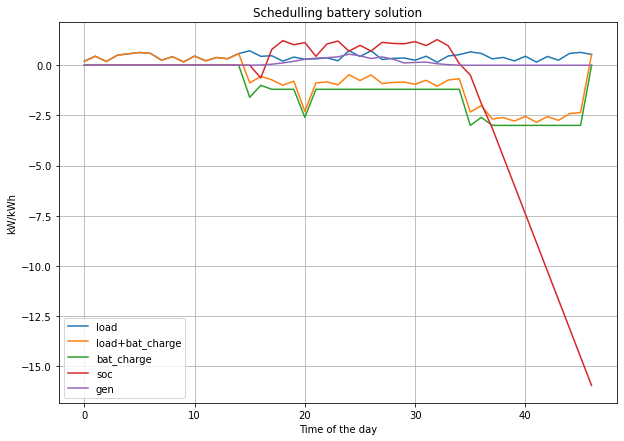

In [13]:
flex.makeplot(48,state_track[:,3],action_track,env.data[:,0],env.data[:,1],env) # O Tempo e o Env não estão a fazer nada
# makeplot(T,soc,sol,gen,load,env): Tempo, SOC, Bat_Charge, Generation, load, env

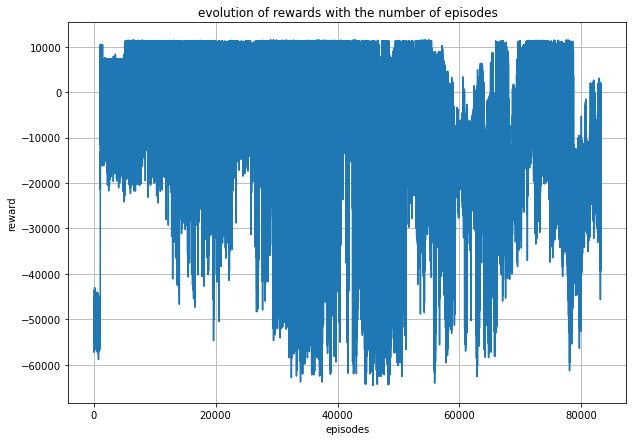

In [14]:
flex.reward_plot(env.R_Total)

In [15]:
evaluate_policy(model,env, n_eval_episodes=10)

/home/acr/anaconda3/lib/python3.9/site-packages/stable_baselines3/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


-12828.6
-12828.6
-12828.6
-12828.6
-12828.6
-12828.6
-12828.6
-12828.6
-12828.6
-12828.6


(-12828.599805042148, 0.0)

# Studying the battery

In [16]:
SOC = state_track[:,3]
bat_charge = action_track # Bat_charge
gen = env.data[:,0]
load = env.data[:,1]

In [17]:
state_track

array([[ 0.0000000e+00,  0.0000000e+00,  1.9800000e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00],
       [ 1.0000000e+00,  0.0000000e+00,  4.4999999e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  6.7750000e+02,  0.0000000e+00,
         6.7750000e+02],
       [ 2.0000000e+00,  0.0000000e+00,  1.8600000e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  1.5682000e+03,  0.0000000e+00,
         8.9070001e+02],
       [ 3.0000000e+00,  0.0000000e+00,  5.0400001e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  2.2430000e+03,  0.0000000e+00,
         6.7479999e+02],
       [ 4.0000000e+00,  0.0000000e+00,  5.6999999e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  2.9145000e+03,  0.0000000e+00,
         6.7150000e+02],
       [ 5.0000000e+00,  0.0000000e+00,  6.3599998e-01,  0.0000000e+00,
         0.0000000e+00,  1.7000000e-01,  3.5827000e+03,  0.0000000e+00,
         6.

In [18]:
def myplot(x):
    plt.figure(figsize=(10,6))
    plt.plot(x)

In [19]:
env.data

array([[0.0, 0.198],
       [0.0, 0.44999999999999996],
       [0.0, 0.186],
       [0.0, 0.504],
       [0.0, 0.5700000000000001],
       [0.0, 0.636],
       [0.0, 0.5940000000000001],
       [0.0, 0.252],
       [0.0, 0.42599999999999993],
       [0.0, 0.168],
       [0.0, 0.45599999999999996],
       [0.0, 0.22199999999999998],
       [0.0, 0.384],
       [0.0, 0.324],
       [0.0, 0.5820000000000001],
       [0.0, 0.72],
       [0.012, 0.44399999999999995],
       [0.05, 0.474],
       [0.115, 0.20400000000000001],
       [0.1975, 0.40800000000000003],
       [0.298, 0.30000000000000004],
       [0.3535, 0.318],
       [0.379, 0.372],
       [0.419, 0.22199999999999998],
       [0.551, 0.726],
       [0.4715, 0.43799999999999994],
       [0.3345, 0.72],
       [0.4165, 0.28800000000000003],
       [0.3045, 0.342],
       [0.1135, 0.36],
       [0.141, 0.252],
       [0.1525, 0.44999999999999996],
       [0.076, 0.15000000000000002],
       [0.029, 0.46199999999999997],
       [0.0

Text(0, 0.5, 'gen')

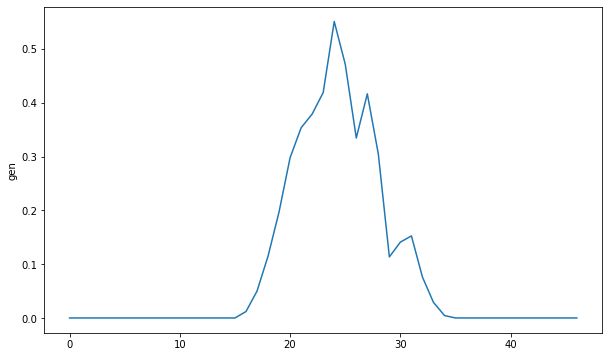

In [20]:
myplot(gen)
plt.ylabel('gen')

In [21]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

Text(0, 0.5, 'load')

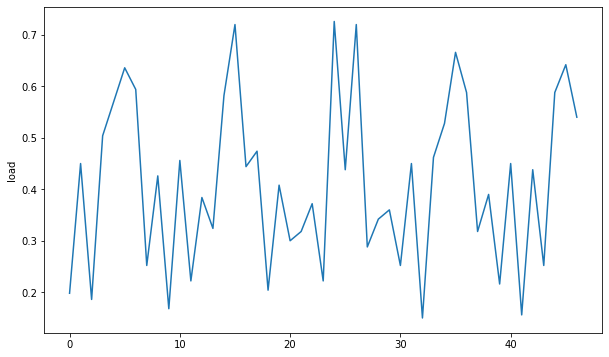

In [22]:
myplot(load)
plt.ylabel('load')

Text(0, 0.5, 'SOC')

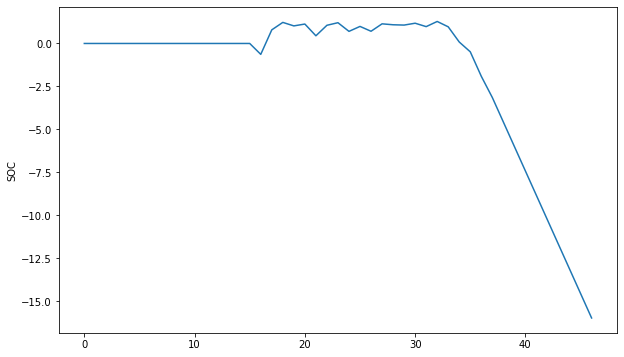

In [23]:
myplot(SOC)
plt.ylabel('SOC')

Text(0, 0.5, 'Battery Charge')

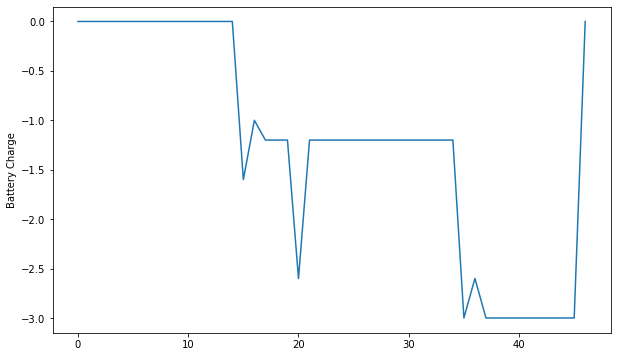

In [24]:
myplot(bat_charge)
plt.ylabel('Battery Charge')

Text(0, 0.5, 'Rewards track')

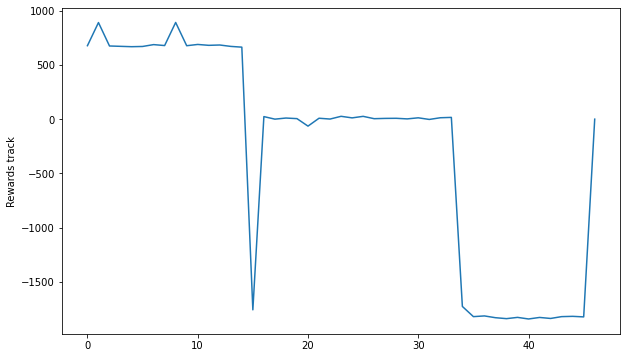

In [25]:
myplot(rewards_track)
plt.ylabel('Rewards track')

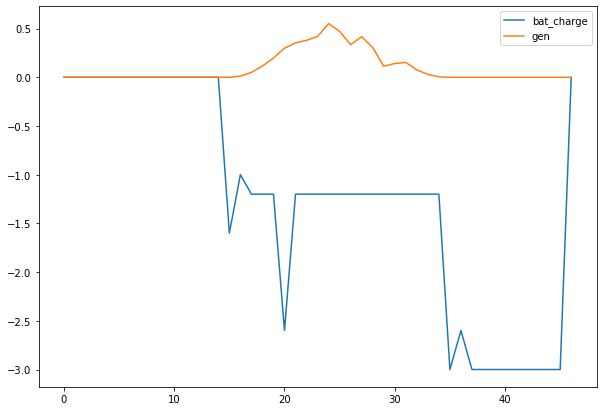

In [26]:
plt.figure(figsize=(10,7))
plt.legend
plt.plot(bat_charge,label='bat_charge')
plt.plot(gen,label='gen')
plt.legend()
plt.show()

In [27]:
eta = 0.95
dh=30*(1/60)

In [28]:
SOC

array([  0.     ,   0.     ,   0.     ,   0.     ,   0.     ,   0.     ,
         0.     ,   0.     ,   0.     ,   0.     ,   0.     ,   0.     ,
         0.     ,   0.     ,   0.     ,   0.     ,  -0.634  ,   0.792  ,
         1.226  ,   1.022  ,   1.13   ,   0.447  ,   1.058  ,   1.208  ,
         0.704  ,   0.992  ,   0.71   ,   1.142  ,   1.088  ,   1.07   ,
         1.178  ,   0.98   ,   1.28   ,   0.968  ,   0.08375,  -0.48625,
        -1.91125,  -3.14625,  -4.57125,  -5.99625,  -7.42125,  -8.84625,
       -10.27125, -11.69625, -13.12125, -14.54625, -15.97125],
      dtype=float32)

In [29]:
gen

array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.012, 0.05, 0.115, 0.1975, 0.298, 0.3535, 0.379,
       0.419, 0.551, 0.4715, 0.3345, 0.4165, 0.3045, 0.1135, 0.141,
       0.1525, 0.076, 0.029, 0.0045, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 0.0, 0.0], dtype=object)

In [30]:
C=np.array(bat_charge)*eta*dh
Sum=[]
Sumi = 0
for i in range(len(np.array(bat_charge)*eta*dh)):
    Sumi+= C[i]
    Sum.append(Sumi)
Sum

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.7599999999999999,
 -1.2349999999999999,
 -1.8049999999999997,
 -2.3749999999999996,
 -2.9449999999999994,
 -4.18,
 -4.75,
 -5.32,
 -5.890000000000001,
 -6.460000000000001,
 -7.030000000000001,
 -7.600000000000001,
 -8.170000000000002,
 -8.740000000000002,
 -9.310000000000002,
 -9.880000000000003,
 -10.450000000000003,
 -11.020000000000003,
 -11.590000000000003,
 -12.160000000000004,
 -13.585000000000004,
 -14.820000000000004,
 -16.245000000000005,
 -17.670000000000005,
 -19.095000000000006,
 -20.520000000000007,
 -21.945000000000007,
 -23.370000000000008,
 -24.79500000000001,
 -26.22000000000001,
 -27.64500000000001,
 -27.64500000000001]